In [1]:
import numpy as np
import pandas as pd

from sklearn.utils import resample
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer

from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier

from sklearn.metrics import roc_auc_score, average_precision_score
from sklearn.metrics import precision_score, recall_score
from sklearn.metrics import f1_score, accuracy_score, confusion_matrix

from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier

import seaborn as sns
from matplotlib import pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.max_columns', 200)

## Описание данных

* https://www.kaggle.com/datasets/chirag9073/europe-economic-crisis
* https://www.hbs.edu/behavioral-finance-and-financial-stability/data/Pages/global.aspx

Context

This data presented is collected over many years by Carmen Reinhart (with her coauthors Ken Rogoff, Christoph Trebesch, and Vincent Reinhart). These include Banking Crisis dates for more than 21 European countries from 1800-2016, exchange rate crises, stock market crises, sovereign debt growth and default, and many other data series.

Content

The dataset specifically focuses on the Banking, Debt, Financial, Inflation, and Systemic Crises that occurred, from 1800 to 2016, in 13 European countries, including: Austria, Belgium, Denmark, Finland, France, Germany, Greece, Hungary, Iceland, Ireland, Italy, Netherlands, Norway, Poland, Portugal, Romania, Russia, Spain, Sweden, Switzerland, United Kingdom.

Acknowledgements

Reinhart, C., Rogoff, K., Trebesch, C. and Reinhart, V. (2019) Global Crises Data by Country.
[online] https://www.hbs.edu/behavioral-finance-and-financial-stability/data. Available at: https://www.hbs.edu/behavioral-finance-and-financial-stability/data/Pages/global.aspx [Accessed: 1 September 2020].

Inspiration

Study about the economic factors in European Countries. Carry out various experimental results which can significantly improve the generalization performance for systemic crises using historical financial data of European countries over the past 200 years.

* **CC3** - код страны.

* **Country** - название страны.

* **Year** - год, за который представлено наблюдения.

* **Banking Crisis** - "0" означает, что в этом году не было банковского кризиса, а "1", что в этом году произошел банковский кризис. Банковский кризис часто связан с финансовым кризисом. Его соотносят с паникой или набегами на банки, во время которых инвесторы продают активы или снимают деньги со сберегательных счетов, так как опасаются, что стоимость этих активов упадет, если они останутся в финансовом учреждении.

* **Systemic Crisis** - "0" означает, что системного кризиса в этот год не было, а "1", что в этом году произошел системный кризис. Системный кризис представляет собой эффект домино, при котором финансовые проблемы распространяются между институтами и рынками, пока не затронут всю валютно-финансовую систему с ужасными глобальными экономическими последствиями.

* **exch_usd** - обменный курс страны по отношению к доллару США.

* **National Currency** - национальная валюта.

* **exch_sources** - основной источник информации.

* **Domestic Debt** - «0» означает, что в этом году не было дефолта по суверенному внутреннему долгу, а «1», что в этом году произошел дефолт по суверенному внутреннему долгу. Внутренний долг по дефолту: внутренний долг является долгом центрального правительства. Это долг, выпущенный кредиторами в стране (например, финансовые учреждения в стране).

* **Sovereign External debt1** - «0» означает, что в этом году не было дефолта по суверенному внешнему долгу, а «1», что в этом году произошел дефолт по суверенному внешнему долгу. Не включает дефолты по долгу США и Великобритании после Первой мировой войны, а также дефолты официальных внешних кредиторов после 1975 года. Внешний долг — это часть долга страны, которая была заимствована у иностранных кредиторов, включая коммерческие банки, правительства или международные финансовые учреждения. Эти ссуды, включая проценты, обычно должны выплачиваться в валюте, в которой ссуда была предоставлена. Чтобы заработать необходимую валюту, страна-заемщик может продавать и экспортировать товары в страну-кредитора.

* **Sovereign External debt2** - «0» означает, что в этом году не было дефолта по суверенному внешнему долгу, а «1», что в этом году произошел дефолт по суверенному внешнему долгу. Не включает дефолты по долгу США и Великобритании после Первой мировой войны, но включает дефолты официальных внешних кредиторов после 1975 года.

* **GDP_Weighted_default** - общий долг в случае дефолта по отношению к ВВП.

* **Inflation** - годовой уровень инфляции индекса потребительских цен.

* **Independence** - "0" означает "отсутствие независимости", а "1" означает "независимость".

* **Currency Crises** - "0" означает, что в этом году не было валютного кризиса, а "1", что в этом году произошел валютный кризис. Валютный кризис — это ситуация, при которой существуют серьезные сомнения в том, что центральный банк страны имеет достаточные валютные резервы для поддержания фиксированного обменного курса страны. Кризис часто сопровождается спекулятивной атакой на валютном рынке. Валютный кризис возникает в результате хронического дефицита платежного баланса и поэтому также называется кризисом платежного баланса. Часто такой кризис завершается девальвацией валюты.

* **Inflation Crises** - "0" означает, что в этом году не было инфляционного кризиса, а "1", что в этом году был инфляционный кризис. Инфляционный кризис: инфляция является количественной мерой скорости, с которой средний уровень цен на корзину отдельных товаров и услуг в экономике увеличивается за определенный период времени. Это постоянное повышение общего уровня цен, когда на единицу валюты можно купить меньше, чем в предыдущие периоды.

В качестве целевой переменной мы будем предсказывать возникновение банковского кризиса (**Banking Crisis**).

## Подготовка данных

In [2]:
data = (
    pd.read_csv('Europe_crisis.csv')
    .drop(columns=['Unnamed: 0'])
    .rename(columns={'Banking Crisis ': 'Banking Crisis'})
)

In [3]:
data['Sovereign External debt1'] = (
    data['Sovereign External debt1']
    .replace("Hyperinflation-the highest recorded (until possibly Zimbabwe's 2008-2009). See Sargent (1982).", 1)
    .astype('float')
)
data['Inflation'] = data['Inflation'].replace(r'^\s*$', np.nan, regex=True).astype('float')
data['exch_usd'] = data['exch_usd'].replace(r'^\s*$', np.nan, regex=True).astype('float')
data['Currency Crises'] = data['Currency Crises'].replace(2, 1)

In [4]:
data.head()

,CC3,Country,Year,Banking Crisis,Systemic Crisis,exch_usd,National Currency,exch_sources,Domestic Debt,Sovereign External debt1,Sovereign External debt2,GDP_Weighted_default,Inflation,Independence,Currency Crises,Inflation Crises
0,AUT,Austria,1800.0,0.0,0.0,NaN,"1748-1892-Gulden, 1892-1923-Krone,1923-1998 sc...",Primary source isGFD-RR_IFS official eop; alt1...,0.0,0.0,0.0,0.00,14.646465,1,1,0.0
1,AUT,Austria,1801.0,0.0,0.0,NaN,"1748-1892-Gulden, 1892-1923-Krone,1923-1998 sc...",Primary source isGFD-RR_IFS official eop; alt1...,0.0,0.0,0.0,0.00,29.240813,1,1,1.0
2,AUT,Austria,1802.0,0.0,0.0,NaN,"1748-1892-Gulden, 1892-1923-Krone,1923-1998 sc...",Primary source isGFD-RR_IFS official eop; alt1...,0.0,1.0,1.0,0.86,11.554948,1,0,0.0
3,AUT,Austria,1803.0,0.0,0.0,NaN,"1748-1892-Gulden, 1892-1923-Krone,1923-1998 sc...",Primary source isGFD-RR_IFS official eop; alt1...,0.0,1.0,1.0,0.86,12.448675,1,0,0.0
4,AUT,Austria,1804.0,0.0,0.0,NaN,"1748-1892-Gulden, 1892-1923-Krone,1923-1998 sc...",Primary source isGFD-RR_IFS official eop; alt1...,0.0,1.0,1.0,0.86,-3.399989,1,1,0.0


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4557 entries, 0 to 4556
Data columns (total 16 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CC3                       4557 non-null   object 
 1   Country                   4557 non-null   object 
 2   Year                      4557 non-null   float64
 3   Banking Crisis            4081 non-null   float64
 4   Systemic Crisis           4545 non-null   float64
 5   exch_usd                  3725 non-null   float64
 6   National Currency         4122 non-null   object 
 7   exch_sources              4556 non-null   object 
 8   Domestic Debt             3896 non-null   float64
 9   Sovereign External debt1  3905 non-null   float64
 10  Sovereign External debt2  3905 non-null   float64
 11  GDP_Weighted_default      3903 non-null   float64
 12  Inflation                 3579 non-null   float64
 13  Independence              4557 non-null   int64  
 14  Currency

In [6]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Year,4557.0,1.908000e+03,6.264871e+01,1800.000000,1854.000000,1908.000000,1962.000000,2.016000e+03
Banking Crisis,4081.0,8.061750e-02,2.722802e-01,0.000000,0.000000,0.000000,0.000000,1.000000e+00
Systemic Crisis,4545.0,4.950495e-02,2.169437e-01,0.000000,0.000000,0.000000,0.000000,1.000000e+00
exch_usd,3725.0,1.201060e+05,7.218614e+06,0.000000,0.679302,1.879683,5.231200,4.405286e+08
Domestic Debt,3896.0,3.439425e-02,1.822630e-01,0.000000,0.000000,0.000000,0.000000,1.000000e+00
Sovereign External debt1,3905.0,1.080666e-01,3.105042e-01,0.000000,0.000000,0.000000,0.000000,1.000000e+00
Sovereign External debt2,3905.0,1.088348e-01,3.114718e-01,0.000000,0.000000,0.000000,0.000000,1.000000e+00
GDP_Weighted_default,3903.0,3.072611e-01,1.423763e+00,0.000000,0.000000,0.000000,0.000000,8.680000e+00
Inflation,3579.0,2.691975e+23,1.610467e+25,-84.597236,-0.765218,2.335000,6.954922,9.634577e+26
Independence,4557.0,8.435374e-01,3.633332e-01,0.000000,1.000000,1.000000,1.000000,1.000000e+00


In [7]:
data.isna().sum()

CC3                           0
Country                       0
Year                          0
Banking Crisis              476
Systemic Crisis              12
exch_usd                    832
National Currency           435
exch_sources                  1
Domestic Debt               661
Sovereign External debt1    652
Sovereign External debt2    652
GDP_Weighted_default        654
Inflation                   978
Independence                  0
Currency Crises               0
Inflation Crises            362
dtype: int64

In [8]:
data.shape, data.dropna().shape

((4557, 16), (2752, 16))

## Визуализация данных

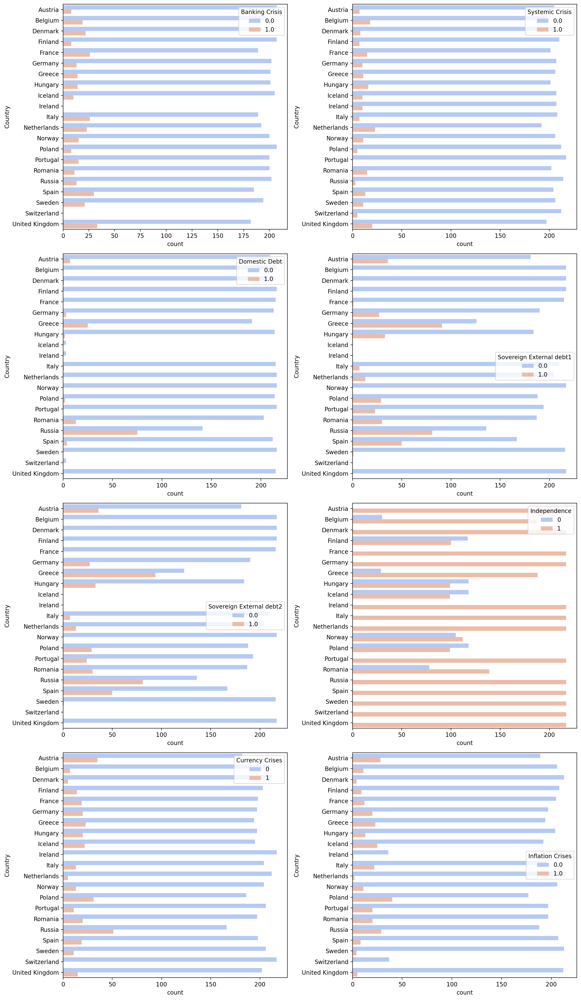

In [9]:
cols = ['Banking Crisis', 'Systemic Crisis', 'Domestic Debt',
        'Sovereign External debt1', 'Sovereign External debt2',
        'Independence', 'Currency Crises', 'Inflation Crises']

plt.style.use('default')

fig, axes = plt.subplots(ncols=2, nrows=4, figsize=(14, 24), dpi=200)
axes = axes.flatten()

for i, ax in zip(cols, axes):
    sns.countplot(y='Country', ax=ax, data=data, hue=i, palette='coolwarm')

plt.tight_layout()
plt.savefig('analysis_1.png')

Связь между годом и независимостью:

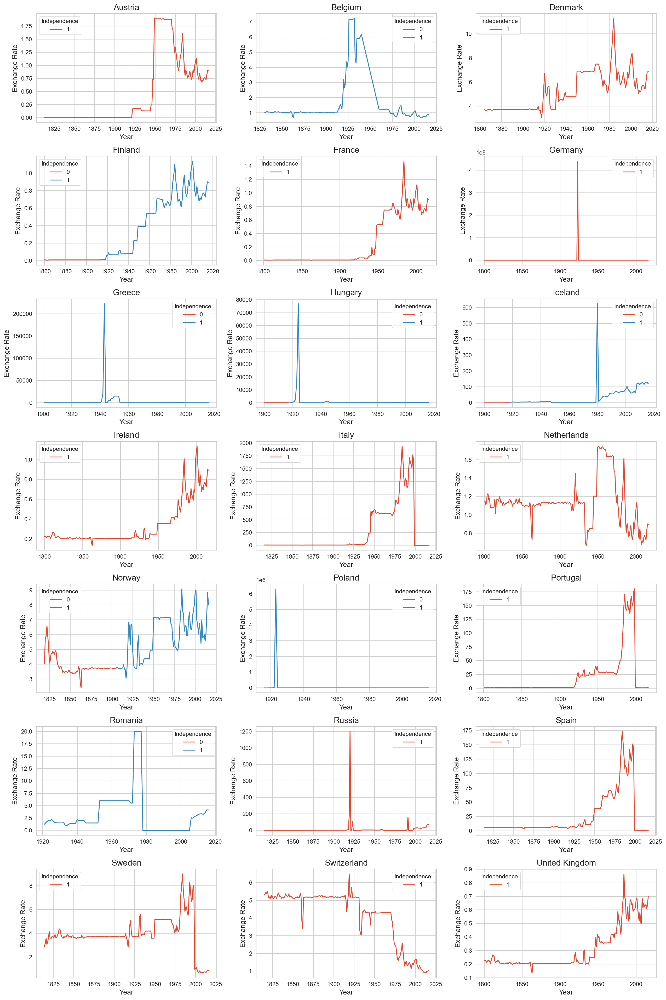

In [10]:
plt.style.use('ggplot')
sns.set_style('whitegrid')

fig, axes = plt.subplots(ncols=3, nrows=7, figsize=(16, 24), dpi=160)
axes = axes.flatten()

for i, ax in zip(data['Country'].unique(), axes):
    sns.lineplot(x='Year', y='exch_usd', hue='Independence', data=data[data['Country'] == i], ax=ax)
    ax.set_xlabel('Year')
    ax.set_ylabel('Exchange Rate')
    ax.set_title('{}'.format(i))

plt.tight_layout()
plt.savefig('analysis_2.png')

Связь между уровнем инфляции и инфляционным кризисом:

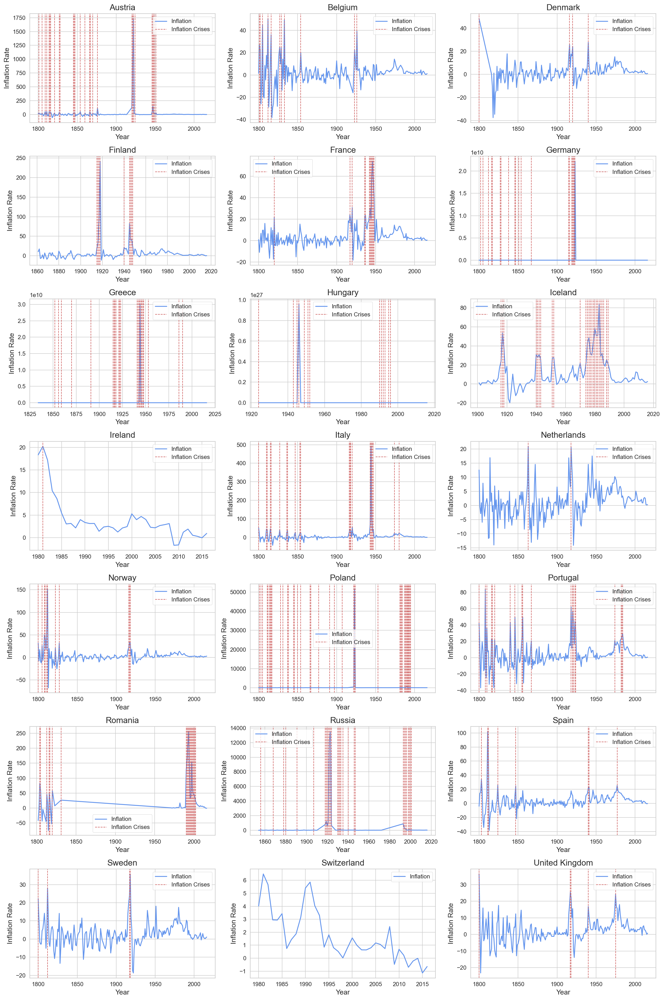

In [11]:
plt.style.use('ggplot')
sns.set_style('whitegrid')

fig, axes = plt.subplots(ncols=3, nrows=7, figsize=(16, 24), dpi=160)
axes = axes.flatten()

for i, ax in zip(data['Country'].unique(), axes):
    sns.lineplot(x='Year', y='Inflation', data=data[data['Country'] == i], ax=ax, color='cornflowerblue')
    ax.set_xlabel('Year')
    ax.set_ylabel('Inflation Rate')
    ax.set_title('{}'.format(i))

    for year in data[(data['Country'] == i) & (data['Inflation Crises'] == 1)]['Year'].unique():
        ax.axvline(x=year, color='indianred', linestyle='--', linewidth=.9)
        
    ax.legend(['Inflation', 'Inflation Crises'], loc='best')

plt.tight_layout()
plt.savefig('analysis_3.png')

Связь между уровнем инфляции и банковским кризисом:

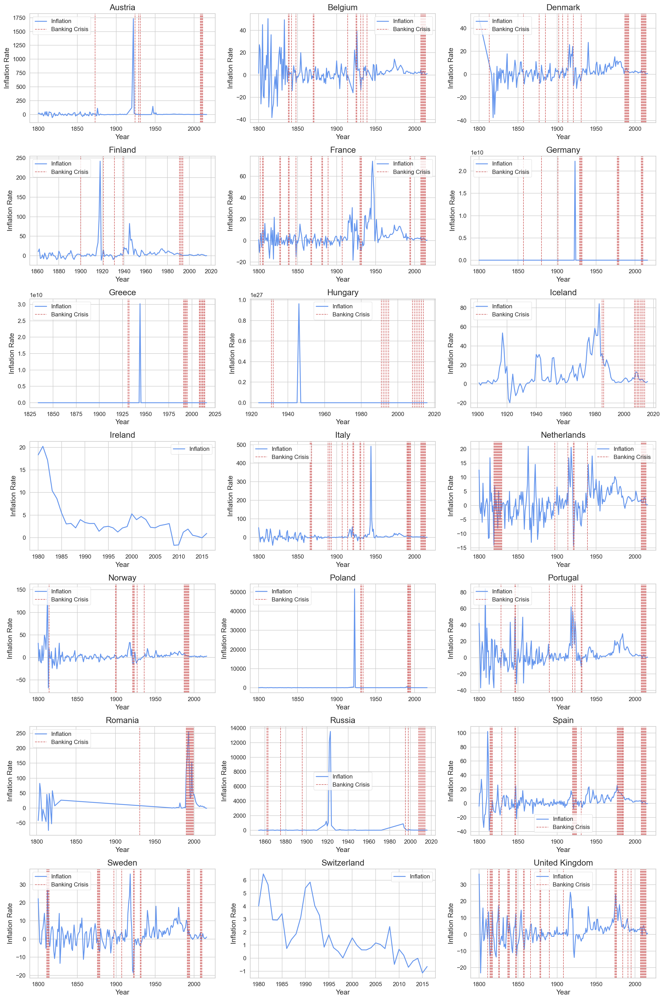

In [12]:
plt.style.use('ggplot')
sns.set_style('whitegrid')

fig, axes = plt.subplots(ncols=3, nrows=7, figsize=(16, 24), dpi=160)
axes = axes.flatten()

for i, ax in zip(data['Country'].unique(), axes):
    sns.lineplot(x='Year', y='Inflation', data=data[data['Country'] == i], ax=ax, color='cornflowerblue')
    ax.set_xlabel('Year')
    ax.set_ylabel('Inflation Rate')
    ax.set_title('{}'.format(i))

    for year in data[(data['Country'] == i) & (data['Banking Crisis'] == 1)]['Year'].unique():
        ax.axvline(x=year, color='indianred', linestyle='--', linewidth=.9)
        
    ax.legend(['Inflation', 'Banking Crisis'], loc='best')

plt.tight_layout()
plt.savefig('analysis_4.png')

Связь между обменным курсом и валютным кризисом:

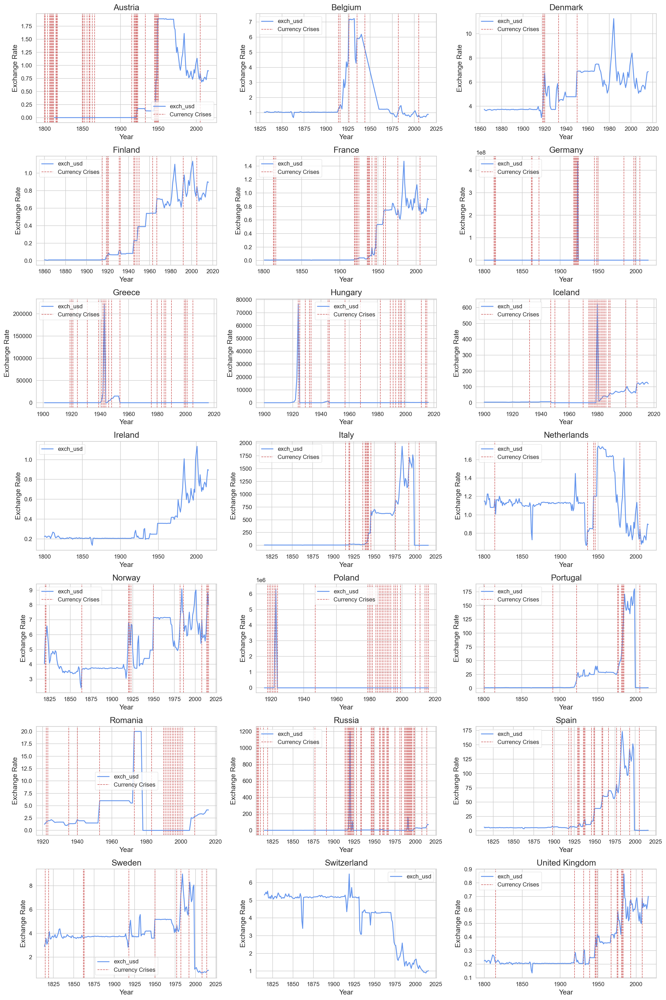

In [13]:
plt.style.use('ggplot')
sns.set_style('whitegrid')

fig, axes = plt.subplots(ncols=3, nrows=7, figsize=(16, 24), dpi=160)
axes = axes.flatten()

for i, ax in zip(data['Country'].unique(), axes):
    sns.lineplot(x='Year', y='exch_usd', data=data[data['Country'] == i], ax=ax, color='cornflowerblue')
    ax.set_xlabel('Year')
    ax.set_ylabel('Exchange Rate')
    ax.set_title('{}'.format(i))

    for year in data[(data['Country'] == i) & (data['Currency Crises'] == 1)]['Year'].unique():
        ax.axvline(x=year, color='indianred', linestyle='--', linewidth=.9)
        
    ax.legend(['exch_usd', 'Currency Crises'], loc='best')

plt.tight_layout()
plt.savefig('analysis_5.png')

Связь между обменным курсом и банковским кризисом:

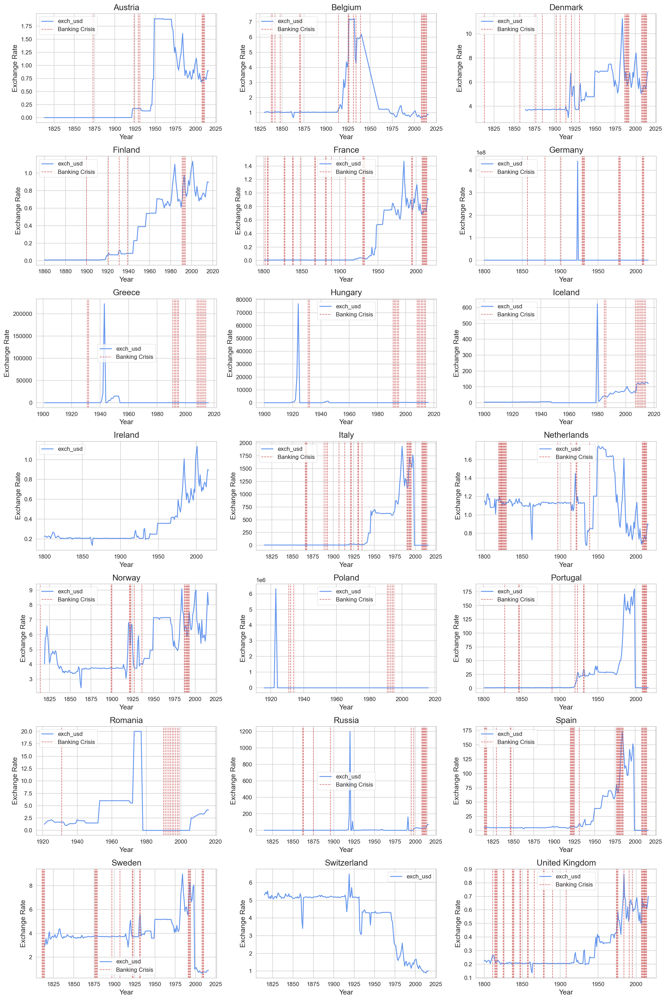

In [14]:
plt.style.use('ggplot')
sns.set_style('whitegrid')

fig, axes = plt.subplots(ncols=3, nrows=7, figsize=(16, 24), dpi=160)
axes = axes.flatten()

for i, ax in zip(data['Country'].unique(), axes):
    sns.lineplot(x='Year', y='exch_usd', data=data[data['Country'] == i], ax=ax, color='cornflowerblue')
    ax.set_xlabel('Year')
    ax.set_ylabel('Exchange Rate')
    ax.set_title('{}'.format(i))

    for year in data[(data['Country'] == i) & (data['Banking Crisis'] == 1)]['Year'].unique():
        ax.axvline(x=year, color='indianred', linestyle='--', linewidth=.9)
        
    ax.legend(['exch_usd', 'Banking Crisis'], loc='best')

plt.tight_layout()
plt.savefig('analysis_6.png')

## Отбор признаков

Корреляция признаков:

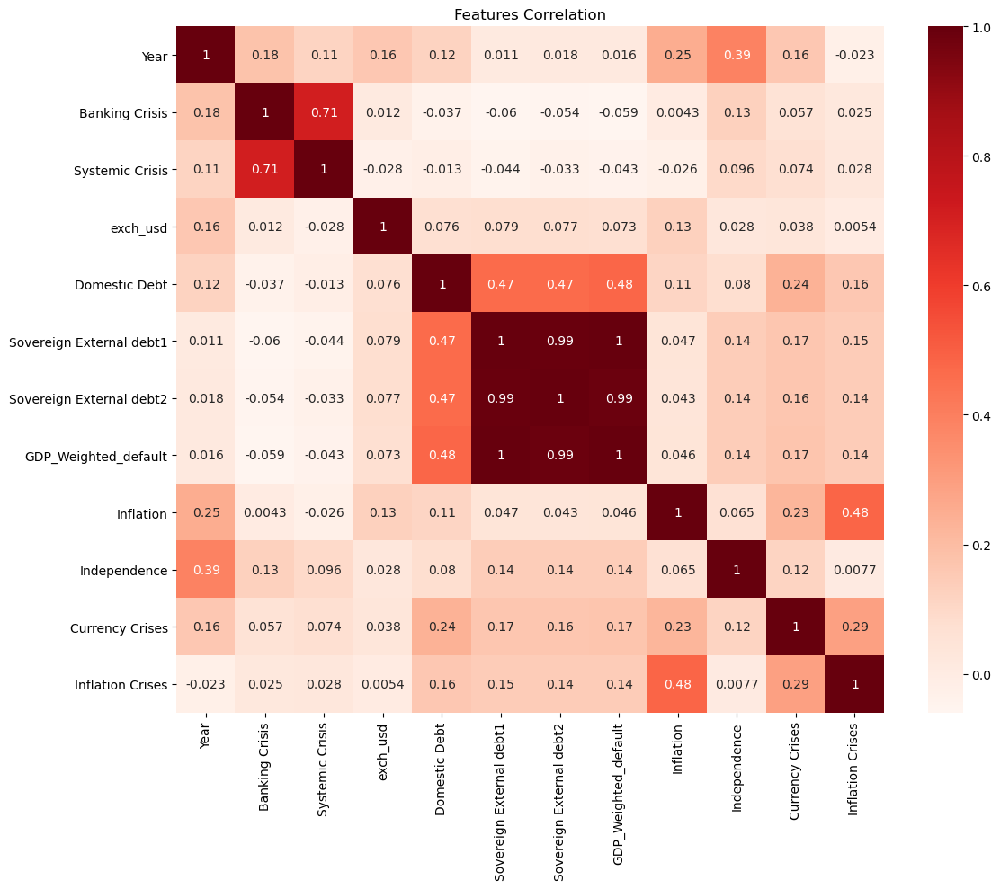

In [15]:
plt.style.use('default')

plt.figure(figsize=(12, 10))
sns.heatmap(
    data.corr(method='spearman'),
    annot=True,
    cmap=plt.cm.Reds
)
plt.title('Features Correlation')
plt.tight_layout()
plt.savefig('analysis_7.png')

Очень сильная положительная корреляция у банковского кризиса наблюдается для системного кризиса. Посмотрим на их возникновение поподробнее.

Связь между банковским и системным кризисами:

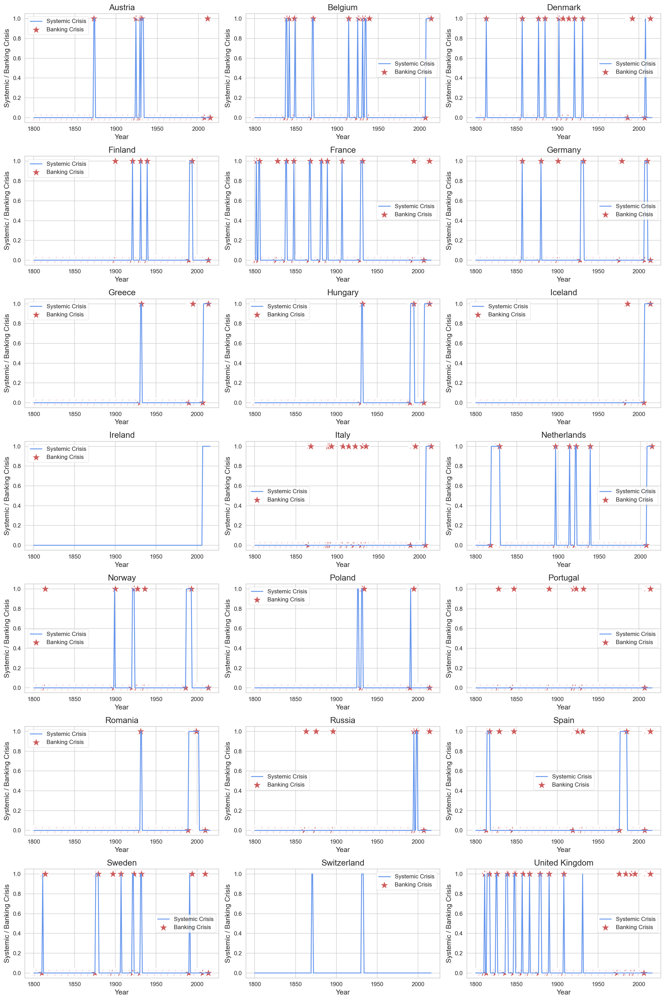

In [16]:
plt.style.use('ggplot')
sns.set_style('whitegrid')

fig, axes = plt.subplots(ncols=3, nrows=7, figsize=(16, 24), dpi=160)
axes = axes.flatten()

for i, ax in zip(data['Country'].unique(), axes):
    sns.lineplot(x='Year', y='Systemic Crisis', data=data[data['Country'] == i], ax=ax, color='cornflowerblue')
    sns.scatterplot(x='Year', y='Banking Crisis', data=data[data['Country'] == i], ax=ax, color='indianred',  marker='*', s=300)
    ax.set_xlabel('Year')
    ax.set_ylabel('Systemic / Banking Crisis')
    ax.set_title('{}'.format(i))
    ax.legend(['Systemic Crisis', 'Banking Crisis'], loc='best')

plt.tight_layout()
plt.savefig('analysis_8.png')

Графики показывают, что оба кризиса обычно пересекаются. Отсюда можно сделать вывод, что системный кризис оказывает влияние на банковский и наоборот.

Таким образом, в итоговый набор переменных попадут все, за исключением системного кризиса и категориальных признаков.

In [17]:
data_cleaned = (
    data
    .drop(columns=['CC3', 'Country', 'National Currency', 'exch_sources', 'Systemic Crisis'])
    .dropna()
    .reset_index(drop=True)
    .copy()
)

data.shape, data_cleaned.shape

((4557, 16), (2970, 11))

Разбиваем выборку на обучающую и тестовую

In [18]:
X = data_cleaned.drop(columns='Banking Crisis')
y = data_cleaned['Banking Crisis']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=54, shuffle=True)

## Перебалансировка классов

Проверим, сбалансирована ли целевая переменная

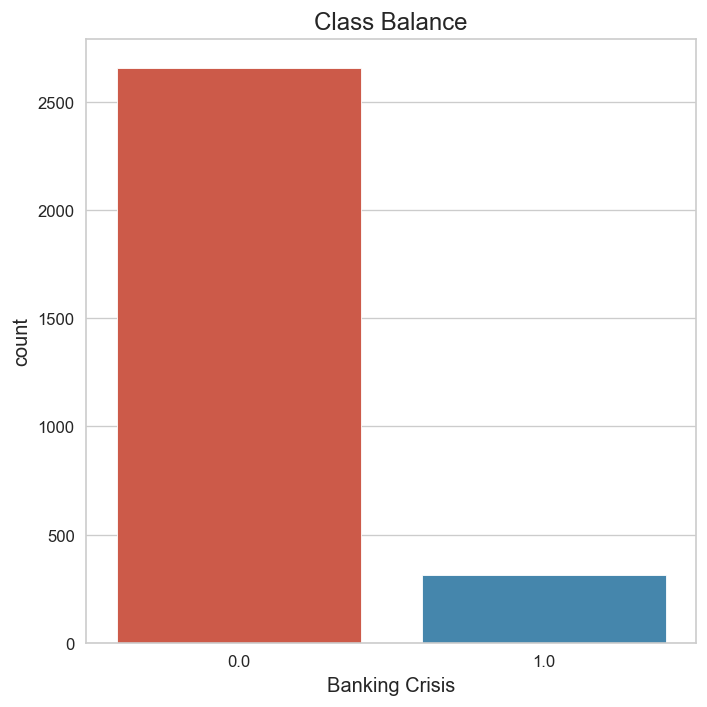

In [19]:
plt.style.use('ggplot')
sns.set_style('whitegrid')

plt.figure(figsize=(6, 6), dpi=120)
sns.countplot(x='Banking Crisis', data=data_cleaned)
plt.title('Class Balance')
plt.tight_layout()
plt.savefig('analysis_9.png')

Как видим, данные очень несбалансированы и классификая может оказаться чересчур смещенной, поэтому сделаем перебалансировку

In [20]:
data_train = pd.concat([X_train, y_train], axis=1).reset_index(drop=True)
data_test = pd.concat([X_test, y_test], axis=1).reset_index(drop=True)

In [21]:
df_0 = data_train[data_train['Banking Crisis'] == 0]
df_1 = data_train[data_train['Banking Crisis'] == 1]

df_1_upsampled = resample(
    df_1,
    n_samples=df_0.shape[0],
    replace=True,
    random_state=54
)

data_train_upsampled = pd.concat([df_0, df_1_upsampled]).reset_index(drop=True)
data_train_upsampled['Banking Crisis'].value_counts()

0.0    2392
1.0    2392
Name: Banking Crisis, dtype: int64

In [22]:
df_0 = data_test[data_test['Banking Crisis'] == 0]
df_1 = data_test[data_test['Banking Crisis'] == 1]

df_1_upsampled = resample(
    df_1,
    n_samples=df_0.shape[0],
    replace=True,
    random_state=54
)

data_test_upsampled = pd.concat([df_0, df_1_upsampled]).reset_index(drop=True)
data_test_upsampled['Banking Crisis'].value_counts()

0.0    266
1.0    266
Name: Banking Crisis, dtype: int64

In [23]:
X_train = data_train_upsampled.drop(columns='Banking Crisis')
y_train = data_train_upsampled['Banking Crisis']

X_test = data_test_upsampled.drop(columns='Banking Crisis')
y_test = data_test_upsampled['Banking Crisis']

## Построение моделей

Обучим модели и запишем результаты предсказаний

In [24]:
results = pd.DataFrame(
    columns=['Model', 'Prediction Sample', 'AUC-ROC', 'AUC-PR', 'Accuracy', 'Precision', 'Recall', 'F1']
)

### Logistic Regression

In [25]:
%%time

model_name = 'LogisticRegression'

column_transformer = ColumnTransformer([
    ('scaling', StandardScaler(), X_train.columns)
], remainder='passthrough')

pipeline = Pipeline(steps=[
    ('scaling', column_transformer),
    ('classifier', LogisticRegression(random_state=54))
])

model = GridSearchCV(
    pipeline,
    [{
        'classifier__penalty': ['l1', 'l2'],
        'classifier__C': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
        'classifier__max_iter': [10, 50, 100, 200, 500],
        'classifier__solver' : ['lbfgs', 'liblinear']
    }]
)

model.fit(X_train, y_train)
model.best_params_

CPU times: user 52.7 s, sys: 10.9 s, total: 1min 3s
Wall time: 18.6 s


{'classifier__C': 0.01,
 'classifier__max_iter': 10,
 'classifier__penalty': 'l1',
 'classifier__solver': 'liblinear'}

In [26]:
result = pd.DataFrame(
    [
        [
            model_name,
            'Train',
            round(roc_auc_score(y_train, model.predict_proba(X_train)[:,1]), 5),
            round(average_precision_score(y_train, model.predict_proba(X_train)[:,1]), 5),
            round(accuracy_score(y_train, model.predict(X_train)), 5),
            round(precision_score(y_train, model.predict(X_train)), 5),
            round(recall_score(y_train, model.predict(X_train)), 5),
            round(f1_score(y_train, model.predict(X_train)), 5)
        ],
        [
            model_name,
            'Test',
            round(roc_auc_score(y_test, model.predict_proba(X_test)[:,1]), 5),
            round(average_precision_score(y_test, model.predict_proba(X_test)[:,1]), 5),
            round(accuracy_score(y_test, model.predict(X_test)), 5),
            round(precision_score(y_test, model.predict(X_test)), 5),
            round(recall_score(y_test, model.predict(X_test)), 5),
            round(f1_score(y_test, model.predict(X_test)), 5)
        ]
    ],
    columns=['Model', 'Prediction Sample', 'AUC-ROC', 'AUC-PR', 'Accuracy', 'Precision', 'Recall', 'F1']
)
result

,Model,Prediction Sample,AUC-ROC,AUC-PR,Accuracy,Precision,Recall,F1
0,LogisticRegression,Train,0.66730,0.69988,0.61371,0.59812,0.69314,0.64214
1,LogisticRegression,Test,0.65522,0.70756,0.55639,0.55639,0.55639,0.55639


In [27]:
results = results.append(result)

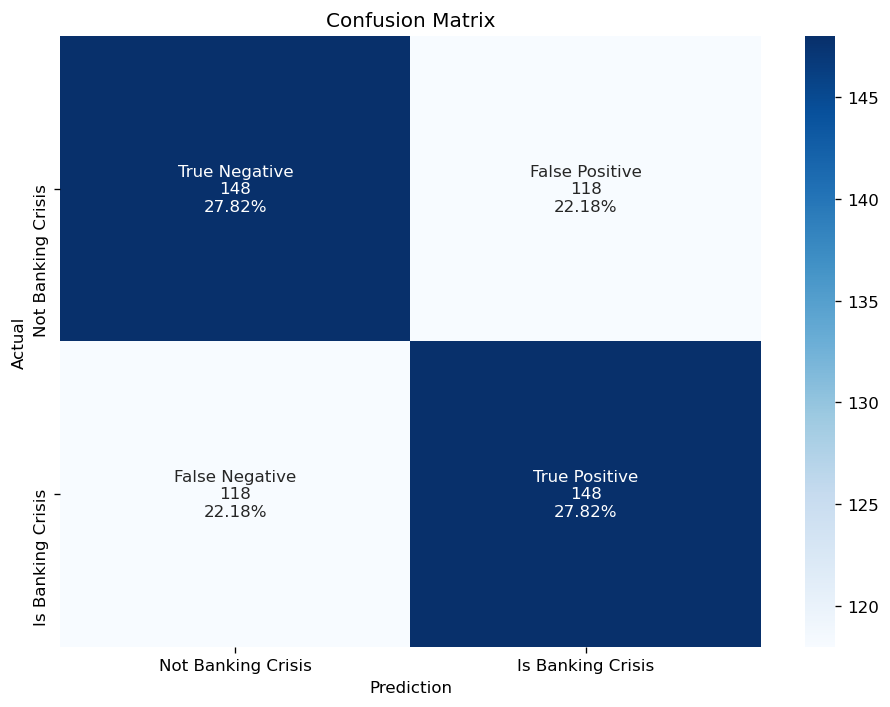

In [28]:
conf_matrix = confusion_matrix(y_test, model.predict(X_test))

group_names = ['True Negative', 'False Positive', 'False Negative', 'True Positive']
group_counts = ['{0:0.0f}'.format(value) for value in conf_matrix.flatten()]
group_percentages = ['{0:.2%}'.format(value) for value in conf_matrix.flatten() / np.sum(conf_matrix)]

labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(group_names, group_counts, group_percentages)]
labels = np.asarray(labels).reshape(2,2)

plt.style.use('default')

plt.figure(figsize=(8, 6), dpi=120)

sns.heatmap(
    conf_matrix,
    annot=labels,
    xticklabels=['Not Banking Crisis', 'Is Banking Crisis'],
    yticklabels=['Not Banking Crisis', 'Is Banking Crisis'],
    fmt='',
    cmap='Blues'
)

plt.xlabel('Prediction')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.tight_layout()
plt.savefig(f'model_{model_name}.png')

Для логистической регрессии мы также отобразили ее веса

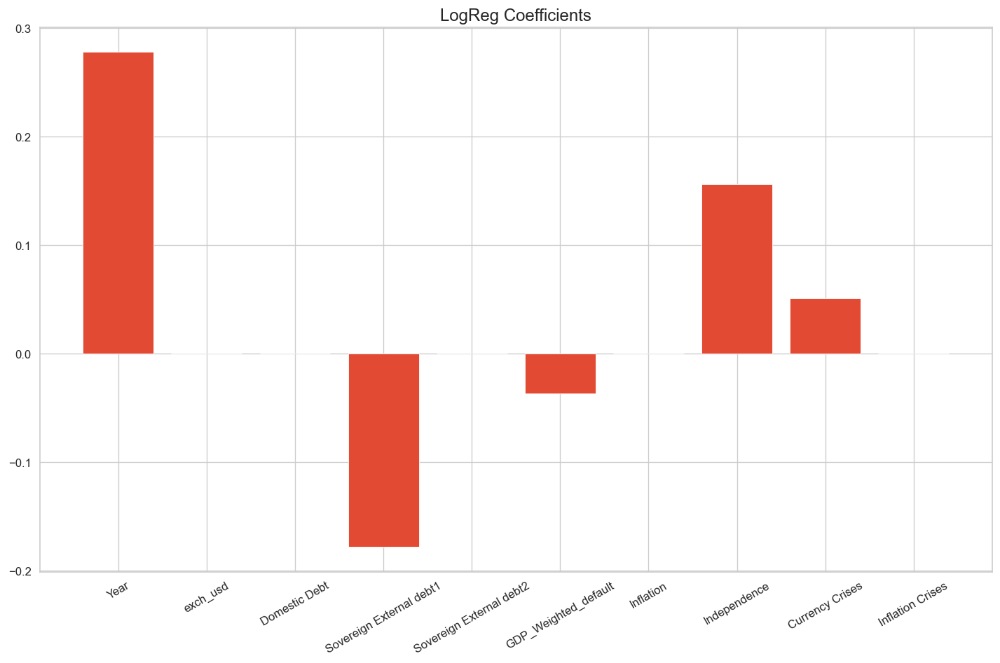

In [29]:
importance = model.best_estimator_.named_steps['classifier'].coef_[0]

plt.style.use('ggplot')
sns.set_style('whitegrid')

plt.figure(figsize=(12, 8), dpi=120)
plt.bar([x for x in X_train.columns], importance)
plt.title('LogReg Coefficients')
plt.xticks(rotation=30)
plt.tight_layout()
plt.savefig(f'model_{model_name}_coef.png')

### Support Vector Machine

In [30]:
%%time

model_name = 'SupportVectorMachine'

column_transformer = ColumnTransformer([
    ('scaling', StandardScaler(), X_train.columns)
], remainder='passthrough')

pipeline = Pipeline(steps=[
    ('scaling', column_transformer),
    ('classifier', SVC(random_state=54))
])

model = GridSearchCV(
    pipeline,
    [{
        'classifier__kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
        'classifier__C': [0.1, 1, 10, 50, 100]
    }]
)

model.fit(X_train, y_train)
model.best_params_

CPU times: user 2min 4s, sys: 262 ms, total: 2min 5s
Wall time: 2min 5s


{'classifier__C': 10, 'classifier__kernel': 'poly'}

In [31]:
result = pd.DataFrame(
    [
        [
            model_name,
            'Train',
            round(roc_auc_score(y_train, model.decision_function(X_train)), 5),
            round(average_precision_score(y_train, model.decision_function(X_train)), 5),
            round(accuracy_score(y_train, model.predict(X_train)), 5),
            round(precision_score(y_train, model.predict(X_train)), 5),
            round(recall_score(y_train, model.predict(X_train)), 5),
            round(f1_score(y_train, model.predict(X_train)), 5)
        ],
        [
            model_name,
            'Test',
            round(roc_auc_score(y_test, model.decision_function(X_test)), 5),
            round(average_precision_score(y_test, model.decision_function(X_test)), 5),
            round(accuracy_score(y_test, model.predict(X_test)), 5),
            round(precision_score(y_test, model.predict(X_test)), 5),
            round(recall_score(y_test, model.predict(X_test)), 5),
            round(f1_score(y_test, model.predict(X_test)), 5)
        ]
    ],
    columns=['Model', 'Prediction Sample', 'AUC-ROC', 'AUC-PR', 'Accuracy', 'Precision', 'Recall', 'F1']
)
result

,Model,Prediction Sample,AUC-ROC,AUC-PR,Accuracy,Precision,Recall,F1
0,SupportVectorMachine,Train,0.70830,0.73345,0.68520,0.70720,0.63211,0.66755
1,SupportVectorMachine,Test,0.68134,0.69446,0.68421,0.71304,0.61654,0.66129


In [32]:
results = results.append(result)

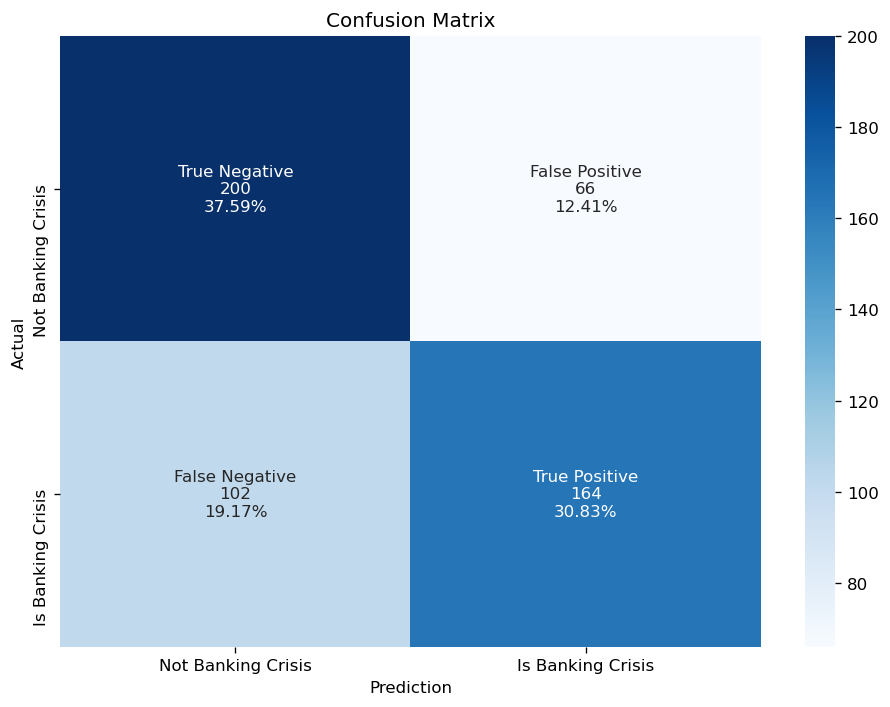

In [33]:
conf_matrix = confusion_matrix(y_test, model.predict(X_test))

group_names = ['True Negative', 'False Positive', 'False Negative', 'True Positive']
group_counts = ['{0:0.0f}'.format(value) for value in conf_matrix.flatten()]
group_percentages = ['{0:.2%}'.format(value) for value in conf_matrix.flatten() / np.sum(conf_matrix)]

labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(group_names, group_counts, group_percentages)]
labels = np.asarray(labels).reshape(2,2)

plt.style.use('default')

plt.figure(figsize=(8, 6), dpi=120)

sns.heatmap(
    conf_matrix,
    annot=labels,
    xticklabels=['Not Banking Crisis', 'Is Banking Crisis'],
    yticklabels=['Not Banking Crisis', 'Is Banking Crisis'],
    fmt='',
    cmap='Blues'
)

plt.xlabel('Prediction')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.tight_layout()
plt.savefig(f'model_{model_name}.png')

### Decision Tree

In [34]:
%%time

model_name = 'DecisionTree'

column_transformer = ColumnTransformer([
    ('scaling', StandardScaler(), X_train.columns)
], remainder='passthrough')

pipeline = Pipeline(steps=[
    ('scaling', column_transformer),
    ('classifier', DecisionTreeClassifier(random_state=54))
])

model = GridSearchCV(
    pipeline,
    [{
        'classifier__criterion': ['gini', 'entropy', 'log_loss'],
        'classifier__max_depth': [None, 5, 10, 20, 50, 100],
        'classifier__min_samples_split': [2, 5, 10],
        'classifier__min_samples_leaf': [1, 5, 10]
    }]
)

model.fit(X_train, y_train)
model.best_params_

CPU times: user 5.55 s, sys: 16.9 ms, total: 5.56 s
Wall time: 5.57 s


{'classifier__criterion': 'gini',
 'classifier__max_depth': None,
 'classifier__min_samples_leaf': 1,
 'classifier__min_samples_split': 5}

In [35]:
result = pd.DataFrame(
    [
        [
            model_name,
            'Train',
            round(roc_auc_score(y_train, model.predict_proba(X_train)[:,1]), 5),
            round(average_precision_score(y_train, model.predict_proba(X_train)[:,1]), 5),
            round(accuracy_score(y_train, model.predict(X_train)), 5),
            round(precision_score(y_train, model.predict(X_train)), 5),
            round(recall_score(y_train, model.predict(X_train)), 5),
            round(f1_score(y_train, model.predict(X_train)), 5)
        ],
        [
            model_name,
            'Test',
            round(roc_auc_score(y_test, model.predict_proba(X_test)[:,1]), 5),
            round(average_precision_score(y_test, model.predict_proba(X_test)[:,1]), 5),
            round(accuracy_score(y_test, model.predict(X_test)), 5),
            round(precision_score(y_test, model.predict(X_test)), 5),
            round(recall_score(y_test, model.predict(X_test)), 5),
            round(f1_score(y_test, model.predict(X_test)), 5)
        ]
    ],
    columns=['Model', 'Prediction Sample', 'AUC-ROC', 'AUC-PR', 'Accuracy', 'Precision', 'Recall', 'F1']
)
result

,Model,Prediction Sample,AUC-ROC,AUC-PR,Accuracy,Precision,Recall,F1
0,DecisionTree,Train,0.99051,0.98895,0.96279,0.93344,0.99666,0.96401
1,DecisionTree,Test,0.78014,0.74630,0.77444,0.85784,0.65789,0.74468


In [36]:
results = results.append(result)

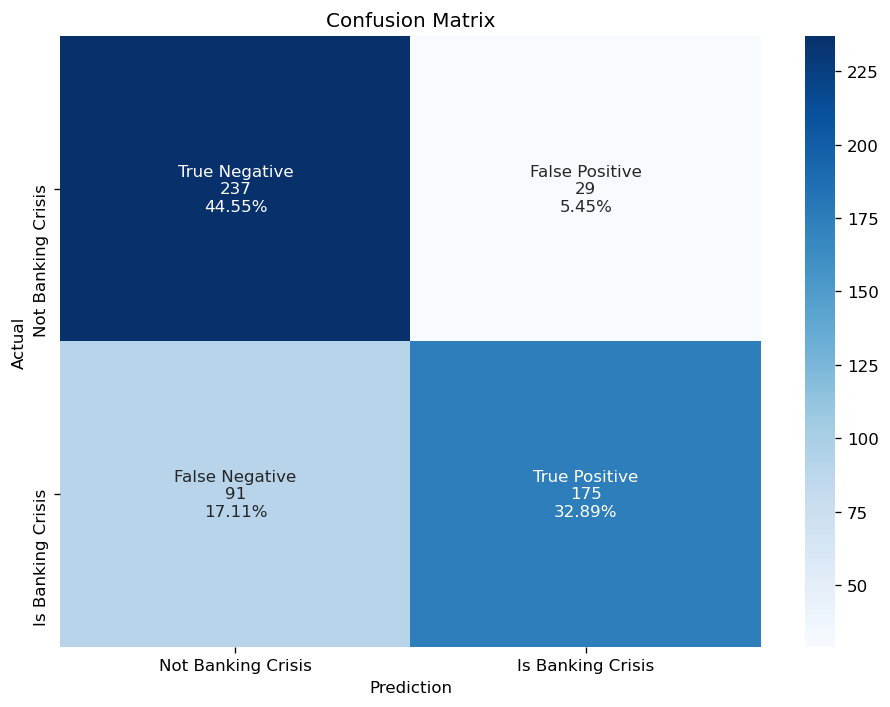

In [37]:
conf_matrix = confusion_matrix(y_test, model.predict(X_test))

group_names = ['True Negative', 'False Positive', 'False Negative', 'True Positive']
group_counts = ['{0:0.0f}'.format(value) for value in conf_matrix.flatten()]
group_percentages = ['{0:.2%}'.format(value) for value in conf_matrix.flatten() / np.sum(conf_matrix)]

labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(group_names, group_counts, group_percentages)]
labels = np.asarray(labels).reshape(2,2)

plt.style.use('default')

plt.figure(figsize=(8, 6), dpi=120)

sns.heatmap(
    conf_matrix,
    annot=labels,
    xticklabels=['Not Banking Crisis', 'Is Banking Crisis'],
    yticklabels=['Not Banking Crisis', 'Is Banking Crisis'],
    fmt='',
    cmap='Blues'
)

plt.xlabel('Prediction')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.tight_layout()
plt.savefig(f'model_{model_name}.png')

### Random Forest

In [38]:
%%time

model_name = 'RandomForest'

column_transformer = ColumnTransformer([
    ('scaling', StandardScaler(), X_train.columns)
], remainder='passthrough')

pipeline = Pipeline(steps=[
    ('scaling', column_transformer),
    ('classifier', RandomForestClassifier(random_state=54))
])

model = GridSearchCV(
    pipeline,
    [{
        'classifier__n_estimators': [10, 50, 100, 200, 500],
        'classifier__criterion': ['gini', 'entropy', 'log_loss'],
        'classifier__max_depth': [None, 5, 10, 20],
        'classifier__min_samples_split': [2, 5, 10],
        'classifier__min_samples_leaf': [1, 5, 10]
    }]
)

model.fit(X_train, y_train)
model.best_params_

CPU times: user 8min 36s, sys: 1.12 s, total: 8min 37s
Wall time: 8min 37s


{'classifier__criterion': 'entropy',
 'classifier__max_depth': None,
 'classifier__min_samples_leaf': 1,
 'classifier__min_samples_split': 2,
 'classifier__n_estimators': 200}

In [39]:
result = pd.DataFrame(
    [
        [
            model_name,
            'Train',
            round(roc_auc_score(y_train, model.predict_proba(X_train)[:,1]), 5),
            round(average_precision_score(y_train, model.predict_proba(X_train)[:,1]), 5),
            round(accuracy_score(y_train, model.predict(X_train)), 5),
            round(precision_score(y_train, model.predict(X_train)), 5),
            round(recall_score(y_train, model.predict(X_train)), 5),
            round(f1_score(y_train, model.predict(X_train)), 5)
        ],
        [
            model_name,
            'Test',
            round(roc_auc_score(y_test, model.predict_proba(X_test)[:,1]), 5),
            round(average_precision_score(y_test, model.predict_proba(X_test)[:,1]), 5),
            round(accuracy_score(y_test, model.predict(X_test)), 5),
            round(precision_score(y_test, model.predict(X_test)), 5),
            round(recall_score(y_test, model.predict(X_test)), 5),
            round(f1_score(y_test, model.predict(X_test)), 5)
        ]
    ],
    columns=['Model', 'Prediction Sample', 'AUC-ROC', 'AUC-PR', 'Accuracy', 'Precision', 'Recall', 'F1']
)
result

,Model,Prediction Sample,AUC-ROC,AUC-PR,Accuracy,Precision,Recall,F1
0,RandomForest,Train,0.97909,0.97475,0.88650,0.94988,0.81605,0.87790
1,RandomForest,Test,0.84663,0.86467,0.75564,0.87363,0.59774,0.70982


In [40]:
results = results.append(result)

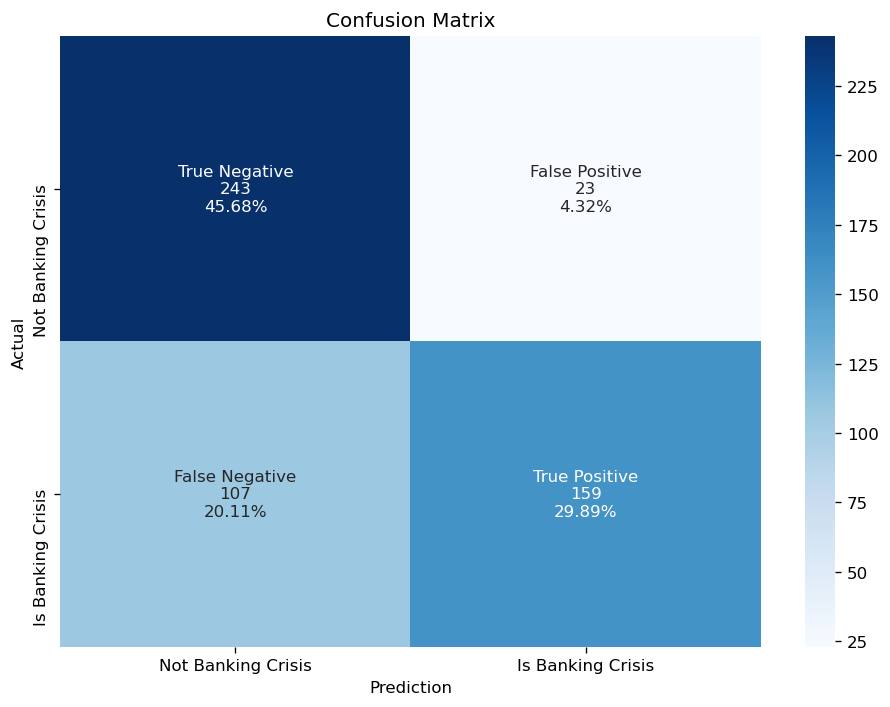

In [41]:
conf_matrix = confusion_matrix(y_test, model.predict(X_test))

group_names = ['True Negative', 'False Positive', 'False Negative', 'True Positive']
group_counts = ['{0:0.0f}'.format(value) for value in conf_matrix.flatten()]
group_percentages = ['{0:.2%}'.format(value) for value in conf_matrix.flatten() / np.sum(conf_matrix)]

labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(group_names, group_counts, group_percentages)]
labels = np.asarray(labels).reshape(2,2)

plt.style.use('default')

plt.figure(figsize=(8, 6), dpi=120)

sns.heatmap(
    conf_matrix,
    annot=labels,
    xticklabels=['Not Banking Crisis', 'Is Banking Crisis'],
    yticklabels=['Not Banking Crisis', 'Is Banking Crisis'],
    fmt='',
    cmap='Blues'
)

plt.xlabel('Prediction')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.tight_layout()
plt.savefig(f'model_{model_name}.png')

### Gradient Boosting 

In [42]:
%%time

model_name = 'GradientBoosting'

column_transformer = ColumnTransformer([
    ('scaling', StandardScaler(), X_train.columns)
], remainder='passthrough')

pipeline = Pipeline(steps=[
    ('scaling', column_transformer),
    ('classifier', GradientBoostingClassifier(random_state=54))
])

model = GridSearchCV(
    pipeline,
    [{
        'classifier__loss': ['log_loss', 'deviance', 'exponential'],
        'classifier__learning_rate': [0.05, 0.1, 0.5, 1],
        'classifier__n_estimators': [10, 50, 100, 200, 500],
        'classifier__max_depth': [None, 3, 10, 20]
    }]
)

model.fit(X_train, y_train)
model.best_params_

CPU times: user 22min 54s, sys: 1.04 s, total: 22min 55s
Wall time: 22min 55s


{'classifier__learning_rate': 1,
 'classifier__loss': 'deviance',
 'classifier__max_depth': None,
 'classifier__n_estimators': 500}

In [43]:
result = pd.DataFrame(
    [
        [
            model_name,
            'Train',
            round(roc_auc_score(y_train, model.predict_proba(X_train)[:,1]), 5),
            round(average_precision_score(y_train, model.predict_proba(X_train)[:,1]), 5),
            round(accuracy_score(y_train, model.predict(X_train)), 5),
            round(precision_score(y_train, model.predict(X_train)), 5),
            round(recall_score(y_train, model.predict(X_train)), 5),
            round(f1_score(y_train, model.predict(X_train)), 5)
        ],
        [
            model_name,
            'Test',
            round(roc_auc_score(y_test, model.predict_proba(X_test)[:,1]), 5),
            round(average_precision_score(y_test, model.predict_proba(X_test)[:,1]), 5),
            round(accuracy_score(y_test, model.predict(X_test)), 5),
            round(precision_score(y_test, model.predict(X_test)), 5),
            round(recall_score(y_test, model.predict(X_test)), 5),
            round(f1_score(y_test, model.predict(X_test)), 5)
        ]
    ],
    columns=['Model', 'Prediction Sample', 'AUC-ROC', 'AUC-PR', 'Accuracy', 'Precision', 'Recall', 'F1']
)
result

,Model,Prediction Sample,AUC-ROC,AUC-PR,Accuracy,Precision,Recall,F1
0,GradientBoosting,Train,0.99051,0.98896,0.96279,0.93344,0.99666,0.96401
1,GradientBoosting,Test,0.81679,0.77489,0.66917,0.81690,0.43609,0.56863


In [44]:
results = results.append(result)

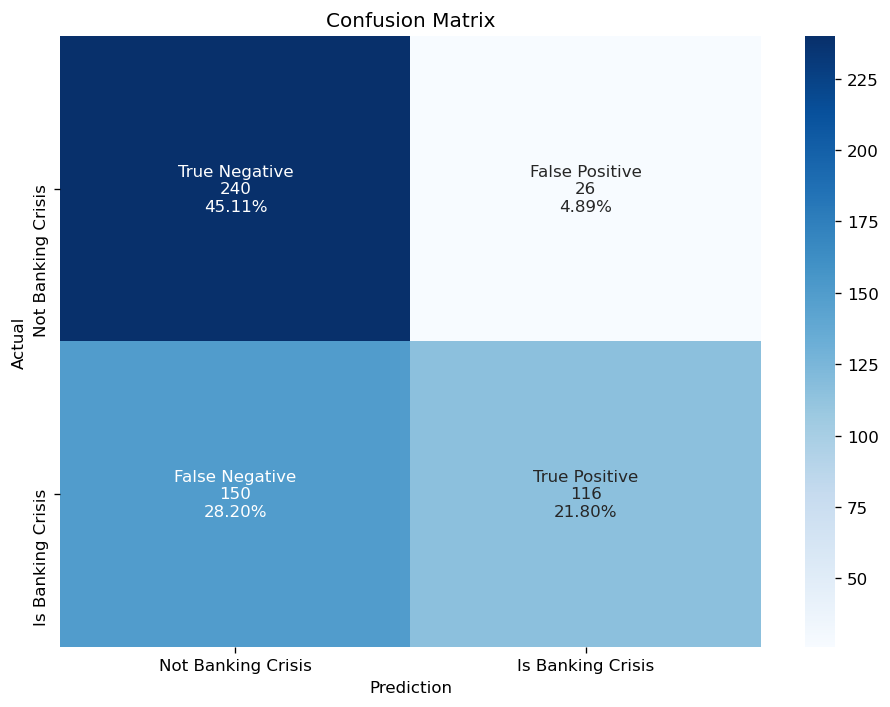

In [45]:
conf_matrix = confusion_matrix(y_test, model.predict(X_test))

group_names = ['True Negative', 'False Positive', 'False Negative', 'True Positive']
group_counts = ['{0:0.0f}'.format(value) for value in conf_matrix.flatten()]
group_percentages = ['{0:.2%}'.format(value) for value in conf_matrix.flatten() / np.sum(conf_matrix)]

labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(group_names, group_counts, group_percentages)]
labels = np.asarray(labels).reshape(2,2)

plt.style.use('default')

plt.figure(figsize=(8, 6), dpi=120)

sns.heatmap(
    conf_matrix,
    annot=labels,
    xticklabels=['Not Banking Crisis', 'Is Banking Crisis'],
    yticklabels=['Not Banking Crisis', 'Is Banking Crisis'],
    fmt='',
    cmap='Blues'
)

plt.xlabel('Prediction')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.tight_layout()
plt.savefig(f'model_{model_name}.png')

### LightGBM

In [46]:
%%time

model_name = 'LightGBM'

column_transformer = ColumnTransformer([
    ('scaling', StandardScaler(), X_train.columns)
], remainder='passthrough')

pipeline = Pipeline(steps=[
    ('scaling', column_transformer),
    ('classifier', LGBMClassifier(random_state=54))
])

model = GridSearchCV(
    pipeline,
    [{
        'classifier__metric': ['binary_logloss', 'cross_entropy', 'average_precision', 'auc', 'l2', 'l1'],
        'classifier__num_leaves': [5, 25, 50],
        'classifier__n_estimators': [10, 50, 100, 200, 500],
        'classifier__max_depth': [-1, 5, 10, 20],
        'classifier__learning_rate': [0.05, 0.1, 0.5, 1],
        'classifier__reg_lambda':[0, 0.01, 0.03]
    }]
)

model.fit(X_train, y_train)
model.best_params_

CPU times: user 4h 19min 9s, sys: 20min 29s, total: 4h 39min 39s
Wall time: 36min 29s


{'classifier__learning_rate': 0.5,
 'classifier__max_depth': 20,
 'classifier__metric': 'binary_logloss',
 'classifier__n_estimators': 100,
 'classifier__num_leaves': 50,
 'classifier__reg_lambda': 0}

In [47]:
result = pd.DataFrame(
    [
        [
            model_name,
            'Train',
            round(roc_auc_score(y_train, model.predict_proba(X_train)[:,1]), 5),
            round(average_precision_score(y_train, model.predict_proba(X_train)[:,1]), 5),
            round(accuracy_score(y_train, model.predict(X_train)), 5),
            round(precision_score(y_train, model.predict(X_train)), 5),
            round(recall_score(y_train, model.predict(X_train)), 5),
            round(f1_score(y_train, model.predict(X_train)), 5)
        ],
        [
            model_name,
            'Test',
            round(roc_auc_score(y_test, model.predict_proba(X_test)[:,1]), 5),
            round(average_precision_score(y_test, model.predict_proba(X_test)[:,1]), 5),
            round(accuracy_score(y_test, model.predict(X_test)), 5),
            round(precision_score(y_test, model.predict(X_test)), 5),
            round(recall_score(y_test, model.predict(X_test)), 5),
            round(f1_score(y_test, model.predict(X_test)), 5)
        ]
    ],
    columns=['Model', 'Prediction Sample', 'AUC-ROC', 'AUC-PR', 'Accuracy', 'Precision', 'Recall', 'F1']
)
result

,Model,Prediction Sample,AUC-ROC,AUC-PR,Accuracy,Precision,Recall,F1
0,LightGBM,Train,1.00000,0.99999,0.99958,0.99916,1.00000,0.99958
1,LightGBM,Test,0.84704,0.86434,0.68797,0.90984,0.41729,0.57216


In [48]:
results = results.append(result)

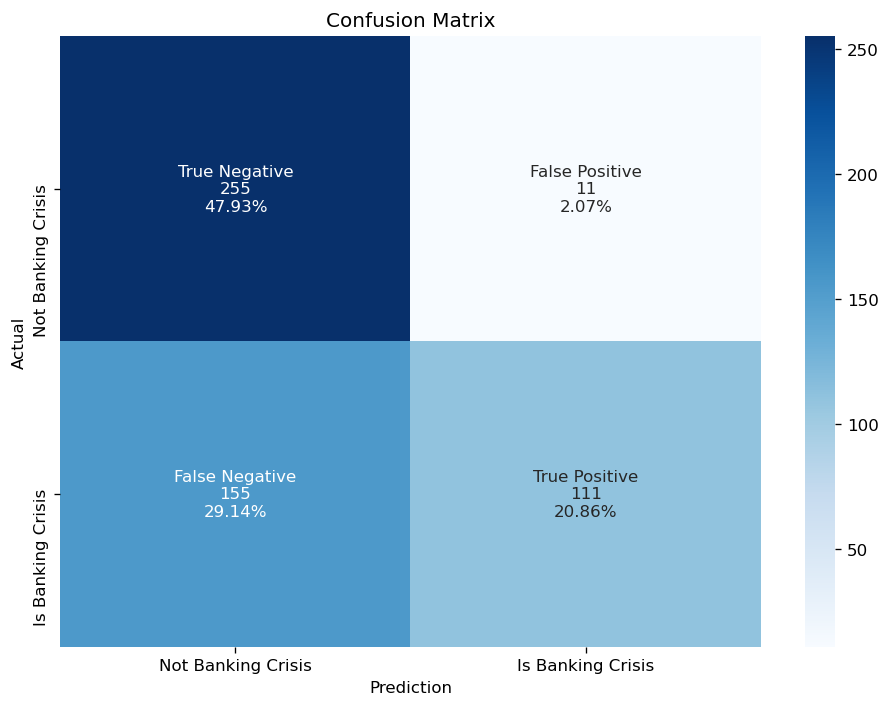

In [49]:
conf_matrix = confusion_matrix(y_test, model.predict(X_test))

group_names = ['True Negative', 'False Positive', 'False Negative', 'True Positive']
group_counts = ['{0:0.0f}'.format(value) for value in conf_matrix.flatten()]
group_percentages = ['{0:.2%}'.format(value) for value in conf_matrix.flatten() / np.sum(conf_matrix)]

labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(group_names, group_counts, group_percentages)]
labels = np.asarray(labels).reshape(2,2)

plt.style.use('default')

plt.figure(figsize=(8, 6), dpi=120)

sns.heatmap(
    conf_matrix,
    annot=labels,
    xticklabels=['Not Banking Crisis', 'Is Banking Crisis'],
    yticklabels=['Not Banking Crisis', 'Is Banking Crisis'],
    fmt='',
    cmap='Blues'
)

plt.xlabel('Prediction')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.tight_layout()
plt.savefig(f'model_{model_name}.png')

### CatBoost

In [50]:
%%time

model_name = 'CatBoost'

column_transformer = ColumnTransformer([
    ('scaling', StandardScaler(), X_train.columns)
], remainder='passthrough')

pipeline = Pipeline(steps=[
    ('scaling', column_transformer),
    ('classifier', CatBoostClassifier(random_state=54))
])

model = GridSearchCV(
    pipeline,
    [{
        'classifier__loss_function': ['Logloss', 'CrossEntropy', 'F1', 'AUC'],
        'classifier__iterations': [10, 100, 500],
        'classifier__depth': [4, 10, 16],
        'classifier__learning_rate': [0.1, 0.5, 1]
    }]
)

model.fit(X_train, y_train)
model.best_params_

0:	learn: 0.6761913	total: 62.1ms	remaining: 559ms
1:	learn: 0.6592524	total: 62.9ms	remaining: 251ms
2:	learn: 0.6482144	total: 63.5ms	remaining: 148ms
3:	learn: 0.6378862	total: 64ms	remaining: 96ms
4:	learn: 0.6275864	total: 64.5ms	remaining: 64.5ms
5:	learn: 0.6197086	total: 64.9ms	remaining: 43.3ms
6:	learn: 0.6116713	total: 65.4ms	remaining: 28ms
7:	learn: 0.6019073	total: 65.9ms	remaining: 16.5ms
8:	learn: 0.5940779	total: 66.5ms	remaining: 7.39ms
9:	learn: 0.5850523	total: 67ms	remaining: 0us
0:	learn: 0.6744382	total: 503us	remaining: 4.53ms
1:	learn: 0.6573165	total: 1.14ms	remaining: 4.55ms
2:	learn: 0.6421159	total: 1.66ms	remaining: 3.88ms
3:	learn: 0.6314653	total: 2.1ms	remaining: 3.15ms
4:	learn: 0.6231824	total: 2.52ms	remaining: 2.52ms
5:	learn: 0.6157667	total: 2.9ms	remaining: 1.93ms
6:	learn: 0.6085369	total: 3.3ms	remaining: 1.42ms
7:	learn: 0.5988715	total: 3.78ms	remaining: 944us
8:	learn: 0.5923502	total: 4.24ms	remaining: 471us
9:	learn: 0.5828068	total: 4.68m

0:	learn: 0.5862011	total: 520us	remaining: 4.68ms
1:	learn: 0.5311279	total: 1.12ms	remaining: 4.49ms
2:	learn: 0.4901667	total: 1.63ms	remaining: 3.81ms
3:	learn: 0.4663525	total: 2.17ms	remaining: 3.25ms
4:	learn: 0.4608372	total: 2.59ms	remaining: 2.59ms
5:	learn: 0.4475054	total: 3.15ms	remaining: 2.1ms
6:	learn: 0.4429079	total: 3.63ms	remaining: 1.55ms
7:	learn: 0.4414730	total: 4.2ms	remaining: 1.05ms
8:	learn: 0.4320254	total: 4.8ms	remaining: 533us
9:	learn: 0.4206006	total: 5.36ms	remaining: 0us
0:	learn: 0.5780133	total: 1.09ms	remaining: 9.82ms
1:	learn: 0.5202596	total: 1.76ms	remaining: 7.03ms
2:	learn: 0.4881624	total: 2.46ms	remaining: 5.75ms
3:	learn: 0.4741685	total: 3.15ms	remaining: 4.72ms
4:	learn: 0.4537320	total: 3.84ms	remaining: 3.84ms
5:	learn: 0.4388713	total: 4.43ms	remaining: 2.96ms
6:	learn: 0.4345932	total: 5.13ms	remaining: 2.2ms
7:	learn: 0.4237896	total: 5.71ms	remaining: 1.43ms
8:	learn: 0.4168062	total: 6.19ms	remaining: 687us
9:	learn: 0.4027181	to

83:	learn: 0.4202083	total: 50.6ms	remaining: 9.64ms
84:	learn: 0.4194459	total: 51.7ms	remaining: 9.12ms
85:	learn: 0.4182944	total: 52.3ms	remaining: 8.52ms
86:	learn: 0.4174538	total: 53ms	remaining: 7.91ms
87:	learn: 0.4163632	total: 53.6ms	remaining: 7.3ms
88:	learn: 0.4156149	total: 54ms	remaining: 6.68ms
89:	learn: 0.4149675	total: 54.6ms	remaining: 6.07ms
90:	learn: 0.4145938	total: 55.2ms	remaining: 5.46ms
91:	learn: 0.4128897	total: 55.9ms	remaining: 4.86ms
92:	learn: 0.4121305	total: 56.6ms	remaining: 4.26ms
93:	learn: 0.4112669	total: 57.1ms	remaining: 3.65ms
94:	learn: 0.4105553	total: 57.7ms	remaining: 3.04ms
95:	learn: 0.4101197	total: 58.3ms	remaining: 2.43ms
96:	learn: 0.4085173	total: 58.8ms	remaining: 1.82ms
97:	learn: 0.4078248	total: 59.2ms	remaining: 1.21ms
98:	learn: 0.4060242	total: 59.8ms	remaining: 604us
99:	learn: 0.4045184	total: 60.7ms	remaining: 0us
0:	learn: 0.6744382	total: 755us	remaining: 74.8ms
1:	learn: 0.6573165	total: 1.68ms	remaining: 82.5ms
2:	le

39:	learn: 0.4742686	total: 23.7ms	remaining: 35.5ms
40:	learn: 0.4712459	total: 24.2ms	remaining: 34.8ms
41:	learn: 0.4695358	total: 24.9ms	remaining: 34.4ms
42:	learn: 0.4678885	total: 25.6ms	remaining: 33.9ms
43:	learn: 0.4661879	total: 26.3ms	remaining: 33.5ms
44:	learn: 0.4646733	total: 26.9ms	remaining: 32.9ms
45:	learn: 0.4635171	total: 27.7ms	remaining: 32.5ms
46:	learn: 0.4611540	total: 28.3ms	remaining: 32ms
47:	learn: 0.4591269	total: 29ms	remaining: 31.4ms
48:	learn: 0.4569390	total: 29.5ms	remaining: 30.7ms
49:	learn: 0.4555044	total: 30.1ms	remaining: 30.1ms
50:	learn: 0.4531842	total: 30.8ms	remaining: 29.5ms
51:	learn: 0.4521161	total: 31.4ms	remaining: 29ms
52:	learn: 0.4511517	total: 31.8ms	remaining: 28.2ms
53:	learn: 0.4497227	total: 32.5ms	remaining: 27.6ms
54:	learn: 0.4482558	total: 33.1ms	remaining: 27.1ms
55:	learn: 0.4469882	total: 33.7ms	remaining: 26.4ms
56:	learn: 0.4465053	total: 34.3ms	remaining: 25.9ms
57:	learn: 0.4441896	total: 34.9ms	remaining: 25.2ms

0:	learn: 0.6744382	total: 770us	remaining: 76.2ms
1:	learn: 0.6573165	total: 1.37ms	remaining: 67.2ms
2:	learn: 0.6421159	total: 1.77ms	remaining: 57.2ms
3:	learn: 0.6314653	total: 2.14ms	remaining: 51.5ms
4:	learn: 0.6231824	total: 2.53ms	remaining: 48.1ms
5:	learn: 0.6157667	total: 2.98ms	remaining: 46.7ms
6:	learn: 0.6085369	total: 3.52ms	remaining: 46.8ms
7:	learn: 0.5988715	total: 4.18ms	remaining: 48.1ms
8:	learn: 0.5923502	total: 4.73ms	remaining: 47.9ms
9:	learn: 0.5828068	total: 5.28ms	remaining: 47.6ms
10:	learn: 0.5779820	total: 5.9ms	remaining: 47.7ms
11:	learn: 0.5711099	total: 6.46ms	remaining: 47.4ms
12:	learn: 0.5654408	total: 7.15ms	remaining: 47.9ms
13:	learn: 0.5598891	total: 7.82ms	remaining: 48ms
14:	learn: 0.5569548	total: 8.36ms	remaining: 47.3ms
15:	learn: 0.5505342	total: 8.96ms	remaining: 47.1ms
16:	learn: 0.5454071	total: 9.55ms	remaining: 46.6ms
17:	learn: 0.5415589	total: 10.1ms	remaining: 46ms
18:	learn: 0.5387394	total: 10.7ms	remaining: 45.5ms
19:	learn

83:	learn: 0.4223844	total: 50.5ms	remaining: 9.63ms
84:	learn: 0.4218661	total: 51.1ms	remaining: 9.03ms
85:	learn: 0.4217388	total: 51.7ms	remaining: 8.41ms
86:	learn: 0.4214591	total: 52.3ms	remaining: 7.81ms
87:	learn: 0.4198262	total: 52.9ms	remaining: 7.22ms
88:	learn: 0.4193012	total: 53.7ms	remaining: 6.64ms
89:	learn: 0.4180822	total: 54.4ms	remaining: 6.05ms
90:	learn: 0.4176576	total: 55ms	remaining: 5.44ms
91:	learn: 0.4165088	total: 55.6ms	remaining: 4.83ms
92:	learn: 0.4160272	total: 56.3ms	remaining: 4.24ms
93:	learn: 0.4153131	total: 56.7ms	remaining: 3.62ms
94:	learn: 0.4140120	total: 57.3ms	remaining: 3.02ms
95:	learn: 0.4122617	total: 58.1ms	remaining: 2.42ms
96:	learn: 0.4103887	total: 58.9ms	remaining: 1.82ms
97:	learn: 0.4092271	total: 59.6ms	remaining: 1.22ms
98:	learn: 0.4079604	total: 60.1ms	remaining: 607us
99:	learn: 0.4057201	total: 60.9ms	remaining: 0us
0:	learn: 0.6757945	total: 633us	remaining: 62.7ms
1:	learn: 0.6627968	total: 1.29ms	remaining: 63.4ms
2:

0:	learn: 0.6184921	total: 421us	remaining: 41.8ms
1:	learn: 0.5848147	total: 882us	remaining: 43.3ms
2:	learn: 0.5473779	total: 1.31ms	remaining: 42.5ms
3:	learn: 0.5305678	total: 1.77ms	remaining: 42.5ms
4:	learn: 0.5207790	total: 2.17ms	remaining: 41.2ms
5:	learn: 0.5069595	total: 2.66ms	remaining: 41.7ms
6:	learn: 0.4951587	total: 3.17ms	remaining: 42ms
7:	learn: 0.4917216	total: 3.95ms	remaining: 45.4ms
8:	learn: 0.4780946	total: 4.45ms	remaining: 45ms
9:	learn: 0.4706656	total: 4.97ms	remaining: 44.8ms
10:	learn: 0.4602399	total: 5.49ms	remaining: 44.4ms
11:	learn: 0.4558761	total: 6.25ms	remaining: 45.8ms
12:	learn: 0.4517963	total: 6.72ms	remaining: 44.9ms
13:	learn: 0.4462862	total: 7.22ms	remaining: 44.4ms
14:	learn: 0.4396304	total: 7.81ms	remaining: 44.3ms
15:	learn: 0.4323625	total: 8.44ms	remaining: 44.3ms
16:	learn: 0.4292902	total: 8.99ms	remaining: 43.9ms
17:	learn: 0.4229614	total: 9.73ms	remaining: 44.3ms
18:	learn: 0.4218628	total: 10.4ms	remaining: 44.5ms
19:	learn

80:	learn: 0.2470981	total: 48.1ms	remaining: 11.3ms
81:	learn: 0.2460625	total: 48.7ms	remaining: 10.7ms
82:	learn: 0.2448507	total: 49.4ms	remaining: 10.1ms
83:	learn: 0.2437921	total: 50ms	remaining: 9.52ms
84:	learn: 0.2433553	total: 50.6ms	remaining: 8.92ms
85:	learn: 0.2424084	total: 51.3ms	remaining: 8.35ms
86:	learn: 0.2403476	total: 51.8ms	remaining: 7.74ms
87:	learn: 0.2379780	total: 52.3ms	remaining: 7.13ms
88:	learn: 0.2379134	total: 52.9ms	remaining: 6.54ms
89:	learn: 0.2356364	total: 53.5ms	remaining: 5.94ms
90:	learn: 0.2342811	total: 54.1ms	remaining: 5.35ms
91:	learn: 0.2338105	total: 54.8ms	remaining: 4.76ms
92:	learn: 0.2335990	total: 55.2ms	remaining: 4.16ms
93:	learn: 0.2329576	total: 55.9ms	remaining: 3.56ms
94:	learn: 0.2317342	total: 56.4ms	remaining: 2.97ms
95:	learn: 0.2301397	total: 57ms	remaining: 2.38ms
96:	learn: 0.2290794	total: 57.7ms	remaining: 1.78ms
97:	learn: 0.2280335	total: 58.2ms	remaining: 1.19ms
98:	learn: 0.2269934	total: 59ms	remaining: 595us


37:	learn: 0.3490961	total: 22.1ms	remaining: 36ms
38:	learn: 0.3459008	total: 22.7ms	remaining: 35.5ms
39:	learn: 0.3405496	total: 23.3ms	remaining: 34.9ms
40:	learn: 0.3387512	total: 23.8ms	remaining: 34.2ms
41:	learn: 0.3358129	total: 24.4ms	remaining: 33.7ms
42:	learn: 0.3336747	total: 25.3ms	remaining: 33.5ms
43:	learn: 0.3327546	total: 25.9ms	remaining: 32.9ms
44:	learn: 0.3295444	total: 26.6ms	remaining: 32.5ms
45:	learn: 0.3244068	total: 27.2ms	remaining: 32ms
46:	learn: 0.3217515	total: 27.7ms	remaining: 31.2ms
47:	learn: 0.3187607	total: 28.2ms	remaining: 30.5ms
48:	learn: 0.3172956	total: 28.7ms	remaining: 29.8ms
49:	learn: 0.3163514	total: 29.2ms	remaining: 29.2ms
50:	learn: 0.3124168	total: 30ms	remaining: 28.8ms
51:	learn: 0.3092136	total: 30.7ms	remaining: 28.3ms
52:	learn: 0.3085346	total: 31.2ms	remaining: 27.7ms
53:	learn: 0.3060165	total: 31.8ms	remaining: 27.1ms
54:	learn: 0.3034057	total: 32.6ms	remaining: 26.7ms
55:	learn: 0.3011679	total: 33.1ms	remaining: 26ms
5

0:	learn: 0.6235149	total: 814us	remaining: 80.6ms
1:	learn: 0.5848837	total: 1.26ms	remaining: 61.8ms
2:	learn: 0.5478849	total: 1.85ms	remaining: 59.8ms
3:	learn: 0.5336469	total: 2.3ms	remaining: 55.1ms
4:	learn: 0.5166211	total: 2.84ms	remaining: 53.9ms
5:	learn: 0.4994669	total: 3.41ms	remaining: 53.5ms
6:	learn: 0.4915661	total: 3.84ms	remaining: 51.1ms
7:	learn: 0.4855225	total: 4.36ms	remaining: 50.1ms
8:	learn: 0.4761829	total: 4.79ms	remaining: 48.4ms
9:	learn: 0.4619036	total: 5.26ms	remaining: 47.3ms
10:	learn: 0.4577616	total: 5.81ms	remaining: 47ms
11:	learn: 0.4568886	total: 6.25ms	remaining: 45.9ms
12:	learn: 0.4537227	total: 7.32ms	remaining: 49ms
13:	learn: 0.4445771	total: 7.88ms	remaining: 48.4ms
14:	learn: 0.4426442	total: 8.41ms	remaining: 47.7ms
15:	learn: 0.4312364	total: 9.07ms	remaining: 47.6ms
16:	learn: 0.4250054	total: 10.2ms	remaining: 50ms
17:	learn: 0.4188065	total: 11.1ms	remaining: 50.7ms
18:	learn: 0.4149415	total: 11.8ms	remaining: 50.2ms
19:	learn: 

27:	learn: 0.3166646	total: 16.5ms	remaining: 42.3ms
28:	learn: 0.3128926	total: 17ms	remaining: 41.6ms
29:	learn: 0.3080948	total: 17.8ms	remaining: 41.4ms
30:	learn: 0.3043972	total: 18.5ms	remaining: 41.1ms
31:	learn: 0.2983148	total: 19.1ms	remaining: 40.5ms
32:	learn: 0.2912400	total: 19.7ms	remaining: 40ms
33:	learn: 0.2881908	total: 20.2ms	remaining: 39.3ms
34:	learn: 0.2850248	total: 20.7ms	remaining: 38.4ms
35:	learn: 0.2758969	total: 21.4ms	remaining: 38ms
36:	learn: 0.2736938	total: 22.2ms	remaining: 37.8ms
37:	learn: 0.2682780	total: 22.9ms	remaining: 37.3ms
38:	learn: 0.2643828	total: 23.6ms	remaining: 36.8ms
39:	learn: 0.2622252	total: 24ms	remaining: 36ms
40:	learn: 0.2578163	total: 24.5ms	remaining: 35.2ms
41:	learn: 0.2553459	total: 25ms	remaining: 34.6ms
42:	learn: 0.2510658	total: 25.6ms	remaining: 33.9ms
43:	learn: 0.2468067	total: 26.2ms	remaining: 33.3ms
44:	learn: 0.2441056	total: 26.7ms	remaining: 32.7ms
45:	learn: 0.2426095	total: 27.4ms	remaining: 32.2ms
46:	l

0:	learn: 0.5922397	total: 1.23ms	remaining: 122ms
1:	learn: 0.5418965	total: 1.78ms	remaining: 87.4ms
2:	learn: 0.5123079	total: 2.21ms	remaining: 71.6ms
3:	learn: 0.4938131	total: 2.68ms	remaining: 64.2ms
4:	learn: 0.4810699	total: 3.16ms	remaining: 60.1ms
5:	learn: 0.4652995	total: 3.72ms	remaining: 58.2ms
6:	learn: 0.4629617	total: 4.3ms	remaining: 57.2ms
7:	learn: 0.4529888	total: 4.82ms	remaining: 55.4ms
8:	learn: 0.4380670	total: 5.42ms	remaining: 54.8ms
9:	learn: 0.4210366	total: 5.98ms	remaining: 53.8ms
10:	learn: 0.4103745	total: 6.54ms	remaining: 52.9ms
11:	learn: 0.3930447	total: 7.06ms	remaining: 51.7ms
12:	learn: 0.3843420	total: 7.69ms	remaining: 51.5ms
13:	learn: 0.3758238	total: 8.24ms	remaining: 50.6ms
14:	learn: 0.3700676	total: 8.83ms	remaining: 50ms
15:	learn: 0.3604278	total: 9.37ms	remaining: 49.2ms
16:	learn: 0.3552924	total: 9.96ms	remaining: 48.6ms
17:	learn: 0.3496534	total: 10.5ms	remaining: 47.6ms
18:	learn: 0.3445329	total: 11.1ms	remaining: 47.3ms
19:	lea

77:	learn: 0.1799746	total: 47.1ms	remaining: 13.3ms
78:	learn: 0.1787776	total: 47.9ms	remaining: 12.7ms
79:	learn: 0.1776922	total: 48.7ms	remaining: 12.2ms
80:	learn: 0.1772106	total: 49.3ms	remaining: 11.6ms
81:	learn: 0.1765700	total: 50ms	remaining: 11ms
82:	learn: 0.1760191	total: 50.7ms	remaining: 10.4ms
83:	learn: 0.1758480	total: 51.5ms	remaining: 9.81ms
84:	learn: 0.1747147	total: 51.9ms	remaining: 9.17ms
85:	learn: 0.1734655	total: 52.7ms	remaining: 8.58ms
86:	learn: 0.1720762	total: 53.4ms	remaining: 7.98ms
87:	learn: 0.1713858	total: 53.9ms	remaining: 7.35ms
88:	learn: 0.1696273	total: 54.5ms	remaining: 6.74ms
89:	learn: 0.1690711	total: 55.1ms	remaining: 6.13ms
90:	learn: 0.1684701	total: 55.6ms	remaining: 5.5ms
91:	learn: 0.1678500	total: 56.4ms	remaining: 4.9ms
92:	learn: 0.1660036	total: 57ms	remaining: 4.29ms
93:	learn: 0.1649505	total: 57.6ms	remaining: 3.67ms
94:	learn: 0.1641606	total: 58.1ms	remaining: 3.06ms
95:	learn: 0.1636343	total: 58.7ms	remaining: 2.44ms
9

36:	learn: 0.2581469	total: 22.1ms	remaining: 37.7ms
37:	learn: 0.2542879	total: 22.9ms	remaining: 37.4ms
38:	learn: 0.2495151	total: 23.6ms	remaining: 36.8ms
39:	learn: 0.2475170	total: 24.2ms	remaining: 36.3ms
40:	learn: 0.2441872	total: 24.9ms	remaining: 35.8ms
41:	learn: 0.2422695	total: 25.6ms	remaining: 35.4ms
42:	learn: 0.2385834	total: 26.2ms	remaining: 34.8ms
43:	learn: 0.2367811	total: 26.6ms	remaining: 33.9ms
44:	learn: 0.2343524	total: 27.3ms	remaining: 33.3ms
45:	learn: 0.2311536	total: 28ms	remaining: 32.8ms
46:	learn: 0.2282639	total: 28.6ms	remaining: 32.3ms
47:	learn: 0.2254570	total: 29.2ms	remaining: 31.7ms
48:	learn: 0.2235054	total: 30ms	remaining: 31.2ms
49:	learn: 0.2216754	total: 30.7ms	remaining: 30.7ms
50:	learn: 0.2160706	total: 31.4ms	remaining: 30.2ms
51:	learn: 0.2123684	total: 32.1ms	remaining: 29.6ms
52:	learn: 0.2100053	total: 32.6ms	remaining: 28.9ms
53:	learn: 0.2057044	total: 33.1ms	remaining: 28.2ms
54:	learn: 0.2038386	total: 33.9ms	remaining: 27.7

120:	learn: 0.3170259	total: 110ms	remaining: 345ms
121:	learn: 0.3159461	total: 111ms	remaining: 345ms
122:	learn: 0.3151742	total: 112ms	remaining: 344ms
123:	learn: 0.3143233	total: 113ms	remaining: 343ms
124:	learn: 0.3131668	total: 114ms	remaining: 342ms
125:	learn: 0.3124218	total: 115ms	remaining: 341ms
126:	learn: 0.3118691	total: 116ms	remaining: 340ms
127:	learn: 0.3109299	total: 117ms	remaining: 339ms
128:	learn: 0.3088980	total: 118ms	remaining: 338ms
129:	learn: 0.3076338	total: 118ms	remaining: 337ms
130:	learn: 0.3072153	total: 120ms	remaining: 337ms
131:	learn: 0.3067914	total: 121ms	remaining: 336ms
132:	learn: 0.3062047	total: 122ms	remaining: 335ms
133:	learn: 0.3051699	total: 122ms	remaining: 335ms
134:	learn: 0.3038561	total: 124ms	remaining: 334ms
135:	learn: 0.3028498	total: 125ms	remaining: 334ms
136:	learn: 0.3014974	total: 126ms	remaining: 333ms
137:	learn: 0.3006277	total: 127ms	remaining: 333ms
138:	learn: 0.2988187	total: 128ms	remaining: 332ms
139:	learn: 

336:	learn: 0.1798527	total: 303ms	remaining: 147ms
337:	learn: 0.1795570	total: 304ms	remaining: 146ms
338:	learn: 0.1794423	total: 305ms	remaining: 145ms
339:	learn: 0.1791701	total: 306ms	remaining: 144ms
340:	learn: 0.1788404	total: 307ms	remaining: 143ms
341:	learn: 0.1786795	total: 308ms	remaining: 142ms
342:	learn: 0.1784831	total: 309ms	remaining: 141ms
343:	learn: 0.1782257	total: 310ms	remaining: 140ms
344:	learn: 0.1781496	total: 311ms	remaining: 140ms
345:	learn: 0.1779604	total: 311ms	remaining: 139ms
346:	learn: 0.1778948	total: 312ms	remaining: 138ms
347:	learn: 0.1775338	total: 313ms	remaining: 137ms
348:	learn: 0.1770839	total: 314ms	remaining: 136ms
349:	learn: 0.1761804	total: 315ms	remaining: 135ms
350:	learn: 0.1759336	total: 316ms	remaining: 134ms
351:	learn: 0.1753900	total: 317ms	remaining: 133ms
352:	learn: 0.1748533	total: 318ms	remaining: 132ms
353:	learn: 0.1743691	total: 319ms	remaining: 131ms
354:	learn: 0.1739905	total: 320ms	remaining: 131ms
355:	learn: 

36:	learn: 0.4493226	total: 32.5ms	remaining: 407ms
37:	learn: 0.4455800	total: 33.5ms	remaining: 407ms
38:	learn: 0.4440824	total: 34.3ms	remaining: 406ms
39:	learn: 0.4425800	total: 35.1ms	remaining: 403ms
40:	learn: 0.4407988	total: 35.8ms	remaining: 401ms
41:	learn: 0.4400695	total: 36.6ms	remaining: 400ms
42:	learn: 0.4380350	total: 37.6ms	remaining: 400ms
43:	learn: 0.4358833	total: 38.6ms	remaining: 400ms
44:	learn: 0.4347655	total: 39.5ms	remaining: 399ms
45:	learn: 0.4330840	total: 40.5ms	remaining: 400ms
46:	learn: 0.4313436	total: 41.5ms	remaining: 400ms
47:	learn: 0.4296982	total: 42.6ms	remaining: 401ms
48:	learn: 0.4281129	total: 43.5ms	remaining: 400ms
49:	learn: 0.4271612	total: 44.3ms	remaining: 399ms
50:	learn: 0.4266527	total: 45.3ms	remaining: 399ms
51:	learn: 0.4257174	total: 46.1ms	remaining: 397ms
52:	learn: 0.4216828	total: 47ms	remaining: 397ms
53:	learn: 0.4199502	total: 48.1ms	remaining: 397ms
54:	learn: 0.4189824	total: 49.2ms	remaining: 398ms
55:	learn: 0.4

239:	learn: 0.2406071	total: 224ms	remaining: 243ms
240:	learn: 0.2398510	total: 225ms	remaining: 242ms
241:	learn: 0.2395088	total: 226ms	remaining: 241ms
242:	learn: 0.2391955	total: 227ms	remaining: 240ms
243:	learn: 0.2389780	total: 228ms	remaining: 239ms
244:	learn: 0.2388737	total: 229ms	remaining: 238ms
245:	learn: 0.2382030	total: 229ms	remaining: 237ms
246:	learn: 0.2377973	total: 230ms	remaining: 236ms
247:	learn: 0.2370705	total: 231ms	remaining: 235ms
248:	learn: 0.2366609	total: 232ms	remaining: 234ms
249:	learn: 0.2362482	total: 233ms	remaining: 233ms
250:	learn: 0.2356832	total: 234ms	remaining: 232ms
251:	learn: 0.2354310	total: 235ms	remaining: 231ms
252:	learn: 0.2351724	total: 236ms	remaining: 230ms
253:	learn: 0.2345106	total: 237ms	remaining: 229ms
254:	learn: 0.2338158	total: 238ms	remaining: 228ms
255:	learn: 0.2334846	total: 238ms	remaining: 227ms
256:	learn: 0.2331365	total: 239ms	remaining: 226ms
257:	learn: 0.2329523	total: 240ms	remaining: 225ms
258:	learn: 

451:	learn: 0.1595005	total: 417ms	remaining: 44.2ms
452:	learn: 0.1589849	total: 418ms	remaining: 43.3ms
453:	learn: 0.1589576	total: 418ms	remaining: 42.4ms
454:	learn: 0.1587001	total: 419ms	remaining: 41.5ms
455:	learn: 0.1584945	total: 420ms	remaining: 40.5ms
456:	learn: 0.1582278	total: 421ms	remaining: 39.6ms
457:	learn: 0.1580001	total: 422ms	remaining: 38.7ms
458:	learn: 0.1577277	total: 423ms	remaining: 37.8ms
459:	learn: 0.1575174	total: 424ms	remaining: 36.9ms
460:	learn: 0.1574866	total: 425ms	remaining: 35.9ms
461:	learn: 0.1570397	total: 426ms	remaining: 35ms
462:	learn: 0.1568465	total: 427ms	remaining: 34.1ms
463:	learn: 0.1562943	total: 427ms	remaining: 33.2ms
464:	learn: 0.1559504	total: 428ms	remaining: 32.2ms
465:	learn: 0.1557842	total: 429ms	remaining: 31.3ms
466:	learn: 0.1554574	total: 430ms	remaining: 30.4ms
467:	learn: 0.1552853	total: 431ms	remaining: 29.5ms
468:	learn: 0.1548352	total: 432ms	remaining: 28.6ms
469:	learn: 0.1546367	total: 433ms	remaining: 27

149:	learn: 0.2930211	total: 134ms	remaining: 314ms
150:	learn: 0.2921439	total: 135ms	remaining: 313ms
151:	learn: 0.2914685	total: 136ms	remaining: 312ms
152:	learn: 0.2903607	total: 137ms	remaining: 311ms
153:	learn: 0.2894828	total: 138ms	remaining: 311ms
154:	learn: 0.2881476	total: 139ms	remaining: 310ms
155:	learn: 0.2875698	total: 140ms	remaining: 309ms
156:	learn: 0.2856161	total: 141ms	remaining: 308ms
157:	learn: 0.2846188	total: 142ms	remaining: 307ms
158:	learn: 0.2833959	total: 143ms	remaining: 306ms
159:	learn: 0.2830340	total: 143ms	remaining: 305ms
160:	learn: 0.2823614	total: 144ms	remaining: 304ms
161:	learn: 0.2815226	total: 145ms	remaining: 303ms
162:	learn: 0.2806439	total: 146ms	remaining: 302ms
163:	learn: 0.2792272	total: 147ms	remaining: 301ms
164:	learn: 0.2786939	total: 148ms	remaining: 300ms
165:	learn: 0.2777141	total: 149ms	remaining: 299ms
166:	learn: 0.2769566	total: 150ms	remaining: 299ms
167:	learn: 0.2758147	total: 151ms	remaining: 298ms
168:	learn: 

356:	learn: 0.1781483	total: 327ms	remaining: 131ms
357:	learn: 0.1778285	total: 327ms	remaining: 130ms
358:	learn: 0.1777353	total: 328ms	remaining: 129ms
359:	learn: 0.1772930	total: 329ms	remaining: 128ms
360:	learn: 0.1768874	total: 330ms	remaining: 127ms
361:	learn: 0.1765786	total: 331ms	remaining: 126ms
362:	learn: 0.1763497	total: 332ms	remaining: 125ms
363:	learn: 0.1760486	total: 333ms	remaining: 125ms
364:	learn: 0.1758241	total: 334ms	remaining: 124ms
365:	learn: 0.1756308	total: 335ms	remaining: 123ms
366:	learn: 0.1754981	total: 336ms	remaining: 122ms
367:	learn: 0.1751821	total: 337ms	remaining: 121ms
368:	learn: 0.1747451	total: 338ms	remaining: 120ms
369:	learn: 0.1743638	total: 339ms	remaining: 119ms
370:	learn: 0.1740420	total: 340ms	remaining: 118ms
371:	learn: 0.1736364	total: 341ms	remaining: 117ms
372:	learn: 0.1733205	total: 342ms	remaining: 116ms
373:	learn: 0.1732022	total: 343ms	remaining: 115ms
374:	learn: 0.1722214	total: 343ms	remaining: 114ms
375:	learn: 

54:	learn: 0.4123505	total: 47.6ms	remaining: 385ms
55:	learn: 0.4115855	total: 48.6ms	remaining: 385ms
56:	learn: 0.4098847	total: 49.5ms	remaining: 384ms
57:	learn: 0.4086938	total: 50.5ms	remaining: 385ms
58:	learn: 0.4073170	total: 51.2ms	remaining: 383ms
59:	learn: 0.4060561	total: 52.1ms	remaining: 382ms
60:	learn: 0.4054672	total: 53.1ms	remaining: 382ms
61:	learn: 0.4034747	total: 54.2ms	remaining: 383ms
62:	learn: 0.4018745	total: 54.9ms	remaining: 381ms
63:	learn: 0.4010285	total: 55.8ms	remaining: 380ms
64:	learn: 0.3991373	total: 56.9ms	remaining: 381ms
65:	learn: 0.3980734	total: 57.8ms	remaining: 380ms
66:	learn: 0.3967149	total: 58.9ms	remaining: 381ms
67:	learn: 0.3962558	total: 59.6ms	remaining: 379ms
68:	learn: 0.3948470	total: 61ms	remaining: 381ms
69:	learn: 0.3934072	total: 62.3ms	remaining: 383ms
70:	learn: 0.3906529	total: 63.4ms	remaining: 383ms
71:	learn: 0.3881654	total: 64.6ms	remaining: 384ms
72:	learn: 0.3872780	total: 65.5ms	remaining: 383ms
73:	learn: 0.3

261:	learn: 0.2173819	total: 240ms	remaining: 218ms
262:	learn: 0.2170923	total: 241ms	remaining: 217ms
263:	learn: 0.2167139	total: 242ms	remaining: 216ms
264:	learn: 0.2164958	total: 243ms	remaining: 215ms
265:	learn: 0.2159429	total: 244ms	remaining: 214ms
266:	learn: 0.2157693	total: 245ms	remaining: 214ms
267:	learn: 0.2150409	total: 246ms	remaining: 213ms
268:	learn: 0.2143510	total: 247ms	remaining: 212ms
269:	learn: 0.2137750	total: 248ms	remaining: 211ms
270:	learn: 0.2133635	total: 249ms	remaining: 210ms
271:	learn: 0.2132108	total: 250ms	remaining: 209ms
272:	learn: 0.2131775	total: 250ms	remaining: 208ms
273:	learn: 0.2127444	total: 251ms	remaining: 207ms
274:	learn: 0.2115035	total: 252ms	remaining: 206ms
275:	learn: 0.2109167	total: 253ms	remaining: 206ms
276:	learn: 0.2103467	total: 254ms	remaining: 205ms
277:	learn: 0.2094051	total: 255ms	remaining: 204ms
278:	learn: 0.2092451	total: 256ms	remaining: 203ms
279:	learn: 0.2090606	total: 257ms	remaining: 202ms
280:	learn: 

470:	learn: 0.1395466	total: 432ms	remaining: 26.6ms
471:	learn: 0.1393782	total: 433ms	remaining: 25.7ms
472:	learn: 0.1391776	total: 434ms	remaining: 24.8ms
473:	learn: 0.1390472	total: 435ms	remaining: 23.9ms
474:	learn: 0.1387123	total: 436ms	remaining: 22.9ms
475:	learn: 0.1385161	total: 437ms	remaining: 22ms
476:	learn: 0.1384178	total: 438ms	remaining: 21.1ms
477:	learn: 0.1381783	total: 438ms	remaining: 20.2ms
478:	learn: 0.1378472	total: 439ms	remaining: 19.3ms
479:	learn: 0.1376406	total: 440ms	remaining: 18.3ms
480:	learn: 0.1373506	total: 441ms	remaining: 17.4ms
481:	learn: 0.1370426	total: 442ms	remaining: 16.5ms
482:	learn: 0.1366817	total: 443ms	remaining: 15.6ms
483:	learn: 0.1365476	total: 444ms	remaining: 14.7ms
484:	learn: 0.1362433	total: 445ms	remaining: 13.8ms
485:	learn: 0.1361803	total: 446ms	remaining: 12.8ms
486:	learn: 0.1359973	total: 447ms	remaining: 11.9ms
487:	learn: 0.1358211	total: 448ms	remaining: 11ms
488:	learn: 0.1354922	total: 449ms	remaining: 10.1

167:	learn: 0.2689538	total: 153ms	remaining: 303ms
168:	learn: 0.2682434	total: 155ms	remaining: 303ms
169:	learn: 0.2675011	total: 156ms	remaining: 302ms
170:	learn: 0.2668218	total: 157ms	remaining: 301ms
171:	learn: 0.2664830	total: 158ms	remaining: 301ms
172:	learn: 0.2649095	total: 159ms	remaining: 300ms
173:	learn: 0.2631467	total: 160ms	remaining: 299ms
174:	learn: 0.2622679	total: 160ms	remaining: 298ms
175:	learn: 0.2619076	total: 161ms	remaining: 297ms
176:	learn: 0.2607518	total: 162ms	remaining: 296ms
177:	learn: 0.2602061	total: 163ms	remaining: 295ms
178:	learn: 0.2598270	total: 164ms	remaining: 295ms
179:	learn: 0.2582861	total: 166ms	remaining: 295ms
180:	learn: 0.2577042	total: 167ms	remaining: 294ms
181:	learn: 0.2570416	total: 168ms	remaining: 293ms
182:	learn: 0.2564321	total: 168ms	remaining: 292ms
183:	learn: 0.2559290	total: 169ms	remaining: 290ms
184:	learn: 0.2554641	total: 170ms	remaining: 290ms
185:	learn: 0.2547672	total: 171ms	remaining: 289ms
186:	learn: 

373:	learn: 0.1565249	total: 346ms	remaining: 116ms
374:	learn: 0.1562088	total: 347ms	remaining: 116ms
375:	learn: 0.1559746	total: 348ms	remaining: 115ms
376:	learn: 0.1555342	total: 349ms	remaining: 114ms
377:	learn: 0.1549367	total: 350ms	remaining: 113ms
378:	learn: 0.1546882	total: 351ms	remaining: 112ms
379:	learn: 0.1543970	total: 352ms	remaining: 111ms
380:	learn: 0.1541458	total: 352ms	remaining: 110ms
381:	learn: 0.1538105	total: 353ms	remaining: 109ms
382:	learn: 0.1536118	total: 354ms	remaining: 108ms
383:	learn: 0.1527827	total: 355ms	remaining: 107ms
384:	learn: 0.1522164	total: 356ms	remaining: 106ms
385:	learn: 0.1520281	total: 357ms	remaining: 105ms
386:	learn: 0.1517374	total: 358ms	remaining: 105ms
387:	learn: 0.1512805	total: 359ms	remaining: 104ms
388:	learn: 0.1508287	total: 360ms	remaining: 103ms
389:	learn: 0.1494958	total: 361ms	remaining: 102ms
390:	learn: 0.1490760	total: 362ms	remaining: 101ms
391:	learn: 0.1485924	total: 363ms	remaining: 100ms
392:	learn: 

67:	learn: 0.3855131	total: 61.8ms	remaining: 393ms
68:	learn: 0.3834483	total: 62.7ms	remaining: 391ms
69:	learn: 0.3824079	total: 63.7ms	remaining: 391ms
70:	learn: 0.3817115	total: 64.5ms	remaining: 390ms
71:	learn: 0.3787264	total: 65.3ms	remaining: 388ms
72:	learn: 0.3778580	total: 66.3ms	remaining: 388ms
73:	learn: 0.3767686	total: 67ms	remaining: 386ms
74:	learn: 0.3755858	total: 67.8ms	remaining: 384ms
75:	learn: 0.3739598	total: 68.9ms	remaining: 385ms
76:	learn: 0.3727382	total: 69.9ms	remaining: 384ms
77:	learn: 0.3714843	total: 70.7ms	remaining: 383ms
78:	learn: 0.3685457	total: 71.5ms	remaining: 381ms
79:	learn: 0.3670127	total: 72.7ms	remaining: 381ms
80:	learn: 0.3663824	total: 73.8ms	remaining: 382ms
81:	learn: 0.3653468	total: 74.8ms	remaining: 381ms
82:	learn: 0.3645875	total: 75.8ms	remaining: 381ms
83:	learn: 0.3636204	total: 76.6ms	remaining: 380ms
84:	learn: 0.3627856	total: 77.5ms	remaining: 378ms
85:	learn: 0.3613481	total: 78.4ms	remaining: 377ms
86:	learn: 0.3

275:	learn: 0.2059427	total: 253ms	remaining: 205ms
276:	learn: 0.2057467	total: 254ms	remaining: 205ms
277:	learn: 0.2049835	total: 255ms	remaining: 204ms
278:	learn: 0.2046595	total: 256ms	remaining: 203ms
279:	learn: 0.2038780	total: 257ms	remaining: 202ms
280:	learn: 0.2035498	total: 258ms	remaining: 201ms
281:	learn: 0.2034421	total: 259ms	remaining: 200ms
282:	learn: 0.2032309	total: 260ms	remaining: 199ms
283:	learn: 0.2026791	total: 261ms	remaining: 198ms
284:	learn: 0.2023612	total: 262ms	remaining: 197ms
285:	learn: 0.2016730	total: 262ms	remaining: 196ms
286:	learn: 0.2012814	total: 263ms	remaining: 195ms
287:	learn: 0.2008401	total: 264ms	remaining: 195ms
288:	learn: 0.2006956	total: 265ms	remaining: 194ms
289:	learn: 0.2002881	total: 266ms	remaining: 193ms
290:	learn: 0.1994415	total: 267ms	remaining: 192ms
291:	learn: 0.1992581	total: 268ms	remaining: 191ms
292:	learn: 0.1983581	total: 269ms	remaining: 190ms
293:	learn: 0.1978367	total: 270ms	remaining: 189ms
294:	learn: 

484:	learn: 0.1366171	total: 445ms	remaining: 13.8ms
485:	learn: 0.1364053	total: 446ms	remaining: 12.9ms
486:	learn: 0.1363140	total: 448ms	remaining: 11.9ms
487:	learn: 0.1360634	total: 448ms	remaining: 11ms
488:	learn: 0.1358586	total: 449ms	remaining: 10.1ms
489:	learn: 0.1356230	total: 450ms	remaining: 9.19ms
490:	learn: 0.1355160	total: 451ms	remaining: 8.27ms
491:	learn: 0.1352785	total: 452ms	remaining: 7.35ms
492:	learn: 0.1350265	total: 453ms	remaining: 6.43ms
493:	learn: 0.1348970	total: 454ms	remaining: 5.51ms
494:	learn: 0.1343584	total: 455ms	remaining: 4.59ms
495:	learn: 0.1342645	total: 456ms	remaining: 3.67ms
496:	learn: 0.1341101	total: 456ms	remaining: 2.75ms
497:	learn: 0.1338149	total: 458ms	remaining: 1.84ms
498:	learn: 0.1336255	total: 459ms	remaining: 918us
499:	learn: 0.1335044	total: 459ms	remaining: 0us
0:	learn: 0.6708630	total: 1.2ms	remaining: 598ms
1:	learn: 0.6474893	total: 2.06ms	remaining: 514ms
2:	learn: 0.6301597	total: 2.82ms	remaining: 467ms
3:	lea

185:	learn: 0.2780665	total: 166ms	remaining: 280ms
186:	learn: 0.2777630	total: 167ms	remaining: 279ms
187:	learn: 0.2770054	total: 167ms	remaining: 278ms
188:	learn: 0.2765680	total: 168ms	remaining: 277ms
189:	learn: 0.2756461	total: 169ms	remaining: 275ms
190:	learn: 0.2754486	total: 170ms	remaining: 275ms
191:	learn: 0.2753181	total: 171ms	remaining: 274ms
192:	learn: 0.2749465	total: 172ms	remaining: 273ms
193:	learn: 0.2735214	total: 172ms	remaining: 272ms
194:	learn: 0.2727078	total: 173ms	remaining: 271ms
195:	learn: 0.2720699	total: 174ms	remaining: 270ms
196:	learn: 0.2716639	total: 175ms	remaining: 269ms
197:	learn: 0.2713780	total: 176ms	remaining: 269ms
198:	learn: 0.2711764	total: 177ms	remaining: 268ms
199:	learn: 0.2706413	total: 178ms	remaining: 267ms
200:	learn: 0.2699924	total: 179ms	remaining: 267ms
201:	learn: 0.2692206	total: 180ms	remaining: 266ms
202:	learn: 0.2685214	total: 182ms	remaining: 266ms
203:	learn: 0.2680825	total: 182ms	remaining: 265ms
204:	learn: 

388:	learn: 0.1774568	total: 358ms	remaining: 102ms
389:	learn: 0.1770127	total: 359ms	remaining: 101ms
390:	learn: 0.1767239	total: 360ms	remaining: 100ms
391:	learn: 0.1764862	total: 361ms	remaining: 99.4ms
392:	learn: 0.1763118	total: 361ms	remaining: 98.4ms
393:	learn: 0.1762146	total: 362ms	remaining: 97.4ms
394:	learn: 0.1760012	total: 363ms	remaining: 96.5ms
395:	learn: 0.1757268	total: 364ms	remaining: 95.6ms
396:	learn: 0.1753200	total: 365ms	remaining: 94.6ms
397:	learn: 0.1746573	total: 366ms	remaining: 93.9ms
398:	learn: 0.1745534	total: 367ms	remaining: 92.9ms
399:	learn: 0.1738805	total: 368ms	remaining: 92ms
400:	learn: 0.1735199	total: 369ms	remaining: 91.2ms
401:	learn: 0.1732679	total: 370ms	remaining: 90.3ms
402:	learn: 0.1727633	total: 371ms	remaining: 89.3ms
403:	learn: 0.1721650	total: 372ms	remaining: 88.3ms
404:	learn: 0.1715208	total: 372ms	remaining: 87.3ms
405:	learn: 0.1711556	total: 373ms	remaining: 86.4ms
406:	learn: 0.1709038	total: 374ms	remaining: 85.5m

82:	learn: 0.3724827	total: 75.6ms	remaining: 380ms
83:	learn: 0.3708651	total: 76.7ms	remaining: 380ms
84:	learn: 0.3696398	total: 77.4ms	remaining: 378ms
85:	learn: 0.3676522	total: 78.6ms	remaining: 378ms
86:	learn: 0.3668612	total: 79.6ms	remaining: 378ms
87:	learn: 0.3656480	total: 80.5ms	remaining: 377ms
88:	learn: 0.3643965	total: 81.4ms	remaining: 376ms
89:	learn: 0.3633775	total: 82.4ms	remaining: 375ms
90:	learn: 0.3623776	total: 83.2ms	remaining: 374ms
91:	learn: 0.3613029	total: 84.2ms	remaining: 373ms
92:	learn: 0.3583218	total: 85.1ms	remaining: 372ms
93:	learn: 0.3567973	total: 85.8ms	remaining: 370ms
94:	learn: 0.3552600	total: 86.7ms	remaining: 370ms
95:	learn: 0.3532712	total: 87.6ms	remaining: 368ms
96:	learn: 0.3523869	total: 88.3ms	remaining: 367ms
97:	learn: 0.3505272	total: 89.2ms	remaining: 366ms
98:	learn: 0.3493328	total: 90.1ms	remaining: 365ms
99:	learn: 0.3477206	total: 91.4ms	remaining: 366ms
100:	learn: 0.3462582	total: 92.2ms	remaining: 364ms
101:	learn:

286:	learn: 0.2042896	total: 267ms	remaining: 198ms
287:	learn: 0.2037648	total: 268ms	remaining: 197ms
288:	learn: 0.2034831	total: 269ms	remaining: 196ms
289:	learn: 0.2028914	total: 270ms	remaining: 195ms
290:	learn: 0.2025883	total: 271ms	remaining: 195ms
291:	learn: 0.2021959	total: 272ms	remaining: 194ms
292:	learn: 0.2016808	total: 273ms	remaining: 193ms
293:	learn: 0.2012835	total: 274ms	remaining: 192ms
294:	learn: 0.2009339	total: 275ms	remaining: 191ms
295:	learn: 0.2002588	total: 276ms	remaining: 190ms
296:	learn: 0.1997021	total: 277ms	remaining: 189ms
297:	learn: 0.1996392	total: 278ms	remaining: 188ms
298:	learn: 0.1993574	total: 278ms	remaining: 187ms
299:	learn: 0.1988504	total: 279ms	remaining: 186ms
300:	learn: 0.1982634	total: 280ms	remaining: 185ms
301:	learn: 0.1976781	total: 281ms	remaining: 184ms
302:	learn: 0.1974017	total: 282ms	remaining: 183ms
303:	learn: 0.1967849	total: 283ms	remaining: 182ms
304:	learn: 0.1961159	total: 284ms	remaining: 182ms
305:	learn: 

494:	learn: 0.1389196	total: 458ms	remaining: 4.63ms
495:	learn: 0.1385862	total: 459ms	remaining: 3.7ms
496:	learn: 0.1384466	total: 460ms	remaining: 2.78ms
497:	learn: 0.1380785	total: 461ms	remaining: 1.85ms
498:	learn: 0.1380380	total: 462ms	remaining: 926us
499:	learn: 0.1378804	total: 463ms	remaining: 0us
0:	learn: 0.6685076	total: 938us	remaining: 469ms
1:	learn: 0.6442448	total: 1.79ms	remaining: 446ms
2:	learn: 0.6318453	total: 2.59ms	remaining: 429ms
3:	learn: 0.6141113	total: 3.32ms	remaining: 412ms
4:	learn: 0.6007273	total: 4.08ms	remaining: 404ms
5:	learn: 0.5783415	total: 5.47ms	remaining: 451ms
6:	learn: 0.5701373	total: 6.23ms	remaining: 439ms
7:	learn: 0.5636514	total: 7.05ms	remaining: 434ms
8:	learn: 0.5532756	total: 8.03ms	remaining: 438ms
9:	learn: 0.5402105	total: 8.95ms	remaining: 439ms
10:	learn: 0.5319478	total: 9.8ms	remaining: 436ms
11:	learn: 0.5272661	total: 10.8ms	remaining: 439ms
12:	learn: 0.5214995	total: 11.7ms	remaining: 437ms
13:	learn: 0.5166690	to

191:	learn: 0.2572940	total: 175ms	remaining: 281ms
192:	learn: 0.2567925	total: 176ms	remaining: 281ms
193:	learn: 0.2561059	total: 178ms	remaining: 280ms
194:	learn: 0.2555510	total: 179ms	remaining: 280ms
195:	learn: 0.2551742	total: 180ms	remaining: 279ms
196:	learn: 0.2546621	total: 181ms	remaining: 279ms
197:	learn: 0.2541772	total: 182ms	remaining: 278ms
198:	learn: 0.2532745	total: 183ms	remaining: 277ms
199:	learn: 0.2524176	total: 184ms	remaining: 276ms
200:	learn: 0.2519996	total: 185ms	remaining: 275ms
201:	learn: 0.2511154	total: 186ms	remaining: 274ms
202:	learn: 0.2507740	total: 187ms	remaining: 273ms
203:	learn: 0.2493323	total: 188ms	remaining: 273ms
204:	learn: 0.2485719	total: 189ms	remaining: 272ms
205:	learn: 0.2480700	total: 190ms	remaining: 271ms
206:	learn: 0.2473562	total: 191ms	remaining: 270ms
207:	learn: 0.2468721	total: 192ms	remaining: 269ms
208:	learn: 0.2461487	total: 193ms	remaining: 268ms
209:	learn: 0.2450565	total: 193ms	remaining: 267ms
210:	learn: 

402:	learn: 0.1576755	total: 367ms	remaining: 88.4ms
403:	learn: 0.1574581	total: 369ms	remaining: 87.6ms
404:	learn: 0.1571494	total: 370ms	remaining: 86.7ms
405:	learn: 0.1570443	total: 370ms	remaining: 85.7ms
406:	learn: 0.1568115	total: 371ms	remaining: 84.8ms
407:	learn: 0.1564229	total: 372ms	remaining: 84ms
408:	learn: 0.1561955	total: 373ms	remaining: 83ms
409:	learn: 0.1559157	total: 374ms	remaining: 82.1ms
410:	learn: 0.1557199	total: 375ms	remaining: 81.2ms
411:	learn: 0.1554110	total: 376ms	remaining: 80.2ms
412:	learn: 0.1547040	total: 377ms	remaining: 79.3ms
413:	learn: 0.1543568	total: 378ms	remaining: 78.5ms
414:	learn: 0.1537794	total: 379ms	remaining: 77.6ms
415:	learn: 0.1534532	total: 380ms	remaining: 76.7ms
416:	learn: 0.1533006	total: 381ms	remaining: 75.8ms
417:	learn: 0.1530719	total: 382ms	remaining: 74.9ms
418:	learn: 0.1528864	total: 383ms	remaining: 74ms
419:	learn: 0.1527661	total: 384ms	remaining: 73.1ms
420:	learn: 0.1525511	total: 385ms	remaining: 72.2ms

98:	learn: 0.3427818	total: 91.5ms	remaining: 371ms
99:	learn: 0.3411185	total: 92.5ms	remaining: 370ms
100:	learn: 0.3400712	total: 93.3ms	remaining: 369ms
101:	learn: 0.3382220	total: 94.3ms	remaining: 368ms
102:	learn: 0.3365100	total: 95.3ms	remaining: 367ms
103:	learn: 0.3352972	total: 96.3ms	remaining: 367ms
104:	learn: 0.3340077	total: 97.1ms	remaining: 365ms
105:	learn: 0.3327634	total: 97.9ms	remaining: 364ms
106:	learn: 0.3314253	total: 98.8ms	remaining: 363ms
107:	learn: 0.3302629	total: 99.4ms	remaining: 361ms
108:	learn: 0.3289021	total: 100ms	remaining: 360ms
109:	learn: 0.3270884	total: 101ms	remaining: 359ms
110:	learn: 0.3256222	total: 102ms	remaining: 358ms
111:	learn: 0.3248215	total: 103ms	remaining: 358ms
112:	learn: 0.3243429	total: 104ms	remaining: 357ms
113:	learn: 0.3232633	total: 105ms	remaining: 356ms
114:	learn: 0.3223460	total: 106ms	remaining: 356ms
115:	learn: 0.3219031	total: 107ms	remaining: 355ms
116:	learn: 0.3208228	total: 108ms	remaining: 355ms
117:

303:	learn: 0.1848354	total: 283ms	remaining: 182ms
304:	learn: 0.1843969	total: 284ms	remaining: 182ms
305:	learn: 0.1841820	total: 285ms	remaining: 181ms
306:	learn: 0.1841025	total: 286ms	remaining: 180ms
307:	learn: 0.1833134	total: 287ms	remaining: 179ms
308:	learn: 0.1822327	total: 288ms	remaining: 178ms
309:	learn: 0.1817959	total: 288ms	remaining: 177ms
310:	learn: 0.1816272	total: 290ms	remaining: 176ms
311:	learn: 0.1812467	total: 290ms	remaining: 175ms
312:	learn: 0.1810987	total: 291ms	remaining: 174ms
313:	learn: 0.1806597	total: 292ms	remaining: 173ms
314:	learn: 0.1802279	total: 293ms	remaining: 172ms
315:	learn: 0.1798553	total: 294ms	remaining: 171ms
316:	learn: 0.1790209	total: 295ms	remaining: 170ms
317:	learn: 0.1785691	total: 296ms	remaining: 169ms
318:	learn: 0.1783224	total: 297ms	remaining: 168ms
319:	learn: 0.1781339	total: 298ms	remaining: 168ms
320:	learn: 0.1779873	total: 299ms	remaining: 167ms
321:	learn: 0.1778425	total: 300ms	remaining: 166ms
322:	learn: 

0:	learn: 0.6123489	total: 952us	remaining: 475ms
1:	learn: 0.5492601	total: 1.88ms	remaining: 469ms
2:	learn: 0.5322121	total: 2.81ms	remaining: 465ms
3:	learn: 0.5094579	total: 3.8ms	remaining: 471ms
4:	learn: 0.4890542	total: 4.67ms	remaining: 462ms
5:	learn: 0.4830094	total: 5.63ms	remaining: 463ms
6:	learn: 0.4714030	total: 6.65ms	remaining: 468ms
7:	learn: 0.4617007	total: 7.63ms	remaining: 470ms
8:	learn: 0.4544549	total: 8.65ms	remaining: 472ms
9:	learn: 0.4479800	total: 9.85ms	remaining: 482ms
10:	learn: 0.4342809	total: 10.8ms	remaining: 478ms
11:	learn: 0.4284896	total: 11.6ms	remaining: 473ms
12:	learn: 0.4184250	total: 12.5ms	remaining: 470ms
13:	learn: 0.4073271	total: 13.5ms	remaining: 468ms
14:	learn: 0.4009804	total: 14.4ms	remaining: 464ms
15:	learn: 0.3937192	total: 15.4ms	remaining: 464ms
16:	learn: 0.3871654	total: 16.2ms	remaining: 459ms
17:	learn: 0.3797250	total: 17.3ms	remaining: 463ms
18:	learn: 0.3714321	total: 18.1ms	remaining: 458ms
19:	learn: 0.3643887	tot

209:	learn: 0.0574128	total: 193ms	remaining: 266ms
210:	learn: 0.0572115	total: 194ms	remaining: 265ms
211:	learn: 0.0568967	total: 195ms	remaining: 264ms
212:	learn: 0.0567002	total: 196ms	remaining: 264ms
213:	learn: 0.0565431	total: 197ms	remaining: 263ms
214:	learn: 0.0563630	total: 198ms	remaining: 262ms
215:	learn: 0.0562848	total: 199ms	remaining: 261ms
216:	learn: 0.0561417	total: 200ms	remaining: 260ms
217:	learn: 0.0559632	total: 201ms	remaining: 259ms
218:	learn: 0.0556813	total: 202ms	remaining: 259ms
219:	learn: 0.0553604	total: 202ms	remaining: 258ms
220:	learn: 0.0550355	total: 204ms	remaining: 257ms
221:	learn: 0.0547568	total: 205ms	remaining: 257ms
222:	learn: 0.0543556	total: 206ms	remaining: 256ms
223:	learn: 0.0541192	total: 207ms	remaining: 255ms
224:	learn: 0.0540021	total: 208ms	remaining: 255ms
225:	learn: 0.0534784	total: 209ms	remaining: 254ms
226:	learn: 0.0533051	total: 210ms	remaining: 253ms
227:	learn: 0.0528596	total: 211ms	remaining: 252ms
228:	learn: 

419:	learn: 0.0273413	total: 385ms	remaining: 73.3ms
420:	learn: 0.0272301	total: 385ms	remaining: 72.3ms
421:	learn: 0.0272119	total: 386ms	remaining: 71.3ms
422:	learn: 0.0271336	total: 387ms	remaining: 70.4ms
423:	learn: 0.0270771	total: 388ms	remaining: 69.5ms
424:	learn: 0.0270478	total: 389ms	remaining: 68.6ms
425:	learn: 0.0269302	total: 390ms	remaining: 67.7ms
426:	learn: 0.0268413	total: 390ms	remaining: 66.8ms
427:	learn: 0.0267789	total: 392ms	remaining: 65.9ms
428:	learn: 0.0267787	total: 392ms	remaining: 64.9ms
429:	learn: 0.0267787	total: 393ms	remaining: 64ms
430:	learn: 0.0267747	total: 394ms	remaining: 63.1ms
431:	learn: 0.0267209	total: 395ms	remaining: 62.2ms
432:	learn: 0.0267208	total: 396ms	remaining: 61.3ms
433:	learn: 0.0267204	total: 397ms	remaining: 60.4ms
434:	learn: 0.0266892	total: 398ms	remaining: 59.5ms
435:	learn: 0.0266047	total: 399ms	remaining: 58.6ms
436:	learn: 0.0265928	total: 401ms	remaining: 57.8ms
437:	learn: 0.0265106	total: 402ms	remaining: 56

119:	learn: 0.1163332	total: 110ms	remaining: 349ms
120:	learn: 0.1150614	total: 111ms	remaining: 348ms
121:	learn: 0.1144335	total: 112ms	remaining: 347ms
122:	learn: 0.1133194	total: 113ms	remaining: 346ms
123:	learn: 0.1125632	total: 114ms	remaining: 345ms
124:	learn: 0.1122871	total: 115ms	remaining: 344ms
125:	learn: 0.1115777	total: 117ms	remaining: 346ms
126:	learn: 0.1109418	total: 118ms	remaining: 345ms
127:	learn: 0.1103037	total: 118ms	remaining: 344ms
128:	learn: 0.1095559	total: 119ms	remaining: 343ms
129:	learn: 0.1075066	total: 120ms	remaining: 342ms
130:	learn: 0.1070525	total: 121ms	remaining: 342ms
131:	learn: 0.1065144	total: 122ms	remaining: 341ms
132:	learn: 0.1055266	total: 123ms	remaining: 340ms
133:	learn: 0.1046048	total: 124ms	remaining: 339ms
134:	learn: 0.1040180	total: 125ms	remaining: 338ms
135:	learn: 0.1037987	total: 126ms	remaining: 338ms
136:	learn: 0.1031791	total: 127ms	remaining: 337ms
137:	learn: 0.1023253	total: 128ms	remaining: 336ms
138:	learn: 

326:	learn: 0.0390474	total: 302ms	remaining: 160ms
327:	learn: 0.0388352	total: 303ms	remaining: 159ms
328:	learn: 0.0387922	total: 305ms	remaining: 158ms
329:	learn: 0.0386373	total: 305ms	remaining: 157ms
330:	learn: 0.0385135	total: 306ms	remaining: 156ms
331:	learn: 0.0383569	total: 307ms	remaining: 155ms
332:	learn: 0.0381917	total: 308ms	remaining: 155ms
333:	learn: 0.0380827	total: 309ms	remaining: 154ms
334:	learn: 0.0379944	total: 310ms	remaining: 153ms
335:	learn: 0.0378526	total: 311ms	remaining: 152ms
336:	learn: 0.0377475	total: 312ms	remaining: 151ms
337:	learn: 0.0376424	total: 312ms	remaining: 150ms
338:	learn: 0.0375737	total: 313ms	remaining: 149ms
339:	learn: 0.0374497	total: 314ms	remaining: 148ms
340:	learn: 0.0373880	total: 315ms	remaining: 147ms
341:	learn: 0.0372902	total: 316ms	remaining: 146ms
342:	learn: 0.0371721	total: 317ms	remaining: 145ms
343:	learn: 0.0370446	total: 318ms	remaining: 144ms
344:	learn: 0.0369367	total: 319ms	remaining: 143ms
345:	learn: 

33:	learn: 0.2739636	total: 30.3ms	remaining: 415ms
34:	learn: 0.2677432	total: 31.2ms	remaining: 415ms
35:	learn: 0.2589860	total: 32.2ms	remaining: 415ms
36:	learn: 0.2555150	total: 33.2ms	remaining: 416ms
37:	learn: 0.2514908	total: 34.1ms	remaining: 415ms
38:	learn: 0.2489657	total: 35ms	remaining: 414ms
39:	learn: 0.2466351	total: 36.1ms	remaining: 415ms
40:	learn: 0.2429936	total: 37ms	remaining: 414ms
41:	learn: 0.2404949	total: 37.9ms	remaining: 414ms
42:	learn: 0.2386131	total: 38.7ms	remaining: 411ms
43:	learn: 0.2343645	total: 39.5ms	remaining: 409ms
44:	learn: 0.2325179	total: 40.2ms	remaining: 407ms
45:	learn: 0.2292292	total: 41.1ms	remaining: 405ms
46:	learn: 0.2250989	total: 41.9ms	remaining: 404ms
47:	learn: 0.2230368	total: 42.6ms	remaining: 401ms
48:	learn: 0.2199702	total: 43.6ms	remaining: 401ms
49:	learn: 0.2174076	total: 44.6ms	remaining: 401ms
50:	learn: 0.2145256	total: 45.5ms	remaining: 400ms
51:	learn: 0.2102187	total: 46.2ms	remaining: 398ms
52:	learn: 0.207

242:	learn: 0.0503256	total: 221ms	remaining: 234ms
243:	learn: 0.0501464	total: 222ms	remaining: 233ms
244:	learn: 0.0500340	total: 223ms	remaining: 232ms
245:	learn: 0.0499177	total: 224ms	remaining: 231ms
246:	learn: 0.0498565	total: 225ms	remaining: 230ms
247:	learn: 0.0496065	total: 226ms	remaining: 229ms
248:	learn: 0.0493348	total: 227ms	remaining: 228ms
249:	learn: 0.0491451	total: 227ms	remaining: 227ms
250:	learn: 0.0487751	total: 228ms	remaining: 226ms
251:	learn: 0.0483489	total: 229ms	remaining: 226ms
252:	learn: 0.0481840	total: 230ms	remaining: 225ms
253:	learn: 0.0477190	total: 231ms	remaining: 224ms
254:	learn: 0.0475912	total: 232ms	remaining: 223ms
255:	learn: 0.0472268	total: 233ms	remaining: 222ms
256:	learn: 0.0471509	total: 234ms	remaining: 221ms
257:	learn: 0.0470161	total: 235ms	remaining: 220ms
258:	learn: 0.0469884	total: 236ms	remaining: 219ms
259:	learn: 0.0466525	total: 236ms	remaining: 218ms
260:	learn: 0.0463943	total: 237ms	remaining: 217ms
261:	learn: 

457:	learn: 0.0292551	total: 414ms	remaining: 37.9ms
458:	learn: 0.0292549	total: 414ms	remaining: 37ms
459:	learn: 0.0292547	total: 415ms	remaining: 36.1ms
460:	learn: 0.0292543	total: 416ms	remaining: 35.2ms
461:	learn: 0.0292540	total: 417ms	remaining: 34.3ms
462:	learn: 0.0292534	total: 417ms	remaining: 33.4ms
463:	learn: 0.0292535	total: 418ms	remaining: 32.4ms
464:	learn: 0.0292535	total: 419ms	remaining: 31.5ms
465:	learn: 0.0292535	total: 420ms	remaining: 30.6ms
466:	learn: 0.0292531	total: 420ms	remaining: 29.7ms
467:	learn: 0.0291632	total: 421ms	remaining: 28.8ms
468:	learn: 0.0290528	total: 422ms	remaining: 27.9ms
469:	learn: 0.0290514	total: 423ms	remaining: 27ms
470:	learn: 0.0290503	total: 424ms	remaining: 26.1ms
471:	learn: 0.0290029	total: 424ms	remaining: 25.2ms
472:	learn: 0.0289553	total: 425ms	remaining: 24.3ms
473:	learn: 0.0289403	total: 426ms	remaining: 23.4ms
474:	learn: 0.0288606	total: 427ms	remaining: 22.5ms
475:	learn: 0.0287580	total: 428ms	remaining: 21.6

159:	learn: 0.0829137	total: 145ms	remaining: 309ms
160:	learn: 0.0820999	total: 146ms	remaining: 308ms
161:	learn: 0.0818264	total: 147ms	remaining: 307ms
162:	learn: 0.0817371	total: 148ms	remaining: 306ms
163:	learn: 0.0813550	total: 149ms	remaining: 305ms
164:	learn: 0.0809382	total: 150ms	remaining: 304ms
165:	learn: 0.0806611	total: 151ms	remaining: 304ms
166:	learn: 0.0793207	total: 152ms	remaining: 303ms
167:	learn: 0.0788169	total: 153ms	remaining: 302ms
168:	learn: 0.0776777	total: 154ms	remaining: 301ms
169:	learn: 0.0773832	total: 155ms	remaining: 301ms
170:	learn: 0.0770795	total: 156ms	remaining: 299ms
171:	learn: 0.0764605	total: 157ms	remaining: 298ms
172:	learn: 0.0760194	total: 157ms	remaining: 297ms
173:	learn: 0.0754719	total: 158ms	remaining: 296ms
174:	learn: 0.0750961	total: 159ms	remaining: 295ms
175:	learn: 0.0747590	total: 160ms	remaining: 294ms
176:	learn: 0.0740938	total: 161ms	remaining: 294ms
177:	learn: 0.0737359	total: 162ms	remaining: 293ms
178:	learn: 

370:	learn: 0.0335427	total: 336ms	remaining: 117ms
371:	learn: 0.0334124	total: 337ms	remaining: 116ms
372:	learn: 0.0333626	total: 338ms	remaining: 115ms
373:	learn: 0.0333210	total: 339ms	remaining: 114ms
374:	learn: 0.0332609	total: 340ms	remaining: 113ms
375:	learn: 0.0332062	total: 341ms	remaining: 112ms
376:	learn: 0.0332061	total: 341ms	remaining: 111ms
377:	learn: 0.0331573	total: 342ms	remaining: 110ms
378:	learn: 0.0331151	total: 343ms	remaining: 110ms
379:	learn: 0.0331113	total: 344ms	remaining: 109ms
380:	learn: 0.0331076	total: 345ms	remaining: 108ms
381:	learn: 0.0330432	total: 346ms	remaining: 107ms
382:	learn: 0.0330432	total: 347ms	remaining: 106ms
383:	learn: 0.0329839	total: 348ms	remaining: 105ms
384:	learn: 0.0329078	total: 349ms	remaining: 104ms
385:	learn: 0.0329070	total: 350ms	remaining: 103ms
386:	learn: 0.0328149	total: 351ms	remaining: 102ms
387:	learn: 0.0328150	total: 351ms	remaining: 101ms
388:	learn: 0.0328070	total: 352ms	remaining: 101ms
389:	learn: 

68:	learn: 0.1618813	total: 64.3ms	remaining: 401ms
69:	learn: 0.1604244	total: 65.3ms	remaining: 401ms
70:	learn: 0.1581750	total: 66.2ms	remaining: 400ms
71:	learn: 0.1554592	total: 67ms	remaining: 398ms
72:	learn: 0.1538474	total: 68.1ms	remaining: 398ms
73:	learn: 0.1526559	total: 69ms	remaining: 397ms
74:	learn: 0.1498075	total: 69.8ms	remaining: 396ms
75:	learn: 0.1490037	total: 70.6ms	remaining: 394ms
76:	learn: 0.1453563	total: 71.4ms	remaining: 392ms
77:	learn: 0.1437958	total: 72.5ms	remaining: 392ms
78:	learn: 0.1431116	total: 73.6ms	remaining: 392ms
79:	learn: 0.1416989	total: 74.6ms	remaining: 391ms
80:	learn: 0.1408571	total: 75.6ms	remaining: 391ms
81:	learn: 0.1399121	total: 76.9ms	remaining: 392ms
82:	learn: 0.1382012	total: 78ms	remaining: 392ms
83:	learn: 0.1366780	total: 78.9ms	remaining: 391ms
84:	learn: 0.1353595	total: 79.9ms	remaining: 390ms
85:	learn: 0.1328505	total: 80.9ms	remaining: 389ms
86:	learn: 0.1302043	total: 81.8ms	remaining: 389ms
87:	learn: 0.12960

274:	learn: 0.0345713	total: 256ms	remaining: 209ms
275:	learn: 0.0344850	total: 257ms	remaining: 208ms
276:	learn: 0.0343466	total: 257ms	remaining: 207ms
277:	learn: 0.0342226	total: 258ms	remaining: 206ms
278:	learn: 0.0340139	total: 259ms	remaining: 205ms
279:	learn: 0.0338832	total: 260ms	remaining: 204ms
280:	learn: 0.0335711	total: 261ms	remaining: 203ms
281:	learn: 0.0333077	total: 262ms	remaining: 202ms
282:	learn: 0.0332120	total: 263ms	remaining: 201ms
283:	learn: 0.0329837	total: 264ms	remaining: 201ms
284:	learn: 0.0328987	total: 265ms	remaining: 200ms
285:	learn: 0.0326875	total: 266ms	remaining: 199ms
286:	learn: 0.0326019	total: 267ms	remaining: 198ms
287:	learn: 0.0324950	total: 267ms	remaining: 197ms
288:	learn: 0.0323488	total: 268ms	remaining: 196ms
289:	learn: 0.0322522	total: 269ms	remaining: 195ms
290:	learn: 0.0320438	total: 270ms	remaining: 194ms
291:	learn: 0.0319564	total: 271ms	remaining: 193ms
292:	learn: 0.0318727	total: 272ms	remaining: 192ms
293:	learn: 

489:	learn: 0.0193821	total: 447ms	remaining: 9.13ms
490:	learn: 0.0193761	total: 448ms	remaining: 8.21ms
491:	learn: 0.0193540	total: 449ms	remaining: 7.3ms
492:	learn: 0.0193540	total: 450ms	remaining: 6.39ms
493:	learn: 0.0193539	total: 451ms	remaining: 5.47ms
494:	learn: 0.0193401	total: 452ms	remaining: 4.56ms
495:	learn: 0.0193400	total: 452ms	remaining: 3.65ms
496:	learn: 0.0193400	total: 453ms	remaining: 2.73ms
497:	learn: 0.0193216	total: 454ms	remaining: 1.82ms
498:	learn: 0.0193109	total: 455ms	remaining: 910us
499:	learn: 0.0193107	total: 455ms	remaining: 0us
0:	learn: 0.6123489	total: 1.1ms	remaining: 550ms
1:	learn: 0.5492601	total: 2.1ms	remaining: 523ms
2:	learn: 0.5322121	total: 3.13ms	remaining: 518ms
3:	learn: 0.5094579	total: 3.96ms	remaining: 491ms
4:	learn: 0.4890542	total: 4.72ms	remaining: 468ms
5:	learn: 0.4830094	total: 5.61ms	remaining: 462ms
6:	learn: 0.4714030	total: 6.54ms	remaining: 461ms
7:	learn: 0.4617007	total: 7.43ms	remaining: 457ms
8:	learn: 0.4544

179:	learn: 0.0688937	total: 171ms	remaining: 305ms
180:	learn: 0.0688152	total: 172ms	remaining: 304ms
181:	learn: 0.0683875	total: 173ms	remaining: 303ms
182:	learn: 0.0679595	total: 174ms	remaining: 302ms
183:	learn: 0.0674497	total: 175ms	remaining: 301ms
184:	learn: 0.0673919	total: 176ms	remaining: 300ms
185:	learn: 0.0667166	total: 177ms	remaining: 299ms
186:	learn: 0.0660572	total: 178ms	remaining: 298ms
187:	learn: 0.0651628	total: 179ms	remaining: 297ms
188:	learn: 0.0646681	total: 180ms	remaining: 296ms
189:	learn: 0.0642436	total: 181ms	remaining: 295ms
190:	learn: 0.0639805	total: 182ms	remaining: 294ms
191:	learn: 0.0635934	total: 182ms	remaining: 293ms
192:	learn: 0.0635027	total: 183ms	remaining: 292ms
193:	learn: 0.0633027	total: 184ms	remaining: 291ms
194:	learn: 0.0630268	total: 185ms	remaining: 290ms
195:	learn: 0.0629184	total: 186ms	remaining: 288ms
196:	learn: 0.0621160	total: 187ms	remaining: 287ms
197:	learn: 0.0619570	total: 188ms	remaining: 286ms
198:	learn: 

388:	learn: 0.0294106	total: 363ms	remaining: 104ms
389:	learn: 0.0293599	total: 364ms	remaining: 103ms
390:	learn: 0.0293225	total: 365ms	remaining: 102ms
391:	learn: 0.0292538	total: 366ms	remaining: 101ms
392:	learn: 0.0291774	total: 366ms	remaining: 99.7ms
393:	learn: 0.0291184	total: 367ms	remaining: 98.8ms
394:	learn: 0.0290457	total: 368ms	remaining: 97.9ms
395:	learn: 0.0289523	total: 369ms	remaining: 96.9ms
396:	learn: 0.0287184	total: 370ms	remaining: 96ms
397:	learn: 0.0285664	total: 371ms	remaining: 95ms
398:	learn: 0.0284488	total: 372ms	remaining: 94.1ms
399:	learn: 0.0283785	total: 373ms	remaining: 93.1ms
400:	learn: 0.0283784	total: 373ms	remaining: 92.2ms
401:	learn: 0.0283780	total: 374ms	remaining: 91.2ms
402:	learn: 0.0283639	total: 375ms	remaining: 90.2ms
403:	learn: 0.0282979	total: 376ms	remaining: 89.3ms
404:	learn: 0.0282665	total: 377ms	remaining: 88.4ms
405:	learn: 0.0280615	total: 377ms	remaining: 87.4ms
406:	learn: 0.0280113	total: 378ms	remaining: 86.4ms
4

91:	learn: 0.1494270	total: 85.1ms	remaining: 377ms
92:	learn: 0.1483569	total: 85.9ms	remaining: 376ms
93:	learn: 0.1463871	total: 86.8ms	remaining: 375ms
94:	learn: 0.1455244	total: 87.8ms	remaining: 374ms
95:	learn: 0.1439048	total: 88.6ms	remaining: 373ms
96:	learn: 0.1429790	total: 89.3ms	remaining: 371ms
97:	learn: 0.1424797	total: 90.3ms	remaining: 370ms
98:	learn: 0.1411739	total: 91.1ms	remaining: 369ms
99:	learn: 0.1394192	total: 91.8ms	remaining: 367ms
100:	learn: 0.1387361	total: 92.5ms	remaining: 366ms
101:	learn: 0.1372356	total: 93.4ms	remaining: 365ms
102:	learn: 0.1356097	total: 94.2ms	remaining: 363ms
103:	learn: 0.1344861	total: 94.8ms	remaining: 361ms
104:	learn: 0.1335735	total: 95.8ms	remaining: 360ms
105:	learn: 0.1329943	total: 96.5ms	remaining: 359ms
106:	learn: 0.1313264	total: 97.2ms	remaining: 357ms
107:	learn: 0.1306062	total: 98.3ms	remaining: 357ms
108:	learn: 0.1282959	total: 99.3ms	remaining: 356ms
109:	learn: 0.1269385	total: 100ms	remaining: 356ms
110

307:	learn: 0.0412430	total: 277ms	remaining: 173ms
308:	learn: 0.0412429	total: 278ms	remaining: 172ms
309:	learn: 0.0412290	total: 279ms	remaining: 171ms
310:	learn: 0.0410843	total: 280ms	remaining: 170ms
311:	learn: 0.0407952	total: 281ms	remaining: 169ms
312:	learn: 0.0407367	total: 282ms	remaining: 168ms
313:	learn: 0.0406658	total: 283ms	remaining: 167ms
314:	learn: 0.0406019	total: 284ms	remaining: 167ms
315:	learn: 0.0404815	total: 285ms	remaining: 166ms
316:	learn: 0.0403346	total: 286ms	remaining: 165ms
317:	learn: 0.0402600	total: 286ms	remaining: 164ms
318:	learn: 0.0400774	total: 287ms	remaining: 163ms
319:	learn: 0.0399011	total: 288ms	remaining: 162ms
320:	learn: 0.0397522	total: 289ms	remaining: 161ms
321:	learn: 0.0396248	total: 290ms	remaining: 160ms
322:	learn: 0.0395718	total: 291ms	remaining: 159ms
323:	learn: 0.0394182	total: 292ms	remaining: 158ms
324:	learn: 0.0392889	total: 293ms	remaining: 158ms
325:	learn: 0.0390785	total: 294ms	remaining: 157ms
326:	learn: 

0:	learn: 0.6071368	total: 882us	remaining: 440ms
1:	learn: 0.5456063	total: 1.67ms	remaining: 417ms
2:	learn: 0.4982722	total: 2.46ms	remaining: 408ms
3:	learn: 0.4780911	total: 3.34ms	remaining: 415ms
4:	learn: 0.4686322	total: 4.04ms	remaining: 400ms
5:	learn: 0.4522123	total: 4.75ms	remaining: 391ms
6:	learn: 0.4471411	total: 5.49ms	remaining: 386ms
7:	learn: 0.4434063	total: 6.31ms	remaining: 388ms
8:	learn: 0.4347462	total: 7.21ms	remaining: 393ms
9:	learn: 0.4186982	total: 8.21ms	remaining: 403ms
10:	learn: 0.4155471	total: 9.02ms	remaining: 401ms
11:	learn: 0.4107810	total: 9.94ms	remaining: 404ms
12:	learn: 0.4079314	total: 11ms	remaining: 413ms
13:	learn: 0.3970208	total: 11.8ms	remaining: 411ms
14:	learn: 0.3908963	total: 12.7ms	remaining: 409ms
15:	learn: 0.3828405	total: 13.5ms	remaining: 410ms
16:	learn: 0.3762812	total: 14.7ms	remaining: 419ms
17:	learn: 0.3682731	total: 15.7ms	remaining: 421ms
18:	learn: 0.3593855	total: 16.6ms	remaining: 421ms
19:	learn: 0.3536406	tota

209:	learn: 0.0614318	total: 192ms	remaining: 265ms
210:	learn: 0.0612467	total: 193ms	remaining: 264ms
211:	learn: 0.0608300	total: 194ms	remaining: 263ms
212:	learn: 0.0605451	total: 195ms	remaining: 263ms
213:	learn: 0.0604030	total: 196ms	remaining: 262ms
214:	learn: 0.0602043	total: 197ms	remaining: 261ms
215:	learn: 0.0596218	total: 198ms	remaining: 260ms
216:	learn: 0.0590946	total: 199ms	remaining: 259ms
217:	learn: 0.0587243	total: 199ms	remaining: 258ms
218:	learn: 0.0584072	total: 200ms	remaining: 257ms
219:	learn: 0.0582102	total: 202ms	remaining: 257ms
220:	learn: 0.0573727	total: 202ms	remaining: 256ms
221:	learn: 0.0569686	total: 203ms	remaining: 254ms
222:	learn: 0.0567776	total: 204ms	remaining: 254ms
223:	learn: 0.0563863	total: 205ms	remaining: 252ms
224:	learn: 0.0561700	total: 206ms	remaining: 251ms
225:	learn: 0.0554403	total: 206ms	remaining: 250ms
226:	learn: 0.0548988	total: 207ms	remaining: 249ms
227:	learn: 0.0547431	total: 208ms	remaining: 248ms
228:	learn: 

421:	learn: 0.0304141	total: 384ms	remaining: 71ms
422:	learn: 0.0303135	total: 385ms	remaining: 70.1ms
423:	learn: 0.0302218	total: 386ms	remaining: 69.1ms
424:	learn: 0.0301478	total: 387ms	remaining: 68.2ms
425:	learn: 0.0301010	total: 387ms	remaining: 67.3ms
426:	learn: 0.0301009	total: 388ms	remaining: 66.4ms
427:	learn: 0.0301008	total: 389ms	remaining: 65.4ms
428:	learn: 0.0300690	total: 390ms	remaining: 64.5ms
429:	learn: 0.0300199	total: 391ms	remaining: 63.6ms
430:	learn: 0.0300015	total: 392ms	remaining: 62.7ms
431:	learn: 0.0299605	total: 393ms	remaining: 61.8ms
432:	learn: 0.0298852	total: 393ms	remaining: 60.9ms
433:	learn: 0.0298267	total: 394ms	remaining: 60ms
434:	learn: 0.0297847	total: 395ms	remaining: 59.1ms
435:	learn: 0.0297277	total: 396ms	remaining: 58.2ms
436:	learn: 0.0296414	total: 397ms	remaining: 57.2ms
437:	learn: 0.0295954	total: 398ms	remaining: 56.3ms
438:	learn: 0.0295953	total: 399ms	remaining: 55.4ms
439:	learn: 0.0295953	total: 400ms	remaining: 54.5

122:	learn: 0.1076642	total: 113ms	remaining: 346ms
123:	learn: 0.1074372	total: 114ms	remaining: 346ms
124:	learn: 0.1068034	total: 115ms	remaining: 345ms
125:	learn: 0.1058649	total: 116ms	remaining: 344ms
126:	learn: 0.1055698	total: 117ms	remaining: 343ms
127:	learn: 0.1050529	total: 118ms	remaining: 342ms
128:	learn: 0.1044910	total: 119ms	remaining: 341ms
129:	learn: 0.1036437	total: 120ms	remaining: 340ms
130:	learn: 0.1030520	total: 121ms	remaining: 340ms
131:	learn: 0.1025786	total: 122ms	remaining: 339ms
132:	learn: 0.1017102	total: 123ms	remaining: 339ms
133:	learn: 0.1009343	total: 124ms	remaining: 339ms
134:	learn: 0.1002973	total: 125ms	remaining: 338ms
135:	learn: 0.0991212	total: 126ms	remaining: 338ms
136:	learn: 0.0987598	total: 127ms	remaining: 337ms
137:	learn: 0.0977357	total: 128ms	remaining: 336ms
138:	learn: 0.0973148	total: 129ms	remaining: 336ms
139:	learn: 0.0969210	total: 130ms	remaining: 335ms
140:	learn: 0.0958285	total: 131ms	remaining: 335ms
141:	learn: 

326:	learn: 0.0373700	total: 304ms	remaining: 161ms
327:	learn: 0.0372977	total: 305ms	remaining: 160ms
328:	learn: 0.0369825	total: 306ms	remaining: 159ms
329:	learn: 0.0367563	total: 307ms	remaining: 158ms
330:	learn: 0.0366955	total: 308ms	remaining: 157ms
331:	learn: 0.0366033	total: 309ms	remaining: 156ms
332:	learn: 0.0365160	total: 310ms	remaining: 155ms
333:	learn: 0.0364678	total: 311ms	remaining: 154ms
334:	learn: 0.0364675	total: 311ms	remaining: 153ms
335:	learn: 0.0364044	total: 312ms	remaining: 152ms
336:	learn: 0.0363111	total: 313ms	remaining: 151ms
337:	learn: 0.0362657	total: 313ms	remaining: 150ms
338:	learn: 0.0360410	total: 314ms	remaining: 149ms
339:	learn: 0.0359947	total: 315ms	remaining: 148ms
340:	learn: 0.0358897	total: 316ms	remaining: 147ms
341:	learn: 0.0358834	total: 317ms	remaining: 146ms
342:	learn: 0.0357804	total: 318ms	remaining: 146ms
343:	learn: 0.0357217	total: 319ms	remaining: 145ms
344:	learn: 0.0356850	total: 320ms	remaining: 144ms
345:	learn: 

32:	learn: 0.2790809	total: 30.8ms	remaining: 436ms
33:	learn: 0.2767851	total: 31.9ms	remaining: 438ms
34:	learn: 0.2703591	total: 32.9ms	remaining: 437ms
35:	learn: 0.2663284	total: 33.8ms	remaining: 436ms
36:	learn: 0.2592741	total: 35ms	remaining: 438ms
37:	learn: 0.2568450	total: 35.9ms	remaining: 436ms
38:	learn: 0.2549663	total: 36.9ms	remaining: 437ms
39:	learn: 0.2512880	total: 37.8ms	remaining: 435ms
40:	learn: 0.2465225	total: 38.6ms	remaining: 432ms
41:	learn: 0.2430971	total: 39.5ms	remaining: 431ms
42:	learn: 0.2404849	total: 40.4ms	remaining: 429ms
43:	learn: 0.2326383	total: 41ms	remaining: 425ms
44:	learn: 0.2288001	total: 41.8ms	remaining: 423ms
45:	learn: 0.2251456	total: 42.7ms	remaining: 422ms
46:	learn: 0.2240824	total: 43.6ms	remaining: 420ms
47:	learn: 0.2202744	total: 44.4ms	remaining: 418ms
48:	learn: 0.2161738	total: 45.2ms	remaining: 416ms
49:	learn: 0.2116211	total: 46ms	remaining: 414ms
50:	learn: 0.2079690	total: 47.1ms	remaining: 415ms
51:	learn: 0.20512

238:	learn: 0.0406656	total: 223ms	remaining: 243ms
239:	learn: 0.0404873	total: 224ms	remaining: 242ms
240:	learn: 0.0402562	total: 224ms	remaining: 241ms
241:	learn: 0.0400046	total: 225ms	remaining: 240ms
242:	learn: 0.0397763	total: 226ms	remaining: 239ms
243:	learn: 0.0396251	total: 227ms	remaining: 238ms
244:	learn: 0.0394490	total: 228ms	remaining: 237ms
245:	learn: 0.0392131	total: 229ms	remaining: 236ms
246:	learn: 0.0391080	total: 230ms	remaining: 235ms
247:	learn: 0.0388746	total: 231ms	remaining: 234ms
248:	learn: 0.0386815	total: 232ms	remaining: 233ms
249:	learn: 0.0384575	total: 232ms	remaining: 232ms
250:	learn: 0.0382808	total: 233ms	remaining: 231ms
251:	learn: 0.0380488	total: 234ms	remaining: 230ms
252:	learn: 0.0379866	total: 235ms	remaining: 229ms
253:	learn: 0.0375471	total: 236ms	remaining: 228ms
254:	learn: 0.0374577	total: 237ms	remaining: 228ms
255:	learn: 0.0373084	total: 238ms	remaining: 227ms
256:	learn: 0.0370932	total: 239ms	remaining: 226ms
257:	learn: 

453:	learn: 0.0202454	total: 413ms	remaining: 41.9ms
454:	learn: 0.0202453	total: 414ms	remaining: 41ms
455:	learn: 0.0202209	total: 415ms	remaining: 40.1ms
456:	learn: 0.0202210	total: 416ms	remaining: 39.2ms
457:	learn: 0.0202203	total: 417ms	remaining: 38.2ms
458:	learn: 0.0202203	total: 418ms	remaining: 37.3ms
459:	learn: 0.0202201	total: 419ms	remaining: 36.4ms
460:	learn: 0.0201797	total: 419ms	remaining: 35.5ms
461:	learn: 0.0201031	total: 420ms	remaining: 34.6ms
462:	learn: 0.0201029	total: 421ms	remaining: 33.6ms
463:	learn: 0.0200695	total: 422ms	remaining: 32.8ms
464:	learn: 0.0199805	total: 423ms	remaining: 31.8ms
465:	learn: 0.0199191	total: 424ms	remaining: 30.9ms
466:	learn: 0.0198331	total: 424ms	remaining: 30ms
467:	learn: 0.0197978	total: 426ms	remaining: 29.1ms
468:	learn: 0.0197428	total: 426ms	remaining: 28.2ms
469:	learn: 0.0197428	total: 427ms	remaining: 27.3ms
470:	learn: 0.0197428	total: 428ms	remaining: 26.3ms
471:	learn: 0.0196864	total: 429ms	remaining: 25.4

120:	learn: 0.0482441	total: 112ms	remaining: 350ms
121:	learn: 0.0471656	total: 113ms	remaining: 349ms
122:	learn: 0.0468518	total: 113ms	remaining: 347ms
123:	learn: 0.0462206	total: 114ms	remaining: 347ms
124:	learn: 0.0459182	total: 115ms	remaining: 345ms
125:	learn: 0.0454452	total: 116ms	remaining: 345ms
126:	learn: 0.0451002	total: 117ms	remaining: 344ms
127:	learn: 0.0449606	total: 118ms	remaining: 343ms
128:	learn: 0.0449136	total: 119ms	remaining: 342ms
129:	learn: 0.0445430	total: 120ms	remaining: 341ms
130:	learn: 0.0443016	total: 121ms	remaining: 340ms
131:	learn: 0.0436792	total: 122ms	remaining: 341ms
132:	learn: 0.0433438	total: 123ms	remaining: 340ms
133:	learn: 0.0431037	total: 124ms	remaining: 338ms
134:	learn: 0.0429538	total: 125ms	remaining: 338ms
135:	learn: 0.0427287	total: 126ms	remaining: 336ms
136:	learn: 0.0419025	total: 127ms	remaining: 336ms
137:	learn: 0.0416131	total: 128ms	remaining: 335ms
138:	learn: 0.0412441	total: 129ms	remaining: 335ms
139:	learn: 

338:	learn: 0.0190751	total: 303ms	remaining: 144ms
339:	learn: 0.0190750	total: 304ms	remaining: 143ms
340:	learn: 0.0190750	total: 305ms	remaining: 142ms
341:	learn: 0.0190747	total: 305ms	remaining: 141ms
342:	learn: 0.0190747	total: 306ms	remaining: 140ms
343:	learn: 0.0190747	total: 306ms	remaining: 139ms
344:	learn: 0.0190731	total: 307ms	remaining: 138ms
345:	learn: 0.0190729	total: 308ms	remaining: 137ms
346:	learn: 0.0190729	total: 309ms	remaining: 136ms
347:	learn: 0.0190726	total: 309ms	remaining: 135ms
348:	learn: 0.0190726	total: 310ms	remaining: 134ms
349:	learn: 0.0190726	total: 310ms	remaining: 133ms
350:	learn: 0.0190726	total: 311ms	remaining: 132ms
351:	learn: 0.0190724	total: 312ms	remaining: 131ms
352:	learn: 0.0190573	total: 313ms	remaining: 130ms
353:	learn: 0.0190574	total: 313ms	remaining: 129ms
354:	learn: 0.0190573	total: 314ms	remaining: 128ms
355:	learn: 0.0190572	total: 315ms	remaining: 127ms
356:	learn: 0.0190567	total: 315ms	remaining: 126ms
357:	learn: 

67:	learn: 0.1209406	total: 60.9ms	remaining: 387ms
68:	learn: 0.1191159	total: 61.9ms	remaining: 387ms
69:	learn: 0.1171918	total: 62.8ms	remaining: 386ms
70:	learn: 0.1142246	total: 63.9ms	remaining: 386ms
71:	learn: 0.1117135	total: 64.7ms	remaining: 385ms
72:	learn: 0.1105218	total: 65.6ms	remaining: 384ms
73:	learn: 0.1085041	total: 66.8ms	remaining: 385ms
74:	learn: 0.1081078	total: 68.4ms	remaining: 388ms
75:	learn: 0.1056689	total: 69.3ms	remaining: 386ms
76:	learn: 0.1044226	total: 70ms	remaining: 384ms
77:	learn: 0.1025017	total: 71ms	remaining: 384ms
78:	learn: 0.1009175	total: 72ms	remaining: 383ms
79:	learn: 0.0998977	total: 72.8ms	remaining: 382ms
80:	learn: 0.0985840	total: 73.9ms	remaining: 382ms
81:	learn: 0.0980581	total: 74.7ms	remaining: 381ms
82:	learn: 0.0953594	total: 75.6ms	remaining: 380ms
83:	learn: 0.0944095	total: 76.3ms	remaining: 378ms
84:	learn: 0.0933614	total: 77.3ms	remaining: 377ms
85:	learn: 0.0921923	total: 78.3ms	remaining: 377ms
86:	learn: 0.09051

277:	learn: 0.0246582	total: 252ms	remaining: 202ms
278:	learn: 0.0246579	total: 253ms	remaining: 201ms
279:	learn: 0.0246577	total: 254ms	remaining: 200ms
280:	learn: 0.0246028	total: 255ms	remaining: 199ms
281:	learn: 0.0244950	total: 256ms	remaining: 198ms
282:	learn: 0.0244354	total: 257ms	remaining: 197ms
283:	learn: 0.0244349	total: 258ms	remaining: 196ms
284:	learn: 0.0244348	total: 259ms	remaining: 195ms
285:	learn: 0.0244347	total: 259ms	remaining: 194ms
286:	learn: 0.0244344	total: 260ms	remaining: 193ms
287:	learn: 0.0244344	total: 261ms	remaining: 192ms
288:	learn: 0.0244341	total: 262ms	remaining: 191ms
289:	learn: 0.0244335	total: 262ms	remaining: 190ms
290:	learn: 0.0243312	total: 263ms	remaining: 189ms
291:	learn: 0.0242836	total: 264ms	remaining: 188ms
292:	learn: 0.0242832	total: 265ms	remaining: 187ms
293:	learn: 0.0242213	total: 266ms	remaining: 186ms
294:	learn: 0.0240555	total: 267ms	remaining: 185ms
295:	learn: 0.0240285	total: 268ms	remaining: 184ms
296:	learn: 

6:	learn: 0.4367906	total: 5.8ms	remaining: 409ms
7:	learn: 0.4316419	total: 6.64ms	remaining: 409ms
8:	learn: 0.4190655	total: 7.39ms	remaining: 403ms
9:	learn: 0.4067376	total: 8.08ms	remaining: 396ms
10:	learn: 0.3910594	total: 8.83ms	remaining: 392ms
11:	learn: 0.3757690	total: 9.64ms	remaining: 392ms
12:	learn: 0.3678858	total: 10.6ms	remaining: 398ms
13:	learn: 0.3552267	total: 11.7ms	remaining: 405ms
14:	learn: 0.3482779	total: 12.6ms	remaining: 407ms
15:	learn: 0.3355088	total: 13.4ms	remaining: 406ms
16:	learn: 0.3263484	total: 14.2ms	remaining: 404ms
17:	learn: 0.3158604	total: 15.2ms	remaining: 408ms
18:	learn: 0.3090164	total: 16.1ms	remaining: 408ms
19:	learn: 0.3026390	total: 17.1ms	remaining: 410ms
20:	learn: 0.2952317	total: 18.2ms	remaining: 414ms
21:	learn: 0.2880931	total: 19.1ms	remaining: 414ms
22:	learn: 0.2815968	total: 19.8ms	remaining: 411ms
23:	learn: 0.2749376	total: 20.7ms	remaining: 410ms
24:	learn: 0.2676035	total: 21.5ms	remaining: 409ms
25:	learn: 0.2592

220:	learn: 0.0284880	total: 197ms	remaining: 249ms
221:	learn: 0.0283604	total: 198ms	remaining: 248ms
222:	learn: 0.0282558	total: 199ms	remaining: 247ms
223:	learn: 0.0281741	total: 200ms	remaining: 246ms
224:	learn: 0.0281308	total: 201ms	remaining: 245ms
225:	learn: 0.0279804	total: 202ms	remaining: 244ms
226:	learn: 0.0279287	total: 202ms	remaining: 243ms
227:	learn: 0.0278024	total: 203ms	remaining: 242ms
228:	learn: 0.0276094	total: 204ms	remaining: 242ms
229:	learn: 0.0273749	total: 205ms	remaining: 241ms
230:	learn: 0.0271657	total: 207ms	remaining: 241ms
231:	learn: 0.0270641	total: 207ms	remaining: 240ms
232:	learn: 0.0269011	total: 208ms	remaining: 239ms
233:	learn: 0.0268155	total: 209ms	remaining: 238ms
234:	learn: 0.0266990	total: 210ms	remaining: 237ms
235:	learn: 0.0265733	total: 211ms	remaining: 236ms
236:	learn: 0.0265373	total: 213ms	remaining: 236ms
237:	learn: 0.0264103	total: 214ms	remaining: 235ms
238:	learn: 0.0263090	total: 214ms	remaining: 234ms
239:	learn: 

462:	learn: 0.0204737	total: 388ms	remaining: 31ms
463:	learn: 0.0204737	total: 389ms	remaining: 30.2ms
464:	learn: 0.0204738	total: 389ms	remaining: 29.3ms
465:	learn: 0.0204737	total: 390ms	remaining: 28.5ms
466:	learn: 0.0204737	total: 391ms	remaining: 27.6ms
467:	learn: 0.0204736	total: 392ms	remaining: 26.8ms
468:	learn: 0.0204736	total: 392ms	remaining: 25.9ms
469:	learn: 0.0204733	total: 393ms	remaining: 25.1ms
470:	learn: 0.0204731	total: 394ms	remaining: 24.2ms
471:	learn: 0.0204728	total: 394ms	remaining: 23.4ms
472:	learn: 0.0204728	total: 395ms	remaining: 22.6ms
473:	learn: 0.0204729	total: 396ms	remaining: 21.7ms
474:	learn: 0.0204727	total: 396ms	remaining: 20.9ms
475:	learn: 0.0204728	total: 397ms	remaining: 20ms
476:	learn: 0.0204727	total: 398ms	remaining: 19.2ms
477:	learn: 0.0204727	total: 398ms	remaining: 18.3ms
478:	learn: 0.0204725	total: 399ms	remaining: 17.5ms
479:	learn: 0.0204417	total: 400ms	remaining: 16.7ms
480:	learn: 0.0204413	total: 400ms	remaining: 15.8

167:	learn: 0.0332242	total: 154ms	remaining: 303ms
168:	learn: 0.0330211	total: 155ms	remaining: 303ms
169:	learn: 0.0328716	total: 155ms	remaining: 302ms
170:	learn: 0.0327940	total: 156ms	remaining: 301ms
171:	learn: 0.0326015	total: 157ms	remaining: 300ms
172:	learn: 0.0324058	total: 158ms	remaining: 299ms
173:	learn: 0.0323090	total: 159ms	remaining: 298ms
174:	learn: 0.0321499	total: 160ms	remaining: 297ms
175:	learn: 0.0320003	total: 161ms	remaining: 297ms
176:	learn: 0.0318325	total: 162ms	remaining: 296ms
177:	learn: 0.0315678	total: 163ms	remaining: 295ms
178:	learn: 0.0312160	total: 164ms	remaining: 294ms
179:	learn: 0.0309565	total: 165ms	remaining: 293ms
180:	learn: 0.0307578	total: 166ms	remaining: 292ms
181:	learn: 0.0305948	total: 167ms	remaining: 291ms
182:	learn: 0.0304539	total: 168ms	remaining: 290ms
183:	learn: 0.0303367	total: 168ms	remaining: 289ms
184:	learn: 0.0300847	total: 170ms	remaining: 289ms
185:	learn: 0.0298642	total: 171ms	remaining: 288ms
186:	learn: 

402:	learn: 0.0193815	total: 344ms	remaining: 82.8ms
403:	learn: 0.0192261	total: 345ms	remaining: 81.9ms
404:	learn: 0.0192212	total: 345ms	remaining: 81ms
405:	learn: 0.0192211	total: 346ms	remaining: 80.2ms
406:	learn: 0.0192211	total: 347ms	remaining: 79.2ms
407:	learn: 0.0192210	total: 348ms	remaining: 78.4ms
408:	learn: 0.0192210	total: 348ms	remaining: 77.5ms
409:	learn: 0.0191050	total: 349ms	remaining: 76.7ms
410:	learn: 0.0190311	total: 350ms	remaining: 75.8ms
411:	learn: 0.0190311	total: 351ms	remaining: 74.9ms
412:	learn: 0.0190298	total: 351ms	remaining: 74ms
413:	learn: 0.0190297	total: 352ms	remaining: 73.1ms
414:	learn: 0.0190297	total: 353ms	remaining: 72.3ms
415:	learn: 0.0190295	total: 354ms	remaining: 71.4ms
416:	learn: 0.0190295	total: 354ms	remaining: 70.5ms
417:	learn: 0.0190294	total: 356ms	remaining: 69.8ms
418:	learn: 0.0190292	total: 356ms	remaining: 68.9ms
419:	learn: 0.0190292	total: 357ms	remaining: 68ms
420:	learn: 0.0190292	total: 358ms	remaining: 67.1ms

113:	learn: 0.0550655	total: 104ms	remaining: 352ms
114:	learn: 0.0541153	total: 105ms	remaining: 351ms
115:	learn: 0.0531959	total: 106ms	remaining: 351ms
116:	learn: 0.0525434	total: 107ms	remaining: 350ms
117:	learn: 0.0521183	total: 108ms	remaining: 350ms
118:	learn: 0.0512956	total: 109ms	remaining: 348ms
119:	learn: 0.0504669	total: 110ms	remaining: 348ms
120:	learn: 0.0497493	total: 111ms	remaining: 347ms
121:	learn: 0.0490415	total: 112ms	remaining: 345ms
122:	learn: 0.0482999	total: 113ms	remaining: 345ms
123:	learn: 0.0473588	total: 113ms	remaining: 344ms
124:	learn: 0.0469694	total: 114ms	remaining: 343ms
125:	learn: 0.0462065	total: 115ms	remaining: 342ms
126:	learn: 0.0457024	total: 116ms	remaining: 342ms
127:	learn: 0.0446800	total: 117ms	remaining: 341ms
128:	learn: 0.0445764	total: 119ms	remaining: 341ms
129:	learn: 0.0440647	total: 120ms	remaining: 341ms
130:	learn: 0.0435189	total: 121ms	remaining: 340ms
131:	learn: 0.0431498	total: 122ms	remaining: 339ms
132:	learn: 

337:	learn: 0.0149044	total: 296ms	remaining: 142ms
338:	learn: 0.0148861	total: 297ms	remaining: 141ms
339:	learn: 0.0148855	total: 298ms	remaining: 140ms
340:	learn: 0.0148855	total: 299ms	remaining: 139ms
341:	learn: 0.0148840	total: 299ms	remaining: 138ms
342:	learn: 0.0148840	total: 300ms	remaining: 137ms
343:	learn: 0.0148833	total: 301ms	remaining: 136ms
344:	learn: 0.0148778	total: 302ms	remaining: 136ms
345:	learn: 0.0148777	total: 303ms	remaining: 135ms
346:	learn: 0.0148771	total: 303ms	remaining: 134ms
347:	learn: 0.0148769	total: 304ms	remaining: 133ms
348:	learn: 0.0148728	total: 305ms	remaining: 132ms
349:	learn: 0.0148726	total: 305ms	remaining: 131ms
350:	learn: 0.0148726	total: 306ms	remaining: 130ms
351:	learn: 0.0148725	total: 307ms	remaining: 129ms
352:	learn: 0.0148720	total: 307ms	remaining: 128ms
353:	learn: 0.0148719	total: 308ms	remaining: 127ms
354:	learn: 0.0148399	total: 309ms	remaining: 126ms
355:	learn: 0.0148398	total: 310ms	remaining: 125ms
356:	learn: 

64:	learn: 0.1072359	total: 57.4ms	remaining: 384ms
65:	learn: 0.1054822	total: 58.4ms	remaining: 384ms
66:	learn: 0.1021973	total: 59.4ms	remaining: 384ms
67:	learn: 0.1010643	total: 60.3ms	remaining: 383ms
68:	learn: 0.0986213	total: 60.9ms	remaining: 380ms
69:	learn: 0.0970153	total: 61.7ms	remaining: 379ms
70:	learn: 0.0958928	total: 62.7ms	remaining: 379ms
71:	learn: 0.0943994	total: 63.6ms	remaining: 378ms
72:	learn: 0.0928133	total: 64.2ms	remaining: 376ms
73:	learn: 0.0909440	total: 68.3ms	remaining: 393ms
74:	learn: 0.0898740	total: 69ms	remaining: 391ms
75:	learn: 0.0877774	total: 69.9ms	remaining: 390ms
76:	learn: 0.0864152	total: 71ms	remaining: 390ms
77:	learn: 0.0852580	total: 71.9ms	remaining: 389ms
78:	learn: 0.0842475	total: 73ms	remaining: 389ms
79:	learn: 0.0830938	total: 74.1ms	remaining: 389ms
80:	learn: 0.0812149	total: 75ms	remaining: 388ms
81:	learn: 0.0796138	total: 76ms	remaining: 388ms
82:	learn: 0.0787259	total: 77.1ms	remaining: 388ms
83:	learn: 0.0775430	t

277:	learn: 0.0207401	total: 250ms	remaining: 199ms
278:	learn: 0.0206270	total: 251ms	remaining: 199ms
279:	learn: 0.0205538	total: 252ms	remaining: 198ms
280:	learn: 0.0205518	total: 252ms	remaining: 197ms
281:	learn: 0.0204747	total: 253ms	remaining: 196ms
282:	learn: 0.0203801	total: 254ms	remaining: 195ms
283:	learn: 0.0203799	total: 255ms	remaining: 194ms
284:	learn: 0.0203784	total: 256ms	remaining: 193ms
285:	learn: 0.0203781	total: 256ms	remaining: 192ms
286:	learn: 0.0203473	total: 257ms	remaining: 191ms
287:	learn: 0.0202913	total: 258ms	remaining: 190ms
288:	learn: 0.0201884	total: 259ms	remaining: 189ms
289:	learn: 0.0201881	total: 260ms	remaining: 188ms
290:	learn: 0.0201721	total: 261ms	remaining: 187ms
291:	learn: 0.0200901	total: 262ms	remaining: 186ms
292:	learn: 0.0200113	total: 262ms	remaining: 185ms
293:	learn: 0.0200108	total: 263ms	remaining: 184ms
294:	learn: 0.0200095	total: 264ms	remaining: 184ms
295:	learn: 0.0200061	total: 266ms	remaining: 183ms
296:	learn: 

10:	learn: 0.3899242	total: 8.98ms	remaining: 399ms
11:	learn: 0.3769863	total: 10.1ms	remaining: 411ms
12:	learn: 0.3617289	total: 11ms	remaining: 412ms
13:	learn: 0.3509293	total: 11.8ms	remaining: 411ms
14:	learn: 0.3430857	total: 12.7ms	remaining: 411ms
15:	learn: 0.3353939	total: 13.3ms	remaining: 404ms
16:	learn: 0.3267721	total: 14.2ms	remaining: 402ms
17:	learn: 0.3189987	total: 15ms	remaining: 402ms
18:	learn: 0.3088443	total: 15.9ms	remaining: 403ms
19:	learn: 0.3032654	total: 16.7ms	remaining: 400ms
20:	learn: 0.2958204	total: 17.4ms	remaining: 398ms
21:	learn: 0.2822867	total: 18.5ms	remaining: 402ms
22:	learn: 0.2762711	total: 19.3ms	remaining: 400ms
23:	learn: 0.2684158	total: 20.2ms	remaining: 401ms
24:	learn: 0.2635144	total: 21.1ms	remaining: 401ms
25:	learn: 0.2580824	total: 22.2ms	remaining: 404ms
26:	learn: 0.2525468	total: 23.3ms	remaining: 407ms
27:	learn: 0.2476422	total: 24ms	remaining: 405ms
28:	learn: 0.2450694	total: 24.8ms	remaining: 403ms
29:	learn: 0.24253

221:	learn: 0.0300925	total: 202ms	remaining: 252ms
222:	learn: 0.0299642	total: 202ms	remaining: 251ms
223:	learn: 0.0296854	total: 203ms	remaining: 251ms
224:	learn: 0.0296062	total: 204ms	remaining: 250ms
225:	learn: 0.0294283	total: 205ms	remaining: 249ms
226:	learn: 0.0292937	total: 206ms	remaining: 248ms
227:	learn: 0.0291951	total: 207ms	remaining: 247ms
228:	learn: 0.0291271	total: 208ms	remaining: 246ms
229:	learn: 0.0289545	total: 209ms	remaining: 245ms
230:	learn: 0.0288369	total: 209ms	remaining: 244ms
231:	learn: 0.0286563	total: 210ms	remaining: 243ms
232:	learn: 0.0284921	total: 211ms	remaining: 242ms
233:	learn: 0.0283763	total: 212ms	remaining: 241ms
234:	learn: 0.0282629	total: 213ms	remaining: 240ms
235:	learn: 0.0281164	total: 214ms	remaining: 239ms
236:	learn: 0.0279397	total: 215ms	remaining: 238ms
237:	learn: 0.0278324	total: 216ms	remaining: 238ms
238:	learn: 0.0277689	total: 217ms	remaining: 237ms
239:	learn: 0.0276162	total: 218ms	remaining: 236ms
240:	learn: 

456:	learn: 0.0208679	total: 392ms	remaining: 36.9ms
457:	learn: 0.0208678	total: 393ms	remaining: 36ms
458:	learn: 0.0208678	total: 393ms	remaining: 35.1ms
459:	learn: 0.0208678	total: 394ms	remaining: 34.3ms
460:	learn: 0.0208678	total: 395ms	remaining: 33.4ms
461:	learn: 0.0208678	total: 396ms	remaining: 32.6ms
462:	learn: 0.0208677	total: 397ms	remaining: 31.7ms
463:	learn: 0.0208675	total: 397ms	remaining: 30.8ms
464:	learn: 0.0208674	total: 398ms	remaining: 30ms
465:	learn: 0.0208674	total: 399ms	remaining: 29.1ms
466:	learn: 0.0208465	total: 400ms	remaining: 28.2ms
467:	learn: 0.0207593	total: 401ms	remaining: 27.4ms
468:	learn: 0.0207592	total: 401ms	remaining: 26.5ms
469:	learn: 0.0207590	total: 402ms	remaining: 25.7ms
470:	learn: 0.0207590	total: 403ms	remaining: 24.8ms
471:	learn: 0.0207585	total: 404ms	remaining: 24ms
472:	learn: 0.0207584	total: 405ms	remaining: 23.1ms
473:	learn: 0.0207576	total: 405ms	remaining: 22.2ms
474:	learn: 0.0207574	total: 406ms	remaining: 21.4ms

160:	learn: 0.0393573	total: 147ms	remaining: 310ms
161:	learn: 0.0389584	total: 148ms	remaining: 309ms
162:	learn: 0.0385224	total: 149ms	remaining: 309ms
163:	learn: 0.0382047	total: 150ms	remaining: 308ms
164:	learn: 0.0376955	total: 151ms	remaining: 307ms
165:	learn: 0.0375289	total: 152ms	remaining: 306ms
166:	learn: 0.0373745	total: 153ms	remaining: 305ms
167:	learn: 0.0372023	total: 154ms	remaining: 304ms
168:	learn: 0.0368636	total: 155ms	remaining: 303ms
169:	learn: 0.0364954	total: 156ms	remaining: 302ms
170:	learn: 0.0360074	total: 156ms	remaining: 301ms
171:	learn: 0.0357674	total: 157ms	remaining: 300ms
172:	learn: 0.0355745	total: 158ms	remaining: 299ms
173:	learn: 0.0354320	total: 159ms	remaining: 297ms
174:	learn: 0.0351575	total: 159ms	remaining: 296ms
175:	learn: 0.0349692	total: 160ms	remaining: 295ms
176:	learn: 0.0345091	total: 161ms	remaining: 294ms
177:	learn: 0.0343113	total: 162ms	remaining: 293ms
178:	learn: 0.0341951	total: 163ms	remaining: 293ms
179:	learn: 

379:	learn: 0.0211830	total: 339ms	remaining: 107ms
380:	learn: 0.0211209	total: 340ms	remaining: 106ms
381:	learn: 0.0211208	total: 341ms	remaining: 105ms
382:	learn: 0.0211206	total: 342ms	remaining: 104ms
383:	learn: 0.0211207	total: 343ms	remaining: 104ms
384:	learn: 0.0211207	total: 344ms	remaining: 103ms
385:	learn: 0.0209686	total: 344ms	remaining: 102ms
386:	learn: 0.0209684	total: 345ms	remaining: 101ms
387:	learn: 0.0209677	total: 346ms	remaining: 99.8ms
388:	learn: 0.0209677	total: 347ms	remaining: 98.9ms
389:	learn: 0.0209675	total: 348ms	remaining: 98ms
390:	learn: 0.0209674	total: 348ms	remaining: 97ms
391:	learn: 0.0209674	total: 349ms	remaining: 96ms
392:	learn: 0.0209674	total: 349ms	remaining: 95.1ms
393:	learn: 0.0209669	total: 350ms	remaining: 94.2ms
394:	learn: 0.0209668	total: 351ms	remaining: 93.2ms
395:	learn: 0.0209331	total: 352ms	remaining: 92.3ms
396:	learn: 0.0209093	total: 353ms	remaining: 91.5ms
397:	learn: 0.0208156	total: 354ms	remaining: 90.6ms
398:	le

99:	learn: 0.0670349	total: 93.8ms	remaining: 375ms
100:	learn: 0.0659970	total: 95ms	remaining: 375ms
101:	learn: 0.0654538	total: 95.8ms	remaining: 374ms
102:	learn: 0.0644070	total: 96.6ms	remaining: 372ms
103:	learn: 0.0635968	total: 97.6ms	remaining: 371ms
104:	learn: 0.0622511	total: 98.3ms	remaining: 370ms
105:	learn: 0.0607462	total: 99.2ms	remaining: 369ms
106:	learn: 0.0601269	total: 100ms	remaining: 368ms
107:	learn: 0.0597258	total: 101ms	remaining: 367ms
108:	learn: 0.0593356	total: 102ms	remaining: 366ms
109:	learn: 0.0589504	total: 103ms	remaining: 365ms
110:	learn: 0.0582542	total: 104ms	remaining: 365ms
111:	learn: 0.0574972	total: 105ms	remaining: 364ms
112:	learn: 0.0569597	total: 106ms	remaining: 363ms
113:	learn: 0.0564158	total: 107ms	remaining: 363ms
114:	learn: 0.0554644	total: 108ms	remaining: 361ms
115:	learn: 0.0547109	total: 109ms	remaining: 361ms
116:	learn: 0.0545578	total: 110ms	remaining: 360ms
117:	learn: 0.0543235	total: 111ms	remaining: 359ms
118:	lea

317:	learn: 0.0196939	total: 285ms	remaining: 163ms
318:	learn: 0.0196933	total: 286ms	remaining: 162ms
319:	learn: 0.0196931	total: 286ms	remaining: 161ms
320:	learn: 0.0196931	total: 287ms	remaining: 160ms
321:	learn: 0.0196931	total: 288ms	remaining: 159ms
322:	learn: 0.0196928	total: 289ms	remaining: 158ms
323:	learn: 0.0196928	total: 289ms	remaining: 157ms
324:	learn: 0.0196928	total: 290ms	remaining: 156ms
325:	learn: 0.0196928	total: 291ms	remaining: 155ms
326:	learn: 0.0196928	total: 292ms	remaining: 154ms
327:	learn: 0.0196926	total: 292ms	remaining: 153ms
328:	learn: 0.0196832	total: 293ms	remaining: 152ms
329:	learn: 0.0195705	total: 294ms	remaining: 151ms
330:	learn: 0.0195705	total: 295ms	remaining: 150ms
331:	learn: 0.0195704	total: 295ms	remaining: 149ms
332:	learn: 0.0195704	total: 296ms	remaining: 148ms
333:	learn: 0.0195689	total: 297ms	remaining: 147ms
334:	learn: 0.0195687	total: 297ms	remaining: 146ms
335:	learn: 0.0195685	total: 298ms	remaining: 145ms
336:	learn: 

49:	learn: 0.1480260	total: 44.1ms	remaining: 397ms
50:	learn: 0.1442019	total: 45ms	remaining: 397ms
51:	learn: 0.1415009	total: 45.9ms	remaining: 396ms
52:	learn: 0.1379953	total: 46.9ms	remaining: 395ms
53:	learn: 0.1341438	total: 47.6ms	remaining: 393ms
54:	learn: 0.1313791	total: 48.4ms	remaining: 392ms
55:	learn: 0.1277857	total: 49.4ms	remaining: 391ms
56:	learn: 0.1247200	total: 50.3ms	remaining: 391ms
57:	learn: 0.1227569	total: 51.4ms	remaining: 392ms
58:	learn: 0.1212575	total: 52.4ms	remaining: 391ms
59:	learn: 0.1193618	total: 53.4ms	remaining: 391ms
60:	learn: 0.1157804	total: 54.3ms	remaining: 391ms
61:	learn: 0.1143570	total: 55.3ms	remaining: 391ms
62:	learn: 0.1126363	total: 56.1ms	remaining: 389ms
63:	learn: 0.1111389	total: 57.1ms	remaining: 389ms
64:	learn: 0.1096464	total: 57.9ms	remaining: 388ms
65:	learn: 0.1082670	total: 58.8ms	remaining: 387ms
66:	learn: 0.1056393	total: 59.7ms	remaining: 386ms
67:	learn: 0.1034243	total: 60.5ms	remaining: 385ms
68:	learn: 0.1

258:	learn: 0.0167389	total: 235ms	remaining: 219ms
259:	learn: 0.0167371	total: 235ms	remaining: 217ms
260:	learn: 0.0167368	total: 236ms	remaining: 216ms
261:	learn: 0.0167366	total: 237ms	remaining: 215ms
262:	learn: 0.0165865	total: 238ms	remaining: 214ms
263:	learn: 0.0164153	total: 239ms	remaining: 214ms
264:	learn: 0.0163495	total: 240ms	remaining: 213ms
265:	learn: 0.0163129	total: 241ms	remaining: 212ms
266:	learn: 0.0162473	total: 242ms	remaining: 211ms
267:	learn: 0.0162473	total: 243ms	remaining: 210ms
268:	learn: 0.0162441	total: 243ms	remaining: 209ms
269:	learn: 0.0161981	total: 244ms	remaining: 208ms
270:	learn: 0.0161980	total: 245ms	remaining: 207ms
271:	learn: 0.0161980	total: 246ms	remaining: 206ms
272:	learn: 0.0161980	total: 246ms	remaining: 205ms
273:	learn: 0.0161980	total: 247ms	remaining: 204ms
274:	learn: 0.0161980	total: 248ms	remaining: 203ms
275:	learn: 0.0161960	total: 249ms	remaining: 202ms
276:	learn: 0.0161959	total: 250ms	remaining: 201ms
277:	learn: 

0:	learn: 0.6627989	total: 4.51ms	remaining: 40.6ms
1:	learn: 0.6427814	total: 8.2ms	remaining: 32.8ms
2:	learn: 0.6193719	total: 11.5ms	remaining: 26.9ms
3:	learn: 0.6025860	total: 14.7ms	remaining: 22.1ms
4:	learn: 0.5867907	total: 18.2ms	remaining: 18.2ms
5:	learn: 0.5726358	total: 21ms	remaining: 14ms
6:	learn: 0.5632139	total: 24.6ms	remaining: 10.5ms
7:	learn: 0.5489828	total: 28.2ms	remaining: 7.05ms
8:	learn: 0.5361755	total: 31ms	remaining: 3.44ms
9:	learn: 0.5240043	total: 34.3ms	remaining: 0us
0:	learn: 0.6638366	total: 2.92ms	remaining: 26.3ms
1:	learn: 0.6395677	total: 5.77ms	remaining: 23.1ms
2:	learn: 0.6199094	total: 8.63ms	remaining: 20.1ms
3:	learn: 0.5995636	total: 11.7ms	remaining: 17.6ms
4:	learn: 0.5834678	total: 14.9ms	remaining: 14.9ms
5:	learn: 0.5684081	total: 17.9ms	remaining: 11.9ms
6:	learn: 0.5554659	total: 21ms	remaining: 8.99ms
7:	learn: 0.5441549	total: 24.2ms	remaining: 6.06ms
8:	learn: 0.5338682	total: 27.7ms	remaining: 3.07ms
9:	learn: 0.5243020	tota

4:	learn: 0.4378469	total: 14.5ms	remaining: 14.5ms
5:	learn: 0.4331407	total: 15.9ms	remaining: 10.6ms
6:	learn: 0.4154323	total: 18.8ms	remaining: 8.06ms
7:	learn: 0.4042482	total: 21.9ms	remaining: 5.48ms
8:	learn: 0.3866941	total: 25ms	remaining: 2.78ms
9:	learn: 0.3733634	total: 28.2ms	remaining: 0us
0:	learn: 0.5109992	total: 2.39ms	remaining: 21.5ms
1:	learn: 0.4703713	total: 4.96ms	remaining: 19.8ms
2:	learn: 0.4345589	total: 7.5ms	remaining: 17.5ms
3:	learn: 0.3977378	total: 10.5ms	remaining: 15.7ms
4:	learn: 0.3958635	total: 11.1ms	remaining: 11.1ms
5:	learn: 0.3837335	total: 14.2ms	remaining: 9.45ms
6:	learn: 0.3756040	total: 17.3ms	remaining: 7.43ms
7:	learn: 0.3580384	total: 20.3ms	remaining: 5.07ms
8:	learn: 0.3572401	total: 20.9ms	remaining: 2.32ms
9:	learn: 0.3362182	total: 23.7ms	remaining: 0us
0:	learn: 0.5134782	total: 2.42ms	remaining: 21.8ms
1:	learn: 0.4808801	total: 4.92ms	remaining: 19.7ms
2:	learn: 0.4366478	total: 7.39ms	remaining: 17.2ms
3:	learn: 0.4073782	t

16:	learn: 0.4795618	total: 43.8ms	remaining: 214ms
17:	learn: 0.4745030	total: 46.6ms	remaining: 212ms
18:	learn: 0.4707349	total: 47.9ms	remaining: 204ms
19:	learn: 0.4656194	total: 50.8ms	remaining: 203ms
20:	learn: 0.4605655	total: 53.5ms	remaining: 201ms
21:	learn: 0.4561411	total: 56.8ms	remaining: 201ms
22:	learn: 0.4520972	total: 59.7ms	remaining: 200ms
23:	learn: 0.4481033	total: 62.9ms	remaining: 199ms
24:	learn: 0.4449532	total: 65.8ms	remaining: 198ms
25:	learn: 0.4413953	total: 68.8ms	remaining: 196ms
26:	learn: 0.4373642	total: 72.4ms	remaining: 196ms
27:	learn: 0.4341496	total: 75.6ms	remaining: 194ms
28:	learn: 0.4311768	total: 78.7ms	remaining: 193ms
29:	learn: 0.4298203	total: 81.6ms	remaining: 190ms
30:	learn: 0.4259132	total: 84.1ms	remaining: 187ms
31:	learn: 0.4235640	total: 86.8ms	remaining: 184ms
32:	learn: 0.4201703	total: 89.7ms	remaining: 182ms
33:	learn: 0.4169326	total: 92.6ms	remaining: 180ms
34:	learn: 0.4150611	total: 95.5ms	remaining: 177ms
35:	learn: 0

12:	learn: 0.4974593	total: 36.1ms	remaining: 241ms
13:	learn: 0.4893571	total: 39.4ms	remaining: 242ms
14:	learn: 0.4836912	total: 40.9ms	remaining: 232ms
15:	learn: 0.4766114	total: 44ms	remaining: 231ms
16:	learn: 0.4710627	total: 47.3ms	remaining: 231ms
17:	learn: 0.4651192	total: 50.7ms	remaining: 231ms
18:	learn: 0.4597477	total: 53.8ms	remaining: 229ms
19:	learn: 0.4543875	total: 57.2ms	remaining: 229ms
20:	learn: 0.4511361	total: 60.4ms	remaining: 227ms
21:	learn: 0.4452663	total: 63.4ms	remaining: 225ms
22:	learn: 0.4400811	total: 66.6ms	remaining: 223ms
23:	learn: 0.4363453	total: 69.6ms	remaining: 220ms
24:	learn: 0.4332484	total: 72.7ms	remaining: 218ms
25:	learn: 0.4282421	total: 75.8ms	remaining: 216ms
26:	learn: 0.4245278	total: 78.5ms	remaining: 212ms
27:	learn: 0.4221516	total: 81.3ms	remaining: 209ms
28:	learn: 0.4190351	total: 84ms	remaining: 206ms
29:	learn: 0.4169017	total: 86.9ms	remaining: 203ms
30:	learn: 0.4133997	total: 90.1ms	remaining: 201ms
31:	learn: 0.410

0:	learn: 0.6627989	total: 3.2ms	remaining: 317ms
1:	learn: 0.6427814	total: 5.64ms	remaining: 276ms
2:	learn: 0.6193719	total: 8.05ms	remaining: 260ms
3:	learn: 0.6025860	total: 10.6ms	remaining: 256ms
4:	learn: 0.5867907	total: 14.6ms	remaining: 278ms
5:	learn: 0.5726358	total: 17.5ms	remaining: 274ms
6:	learn: 0.5632139	total: 20.6ms	remaining: 274ms
7:	learn: 0.5489828	total: 23.8ms	remaining: 274ms
8:	learn: 0.5361755	total: 26.9ms	remaining: 272ms
9:	learn: 0.5240043	total: 29.9ms	remaining: 270ms
10:	learn: 0.5150362	total: 34.1ms	remaining: 276ms
11:	learn: 0.5076278	total: 37.7ms	remaining: 277ms
12:	learn: 0.5008990	total: 40.5ms	remaining: 271ms
13:	learn: 0.4939865	total: 43.4ms	remaining: 266ms
14:	learn: 0.4883016	total: 46.1ms	remaining: 262ms
15:	learn: 0.4845411	total: 47.3ms	remaining: 248ms
16:	learn: 0.4784512	total: 50.1ms	remaining: 244ms
17:	learn: 0.4729812	total: 57.6ms	remaining: 263ms
18:	learn: 0.4671626	total: 62.8ms	remaining: 268ms
19:	learn: 0.4618291	to

82:	learn: 0.3325553	total: 234ms	remaining: 48ms
83:	learn: 0.3321265	total: 237ms	remaining: 45.2ms
84:	learn: 0.3309860	total: 240ms	remaining: 42.3ms
85:	learn: 0.3292022	total: 243ms	remaining: 39.6ms
86:	learn: 0.3275578	total: 246ms	remaining: 36.8ms
87:	learn: 0.3250982	total: 249ms	remaining: 34ms
88:	learn: 0.3230667	total: 253ms	remaining: 31.2ms
89:	learn: 0.3215953	total: 256ms	remaining: 28.4ms
90:	learn: 0.3198279	total: 259ms	remaining: 25.6ms
91:	learn: 0.3177793	total: 262ms	remaining: 22.8ms
92:	learn: 0.3164473	total: 266ms	remaining: 20ms
93:	learn: 0.3156124	total: 269ms	remaining: 17.1ms
94:	learn: 0.3146160	total: 271ms	remaining: 14.3ms
95:	learn: 0.3132101	total: 275ms	remaining: 11.4ms
96:	learn: 0.3119283	total: 277ms	remaining: 8.57ms
97:	learn: 0.3101271	total: 280ms	remaining: 5.72ms
98:	learn: 0.3080873	total: 283ms	remaining: 2.86ms
99:	learn: 0.3065021	total: 286ms	remaining: 0us
0:	learn: 0.6621794	total: 2.44ms	remaining: 241ms
1:	learn: 0.6335327	to

66:	learn: 0.3402137	total: 197ms	remaining: 96.8ms
67:	learn: 0.3397420	total: 200ms	remaining: 94.3ms
68:	learn: 0.3385981	total: 203ms	remaining: 91.3ms
69:	learn: 0.3364561	total: 206ms	remaining: 88.3ms
70:	learn: 0.3358803	total: 209ms	remaining: 85.4ms
71:	learn: 0.3340314	total: 213ms	remaining: 82.6ms
72:	learn: 0.3321636	total: 216ms	remaining: 79.8ms
73:	learn: 0.3307468	total: 219ms	remaining: 77.1ms
74:	learn: 0.3286696	total: 223ms	remaining: 74.3ms
75:	learn: 0.3279193	total: 226ms	remaining: 71.4ms
76:	learn: 0.3260656	total: 229ms	remaining: 68.4ms
77:	learn: 0.3250638	total: 232ms	remaining: 65.6ms
78:	learn: 0.3227941	total: 236ms	remaining: 62.6ms
79:	learn: 0.3219415	total: 238ms	remaining: 59.6ms
80:	learn: 0.3197652	total: 241ms	remaining: 56.6ms
81:	learn: 0.3185743	total: 244ms	remaining: 53.6ms
82:	learn: 0.3173659	total: 247ms	remaining: 50.6ms
83:	learn: 0.3153084	total: 250ms	remaining: 47.6ms
84:	learn: 0.3138771	total: 253ms	remaining: 44.6ms
85:	learn: 0

42:	learn: 0.1906735	total: 121ms	remaining: 161ms
43:	learn: 0.1893037	total: 124ms	remaining: 158ms
44:	learn: 0.1883410	total: 127ms	remaining: 156ms
45:	learn: 0.1834905	total: 130ms	remaining: 153ms
46:	learn: 0.1795227	total: 133ms	remaining: 150ms
47:	learn: 0.1758569	total: 136ms	remaining: 147ms
48:	learn: 0.1724525	total: 139ms	remaining: 145ms
49:	learn: 0.1694406	total: 142ms	remaining: 142ms
50:	learn: 0.1673829	total: 146ms	remaining: 140ms
51:	learn: 0.1658247	total: 150ms	remaining: 139ms
52:	learn: 0.1644710	total: 153ms	remaining: 136ms
53:	learn: 0.1632198	total: 156ms	remaining: 133ms
54:	learn: 0.1614181	total: 159ms	remaining: 130ms
55:	learn: 0.1602680	total: 162ms	remaining: 127ms
56:	learn: 0.1574609	total: 165ms	remaining: 124ms
57:	learn: 0.1551563	total: 168ms	remaining: 122ms
58:	learn: 0.1522623	total: 171ms	remaining: 119ms
59:	learn: 0.1512671	total: 174ms	remaining: 116ms
60:	learn: 0.1486885	total: 177ms	remaining: 113ms
61:	learn: 0.1459511	total: 179

35:	learn: 0.2089326	total: 103ms	remaining: 183ms
36:	learn: 0.2045561	total: 106ms	remaining: 180ms
37:	learn: 0.2015346	total: 109ms	remaining: 177ms
38:	learn: 0.1960776	total: 112ms	remaining: 175ms
39:	learn: 0.1921080	total: 115ms	remaining: 172ms
40:	learn: 0.1888858	total: 118ms	remaining: 170ms
41:	learn: 0.1863426	total: 121ms	remaining: 167ms
42:	learn: 0.1831548	total: 124ms	remaining: 164ms
43:	learn: 0.1803812	total: 127ms	remaining: 162ms
44:	learn: 0.1759370	total: 131ms	remaining: 160ms
45:	learn: 0.1720362	total: 135ms	remaining: 158ms
46:	learn: 0.1677595	total: 137ms	remaining: 155ms
47:	learn: 0.1659136	total: 140ms	remaining: 152ms
48:	learn: 0.1654096	total: 143ms	remaining: 149ms
49:	learn: 0.1622223	total: 146ms	remaining: 146ms
50:	learn: 0.1608796	total: 149ms	remaining: 143ms
51:	learn: 0.1588407	total: 152ms	remaining: 140ms
52:	learn: 0.1577212	total: 155ms	remaining: 137ms
53:	learn: 0.1554271	total: 158ms	remaining: 134ms
54:	learn: 0.1528443	total: 160

30:	learn: 0.2078650	total: 92.6ms	remaining: 206ms
31:	learn: 0.2041677	total: 95.6ms	remaining: 203ms
32:	learn: 0.1991206	total: 98.6ms	remaining: 200ms
33:	learn: 0.1976273	total: 103ms	remaining: 199ms
34:	learn: 0.1939949	total: 106ms	remaining: 197ms
35:	learn: 0.1911742	total: 109ms	remaining: 194ms
36:	learn: 0.1891849	total: 113ms	remaining: 192ms
37:	learn: 0.1881721	total: 116ms	remaining: 189ms
38:	learn: 0.1849679	total: 119ms	remaining: 187ms
39:	learn: 0.1803107	total: 123ms	remaining: 184ms
40:	learn: 0.1777729	total: 126ms	remaining: 181ms
41:	learn: 0.1737478	total: 129ms	remaining: 178ms
42:	learn: 0.1713183	total: 132ms	remaining: 175ms
43:	learn: 0.1674205	total: 136ms	remaining: 173ms
44:	learn: 0.1652263	total: 139ms	remaining: 170ms
45:	learn: 0.1632685	total: 142ms	remaining: 166ms
46:	learn: 0.1601812	total: 145ms	remaining: 163ms
47:	learn: 0.1592095	total: 148ms	remaining: 160ms
48:	learn: 0.1571170	total: 151ms	remaining: 157ms
49:	learn: 0.1553137	total: 

8:	learn: 0.3810535	total: 28.1ms	remaining: 284ms
9:	learn: 0.3728671	total: 31.6ms	remaining: 285ms
10:	learn: 0.3634657	total: 34.7ms	remaining: 280ms
11:	learn: 0.3607181	total: 38.2ms	remaining: 280ms
12:	learn: 0.3538701	total: 41.9ms	remaining: 281ms
13:	learn: 0.3456546	total: 45.9ms	remaining: 282ms
14:	learn: 0.3394262	total: 49.6ms	remaining: 281ms
15:	learn: 0.3314520	total: 53.1ms	remaining: 279ms
16:	learn: 0.3230486	total: 57ms	remaining: 278ms
17:	learn: 0.3207165	total: 60.4ms	remaining: 275ms
18:	learn: 0.3171834	total: 63.6ms	remaining: 271ms
19:	learn: 0.3092068	total: 66.7ms	remaining: 267ms
20:	learn: 0.3013316	total: 70.3ms	remaining: 264ms
21:	learn: 0.2955536	total: 73.7ms	remaining: 261ms
22:	learn: 0.2866981	total: 76.9ms	remaining: 257ms
23:	learn: 0.2805102	total: 80ms	remaining: 253ms
24:	learn: 0.2698076	total: 83ms	remaining: 249ms
25:	learn: 0.2658371	total: 86.2ms	remaining: 245ms
26:	learn: 0.2599952	total: 89.4ms	remaining: 242ms
27:	learn: 0.2584247

99:	learn: 0.0981311	total: 284ms	remaining: 0us
0:	learn: 0.5693811	total: 2.95ms	remaining: 292ms
1:	learn: 0.5263901	total: 5.93ms	remaining: 290ms
2:	learn: 0.4872585	total: 8.91ms	remaining: 288ms
3:	learn: 0.4589879	total: 11.7ms	remaining: 282ms
4:	learn: 0.4357895	total: 15ms	remaining: 285ms
5:	learn: 0.4248012	total: 18.3ms	remaining: 286ms
6:	learn: 0.4179250	total: 19.9ms	remaining: 264ms
7:	learn: 0.4069559	total: 22.6ms	remaining: 260ms
8:	learn: 0.3938164	total: 25.7ms	remaining: 259ms
9:	learn: 0.3841228	total: 28.8ms	remaining: 259ms
10:	learn: 0.3738913	total: 31.7ms	remaining: 257ms
11:	learn: 0.3666737	total: 32.5ms	remaining: 238ms
12:	learn: 0.3583759	total: 35.6ms	remaining: 238ms
13:	learn: 0.3473327	total: 38.5ms	remaining: 237ms
14:	learn: 0.3411668	total: 41.2ms	remaining: 234ms
15:	learn: 0.3311194	total: 44.1ms	remaining: 231ms
16:	learn: 0.3255681	total: 45.8ms	remaining: 224ms
17:	learn: 0.3186112	total: 48.5ms	remaining: 221ms
18:	learn: 0.3090001	total:

86:	learn: 0.1039606	total: 265ms	remaining: 39.5ms
87:	learn: 0.1029670	total: 268ms	remaining: 36.5ms
88:	learn: 0.1012110	total: 271ms	remaining: 33.5ms
89:	learn: 0.0999980	total: 274ms	remaining: 30.4ms
90:	learn: 0.0994906	total: 277ms	remaining: 27.4ms
91:	learn: 0.0981474	total: 281ms	remaining: 24.4ms
92:	learn: 0.0966855	total: 284ms	remaining: 21.4ms
93:	learn: 0.0958742	total: 287ms	remaining: 18.3ms
94:	learn: 0.0950096	total: 290ms	remaining: 15.3ms
95:	learn: 0.0940820	total: 294ms	remaining: 12.2ms
96:	learn: 0.0932909	total: 297ms	remaining: 9.17ms
97:	learn: 0.0929620	total: 300ms	remaining: 6.11ms
98:	learn: 0.0920050	total: 302ms	remaining: 3.06ms
99:	learn: 0.0910999	total: 306ms	remaining: 0us
0:	learn: 0.5109992	total: 2.81ms	remaining: 279ms
1:	learn: 0.4703713	total: 5.5ms	remaining: 270ms
2:	learn: 0.4345589	total: 8.04ms	remaining: 260ms
3:	learn: 0.3977378	total: 10.6ms	remaining: 255ms
4:	learn: 0.3958635	total: 11.3ms	remaining: 214ms
5:	learn: 0.3837335	t

69:	learn: 0.0813242	total: 198ms	remaining: 84.7ms
70:	learn: 0.0805597	total: 201ms	remaining: 82ms
71:	learn: 0.0799510	total: 204ms	remaining: 79.1ms
72:	learn: 0.0791229	total: 206ms	remaining: 76.3ms
73:	learn: 0.0782467	total: 210ms	remaining: 73.6ms
74:	learn: 0.0775652	total: 212ms	remaining: 70.8ms
75:	learn: 0.0767703	total: 215ms	remaining: 68ms
76:	learn: 0.0754411	total: 219ms	remaining: 65.3ms
77:	learn: 0.0747518	total: 222ms	remaining: 62.7ms
78:	learn: 0.0736129	total: 225ms	remaining: 59.9ms
79:	learn: 0.0723865	total: 228ms	remaining: 57.1ms
80:	learn: 0.0712166	total: 231ms	remaining: 54.2ms
81:	learn: 0.0707269	total: 234ms	remaining: 51.4ms
82:	learn: 0.0704292	total: 237ms	remaining: 48.5ms
83:	learn: 0.0696438	total: 240ms	remaining: 45.7ms
84:	learn: 0.0689089	total: 243ms	remaining: 42.8ms
85:	learn: 0.0682883	total: 245ms	remaining: 39.9ms
86:	learn: 0.0679358	total: 248ms	remaining: 37.1ms
87:	learn: 0.0672108	total: 251ms	remaining: 34.3ms
88:	learn: 0.066

54:	learn: 0.0844633	total: 172ms	remaining: 140ms
55:	learn: 0.0838544	total: 175ms	remaining: 137ms
56:	learn: 0.0824890	total: 177ms	remaining: 134ms
57:	learn: 0.0814172	total: 180ms	remaining: 130ms
58:	learn: 0.0803416	total: 183ms	remaining: 127ms
59:	learn: 0.0795470	total: 187ms	remaining: 124ms
60:	learn: 0.0787495	total: 190ms	remaining: 122ms
61:	learn: 0.0777883	total: 193ms	remaining: 119ms
62:	learn: 0.0770842	total: 197ms	remaining: 116ms
63:	learn: 0.0759549	total: 200ms	remaining: 113ms
64:	learn: 0.0755234	total: 203ms	remaining: 109ms
65:	learn: 0.0749602	total: 206ms	remaining: 106ms
66:	learn: 0.0740865	total: 209ms	remaining: 103ms
67:	learn: 0.0734029	total: 212ms	remaining: 99.7ms
68:	learn: 0.0729159	total: 215ms	remaining: 96.4ms
69:	learn: 0.0725717	total: 217ms	remaining: 93.2ms
70:	learn: 0.0720799	total: 220ms	remaining: 89.9ms
71:	learn: 0.0716842	total: 223ms	remaining: 86.8ms
72:	learn: 0.0702878	total: 226ms	remaining: 83.6ms
73:	learn: 0.0695810	tota

42:	learn: 0.1144505	total: 115ms	remaining: 153ms
43:	learn: 0.1126084	total: 118ms	remaining: 150ms
44:	learn: 0.1107014	total: 121ms	remaining: 148ms
45:	learn: 0.1087772	total: 124ms	remaining: 145ms
46:	learn: 0.1078192	total: 127ms	remaining: 143ms
47:	learn: 0.1066579	total: 130ms	remaining: 141ms
48:	learn: 0.1051181	total: 133ms	remaining: 139ms
49:	learn: 0.1030662	total: 137ms	remaining: 137ms
50:	learn: 0.1015366	total: 140ms	remaining: 134ms
51:	learn: 0.0996857	total: 143ms	remaining: 132ms
52:	learn: 0.0988479	total: 147ms	remaining: 130ms
53:	learn: 0.0985294	total: 149ms	remaining: 127ms
54:	learn: 0.0972317	total: 152ms	remaining: 124ms
55:	learn: 0.0955916	total: 155ms	remaining: 122ms
56:	learn: 0.0945226	total: 158ms	remaining: 119ms
57:	learn: 0.0937491	total: 161ms	remaining: 116ms
58:	learn: 0.0930464	total: 164ms	remaining: 114ms
59:	learn: 0.0926175	total: 166ms	remaining: 111ms
60:	learn: 0.0901835	total: 169ms	remaining: 108ms
61:	learn: 0.0888294	total: 172

36:	learn: 0.1243797	total: 103ms	remaining: 175ms
37:	learn: 0.1218288	total: 107ms	remaining: 174ms
38:	learn: 0.1189373	total: 110ms	remaining: 171ms
39:	learn: 0.1150424	total: 113ms	remaining: 169ms
40:	learn: 0.1128956	total: 116ms	remaining: 167ms
41:	learn: 0.1107040	total: 119ms	remaining: 164ms
42:	learn: 0.1086529	total: 122ms	remaining: 162ms
43:	learn: 0.1054748	total: 125ms	remaining: 160ms
44:	learn: 0.1030205	total: 128ms	remaining: 157ms
45:	learn: 0.1016291	total: 132ms	remaining: 155ms
46:	learn: 0.0999119	total: 135ms	remaining: 152ms
47:	learn: 0.0984164	total: 138ms	remaining: 149ms
48:	learn: 0.0968830	total: 141ms	remaining: 147ms
49:	learn: 0.0950986	total: 144ms	remaining: 144ms
50:	learn: 0.0936452	total: 147ms	remaining: 141ms
51:	learn: 0.0933218	total: 149ms	remaining: 138ms
52:	learn: 0.0928876	total: 152ms	remaining: 135ms
53:	learn: 0.0908127	total: 155ms	remaining: 132ms
54:	learn: 0.0892335	total: 158ms	remaining: 129ms
55:	learn: 0.0882390	total: 161

27:	learn: 0.1325878	total: 84.1ms	remaining: 216ms
28:	learn: 0.1279655	total: 86.9ms	remaining: 213ms
29:	learn: 0.1250278	total: 90ms	remaining: 210ms
30:	learn: 0.1211723	total: 93ms	remaining: 207ms
31:	learn: 0.1189056	total: 96.4ms	remaining: 205ms
32:	learn: 0.1150843	total: 99.7ms	remaining: 202ms
33:	learn: 0.1110818	total: 103ms	remaining: 200ms
34:	learn: 0.1082325	total: 106ms	remaining: 197ms
35:	learn: 0.1064399	total: 110ms	remaining: 196ms
36:	learn: 0.1049945	total: 114ms	remaining: 193ms
37:	learn: 0.1025209	total: 117ms	remaining: 190ms
38:	learn: 0.1011048	total: 120ms	remaining: 187ms
39:	learn: 0.0994293	total: 123ms	remaining: 184ms
40:	learn: 0.0968556	total: 125ms	remaining: 181ms
41:	learn: 0.0950923	total: 128ms	remaining: 177ms
42:	learn: 0.0936400	total: 131ms	remaining: 174ms
43:	learn: 0.0916937	total: 134ms	remaining: 171ms
44:	learn: 0.0912464	total: 137ms	remaining: 168ms
45:	learn: 0.0893562	total: 140ms	remaining: 164ms
46:	learn: 0.0869140	total: 1

97:	learn: 0.1693392	total: 315ms	remaining: 1.29s
98:	learn: 0.1680569	total: 319ms	remaining: 1.29s
99:	learn: 0.1662169	total: 322ms	remaining: 1.29s
100:	learn: 0.1653551	total: 326ms	remaining: 1.28s
101:	learn: 0.1637288	total: 329ms	remaining: 1.28s
102:	learn: 0.1614660	total: 332ms	remaining: 1.28s
103:	learn: 0.1594219	total: 336ms	remaining: 1.28s
104:	learn: 0.1577661	total: 339ms	remaining: 1.28s
105:	learn: 0.1564202	total: 343ms	remaining: 1.27s
106:	learn: 0.1544835	total: 346ms	remaining: 1.27s
107:	learn: 0.1530711	total: 350ms	remaining: 1.27s
108:	learn: 0.1517341	total: 353ms	remaining: 1.26s
109:	learn: 0.1497917	total: 356ms	remaining: 1.26s
110:	learn: 0.1488152	total: 359ms	remaining: 1.26s
111:	learn: 0.1469643	total: 362ms	remaining: 1.25s
112:	learn: 0.1462458	total: 365ms	remaining: 1.25s
113:	learn: 0.1446930	total: 368ms	remaining: 1.25s
114:	learn: 0.1434721	total: 372ms	remaining: 1.24s
115:	learn: 0.1424102	total: 375ms	remaining: 1.24s
116:	learn: 0.1

278:	learn: 0.0513979	total: 904ms	remaining: 716ms
279:	learn: 0.0512941	total: 907ms	remaining: 712ms
280:	learn: 0.0510683	total: 910ms	remaining: 709ms
281:	learn: 0.0508284	total: 913ms	remaining: 706ms
282:	learn: 0.0504552	total: 917ms	remaining: 703ms
283:	learn: 0.0503255	total: 920ms	remaining: 700ms
284:	learn: 0.0502689	total: 924ms	remaining: 697ms
285:	learn: 0.0502054	total: 927ms	remaining: 693ms
286:	learn: 0.0499778	total: 930ms	remaining: 690ms
287:	learn: 0.0499078	total: 934ms	remaining: 688ms
288:	learn: 0.0497891	total: 937ms	remaining: 684ms
289:	learn: 0.0495829	total: 941ms	remaining: 681ms
290:	learn: 0.0491668	total: 944ms	remaining: 678ms
291:	learn: 0.0490682	total: 947ms	remaining: 675ms
292:	learn: 0.0488781	total: 951ms	remaining: 672ms
293:	learn: 0.0487869	total: 954ms	remaining: 668ms
294:	learn: 0.0487348	total: 957ms	remaining: 665ms
295:	learn: 0.0486326	total: 960ms	remaining: 662ms
296:	learn: 0.0485537	total: 963ms	remaining: 659ms
297:	learn: 

454:	learn: 0.0299285	total: 1.48s	remaining: 147ms
455:	learn: 0.0298643	total: 1.49s	remaining: 143ms
456:	learn: 0.0297906	total: 1.49s	remaining: 140ms
457:	learn: 0.0297281	total: 1.49s	remaining: 137ms
458:	learn: 0.0296796	total: 1.5s	remaining: 134ms
459:	learn: 0.0296177	total: 1.5s	remaining: 131ms
460:	learn: 0.0295820	total: 1.5s	remaining: 127ms
461:	learn: 0.0294529	total: 1.51s	remaining: 124ms
462:	learn: 0.0294067	total: 1.51s	remaining: 121ms
463:	learn: 0.0293436	total: 1.51s	remaining: 118ms
464:	learn: 0.0292723	total: 1.52s	remaining: 114ms
465:	learn: 0.0292188	total: 1.52s	remaining: 111ms
466:	learn: 0.0291600	total: 1.52s	remaining: 108ms
467:	learn: 0.0291294	total: 1.53s	remaining: 105ms
468:	learn: 0.0290698	total: 1.53s	remaining: 101ms
469:	learn: 0.0289915	total: 1.53s	remaining: 98ms
470:	learn: 0.0289572	total: 1.54s	remaining: 94.7ms
471:	learn: 0.0288855	total: 1.54s	remaining: 91.4ms
472:	learn: 0.0288208	total: 1.54s	remaining: 88.2ms
473:	learn: 0

127:	learn: 0.1427308	total: 406ms	remaining: 1.18s
128:	learn: 0.1413764	total: 409ms	remaining: 1.18s
129:	learn: 0.1406454	total: 412ms	remaining: 1.17s
130:	learn: 0.1393700	total: 416ms	remaining: 1.17s
131:	learn: 0.1376863	total: 419ms	remaining: 1.17s
132:	learn: 0.1373550	total: 422ms	remaining: 1.17s
133:	learn: 0.1362901	total: 426ms	remaining: 1.16s
134:	learn: 0.1357000	total: 429ms	remaining: 1.16s
135:	learn: 0.1343470	total: 433ms	remaining: 1.16s
136:	learn: 0.1332675	total: 436ms	remaining: 1.16s
137:	learn: 0.1322997	total: 439ms	remaining: 1.15s
138:	learn: 0.1311829	total: 442ms	remaining: 1.15s
139:	learn: 0.1303502	total: 446ms	remaining: 1.15s
140:	learn: 0.1296017	total: 449ms	remaining: 1.14s
141:	learn: 0.1282720	total: 453ms	remaining: 1.14s
142:	learn: 0.1273389	total: 456ms	remaining: 1.14s
143:	learn: 0.1260424	total: 460ms	remaining: 1.14s
144:	learn: 0.1242885	total: 463ms	remaining: 1.13s
145:	learn: 0.1235365	total: 466ms	remaining: 1.13s
146:	learn: 

304:	learn: 0.0549951	total: 987ms	remaining: 631ms
305:	learn: 0.0548339	total: 991ms	remaining: 628ms
306:	learn: 0.0545123	total: 994ms	remaining: 625ms
307:	learn: 0.0543265	total: 997ms	remaining: 622ms
308:	learn: 0.0541186	total: 1s	remaining: 619ms
309:	learn: 0.0539780	total: 1s	remaining: 615ms
310:	learn: 0.0537667	total: 1.01s	remaining: 612ms
311:	learn: 0.0535919	total: 1.01s	remaining: 609ms
312:	learn: 0.0533235	total: 1.01s	remaining: 606ms
313:	learn: 0.0531708	total: 1.02s	remaining: 603ms
314:	learn: 0.0529174	total: 1.02s	remaining: 600ms
315:	learn: 0.0527758	total: 1.02s	remaining: 596ms
316:	learn: 0.0524799	total: 1.03s	remaining: 593ms
317:	learn: 0.0523476	total: 1.03s	remaining: 590ms
318:	learn: 0.0521528	total: 1.03s	remaining: 587ms
319:	learn: 0.0518788	total: 1.04s	remaining: 584ms
320:	learn: 0.0517078	total: 1.04s	remaining: 580ms
321:	learn: 0.0516230	total: 1.04s	remaining: 577ms
322:	learn: 0.0514005	total: 1.05s	remaining: 574ms
323:	learn: 0.0513

479:	learn: 0.0347898	total: 1.57s	remaining: 65.3ms
480:	learn: 0.0347171	total: 1.57s	remaining: 62ms
481:	learn: 0.0346294	total: 1.57s	remaining: 58.8ms
482:	learn: 0.0345349	total: 1.58s	remaining: 55.5ms
483:	learn: 0.0344925	total: 1.58s	remaining: 52.3ms
484:	learn: 0.0344095	total: 1.58s	remaining: 49ms
485:	learn: 0.0343211	total: 1.59s	remaining: 45.7ms
486:	learn: 0.0342550	total: 1.59s	remaining: 42.5ms
487:	learn: 0.0341596	total: 1.59s	remaining: 39.2ms
488:	learn: 0.0341170	total: 1.6s	remaining: 35.9ms
489:	learn: 0.0340539	total: 1.6s	remaining: 32.7ms
490:	learn: 0.0340238	total: 1.6s	remaining: 29.4ms
491:	learn: 0.0339885	total: 1.61s	remaining: 26.2ms
492:	learn: 0.0339555	total: 1.61s	remaining: 22.9ms
493:	learn: 0.0338585	total: 1.61s	remaining: 19.6ms
494:	learn: 0.0337819	total: 1.62s	remaining: 16.3ms
495:	learn: 0.0336555	total: 1.62s	remaining: 13.1ms
496:	learn: 0.0336318	total: 1.62s	remaining: 9.81ms
497:	learn: 0.0334952	total: 1.63s	remaining: 6.54ms


153:	learn: 0.1100469	total: 489ms	remaining: 1.1s
154:	learn: 0.1093224	total: 493ms	remaining: 1.1s
155:	learn: 0.1087502	total: 496ms	remaining: 1.09s
156:	learn: 0.1085265	total: 500ms	remaining: 1.09s
157:	learn: 0.1076212	total: 503ms	remaining: 1.09s
158:	learn: 0.1067460	total: 507ms	remaining: 1.09s
159:	learn: 0.1053044	total: 511ms	remaining: 1.08s
160:	learn: 0.1043831	total: 514ms	remaining: 1.08s
161:	learn: 0.1033983	total: 518ms	remaining: 1.08s
162:	learn: 0.1023849	total: 521ms	remaining: 1.08s
163:	learn: 0.1018559	total: 524ms	remaining: 1.07s
164:	learn: 0.1013077	total: 527ms	remaining: 1.07s
165:	learn: 0.1007106	total: 531ms	remaining: 1.07s
166:	learn: 0.1001394	total: 534ms	remaining: 1.06s
167:	learn: 0.0993454	total: 538ms	remaining: 1.06s
168:	learn: 0.0987543	total: 541ms	remaining: 1.06s
169:	learn: 0.0981634	total: 544ms	remaining: 1.06s
170:	learn: 0.0975539	total: 548ms	remaining: 1.05s
171:	learn: 0.0963161	total: 551ms	remaining: 1.05s
172:	learn: 0.

329:	learn: 0.0473788	total: 1.07s	remaining: 551ms
330:	learn: 0.0472465	total: 1.07s	remaining: 548ms
331:	learn: 0.0471968	total: 1.07s	remaining: 544ms
332:	learn: 0.0469609	total: 1.08s	remaining: 541ms
333:	learn: 0.0468724	total: 1.08s	remaining: 538ms
334:	learn: 0.0467296	total: 1.08s	remaining: 535ms
335:	learn: 0.0467101	total: 1.09s	remaining: 532ms
336:	learn: 0.0466015	total: 1.09s	remaining: 529ms
337:	learn: 0.0462720	total: 1.1s	remaining: 525ms
338:	learn: 0.0461582	total: 1.1s	remaining: 522ms
339:	learn: 0.0459761	total: 1.1s	remaining: 519ms
340:	learn: 0.0457449	total: 1.11s	remaining: 516ms
341:	learn: 0.0455840	total: 1.11s	remaining: 513ms
342:	learn: 0.0454538	total: 1.11s	remaining: 509ms
343:	learn: 0.0453236	total: 1.11s	remaining: 506ms
344:	learn: 0.0452158	total: 1.12s	remaining: 503ms
345:	learn: 0.0450817	total: 1.12s	remaining: 500ms
346:	learn: 0.0450324	total: 1.13s	remaining: 496ms
347:	learn: 0.0449239	total: 1.13s	remaining: 493ms
348:	learn: 0.0

0:	learn: 0.6416316	total: 3.04ms	remaining: 1.52s
1:	learn: 0.6012619	total: 5.96ms	remaining: 1.48s
2:	learn: 0.5575003	total: 9.21ms	remaining: 1.52s
3:	learn: 0.5385221	total: 12.8ms	remaining: 1.59s
4:	learn: 0.5129272	total: 16.4ms	remaining: 1.62s
5:	learn: 0.4952732	total: 20.2ms	remaining: 1.66s
6:	learn: 0.4848277	total: 23.6ms	remaining: 1.66s
7:	learn: 0.4727531	total: 27.2ms	remaining: 1.67s
8:	learn: 0.4561111	total: 30.5ms	remaining: 1.66s
9:	learn: 0.4426612	total: 34ms	remaining: 1.67s
10:	learn: 0.4328535	total: 37.6ms	remaining: 1.67s
11:	learn: 0.4231268	total: 40.9ms	remaining: 1.66s
12:	learn: 0.4149213	total: 44.2ms	remaining: 1.65s
13:	learn: 0.4049600	total: 47.2ms	remaining: 1.64s
14:	learn: 0.3989142	total: 50.2ms	remaining: 1.62s
15:	learn: 0.3921124	total: 53.5ms	remaining: 1.62s
16:	learn: 0.3825058	total: 57.1ms	remaining: 1.62s
17:	learn: 0.3756596	total: 60.1ms	remaining: 1.61s
18:	learn: 0.3721389	total: 63.4ms	remaining: 1.6s
19:	learn: 0.3646258	tota

179:	learn: 0.0857116	total: 583ms	remaining: 1.04s
180:	learn: 0.0853604	total: 587ms	remaining: 1.03s
181:	learn: 0.0852720	total: 590ms	remaining: 1.03s
182:	learn: 0.0847623	total: 593ms	remaining: 1.03s
183:	learn: 0.0838697	total: 597ms	remaining: 1.02s
184:	learn: 0.0832765	total: 600ms	remaining: 1.02s
185:	learn: 0.0825507	total: 604ms	remaining: 1.02s
186:	learn: 0.0819215	total: 608ms	remaining: 1.02s
187:	learn: 0.0817632	total: 612ms	remaining: 1.01s
188:	learn: 0.0815919	total: 615ms	remaining: 1.01s
189:	learn: 0.0811492	total: 619ms	remaining: 1.01s
190:	learn: 0.0808333	total: 622ms	remaining: 1s
191:	learn: 0.0798300	total: 625ms	remaining: 1s
192:	learn: 0.0793174	total: 629ms	remaining: 1s
193:	learn: 0.0788081	total: 632ms	remaining: 997ms
194:	learn: 0.0781917	total: 636ms	remaining: 994ms
195:	learn: 0.0780181	total: 639ms	remaining: 991ms
196:	learn: 0.0777025	total: 642ms	remaining: 988ms
197:	learn: 0.0772636	total: 646ms	remaining: 985ms
198:	learn: 0.0767142

354:	learn: 0.0404391	total: 1.16s	remaining: 475ms
355:	learn: 0.0404066	total: 1.17s	remaining: 471ms
356:	learn: 0.0403063	total: 1.17s	remaining: 468ms
357:	learn: 0.0402818	total: 1.17s	remaining: 465ms
358:	learn: 0.0401518	total: 1.18s	remaining: 462ms
359:	learn: 0.0399904	total: 1.18s	remaining: 458ms
360:	learn: 0.0397999	total: 1.18s	remaining: 455ms
361:	learn: 0.0396611	total: 1.19s	remaining: 452ms
362:	learn: 0.0395102	total: 1.19s	remaining: 449ms
363:	learn: 0.0393676	total: 1.19s	remaining: 446ms
364:	learn: 0.0391791	total: 1.2s	remaining: 443ms
365:	learn: 0.0389934	total: 1.2s	remaining: 439ms
366:	learn: 0.0389194	total: 1.2s	remaining: 436ms
367:	learn: 0.0386959	total: 1.21s	remaining: 433ms
368:	learn: 0.0386434	total: 1.21s	remaining: 429ms
369:	learn: 0.0385134	total: 1.21s	remaining: 426ms
370:	learn: 0.0384315	total: 1.22s	remaining: 423ms
371:	learn: 0.0382862	total: 1.22s	remaining: 419ms
372:	learn: 0.0381710	total: 1.22s	remaining: 416ms
373:	learn: 0.0

23:	learn: 0.3555703	total: 83.9ms	remaining: 1.66s
24:	learn: 0.3498843	total: 87.4ms	remaining: 1.66s
25:	learn: 0.3435354	total: 90.7ms	remaining: 1.65s
26:	learn: 0.3413985	total: 92.2ms	remaining: 1.61s
27:	learn: 0.3356670	total: 95.8ms	remaining: 1.61s
28:	learn: 0.3342009	total: 99.2ms	remaining: 1.61s
29:	learn: 0.3275208	total: 103ms	remaining: 1.61s
30:	learn: 0.3222005	total: 106ms	remaining: 1.61s
31:	learn: 0.3171775	total: 110ms	remaining: 1.61s
32:	learn: 0.3129784	total: 114ms	remaining: 1.61s
33:	learn: 0.3083672	total: 118ms	remaining: 1.61s
34:	learn: 0.3052523	total: 121ms	remaining: 1.61s
35:	learn: 0.3033667	total: 124ms	remaining: 1.6s
36:	learn: 0.3015613	total: 128ms	remaining: 1.6s
37:	learn: 0.2995944	total: 131ms	remaining: 1.59s
38:	learn: 0.2974952	total: 134ms	remaining: 1.59s
39:	learn: 0.2929828	total: 138ms	remaining: 1.58s
40:	learn: 0.2883548	total: 141ms	remaining: 1.57s
41:	learn: 0.2844491	total: 145ms	remaining: 1.58s
42:	learn: 0.2812286	total:

197:	learn: 0.0687097	total: 662ms	remaining: 1.01s
198:	learn: 0.0682024	total: 666ms	remaining: 1.01s
199:	learn: 0.0677637	total: 669ms	remaining: 1s
200:	learn: 0.0674744	total: 672ms	remaining: 1s
201:	learn: 0.0672190	total: 676ms	remaining: 997ms
202:	learn: 0.0667623	total: 679ms	remaining: 994ms
203:	learn: 0.0663276	total: 683ms	remaining: 991ms
204:	learn: 0.0658576	total: 687ms	remaining: 988ms
205:	learn: 0.0653858	total: 691ms	remaining: 986ms
206:	learn: 0.0648991	total: 694ms	remaining: 982ms
207:	learn: 0.0646416	total: 697ms	remaining: 979ms
208:	learn: 0.0641532	total: 700ms	remaining: 975ms
209:	learn: 0.0637502	total: 704ms	remaining: 972ms
210:	learn: 0.0633666	total: 707ms	remaining: 969ms
211:	learn: 0.0628762	total: 711ms	remaining: 966ms
212:	learn: 0.0625503	total: 714ms	remaining: 962ms
213:	learn: 0.0621720	total: 717ms	remaining: 959ms
214:	learn: 0.0617648	total: 721ms	remaining: 956ms
215:	learn: 0.0612055	total: 724ms	remaining: 952ms
216:	learn: 0.0608

366:	learn: 0.0314922	total: 1.24s	remaining: 451ms
367:	learn: 0.0314012	total: 1.25s	remaining: 447ms
368:	learn: 0.0313304	total: 1.25s	remaining: 444ms
369:	learn: 0.0311785	total: 1.25s	remaining: 441ms
370:	learn: 0.0310361	total: 1.26s	remaining: 437ms
371:	learn: 0.0309771	total: 1.26s	remaining: 434ms
372:	learn: 0.0308958	total: 1.27s	remaining: 431ms
373:	learn: 0.0307143	total: 1.27s	remaining: 428ms
374:	learn: 0.0306281	total: 1.27s	remaining: 424ms
375:	learn: 0.0305636	total: 1.28s	remaining: 421ms
376:	learn: 0.0304860	total: 1.28s	remaining: 418ms
377:	learn: 0.0303722	total: 1.28s	remaining: 415ms
378:	learn: 0.0302059	total: 1.29s	remaining: 411ms
379:	learn: 0.0301730	total: 1.29s	remaining: 408ms
380:	learn: 0.0300684	total: 1.29s	remaining: 405ms
381:	learn: 0.0299933	total: 1.3s	remaining: 401ms
382:	learn: 0.0299239	total: 1.3s	remaining: 398ms
383:	learn: 0.0298824	total: 1.31s	remaining: 395ms
384:	learn: 0.0297431	total: 1.31s	remaining: 391ms
385:	learn: 0.

80:	learn: 0.2007482	total: 256ms	remaining: 1.32s
81:	learn: 0.1992387	total: 259ms	remaining: 1.32s
82:	learn: 0.1971839	total: 263ms	remaining: 1.32s
83:	learn: 0.1954525	total: 266ms	remaining: 1.32s
84:	learn: 0.1930375	total: 270ms	remaining: 1.32s
85:	learn: 0.1915773	total: 273ms	remaining: 1.31s
86:	learn: 0.1894930	total: 277ms	remaining: 1.31s
87:	learn: 0.1876849	total: 281ms	remaining: 1.31s
88:	learn: 0.1857917	total: 285ms	remaining: 1.32s
89:	learn: 0.1837348	total: 289ms	remaining: 1.32s
90:	learn: 0.1822430	total: 293ms	remaining: 1.31s
91:	learn: 0.1796463	total: 296ms	remaining: 1.31s
92:	learn: 0.1773304	total: 300ms	remaining: 1.31s
93:	learn: 0.1756721	total: 304ms	remaining: 1.31s
94:	learn: 0.1743969	total: 307ms	remaining: 1.31s
95:	learn: 0.1727868	total: 312ms	remaining: 1.31s
96:	learn: 0.1717203	total: 315ms	remaining: 1.31s
97:	learn: 0.1693392	total: 318ms	remaining: 1.3s
98:	learn: 0.1680569	total: 322ms	remaining: 1.3s
99:	learn: 0.1662169	total: 325ms

243:	learn: 0.0592208	total: 833ms	remaining: 874ms
244:	learn: 0.0587847	total: 837ms	remaining: 871ms
245:	learn: 0.0585168	total: 840ms	remaining: 867ms
246:	learn: 0.0581226	total: 843ms	remaining: 863ms
247:	learn: 0.0578853	total: 846ms	remaining: 860ms
248:	learn: 0.0573997	total: 850ms	remaining: 857ms
249:	learn: 0.0570544	total: 853ms	remaining: 853ms
250:	learn: 0.0569016	total: 856ms	remaining: 850ms
251:	learn: 0.0565848	total: 860ms	remaining: 846ms
252:	learn: 0.0564180	total: 864ms	remaining: 843ms
253:	learn: 0.0560452	total: 867ms	remaining: 840ms
254:	learn: 0.0558163	total: 870ms	remaining: 836ms
255:	learn: 0.0555911	total: 873ms	remaining: 833ms
256:	learn: 0.0554452	total: 877ms	remaining: 829ms
257:	learn: 0.0550716	total: 880ms	remaining: 825ms
258:	learn: 0.0548196	total: 883ms	remaining: 822ms
259:	learn: 0.0546956	total: 886ms	remaining: 818ms
260:	learn: 0.0542847	total: 889ms	remaining: 814ms
261:	learn: 0.0541825	total: 892ms	remaining: 811ms
262:	learn: 

423:	learn: 0.0319353	total: 1.41s	remaining: 253ms
424:	learn: 0.0317884	total: 1.42s	remaining: 250ms
425:	learn: 0.0317263	total: 1.42s	remaining: 247ms
426:	learn: 0.0316073	total: 1.42s	remaining: 243ms
427:	learn: 0.0315595	total: 1.43s	remaining: 240ms
428:	learn: 0.0314693	total: 1.43s	remaining: 237ms
429:	learn: 0.0314188	total: 1.43s	remaining: 233ms
430:	learn: 0.0313912	total: 1.44s	remaining: 230ms
431:	learn: 0.0313496	total: 1.44s	remaining: 227ms
432:	learn: 0.0312324	total: 1.44s	remaining: 223ms
433:	learn: 0.0311767	total: 1.45s	remaining: 220ms
434:	learn: 0.0311180	total: 1.45s	remaining: 217ms
435:	learn: 0.0310333	total: 1.45s	remaining: 213ms
436:	learn: 0.0309486	total: 1.46s	remaining: 210ms
437:	learn: 0.0308493	total: 1.46s	remaining: 207ms
438:	learn: 0.0307548	total: 1.46s	remaining: 203ms
439:	learn: 0.0306859	total: 1.47s	remaining: 200ms
440:	learn: 0.0306339	total: 1.47s	remaining: 197ms
441:	learn: 0.0305603	total: 1.47s	remaining: 193ms
442:	learn: 

92:	learn: 0.1960217	total: 304ms	remaining: 1.33s
93:	learn: 0.1932716	total: 307ms	remaining: 1.33s
94:	learn: 0.1921405	total: 310ms	remaining: 1.32s
95:	learn: 0.1898044	total: 314ms	remaining: 1.32s
96:	learn: 0.1886911	total: 317ms	remaining: 1.32s
97:	learn: 0.1855899	total: 321ms	remaining: 1.32s
98:	learn: 0.1839356	total: 325ms	remaining: 1.31s
99:	learn: 0.1809489	total: 328ms	remaining: 1.31s
100:	learn: 0.1790665	total: 332ms	remaining: 1.31s
101:	learn: 0.1778889	total: 335ms	remaining: 1.31s
102:	learn: 0.1766418	total: 339ms	remaining: 1.3s
103:	learn: 0.1742026	total: 342ms	remaining: 1.3s
104:	learn: 0.1722622	total: 345ms	remaining: 1.3s
105:	learn: 0.1713970	total: 348ms	remaining: 1.29s
106:	learn: 0.1696521	total: 353ms	remaining: 1.29s
107:	learn: 0.1689955	total: 356ms	remaining: 1.29s
108:	learn: 0.1677157	total: 359ms	remaining: 1.29s
109:	learn: 0.1665313	total: 363ms	remaining: 1.29s
110:	learn: 0.1647555	total: 366ms	remaining: 1.28s
111:	learn: 0.1636862	t

269:	learn: 0.0645485	total: 885ms	remaining: 754ms
270:	learn: 0.0642567	total: 888ms	remaining: 750ms
271:	learn: 0.0639664	total: 891ms	remaining: 747ms
272:	learn: 0.0637609	total: 894ms	remaining: 744ms
273:	learn: 0.0634704	total: 898ms	remaining: 740ms
274:	learn: 0.0632161	total: 901ms	remaining: 737ms
275:	learn: 0.0629014	total: 905ms	remaining: 734ms
276:	learn: 0.0627077	total: 908ms	remaining: 731ms
277:	learn: 0.0623401	total: 912ms	remaining: 728ms
278:	learn: 0.0620674	total: 915ms	remaining: 725ms
279:	learn: 0.0617777	total: 918ms	remaining: 722ms
280:	learn: 0.0614798	total: 922ms	remaining: 718ms
281:	learn: 0.0612318	total: 925ms	remaining: 715ms
282:	learn: 0.0609988	total: 928ms	remaining: 712ms
283:	learn: 0.0606811	total: 932ms	remaining: 709ms
284:	learn: 0.0601923	total: 935ms	remaining: 705ms
285:	learn: 0.0598851	total: 939ms	remaining: 703ms
286:	learn: 0.0596224	total: 942ms	remaining: 699ms
287:	learn: 0.0593797	total: 945ms	remaining: 696ms
288:	learn: 

443:	learn: 0.0376169	total: 1.46s	remaining: 185ms
444:	learn: 0.0374436	total: 1.47s	remaining: 182ms
445:	learn: 0.0373661	total: 1.47s	remaining: 178ms
446:	learn: 0.0372266	total: 1.48s	remaining: 175ms
447:	learn: 0.0371124	total: 1.48s	remaining: 172ms
448:	learn: 0.0369736	total: 1.48s	remaining: 168ms
449:	learn: 0.0368130	total: 1.49s	remaining: 165ms
450:	learn: 0.0367113	total: 1.49s	remaining: 162ms
451:	learn: 0.0366356	total: 1.49s	remaining: 159ms
452:	learn: 0.0365854	total: 1.5s	remaining: 155ms
453:	learn: 0.0365248	total: 1.5s	remaining: 152ms
454:	learn: 0.0365018	total: 1.5s	remaining: 149ms
455:	learn: 0.0364330	total: 1.51s	remaining: 146ms
456:	learn: 0.0363567	total: 1.51s	remaining: 142ms
457:	learn: 0.0362853	total: 1.51s	remaining: 139ms
458:	learn: 0.0362137	total: 1.52s	remaining: 136ms
459:	learn: 0.0361587	total: 1.52s	remaining: 132ms
460:	learn: 0.0361022	total: 1.52s	remaining: 129ms
461:	learn: 0.0360388	total: 1.53s	remaining: 126ms
462:	learn: 0.0

108:	learn: 0.1566359	total: 344ms	remaining: 1.24s
109:	learn: 0.1560543	total: 348ms	remaining: 1.23s
110:	learn: 0.1533463	total: 351ms	remaining: 1.23s
111:	learn: 0.1511381	total: 355ms	remaining: 1.23s
112:	learn: 0.1492847	total: 359ms	remaining: 1.23s
113:	learn: 0.1470776	total: 363ms	remaining: 1.23s
114:	learn: 0.1460628	total: 367ms	remaining: 1.23s
115:	learn: 0.1446691	total: 370ms	remaining: 1.23s
116:	learn: 0.1440485	total: 374ms	remaining: 1.22s
117:	learn: 0.1421042	total: 378ms	remaining: 1.22s
118:	learn: 0.1411931	total: 382ms	remaining: 1.22s
119:	learn: 0.1393892	total: 385ms	remaining: 1.22s
120:	learn: 0.1386563	total: 389ms	remaining: 1.22s
121:	learn: 0.1374647	total: 392ms	remaining: 1.22s
122:	learn: 0.1365870	total: 396ms	remaining: 1.21s
123:	learn: 0.1350432	total: 400ms	remaining: 1.21s
124:	learn: 0.1342685	total: 404ms	remaining: 1.21s
125:	learn: 0.1334297	total: 407ms	remaining: 1.21s
126:	learn: 0.1322724	total: 410ms	remaining: 1.21s
127:	learn: 

282:	learn: 0.0561620	total: 925ms	remaining: 709ms
283:	learn: 0.0558003	total: 929ms	remaining: 706ms
284:	learn: 0.0556370	total: 932ms	remaining: 703ms
285:	learn: 0.0555314	total: 935ms	remaining: 700ms
286:	learn: 0.0553922	total: 939ms	remaining: 697ms
287:	learn: 0.0551148	total: 942ms	remaining: 694ms
288:	learn: 0.0548591	total: 946ms	remaining: 691ms
289:	learn: 0.0545534	total: 950ms	remaining: 688ms
290:	learn: 0.0541586	total: 954ms	remaining: 685ms
291:	learn: 0.0539605	total: 957ms	remaining: 682ms
292:	learn: 0.0537628	total: 960ms	remaining: 679ms
293:	learn: 0.0535673	total: 963ms	remaining: 675ms
294:	learn: 0.0533601	total: 967ms	remaining: 672ms
295:	learn: 0.0530334	total: 970ms	remaining: 668ms
296:	learn: 0.0527444	total: 973ms	remaining: 665ms
297:	learn: 0.0526219	total: 976ms	remaining: 662ms
298:	learn: 0.0523093	total: 979ms	remaining: 658ms
299:	learn: 0.0519670	total: 982ms	remaining: 655ms
300:	learn: 0.0518159	total: 986ms	remaining: 652ms
301:	learn: 

459:	learn: 0.0348375	total: 1.5s	remaining: 131ms
460:	learn: 0.0347777	total: 1.51s	remaining: 128ms
461:	learn: 0.0347209	total: 1.51s	remaining: 124ms
462:	learn: 0.0346875	total: 1.51s	remaining: 121ms
463:	learn: 0.0346050	total: 1.52s	remaining: 118ms
464:	learn: 0.0345467	total: 1.52s	remaining: 114ms
465:	learn: 0.0344833	total: 1.52s	remaining: 111ms
466:	learn: 0.0344634	total: 1.53s	remaining: 108ms
467:	learn: 0.0344460	total: 1.53s	remaining: 105ms
468:	learn: 0.0343728	total: 1.54s	remaining: 102ms
469:	learn: 0.0343090	total: 1.54s	remaining: 98.3ms
470:	learn: 0.0342435	total: 1.54s	remaining: 95ms
471:	learn: 0.0341144	total: 1.55s	remaining: 91.7ms
472:	learn: 0.0340135	total: 1.55s	remaining: 88.5ms
473:	learn: 0.0339151	total: 1.55s	remaining: 85.2ms
474:	learn: 0.0338594	total: 1.56s	remaining: 81.9ms
475:	learn: 0.0338411	total: 1.56s	remaining: 78.6ms
476:	learn: 0.0337708	total: 1.56s	remaining: 75.4ms
477:	learn: 0.0337053	total: 1.57s	remaining: 72.1ms
478:	l

130:	learn: 0.1223090	total: 418ms	remaining: 1.18s
131:	learn: 0.1208254	total: 421ms	remaining: 1.17s
132:	learn: 0.1196564	total: 425ms	remaining: 1.17s
133:	learn: 0.1189846	total: 429ms	remaining: 1.17s
134:	learn: 0.1183819	total: 432ms	remaining: 1.17s
135:	learn: 0.1177201	total: 436ms	remaining: 1.17s
136:	learn: 0.1167282	total: 440ms	remaining: 1.17s
137:	learn: 0.1159973	total: 443ms	remaining: 1.16s
138:	learn: 0.1152640	total: 447ms	remaining: 1.16s
139:	learn: 0.1132652	total: 450ms	remaining: 1.16s
140:	learn: 0.1124911	total: 454ms	remaining: 1.15s
141:	learn: 0.1113678	total: 457ms	remaining: 1.15s
142:	learn: 0.1108995	total: 460ms	remaining: 1.15s
143:	learn: 0.1103414	total: 464ms	remaining: 1.15s
144:	learn: 0.1091300	total: 467ms	remaining: 1.14s
145:	learn: 0.1084521	total: 470ms	remaining: 1.14s
146:	learn: 0.1075590	total: 473ms	remaining: 1.14s
147:	learn: 0.1061839	total: 477ms	remaining: 1.13s
148:	learn: 0.1055443	total: 480ms	remaining: 1.13s
149:	learn: 

308:	learn: 0.0466963	total: 998ms	remaining: 617ms
309:	learn: 0.0465075	total: 1s	remaining: 614ms
310:	learn: 0.0462917	total: 1s	remaining: 611ms
311:	learn: 0.0461120	total: 1.01s	remaining: 608ms
312:	learn: 0.0459288	total: 1.01s	remaining: 604ms
313:	learn: 0.0456830	total: 1.01s	remaining: 601ms
314:	learn: 0.0455191	total: 1.02s	remaining: 598ms
315:	learn: 0.0452437	total: 1.02s	remaining: 595ms
316:	learn: 0.0452205	total: 1.02s	remaining: 592ms
317:	learn: 0.0450983	total: 1.03s	remaining: 589ms
318:	learn: 0.0449951	total: 1.03s	remaining: 586ms
319:	learn: 0.0448616	total: 1.04s	remaining: 583ms
320:	learn: 0.0447536	total: 1.04s	remaining: 580ms
321:	learn: 0.0446681	total: 1.04s	remaining: 577ms
322:	learn: 0.0445040	total: 1.05s	remaining: 573ms
323:	learn: 0.0444778	total: 1.05s	remaining: 570ms
324:	learn: 0.0443060	total: 1.05s	remaining: 567ms
325:	learn: 0.0442535	total: 1.05s	remaining: 564ms
326:	learn: 0.0442128	total: 1.06s	remaining: 561ms
327:	learn: 0.0440

485:	learn: 0.0289930	total: 1.58s	remaining: 45.5ms
486:	learn: 0.0289137	total: 1.58s	remaining: 42.2ms
487:	learn: 0.0288504	total: 1.59s	remaining: 39ms
488:	learn: 0.0287412	total: 1.59s	remaining: 35.8ms
489:	learn: 0.0286683	total: 1.59s	remaining: 32.5ms
490:	learn: 0.0285946	total: 1.6s	remaining: 29.3ms
491:	learn: 0.0285394	total: 1.6s	remaining: 26ms
492:	learn: 0.0284251	total: 1.6s	remaining: 22.8ms
493:	learn: 0.0283564	total: 1.61s	remaining: 19.5ms
494:	learn: 0.0282667	total: 1.61s	remaining: 16.3ms
495:	learn: 0.0281578	total: 1.61s	remaining: 13ms
496:	learn: 0.0281130	total: 1.62s	remaining: 9.76ms
497:	learn: 0.0280526	total: 1.62s	remaining: 6.5ms
498:	learn: 0.0280015	total: 1.62s	remaining: 3.25ms
499:	learn: 0.0279372	total: 1.63s	remaining: 0us
0:	learn: 0.6384113	total: 2.97ms	remaining: 1.48s
1:	learn: 0.5995940	total: 6.11ms	remaining: 1.52s
2:	learn: 0.5690676	total: 9.34ms	remaining: 1.55s
3:	learn: 0.5459720	total: 12.7ms	remaining: 1.58s
4:	learn: 0.52

154:	learn: 0.0954713	total: 510ms	remaining: 1.14s
155:	learn: 0.0948698	total: 515ms	remaining: 1.14s
156:	learn: 0.0942304	total: 519ms	remaining: 1.13s
157:	learn: 0.0933517	total: 522ms	remaining: 1.13s
158:	learn: 0.0918785	total: 526ms	remaining: 1.13s
159:	learn: 0.0913995	total: 530ms	remaining: 1.13s
160:	learn: 0.0906842	total: 533ms	remaining: 1.12s
161:	learn: 0.0901302	total: 537ms	remaining: 1.12s
162:	learn: 0.0893772	total: 541ms	remaining: 1.12s
163:	learn: 0.0885281	total: 544ms	remaining: 1.11s
164:	learn: 0.0879588	total: 548ms	remaining: 1.11s
165:	learn: 0.0874642	total: 551ms	remaining: 1.11s
166:	learn: 0.0865071	total: 554ms	remaining: 1.1s
167:	learn: 0.0856217	total: 558ms	remaining: 1.1s
168:	learn: 0.0852484	total: 561ms	remaining: 1.1s
169:	learn: 0.0843613	total: 564ms	remaining: 1.09s
170:	learn: 0.0836625	total: 568ms	remaining: 1.09s
171:	learn: 0.0829302	total: 571ms	remaining: 1.09s
172:	learn: 0.0825312	total: 575ms	remaining: 1.09s
173:	learn: 0.0

323:	learn: 0.0367882	total: 1.09s	remaining: 593ms
324:	learn: 0.0366688	total: 1.09s	remaining: 590ms
325:	learn: 0.0364372	total: 1.1s	remaining: 586ms
326:	learn: 0.0361807	total: 1.1s	remaining: 583ms
327:	learn: 0.0360635	total: 1.1s	remaining: 580ms
328:	learn: 0.0358877	total: 1.11s	remaining: 576ms
329:	learn: 0.0357439	total: 1.11s	remaining: 573ms
330:	learn: 0.0356064	total: 1.12s	remaining: 570ms
331:	learn: 0.0354129	total: 1.12s	remaining: 567ms
332:	learn: 0.0352793	total: 1.12s	remaining: 564ms
333:	learn: 0.0351868	total: 1.13s	remaining: 560ms
334:	learn: 0.0349784	total: 1.13s	remaining: 557ms
335:	learn: 0.0348598	total: 1.13s	remaining: 554ms
336:	learn: 0.0347481	total: 1.14s	remaining: 550ms
337:	learn: 0.0346146	total: 1.14s	remaining: 547ms
338:	learn: 0.0345264	total: 1.14s	remaining: 543ms
339:	learn: 0.0344034	total: 1.15s	remaining: 540ms
340:	learn: 0.0342891	total: 1.15s	remaining: 537ms
341:	learn: 0.0341101	total: 1.15s	remaining: 533ms
342:	learn: 0.0

494:	learn: 0.0225399	total: 1.67s	remaining: 16.9ms
495:	learn: 0.0224999	total: 1.68s	remaining: 13.5ms
496:	learn: 0.0224355	total: 1.68s	remaining: 10.1ms
497:	learn: 0.0223929	total: 1.68s	remaining: 6.76ms
498:	learn: 0.0223771	total: 1.69s	remaining: 3.38ms
499:	learn: 0.0223103	total: 1.69s	remaining: 0us
0:	learn: 0.5245407	total: 3.44ms	remaining: 1.72s
1:	learn: 0.4465028	total: 6.7ms	remaining: 1.67s
2:	learn: 0.4140014	total: 10.1ms	remaining: 1.67s
3:	learn: 0.3841171	total: 13.4ms	remaining: 1.66s
4:	learn: 0.3633440	total: 16.7ms	remaining: 1.65s
5:	learn: 0.3431545	total: 20.1ms	remaining: 1.65s
6:	learn: 0.3259422	total: 23.4ms	remaining: 1.65s
7:	learn: 0.3095531	total: 26.5ms	remaining: 1.63s
8:	learn: 0.3019869	total: 29.9ms	remaining: 1.63s
9:	learn: 0.2892915	total: 33.4ms	remaining: 1.64s
10:	learn: 0.2780142	total: 36.4ms	remaining: 1.62s
11:	learn: 0.2611055	total: 39.3ms	remaining: 1.6s
12:	learn: 0.2452180	total: 42.8ms	remaining: 1.6s
13:	learn: 0.2399271	t

157:	learn: 0.0180623	total: 506ms	remaining: 1.09s
158:	learn: 0.0179801	total: 509ms	remaining: 1.09s
159:	learn: 0.0179326	total: 512ms	remaining: 1.09s
160:	learn: 0.0179325	total: 515ms	remaining: 1.08s
161:	learn: 0.0178199	total: 519ms	remaining: 1.08s
162:	learn: 0.0177334	total: 523ms	remaining: 1.08s
163:	learn: 0.0177334	total: 526ms	remaining: 1.08s
164:	learn: 0.0176841	total: 529ms	remaining: 1.07s
165:	learn: 0.0175766	total: 533ms	remaining: 1.07s
166:	learn: 0.0174984	total: 536ms	remaining: 1.07s
167:	learn: 0.0174473	total: 539ms	remaining: 1.07s
168:	learn: 0.0173940	total: 542ms	remaining: 1.06s
169:	learn: 0.0173932	total: 545ms	remaining: 1.06s
170:	learn: 0.0172648	total: 548ms	remaining: 1.05s
171:	learn: 0.0171699	total: 552ms	remaining: 1.05s
172:	learn: 0.0171696	total: 554ms	remaining: 1.05s
173:	learn: 0.0171454	total: 557ms	remaining: 1.04s
174:	learn: 0.0170624	total: 561ms	remaining: 1.04s
175:	learn: 0.0170257	total: 563ms	remaining: 1.04s
176:	learn: 

343:	learn: 0.0148596	total: 1.08s	remaining: 492ms
344:	learn: 0.0148595	total: 1.09s	remaining: 489ms
345:	learn: 0.0148594	total: 1.09s	remaining: 486ms
346:	learn: 0.0148260	total: 1.09s	remaining: 483ms
347:	learn: 0.0148259	total: 1.1s	remaining: 479ms
348:	learn: 0.0148163	total: 1.1s	remaining: 476ms
349:	learn: 0.0148162	total: 1.1s	remaining: 473ms
350:	learn: 0.0147937	total: 1.11s	remaining: 470ms
351:	learn: 0.0147937	total: 1.11s	remaining: 467ms
352:	learn: 0.0147936	total: 1.11s	remaining: 464ms
353:	learn: 0.0147937	total: 1.12s	remaining: 461ms
354:	learn: 0.0147937	total: 1.12s	remaining: 458ms
355:	learn: 0.0147561	total: 1.12s	remaining: 454ms
356:	learn: 0.0147551	total: 1.13s	remaining: 451ms
357:	learn: 0.0147550	total: 1.13s	remaining: 448ms
358:	learn: 0.0147549	total: 1.13s	remaining: 445ms
359:	learn: 0.0147549	total: 1.14s	remaining: 441ms
360:	learn: 0.0147548	total: 1.14s	remaining: 438ms
361:	learn: 0.0147548	total: 1.14s	remaining: 435ms
362:	learn: 0.0

23:	learn: 0.1710785	total: 77.4ms	remaining: 1.53s
24:	learn: 0.1637653	total: 80.4ms	remaining: 1.53s
25:	learn: 0.1564627	total: 83.7ms	remaining: 1.52s
26:	learn: 0.1454055	total: 87.1ms	remaining: 1.53s
27:	learn: 0.1353289	total: 90.8ms	remaining: 1.53s
28:	learn: 0.1292917	total: 93.9ms	remaining: 1.52s
29:	learn: 0.1273387	total: 97.6ms	remaining: 1.53s
30:	learn: 0.1225612	total: 101ms	remaining: 1.53s
31:	learn: 0.1192715	total: 104ms	remaining: 1.53s
32:	learn: 0.1142224	total: 108ms	remaining: 1.53s
33:	learn: 0.1057687	total: 111ms	remaining: 1.52s
34:	learn: 0.1026468	total: 114ms	remaining: 1.52s
35:	learn: 0.0995236	total: 118ms	remaining: 1.51s
36:	learn: 0.0956525	total: 121ms	remaining: 1.51s
37:	learn: 0.0935957	total: 124ms	remaining: 1.51s
38:	learn: 0.0894117	total: 128ms	remaining: 1.51s
39:	learn: 0.0865612	total: 131ms	remaining: 1.51s
40:	learn: 0.0841777	total: 134ms	remaining: 1.5s
41:	learn: 0.0808466	total: 138ms	remaining: 1.5s
42:	learn: 0.0785372	total

202:	learn: 0.0191131	total: 655ms	remaining: 958ms
203:	learn: 0.0191130	total: 658ms	remaining: 955ms
204:	learn: 0.0191130	total: 661ms	remaining: 951ms
205:	learn: 0.0191129	total: 663ms	remaining: 947ms
206:	learn: 0.0190996	total: 667ms	remaining: 944ms
207:	learn: 0.0190995	total: 670ms	remaining: 941ms
208:	learn: 0.0190639	total: 674ms	remaining: 938ms
209:	learn: 0.0190317	total: 677ms	remaining: 935ms
210:	learn: 0.0190316	total: 680ms	remaining: 932ms
211:	learn: 0.0189889	total: 684ms	remaining: 929ms
212:	learn: 0.0189889	total: 688ms	remaining: 926ms
213:	learn: 0.0189856	total: 691ms	remaining: 923ms
214:	learn: 0.0189594	total: 694ms	remaining: 920ms
215:	learn: 0.0189001	total: 698ms	remaining: 918ms
216:	learn: 0.0188683	total: 701ms	remaining: 914ms
217:	learn: 0.0188167	total: 704ms	remaining: 911ms
218:	learn: 0.0188167	total: 707ms	remaining: 907ms
219:	learn: 0.0188167	total: 709ms	remaining: 903ms
220:	learn: 0.0188167	total: 712ms	remaining: 899ms
221:	learn: 

392:	learn: 0.0179929	total: 1.23s	remaining: 336ms
393:	learn: 0.0179928	total: 1.24s	remaining: 333ms
394:	learn: 0.0179928	total: 1.24s	remaining: 330ms
395:	learn: 0.0179928	total: 1.24s	remaining: 327ms
396:	learn: 0.0179927	total: 1.25s	remaining: 324ms
397:	learn: 0.0179928	total: 1.25s	remaining: 321ms
398:	learn: 0.0179927	total: 1.25s	remaining: 317ms
399:	learn: 0.0179927	total: 1.25s	remaining: 314ms
400:	learn: 0.0179927	total: 1.26s	remaining: 311ms
401:	learn: 0.0179926	total: 1.26s	remaining: 308ms
402:	learn: 0.0179926	total: 1.27s	remaining: 305ms
403:	learn: 0.0179926	total: 1.27s	remaining: 302ms
404:	learn: 0.0179925	total: 1.27s	remaining: 299ms
405:	learn: 0.0179610	total: 1.27s	remaining: 295ms
406:	learn: 0.0179609	total: 1.28s	remaining: 292ms
407:	learn: 0.0179608	total: 1.28s	remaining: 289ms
408:	learn: 0.0179608	total: 1.28s	remaining: 286ms
409:	learn: 0.0179607	total: 1.29s	remaining: 283ms
410:	learn: 0.0179607	total: 1.29s	remaining: 279ms
411:	learn: 

73:	learn: 0.0391230	total: 237ms	remaining: 1.36s
74:	learn: 0.0386523	total: 241ms	remaining: 1.36s
75:	learn: 0.0383083	total: 244ms	remaining: 1.36s
76:	learn: 0.0378865	total: 248ms	remaining: 1.36s
77:	learn: 0.0378204	total: 251ms	remaining: 1.36s
78:	learn: 0.0370083	total: 255ms	remaining: 1.36s
79:	learn: 0.0362400	total: 259ms	remaining: 1.36s
80:	learn: 0.0354870	total: 262ms	remaining: 1.35s
81:	learn: 0.0351910	total: 266ms	remaining: 1.35s
82:	learn: 0.0348437	total: 269ms	remaining: 1.35s
83:	learn: 0.0342623	total: 274ms	remaining: 1.36s
84:	learn: 0.0339815	total: 277ms	remaining: 1.35s
85:	learn: 0.0335359	total: 281ms	remaining: 1.35s
86:	learn: 0.0331175	total: 284ms	remaining: 1.35s
87:	learn: 0.0331172	total: 287ms	remaining: 1.34s
88:	learn: 0.0328508	total: 290ms	remaining: 1.34s
89:	learn: 0.0326197	total: 293ms	remaining: 1.33s
90:	learn: 0.0321160	total: 297ms	remaining: 1.33s
91:	learn: 0.0319134	total: 300ms	remaining: 1.33s
92:	learn: 0.0315419	total: 303

254:	learn: 0.0186919	total: 818ms	remaining: 786ms
255:	learn: 0.0186297	total: 821ms	remaining: 782ms
256:	learn: 0.0186031	total: 824ms	remaining: 779ms
257:	learn: 0.0186031	total: 827ms	remaining: 776ms
258:	learn: 0.0186031	total: 830ms	remaining: 772ms
259:	learn: 0.0186027	total: 833ms	remaining: 769ms
260:	learn: 0.0186026	total: 837ms	remaining: 766ms
261:	learn: 0.0186025	total: 840ms	remaining: 763ms
262:	learn: 0.0186025	total: 844ms	remaining: 760ms
263:	learn: 0.0186024	total: 847ms	remaining: 757ms
264:	learn: 0.0186023	total: 850ms	remaining: 754ms
265:	learn: 0.0186023	total: 853ms	remaining: 751ms
266:	learn: 0.0185702	total: 857ms	remaining: 748ms
267:	learn: 0.0185224	total: 861ms	remaining: 745ms
268:	learn: 0.0185223	total: 864ms	remaining: 742ms
269:	learn: 0.0184928	total: 867ms	remaining: 738ms
270:	learn: 0.0184928	total: 870ms	remaining: 735ms
271:	learn: 0.0184928	total: 873ms	remaining: 732ms
272:	learn: 0.0184927	total: 876ms	remaining: 728ms
273:	learn: 

441:	learn: 0.0179677	total: 1.4s	remaining: 183ms
442:	learn: 0.0179676	total: 1.4s	remaining: 180ms
443:	learn: 0.0179675	total: 1.4s	remaining: 177ms
444:	learn: 0.0179675	total: 1.41s	remaining: 174ms
445:	learn: 0.0179675	total: 1.41s	remaining: 171ms
446:	learn: 0.0179674	total: 1.41s	remaining: 167ms
447:	learn: 0.0179674	total: 1.41s	remaining: 164ms
448:	learn: 0.0179672	total: 1.42s	remaining: 161ms
449:	learn: 0.0179672	total: 1.42s	remaining: 158ms
450:	learn: 0.0179670	total: 1.43s	remaining: 155ms
451:	learn: 0.0179670	total: 1.43s	remaining: 152ms
452:	learn: 0.0179668	total: 1.43s	remaining: 149ms
453:	learn: 0.0179495	total: 1.44s	remaining: 145ms
454:	learn: 0.0179493	total: 1.44s	remaining: 142ms
455:	learn: 0.0179492	total: 1.44s	remaining: 139ms
456:	learn: 0.0179491	total: 1.44s	remaining: 136ms
457:	learn: 0.0179491	total: 1.45s	remaining: 133ms
458:	learn: 0.0179485	total: 1.45s	remaining: 130ms
459:	learn: 0.0179484	total: 1.45s	remaining: 126ms
460:	learn: 0.0

119:	learn: 0.0216032	total: 390ms	remaining: 1.23s
120:	learn: 0.0213553	total: 393ms	remaining: 1.23s
121:	learn: 0.0211983	total: 397ms	remaining: 1.23s
122:	learn: 0.0210320	total: 400ms	remaining: 1.23s
123:	learn: 0.0209195	total: 403ms	remaining: 1.22s
124:	learn: 0.0207188	total: 407ms	remaining: 1.22s
125:	learn: 0.0205869	total: 410ms	remaining: 1.22s
126:	learn: 0.0205254	total: 413ms	remaining: 1.21s
127:	learn: 0.0204384	total: 417ms	remaining: 1.21s
128:	learn: 0.0203770	total: 420ms	remaining: 1.21s
129:	learn: 0.0202123	total: 424ms	remaining: 1.21s
130:	learn: 0.0199669	total: 427ms	remaining: 1.2s
131:	learn: 0.0197254	total: 430ms	remaining: 1.2s
132:	learn: 0.0196334	total: 434ms	remaining: 1.2s
133:	learn: 0.0195510	total: 437ms	remaining: 1.19s
134:	learn: 0.0194042	total: 440ms	remaining: 1.19s
135:	learn: 0.0192992	total: 444ms	remaining: 1.19s
136:	learn: 0.0191866	total: 447ms	remaining: 1.18s
137:	learn: 0.0191867	total: 450ms	remaining: 1.18s
138:	learn: 0.0

304:	learn: 0.0146095	total: 973ms	remaining: 622ms
305:	learn: 0.0146095	total: 976ms	remaining: 619ms
306:	learn: 0.0146094	total: 979ms	remaining: 616ms
307:	learn: 0.0146094	total: 982ms	remaining: 612ms
308:	learn: 0.0145631	total: 986ms	remaining: 609ms
309:	learn: 0.0145631	total: 989ms	remaining: 606ms
310:	learn: 0.0145631	total: 992ms	remaining: 603ms
311:	learn: 0.0145505	total: 996ms	remaining: 600ms
312:	learn: 0.0145504	total: 1000ms	remaining: 597ms
313:	learn: 0.0145504	total: 1s	remaining: 594ms
314:	learn: 0.0145504	total: 1.01s	remaining: 591ms
315:	learn: 0.0145426	total: 1.01s	remaining: 588ms
316:	learn: 0.0145426	total: 1.01s	remaining: 585ms
317:	learn: 0.0145426	total: 1.02s	remaining: 582ms
318:	learn: 0.0145351	total: 1.02s	remaining: 579ms
319:	learn: 0.0145351	total: 1.02s	remaining: 575ms
320:	learn: 0.0145350	total: 1.02s	remaining: 572ms
321:	learn: 0.0145350	total: 1.03s	remaining: 569ms
322:	learn: 0.0145350	total: 1.03s	remaining: 565ms
323:	learn: 0.

490:	learn: 0.0140666	total: 1.55s	remaining: 28.4ms
491:	learn: 0.0140664	total: 1.55s	remaining: 25.3ms
492:	learn: 0.0140664	total: 1.56s	remaining: 22.1ms
493:	learn: 0.0140663	total: 1.56s	remaining: 19ms
494:	learn: 0.0140663	total: 1.56s	remaining: 15.8ms
495:	learn: 0.0140663	total: 1.57s	remaining: 12.6ms
496:	learn: 0.0140662	total: 1.57s	remaining: 9.49ms
497:	learn: 0.0140662	total: 1.57s	remaining: 6.33ms
498:	learn: 0.0140660	total: 1.58s	remaining: 3.16ms
499:	learn: 0.0140660	total: 1.58s	remaining: 0us
0:	learn: 0.5112822	total: 2.77ms	remaining: 1.38s
1:	learn: 0.4395964	total: 5.91ms	remaining: 1.47s
2:	learn: 0.4138064	total: 9.01ms	remaining: 1.49s
3:	learn: 0.3786819	total: 12.4ms	remaining: 1.54s
4:	learn: 0.3581760	total: 15.9ms	remaining: 1.58s
5:	learn: 0.3425655	total: 19.4ms	remaining: 1.6s
6:	learn: 0.3250987	total: 22.9ms	remaining: 1.61s
7:	learn: 0.3211438	total: 26.2ms	remaining: 1.61s
8:	learn: 0.3057255	total: 29.7ms	remaining: 1.62s
9:	learn: 0.29325

155:	learn: 0.0143236	total: 524ms	remaining: 1.16s
156:	learn: 0.0142706	total: 527ms	remaining: 1.15s
157:	learn: 0.0142190	total: 531ms	remaining: 1.15s
158:	learn: 0.0141311	total: 534ms	remaining: 1.15s
159:	learn: 0.0140557	total: 538ms	remaining: 1.14s
160:	learn: 0.0139990	total: 541ms	remaining: 1.14s
161:	learn: 0.0139413	total: 545ms	remaining: 1.14s
162:	learn: 0.0138855	total: 549ms	remaining: 1.14s
163:	learn: 0.0137955	total: 553ms	remaining: 1.13s
164:	learn: 0.0137267	total: 556ms	remaining: 1.13s
165:	learn: 0.0136704	total: 560ms	remaining: 1.13s
166:	learn: 0.0136703	total: 563ms	remaining: 1.12s
167:	learn: 0.0136693	total: 566ms	remaining: 1.12s
168:	learn: 0.0136519	total: 570ms	remaining: 1.11s
169:	learn: 0.0135638	total: 573ms	remaining: 1.11s
170:	learn: 0.0135535	total: 577ms	remaining: 1.11s
171:	learn: 0.0134829	total: 580ms	remaining: 1.1s
172:	learn: 0.0134156	total: 583ms	remaining: 1.1s
173:	learn: 0.0133459	total: 586ms	remaining: 1.1s
174:	learn: 0.0

334:	learn: 0.0118019	total: 1.1s	remaining: 545ms
335:	learn: 0.0118019	total: 1.11s	remaining: 541ms
336:	learn: 0.0118018	total: 1.11s	remaining: 538ms
337:	learn: 0.0118018	total: 1.11s	remaining: 534ms
338:	learn: 0.0118018	total: 1.12s	remaining: 531ms
339:	learn: 0.0118015	total: 1.12s	remaining: 528ms
340:	learn: 0.0118015	total: 1.13s	remaining: 525ms
341:	learn: 0.0118014	total: 1.13s	remaining: 522ms
342:	learn: 0.0118013	total: 1.13s	remaining: 519ms
343:	learn: 0.0118012	total: 1.14s	remaining: 516ms
344:	learn: 0.0118012	total: 1.14s	remaining: 512ms
345:	learn: 0.0118012	total: 1.14s	remaining: 509ms
346:	learn: 0.0118010	total: 1.15s	remaining: 505ms
347:	learn: 0.0118010	total: 1.15s	remaining: 502ms
348:	learn: 0.0117811	total: 1.15s	remaining: 499ms
349:	learn: 0.0117810	total: 1.16s	remaining: 495ms
350:	learn: 0.0117809	total: 1.16s	remaining: 492ms
351:	learn: 0.0117809	total: 1.16s	remaining: 489ms
352:	learn: 0.0117807	total: 1.17s	remaining: 485ms
353:	learn: 0

7:	learn: 0.3095531	total: 25.6ms	remaining: 1.57s
8:	learn: 0.3019869	total: 29.7ms	remaining: 1.62s
9:	learn: 0.2892915	total: 32.6ms	remaining: 1.6s
10:	learn: 0.2780142	total: 36.1ms	remaining: 1.6s
11:	learn: 0.2611055	total: 39.6ms	remaining: 1.61s
12:	learn: 0.2452180	total: 43.4ms	remaining: 1.62s
13:	learn: 0.2399271	total: 46.9ms	remaining: 1.63s
14:	learn: 0.2299932	total: 50.4ms	remaining: 1.63s
15:	learn: 0.2224454	total: 53.9ms	remaining: 1.63s
16:	learn: 0.2138521	total: 57.4ms	remaining: 1.63s
17:	learn: 0.2069609	total: 61.9ms	remaining: 1.66s
18:	learn: 0.1939312	total: 65.2ms	remaining: 1.65s
19:	learn: 0.1830115	total: 68.6ms	remaining: 1.65s
20:	learn: 0.1705129	total: 71.6ms	remaining: 1.63s
21:	learn: 0.1595694	total: 74.7ms	remaining: 1.62s
22:	learn: 0.1493684	total: 77.7ms	remaining: 1.61s
23:	learn: 0.1400109	total: 81.6ms	remaining: 1.62s
24:	learn: 0.1342726	total: 84.4ms	remaining: 1.6s
25:	learn: 0.1267152	total: 87.5ms	remaining: 1.59s
26:	learn: 0.11945

187:	learn: 0.0165750	total: 608ms	remaining: 1.01s
188:	learn: 0.0165460	total: 611ms	remaining: 1s
189:	learn: 0.0165460	total: 614ms	remaining: 1s
190:	learn: 0.0165458	total: 617ms	remaining: 998ms
191:	learn: 0.0165457	total: 620ms	remaining: 995ms
192:	learn: 0.0164802	total: 624ms	remaining: 992ms
193:	learn: 0.0164460	total: 627ms	remaining: 989ms
194:	learn: 0.0163586	total: 631ms	remaining: 986ms
195:	learn: 0.0163128	total: 634ms	remaining: 984ms
196:	learn: 0.0162672	total: 639ms	remaining: 982ms
197:	learn: 0.0162340	total: 642ms	remaining: 979ms
198:	learn: 0.0161581	total: 645ms	remaining: 975ms
199:	learn: 0.0161581	total: 648ms	remaining: 972ms
200:	learn: 0.0161580	total: 651ms	remaining: 968ms
201:	learn: 0.0160773	total: 654ms	remaining: 965ms
202:	learn: 0.0160148	total: 657ms	remaining: 961ms
203:	learn: 0.0159724	total: 660ms	remaining: 958ms
204:	learn: 0.0159361	total: 664ms	remaining: 955ms
205:	learn: 0.0158756	total: 667ms	remaining: 952ms
206:	learn: 0.0158

376:	learn: 0.0146572	total: 1.19s	remaining: 388ms
377:	learn: 0.0146571	total: 1.19s	remaining: 385ms
378:	learn: 0.0146571	total: 1.2s	remaining: 382ms
379:	learn: 0.0146570	total: 1.2s	remaining: 378ms
380:	learn: 0.0146568	total: 1.2s	remaining: 376ms
381:	learn: 0.0146565	total: 1.21s	remaining: 373ms
382:	learn: 0.0146566	total: 1.21s	remaining: 370ms
383:	learn: 0.0146565	total: 1.21s	remaining: 366ms
384:	learn: 0.0146565	total: 1.22s	remaining: 363ms
385:	learn: 0.0146564	total: 1.22s	remaining: 360ms
386:	learn: 0.0146564	total: 1.22s	remaining: 357ms
387:	learn: 0.0146562	total: 1.23s	remaining: 354ms
388:	learn: 0.0146201	total: 1.23s	remaining: 351ms
389:	learn: 0.0146201	total: 1.23s	remaining: 348ms
390:	learn: 0.0146199	total: 1.24s	remaining: 345ms
391:	learn: 0.0146178	total: 1.24s	remaining: 342ms
392:	learn: 0.0146177	total: 1.24s	remaining: 338ms
393:	learn: 0.0146177	total: 1.25s	remaining: 335ms
394:	learn: 0.0146175	total: 1.25s	remaining: 332ms
395:	learn: 0.0

58:	learn: 0.0508337	total: 196ms	remaining: 1.46s
59:	learn: 0.0496188	total: 199ms	remaining: 1.46s
60:	learn: 0.0481723	total: 202ms	remaining: 1.45s
61:	learn: 0.0470570	total: 206ms	remaining: 1.45s
62:	learn: 0.0457108	total: 209ms	remaining: 1.45s
63:	learn: 0.0454227	total: 212ms	remaining: 1.45s
64:	learn: 0.0451487	total: 216ms	remaining: 1.44s
65:	learn: 0.0446443	total: 219ms	remaining: 1.44s
66:	learn: 0.0442724	total: 223ms	remaining: 1.44s
67:	learn: 0.0435600	total: 227ms	remaining: 1.44s
68:	learn: 0.0429437	total: 230ms	remaining: 1.44s
69:	learn: 0.0424869	total: 233ms	remaining: 1.43s
70:	learn: 0.0420459	total: 237ms	remaining: 1.43s
71:	learn: 0.0410106	total: 240ms	remaining: 1.42s
72:	learn: 0.0402779	total: 243ms	remaining: 1.42s
73:	learn: 0.0396285	total: 246ms	remaining: 1.42s
74:	learn: 0.0389688	total: 250ms	remaining: 1.41s
75:	learn: 0.0385231	total: 253ms	remaining: 1.41s
76:	learn: 0.0379931	total: 256ms	remaining: 1.41s
77:	learn: 0.0377545	total: 259

241:	learn: 0.0183874	total: 775ms	remaining: 826ms
242:	learn: 0.0183577	total: 778ms	remaining: 823ms
243:	learn: 0.0183576	total: 781ms	remaining: 820ms
244:	learn: 0.0183272	total: 784ms	remaining: 816ms
245:	learn: 0.0183190	total: 787ms	remaining: 813ms
246:	learn: 0.0183188	total: 792ms	remaining: 811ms
247:	learn: 0.0183187	total: 795ms	remaining: 808ms
248:	learn: 0.0183186	total: 798ms	remaining: 804ms
249:	learn: 0.0183065	total: 801ms	remaining: 801ms
250:	learn: 0.0182657	total: 805ms	remaining: 799ms
251:	learn: 0.0182656	total: 809ms	remaining: 796ms
252:	learn: 0.0182654	total: 812ms	remaining: 793ms
253:	learn: 0.0182259	total: 815ms	remaining: 790ms
254:	learn: 0.0181858	total: 818ms	remaining: 786ms
255:	learn: 0.0181529	total: 822ms	remaining: 783ms
256:	learn: 0.0181529	total: 825ms	remaining: 780ms
257:	learn: 0.0181527	total: 826ms	remaining: 775ms
258:	learn: 0.0181526	total: 829ms	remaining: 772ms
259:	learn: 0.0181526	total: 833ms	remaining: 769ms
260:	learn: 

435:	learn: 0.0179587	total: 1.36s	remaining: 199ms
436:	learn: 0.0179587	total: 1.36s	remaining: 196ms
437:	learn: 0.0179585	total: 1.36s	remaining: 193ms
438:	learn: 0.0179585	total: 1.37s	remaining: 190ms
439:	learn: 0.0179578	total: 1.37s	remaining: 187ms
440:	learn: 0.0179270	total: 1.37s	remaining: 184ms
441:	learn: 0.0179268	total: 1.38s	remaining: 181ms
442:	learn: 0.0179268	total: 1.38s	remaining: 178ms
443:	learn: 0.0179268	total: 1.38s	remaining: 174ms
444:	learn: 0.0179268	total: 1.39s	remaining: 171ms
445:	learn: 0.0179268	total: 1.39s	remaining: 168ms
446:	learn: 0.0179267	total: 1.39s	remaining: 165ms
447:	learn: 0.0179267	total: 1.4s	remaining: 162ms
448:	learn: 0.0179267	total: 1.4s	remaining: 159ms
449:	learn: 0.0179267	total: 1.4s	remaining: 156ms
450:	learn: 0.0179267	total: 1.4s	remaining: 153ms
451:	learn: 0.0179266	total: 1.41s	remaining: 150ms
452:	learn: 0.0179266	total: 1.41s	remaining: 146ms
453:	learn: 0.0179051	total: 1.41s	remaining: 143ms
454:	learn: 0.01

113:	learn: 0.0269068	total: 361ms	remaining: 1.22s
114:	learn: 0.0265761	total: 364ms	remaining: 1.22s
115:	learn: 0.0263494	total: 368ms	remaining: 1.22s
116:	learn: 0.0262320	total: 371ms	remaining: 1.21s
117:	learn: 0.0260402	total: 375ms	remaining: 1.21s
118:	learn: 0.0259191	total: 379ms	remaining: 1.21s
119:	learn: 0.0258009	total: 382ms	remaining: 1.21s
120:	learn: 0.0255671	total: 386ms	remaining: 1.21s
121:	learn: 0.0253700	total: 389ms	remaining: 1.21s
122:	learn: 0.0251860	total: 393ms	remaining: 1.2s
123:	learn: 0.0250208	total: 396ms	remaining: 1.2s
124:	learn: 0.0248860	total: 399ms	remaining: 1.2s
125:	learn: 0.0247728	total: 402ms	remaining: 1.19s
126:	learn: 0.0246623	total: 406ms	remaining: 1.19s
127:	learn: 0.0245896	total: 409ms	remaining: 1.19s
128:	learn: 0.0244926	total: 412ms	remaining: 1.18s
129:	learn: 0.0242397	total: 415ms	remaining: 1.18s
130:	learn: 0.0240948	total: 418ms	remaining: 1.18s
131:	learn: 0.0237982	total: 421ms	remaining: 1.17s
132:	learn: 0.0

298:	learn: 0.0183103	total: 945ms	remaining: 635ms
299:	learn: 0.0182881	total: 948ms	remaining: 632ms
300:	learn: 0.0182881	total: 952ms	remaining: 629ms
301:	learn: 0.0182880	total: 955ms	remaining: 626ms
302:	learn: 0.0182470	total: 958ms	remaining: 623ms
303:	learn: 0.0182470	total: 962ms	remaining: 620ms
304:	learn: 0.0182470	total: 965ms	remaining: 617ms
305:	learn: 0.0182469	total: 968ms	remaining: 614ms
306:	learn: 0.0182469	total: 971ms	remaining: 611ms
307:	learn: 0.0182468	total: 975ms	remaining: 608ms
308:	learn: 0.0182469	total: 978ms	remaining: 604ms
309:	learn: 0.0182466	total: 981ms	remaining: 601ms
310:	learn: 0.0182466	total: 984ms	remaining: 598ms
311:	learn: 0.0182466	total: 987ms	remaining: 595ms
312:	learn: 0.0182461	total: 990ms	remaining: 592ms
313:	learn: 0.0182462	total: 993ms	remaining: 588ms
314:	learn: 0.0182461	total: 996ms	remaining: 585ms
315:	learn: 0.0182367	total: 999ms	remaining: 582ms
316:	learn: 0.0182365	total: 1s	remaining: 579ms
317:	learn: 0.0

490:	learn: 0.0179463	total: 1.52s	remaining: 28ms
491:	learn: 0.0179463	total: 1.53s	remaining: 24.9ms
492:	learn: 0.0179463	total: 1.53s	remaining: 21.7ms
493:	learn: 0.0179462	total: 1.53s	remaining: 18.6ms
494:	learn: 0.0179461	total: 1.54s	remaining: 15.5ms
495:	learn: 0.0179462	total: 1.54s	remaining: 12.4ms
496:	learn: 0.0179461	total: 1.54s	remaining: 9.32ms
497:	learn: 0.0179450	total: 1.55s	remaining: 6.22ms
498:	learn: 0.0179449	total: 1.55s	remaining: 3.11ms
499:	learn: 0.0179449	total: 1.55s	remaining: 0us
0:	learn: 0.5153440	total: 3.81ms	remaining: 1.9s
1:	learn: 0.4622548	total: 6.6ms	remaining: 1.64s
2:	learn: 0.4136026	total: 9.79ms	remaining: 1.62s
3:	learn: 0.3873459	total: 12.8ms	remaining: 1.58s
4:	learn: 0.3667942	total: 16.2ms	remaining: 1.6s
5:	learn: 0.3417079	total: 19.6ms	remaining: 1.62s
6:	learn: 0.3219070	total: 23.8ms	remaining: 1.68s
7:	learn: 0.3129651	total: 27.2ms	remaining: 1.67s
8:	learn: 0.2992277	total: 30.5ms	remaining: 1.66s
9:	learn: 0.2881095

152:	learn: 0.0180373	total: 496ms	remaining: 1.12s
153:	learn: 0.0179260	total: 499ms	remaining: 1.12s
154:	learn: 0.0178531	total: 502ms	remaining: 1.12s
155:	learn: 0.0178012	total: 505ms	remaining: 1.11s
156:	learn: 0.0177378	total: 509ms	remaining: 1.11s
157:	learn: 0.0176709	total: 512ms	remaining: 1.11s
158:	learn: 0.0176571	total: 516ms	remaining: 1.1s
159:	learn: 0.0175865	total: 519ms	remaining: 1.1s
160:	learn: 0.0174615	total: 523ms	remaining: 1.1s
161:	learn: 0.0173612	total: 526ms	remaining: 1.1s
162:	learn: 0.0173026	total: 530ms	remaining: 1.09s
163:	learn: 0.0172289	total: 533ms	remaining: 1.09s
164:	learn: 0.0172289	total: 534ms	remaining: 1.08s
165:	learn: 0.0172289	total: 537ms	remaining: 1.08s
166:	learn: 0.0171508	total: 540ms	remaining: 1.08s
167:	learn: 0.0170799	total: 544ms	remaining: 1.07s
168:	learn: 0.0169848	total: 548ms	remaining: 1.07s
169:	learn: 0.0169162	total: 551ms	remaining: 1.07s
170:	learn: 0.0168653	total: 554ms	remaining: 1.06s
171:	learn: 0.01

337:	learn: 0.0143776	total: 1.07s	remaining: 515ms
338:	learn: 0.0143558	total: 1.08s	remaining: 512ms
339:	learn: 0.0143558	total: 1.08s	remaining: 509ms
340:	learn: 0.0143557	total: 1.08s	remaining: 506ms
341:	learn: 0.0143557	total: 1.09s	remaining: 503ms
342:	learn: 0.0143556	total: 1.09s	remaining: 500ms
343:	learn: 0.0143556	total: 1.09s	remaining: 497ms
344:	learn: 0.0143498	total: 1.1s	remaining: 494ms
345:	learn: 0.0143498	total: 1.1s	remaining: 491ms
346:	learn: 0.0143445	total: 1.1s	remaining: 488ms
347:	learn: 0.0143445	total: 1.11s	remaining: 485ms
348:	learn: 0.0143382	total: 1.11s	remaining: 482ms
349:	learn: 0.0143380	total: 1.12s	remaining: 478ms
350:	learn: 0.0143379	total: 1.12s	remaining: 475ms
351:	learn: 0.0143378	total: 1.12s	remaining: 472ms
352:	learn: 0.0143377	total: 1.13s	remaining: 469ms
353:	learn: 0.0143376	total: 1.13s	remaining: 465ms
354:	learn: 0.0143376	total: 1.13s	remaining: 462ms
355:	learn: 0.0143375	total: 1.13s	remaining: 459ms
356:	learn: 0.0

15:	learn: 0.2276729	total: 55.5ms	remaining: 1.68s
16:	learn: 0.2150977	total: 58.9ms	remaining: 1.67s
17:	learn: 0.2055512	total: 62.2ms	remaining: 1.67s
18:	learn: 0.1973434	total: 65.8ms	remaining: 1.67s
19:	learn: 0.1847423	total: 69.2ms	remaining: 1.66s
20:	learn: 0.1702854	total: 72.7ms	remaining: 1.66s
21:	learn: 0.1617055	total: 76.3ms	remaining: 1.66s
22:	learn: 0.1496780	total: 80.1ms	remaining: 1.66s
23:	learn: 0.1440282	total: 83.7ms	remaining: 1.66s
24:	learn: 0.1369903	total: 87.5ms	remaining: 1.66s
25:	learn: 0.1318278	total: 90.8ms	remaining: 1.66s
26:	learn: 0.1228763	total: 94.1ms	remaining: 1.65s
27:	learn: 0.1167486	total: 97.7ms	remaining: 1.65s
28:	learn: 0.1111620	total: 101ms	remaining: 1.64s
29:	learn: 0.1070276	total: 105ms	remaining: 1.64s
30:	learn: 0.1000552	total: 108ms	remaining: 1.63s
31:	learn: 0.0964455	total: 111ms	remaining: 1.63s
32:	learn: 0.0929914	total: 115ms	remaining: 1.62s
33:	learn: 0.0893226	total: 118ms	remaining: 1.61s
34:	learn: 0.08786

189:	learn: 0.0127718	total: 641ms	remaining: 1.05s
190:	learn: 0.0127715	total: 644ms	remaining: 1.04s
191:	learn: 0.0127417	total: 648ms	remaining: 1.04s
192:	learn: 0.0127416	total: 651ms	remaining: 1.03s
193:	learn: 0.0127415	total: 654ms	remaining: 1.03s
194:	learn: 0.0127149	total: 658ms	remaining: 1.03s
195:	learn: 0.0126908	total: 661ms	remaining: 1.02s
196:	learn: 0.0126907	total: 665ms	remaining: 1.02s
197:	learn: 0.0126906	total: 668ms	remaining: 1.02s
198:	learn: 0.0126904	total: 673ms	remaining: 1.02s
199:	learn: 0.0126898	total: 676ms	remaining: 1.01s
200:	learn: 0.0126898	total: 679ms	remaining: 1.01s
201:	learn: 0.0126515	total: 682ms	remaining: 1.01s
202:	learn: 0.0125928	total: 686ms	remaining: 1s
203:	learn: 0.0125736	total: 689ms	remaining: 1s
204:	learn: 0.0125301	total: 693ms	remaining: 997ms
205:	learn: 0.0124867	total: 696ms	remaining: 994ms
206:	learn: 0.0124046	total: 700ms	remaining: 990ms
207:	learn: 0.0124034	total: 703ms	remaining: 986ms
208:	learn: 0.0123

367:	learn: 0.0117098	total: 1.22s	remaining: 438ms
368:	learn: 0.0117097	total: 1.22s	remaining: 435ms
369:	learn: 0.0116765	total: 1.23s	remaining: 431ms
370:	learn: 0.0116764	total: 1.23s	remaining: 428ms
371:	learn: 0.0116464	total: 1.23s	remaining: 425ms
372:	learn: 0.0115823	total: 1.24s	remaining: 422ms
373:	learn: 0.0115820	total: 1.24s	remaining: 418ms
374:	learn: 0.0115819	total: 1.25s	remaining: 415ms
375:	learn: 0.0115709	total: 1.25s	remaining: 412ms
376:	learn: 0.0115592	total: 1.25s	remaining: 409ms
377:	learn: 0.0115216	total: 1.26s	remaining: 406ms
378:	learn: 0.0115210	total: 1.26s	remaining: 402ms
379:	learn: 0.0115160	total: 1.26s	remaining: 399ms
380:	learn: 0.0115159	total: 1.27s	remaining: 395ms
381:	learn: 0.0115158	total: 1.27s	remaining: 392ms
382:	learn: 0.0115157	total: 1.27s	remaining: 389ms
383:	learn: 0.0115157	total: 1.27s	remaining: 385ms
384:	learn: 0.0115157	total: 1.28s	remaining: 382ms
385:	learn: 0.0115155	total: 1.28s	remaining: 378ms
386:	learn: 

29:	learn: 0.0441329	total: 94.7ms	remaining: 1.48s
30:	learn: 0.0412206	total: 98ms	remaining: 1.48s
31:	learn: 0.0395218	total: 101ms	remaining: 1.48s
32:	learn: 0.0379577	total: 105ms	remaining: 1.48s
33:	learn: 0.0356100	total: 108ms	remaining: 1.48s
34:	learn: 0.0346154	total: 111ms	remaining: 1.48s
35:	learn: 0.0327563	total: 115ms	remaining: 1.48s
36:	learn: 0.0324356	total: 118ms	remaining: 1.48s
37:	learn: 0.0318034	total: 122ms	remaining: 1.48s
38:	learn: 0.0305648	total: 125ms	remaining: 1.48s
39:	learn: 0.0291651	total: 129ms	remaining: 1.48s
40:	learn: 0.0280789	total: 132ms	remaining: 1.48s
41:	learn: 0.0276088	total: 136ms	remaining: 1.48s
42:	learn: 0.0271197	total: 139ms	remaining: 1.47s
43:	learn: 0.0266709	total: 142ms	remaining: 1.47s
44:	learn: 0.0263523	total: 145ms	remaining: 1.47s
45:	learn: 0.0258602	total: 149ms	remaining: 1.47s
46:	learn: 0.0251554	total: 152ms	remaining: 1.46s
47:	learn: 0.0249115	total: 155ms	remaining: 1.46s
48:	learn: 0.0248034	total: 158

218:	learn: 0.0146468	total: 678ms	remaining: 870ms
219:	learn: 0.0146467	total: 681ms	remaining: 867ms
220:	learn: 0.0146466	total: 684ms	remaining: 864ms
221:	learn: 0.0146465	total: 687ms	remaining: 861ms
222:	learn: 0.0146464	total: 691ms	remaining: 858ms
223:	learn: 0.0146464	total: 693ms	remaining: 854ms
224:	learn: 0.0146464	total: 696ms	remaining: 851ms
225:	learn: 0.0146464	total: 700ms	remaining: 848ms
226:	learn: 0.0146464	total: 703ms	remaining: 846ms
227:	learn: 0.0146463	total: 706ms	remaining: 843ms
228:	learn: 0.0146462	total: 710ms	remaining: 840ms
229:	learn: 0.0146461	total: 713ms	remaining: 837ms
230:	learn: 0.0146461	total: 716ms	remaining: 834ms
231:	learn: 0.0146458	total: 719ms	remaining: 830ms
232:	learn: 0.0146445	total: 722ms	remaining: 827ms
233:	learn: 0.0146444	total: 725ms	remaining: 824ms
234:	learn: 0.0146442	total: 728ms	remaining: 821ms
235:	learn: 0.0146441	total: 731ms	remaining: 817ms
236:	learn: 0.0146441	total: 734ms	remaining: 814ms
237:	learn: 

413:	learn: 0.0141009	total: 1.26s	remaining: 261ms
414:	learn: 0.0141009	total: 1.26s	remaining: 258ms
415:	learn: 0.0141009	total: 1.26s	remaining: 255ms
416:	learn: 0.0141009	total: 1.27s	remaining: 252ms
417:	learn: 0.0141008	total: 1.27s	remaining: 249ms
418:	learn: 0.0141009	total: 1.27s	remaining: 246ms
419:	learn: 0.0141002	total: 1.28s	remaining: 243ms
420:	learn: 0.0141003	total: 1.28s	remaining: 240ms
421:	learn: 0.0141000	total: 1.28s	remaining: 238ms
422:	learn: 0.0141000	total: 1.29s	remaining: 235ms
423:	learn: 0.0140995	total: 1.29s	remaining: 232ms
424:	learn: 0.0140995	total: 1.29s	remaining: 229ms
425:	learn: 0.0140994	total: 1.3s	remaining: 225ms
426:	learn: 0.0140989	total: 1.3s	remaining: 222ms
427:	learn: 0.0140989	total: 1.3s	remaining: 219ms
428:	learn: 0.0140989	total: 1.31s	remaining: 216ms
429:	learn: 0.0140989	total: 1.31s	remaining: 213ms
430:	learn: 0.0140988	total: 1.31s	remaining: 210ms
431:	learn: 0.0140985	total: 1.32s	remaining: 207ms
432:	learn: 0.0

88:	learn: 0.0189971	total: 289ms	remaining: 1.33s
89:	learn: 0.0188599	total: 292ms	remaining: 1.33s
90:	learn: 0.0187487	total: 295ms	remaining: 1.33s
91:	learn: 0.0186780	total: 299ms	remaining: 1.32s
92:	learn: 0.0185721	total: 302ms	remaining: 1.32s
93:	learn: 0.0185719	total: 305ms	remaining: 1.32s
94:	learn: 0.0185718	total: 308ms	remaining: 1.31s
95:	learn: 0.0184511	total: 312ms	remaining: 1.31s
96:	learn: 0.0183561	total: 315ms	remaining: 1.31s
97:	learn: 0.0182549	total: 320ms	remaining: 1.31s
98:	learn: 0.0182546	total: 323ms	remaining: 1.31s
99:	learn: 0.0182543	total: 326ms	remaining: 1.3s
100:	learn: 0.0181544	total: 329ms	remaining: 1.3s
101:	learn: 0.0180360	total: 332ms	remaining: 1.29s
102:	learn: 0.0178987	total: 335ms	remaining: 1.29s
103:	learn: 0.0178987	total: 338ms	remaining: 1.29s
104:	learn: 0.0177966	total: 341ms	remaining: 1.28s
105:	learn: 0.0177372	total: 344ms	remaining: 1.28s
106:	learn: 0.0177370	total: 347ms	remaining: 1.27s
107:	learn: 0.0177370	tota

279:	learn: 0.0167485	total: 872ms	remaining: 685ms
280:	learn: 0.0167485	total: 875ms	remaining: 682ms
281:	learn: 0.0167370	total: 878ms	remaining: 679ms
282:	learn: 0.0167370	total: 881ms	remaining: 676ms
283:	learn: 0.0167369	total: 885ms	remaining: 673ms
284:	learn: 0.0167369	total: 888ms	remaining: 670ms
285:	learn: 0.0167369	total: 891ms	remaining: 667ms
286:	learn: 0.0167367	total: 894ms	remaining: 664ms
287:	learn: 0.0167368	total: 898ms	remaining: 661ms
288:	learn: 0.0167366	total: 901ms	remaining: 658ms
289:	learn: 0.0167367	total: 904ms	remaining: 655ms
290:	learn: 0.0167367	total: 907ms	remaining: 652ms
291:	learn: 0.0167367	total: 910ms	remaining: 649ms
292:	learn: 0.0167366	total: 913ms	remaining: 645ms
293:	learn: 0.0167366	total: 916ms	remaining: 642ms
294:	learn: 0.0167364	total: 919ms	remaining: 639ms
295:	learn: 0.0167364	total: 922ms	remaining: 636ms
296:	learn: 0.0167364	total: 925ms	remaining: 632ms
297:	learn: 0.0167363	total: 928ms	remaining: 629ms
298:	learn: 

470:	learn: 0.0164093	total: 1.45s	remaining: 89.4ms
471:	learn: 0.0164093	total: 1.45s	remaining: 86.3ms
472:	learn: 0.0164092	total: 1.46s	remaining: 83.2ms
473:	learn: 0.0164092	total: 1.46s	remaining: 80.1ms
474:	learn: 0.0164087	total: 1.46s	remaining: 77ms
475:	learn: 0.0164083	total: 1.47s	remaining: 74ms
476:	learn: 0.0164083	total: 1.47s	remaining: 70.9ms
477:	learn: 0.0164083	total: 1.47s	remaining: 67.8ms
478:	learn: 0.0164083	total: 1.48s	remaining: 64.7ms
479:	learn: 0.0164081	total: 1.48s	remaining: 61.7ms
480:	learn: 0.0164081	total: 1.48s	remaining: 58.6ms
481:	learn: 0.0164076	total: 1.49s	remaining: 55.5ms
482:	learn: 0.0164076	total: 1.49s	remaining: 52.4ms
483:	learn: 0.0164075	total: 1.49s	remaining: 49.4ms
484:	learn: 0.0164074	total: 1.5s	remaining: 46.3ms
485:	learn: 0.0164061	total: 1.5s	remaining: 43.2ms
486:	learn: 0.0164060	total: 1.5s	remaining: 40.1ms
487:	learn: 0.0164057	total: 1.5s	remaining: 37ms
488:	learn: 0.0164057	total: 1.51s	remaining: 33.9ms
489

189:	learn: 0.0176613	total: 658ms	remaining: 1.07s
190:	learn: 0.0176613	total: 661ms	remaining: 1.07s
191:	learn: 0.0176613	total: 664ms	remaining: 1.06s
192:	learn: 0.0176612	total: 667ms	remaining: 1.06s
193:	learn: 0.0176611	total: 670ms	remaining: 1.06s
194:	learn: 0.0176608	total: 673ms	remaining: 1.05s
195:	learn: 0.0176607	total: 677ms	remaining: 1.05s
196:	learn: 0.0176606	total: 680ms	remaining: 1.05s
197:	learn: 0.0176606	total: 684ms	remaining: 1.04s
198:	learn: 0.0176605	total: 687ms	remaining: 1.04s
199:	learn: 0.0176603	total: 690ms	remaining: 1.03s
200:	learn: 0.0176602	total: 694ms	remaining: 1.03s
201:	learn: 0.0176602	total: 697ms	remaining: 1.03s
202:	learn: 0.0176601	total: 700ms	remaining: 1.02s
203:	learn: 0.0176601	total: 703ms	remaining: 1.02s
204:	learn: 0.0176601	total: 706ms	remaining: 1.02s
205:	learn: 0.0176601	total: 709ms	remaining: 1.01s
206:	learn: 0.0176601	total: 712ms	remaining: 1.01s
207:	learn: 0.0176601	total: 715ms	remaining: 1s
208:	learn: 0.0

377:	learn: 0.0172984	total: 1.23s	remaining: 398ms
378:	learn: 0.0172984	total: 1.24s	remaining: 395ms
379:	learn: 0.0172983	total: 1.24s	remaining: 391ms
380:	learn: 0.0172981	total: 1.24s	remaining: 388ms
381:	learn: 0.0172981	total: 1.24s	remaining: 384ms
382:	learn: 0.0172980	total: 1.25s	remaining: 381ms
383:	learn: 0.0172979	total: 1.25s	remaining: 378ms
384:	learn: 0.0172979	total: 1.25s	remaining: 375ms
385:	learn: 0.0172979	total: 1.26s	remaining: 371ms
386:	learn: 0.0172973	total: 1.26s	remaining: 368ms
387:	learn: 0.0172973	total: 1.26s	remaining: 365ms
388:	learn: 0.0172972	total: 1.27s	remaining: 362ms
389:	learn: 0.0172970	total: 1.27s	remaining: 358ms
390:	learn: 0.0172970	total: 1.27s	remaining: 355ms
391:	learn: 0.0172970	total: 1.28s	remaining: 352ms
392:	learn: 0.0172516	total: 1.28s	remaining: 349ms
393:	learn: 0.0172515	total: 1.28s	remaining: 345ms
394:	learn: 0.0172515	total: 1.29s	remaining: 342ms
395:	learn: 0.0172321	total: 1.29s	remaining: 339ms
396:	learn: 

51:	learn: 0.0230261	total: 168ms	remaining: 1.45s
52:	learn: 0.0227917	total: 172ms	remaining: 1.45s
53:	learn: 0.0227913	total: 174ms	remaining: 1.44s
54:	learn: 0.0227049	total: 178ms	remaining: 1.44s
55:	learn: 0.0225700	total: 181ms	remaining: 1.44s
56:	learn: 0.0223282	total: 185ms	remaining: 1.44s
57:	learn: 0.0218617	total: 189ms	remaining: 1.44s
58:	learn: 0.0213078	total: 193ms	remaining: 1.44s
59:	learn: 0.0209873	total: 196ms	remaining: 1.44s
60:	learn: 0.0207008	total: 200ms	remaining: 1.44s
61:	learn: 0.0204908	total: 203ms	remaining: 1.43s
62:	learn: 0.0201232	total: 206ms	remaining: 1.43s
63:	learn: 0.0198178	total: 209ms	remaining: 1.42s
64:	learn: 0.0194479	total: 213ms	remaining: 1.42s
65:	learn: 0.0192709	total: 216ms	remaining: 1.42s
66:	learn: 0.0190428	total: 220ms	remaining: 1.42s
67:	learn: 0.0187149	total: 224ms	remaining: 1.42s
68:	learn: 0.0184563	total: 227ms	remaining: 1.42s
69:	learn: 0.0183335	total: 230ms	remaining: 1.41s
70:	learn: 0.0181247	total: 233

233:	learn: 0.0138981	total: 748ms	remaining: 850ms
234:	learn: 0.0138977	total: 751ms	remaining: 846ms
235:	learn: 0.0138977	total: 754ms	remaining: 843ms
236:	learn: 0.0138976	total: 756ms	remaining: 839ms
237:	learn: 0.0138975	total: 760ms	remaining: 836ms
238:	learn: 0.0138975	total: 763ms	remaining: 833ms
239:	learn: 0.0138975	total: 767ms	remaining: 831ms
240:	learn: 0.0138975	total: 771ms	remaining: 828ms
241:	learn: 0.0138973	total: 774ms	remaining: 825ms
242:	learn: 0.0138973	total: 777ms	remaining: 822ms
243:	learn: 0.0138973	total: 781ms	remaining: 819ms
244:	learn: 0.0138972	total: 784ms	remaining: 815ms
245:	learn: 0.0138969	total: 787ms	remaining: 812ms
246:	learn: 0.0138969	total: 790ms	remaining: 809ms
247:	learn: 0.0138969	total: 793ms	remaining: 806ms
248:	learn: 0.0138969	total: 796ms	remaining: 803ms
249:	learn: 0.0138969	total: 800ms	remaining: 800ms
250:	learn: 0.0138969	total: 803ms	remaining: 797ms
251:	learn: 0.0138969	total: 806ms	remaining: 793ms
252:	learn: 

420:	learn: 0.0135609	total: 1.33s	remaining: 249ms
421:	learn: 0.0135609	total: 1.33s	remaining: 246ms
422:	learn: 0.0135608	total: 1.33s	remaining: 243ms
423:	learn: 0.0135608	total: 1.33s	remaining: 239ms
424:	learn: 0.0135606	total: 1.34s	remaining: 236ms
425:	learn: 0.0135595	total: 1.34s	remaining: 233ms
426:	learn: 0.0135595	total: 1.35s	remaining: 230ms
427:	learn: 0.0135594	total: 1.35s	remaining: 227ms
428:	learn: 0.0135595	total: 1.35s	remaining: 224ms
429:	learn: 0.0135594	total: 1.36s	remaining: 221ms
430:	learn: 0.0135593	total: 1.36s	remaining: 218ms
431:	learn: 0.0135591	total: 1.36s	remaining: 215ms
432:	learn: 0.0135587	total: 1.37s	remaining: 211ms
433:	learn: 0.0135584	total: 1.37s	remaining: 208ms
434:	learn: 0.0135581	total: 1.37s	remaining: 205ms
435:	learn: 0.0135581	total: 1.37s	remaining: 202ms
436:	learn: 0.0135580	total: 1.38s	remaining: 199ms
437:	learn: 0.0135578	total: 1.38s	remaining: 196ms
438:	learn: 0.0135577	total: 1.38s	remaining: 192ms
439:	learn: 

89:	learn: 0.0131056	total: 304ms	remaining: 1.39s
90:	learn: 0.0129484	total: 308ms	remaining: 1.38s
91:	learn: 0.0128809	total: 311ms	remaining: 1.38s
92:	learn: 0.0127664	total: 314ms	remaining: 1.37s
93:	learn: 0.0127664	total: 317ms	remaining: 1.37s
94:	learn: 0.0126353	total: 321ms	remaining: 1.37s
95:	learn: 0.0126353	total: 325ms	remaining: 1.37s
96:	learn: 0.0125093	total: 328ms	remaining: 1.36s
97:	learn: 0.0125091	total: 332ms	remaining: 1.36s
98:	learn: 0.0123991	total: 336ms	remaining: 1.36s
99:	learn: 0.0123065	total: 340ms	remaining: 1.36s
100:	learn: 0.0123062	total: 343ms	remaining: 1.35s
101:	learn: 0.0123060	total: 346ms	remaining: 1.35s
102:	learn: 0.0123052	total: 350ms	remaining: 1.35s
103:	learn: 0.0123052	total: 353ms	remaining: 1.34s
104:	learn: 0.0123045	total: 356ms	remaining: 1.34s
105:	learn: 0.0123045	total: 360ms	remaining: 1.34s
106:	learn: 0.0123045	total: 363ms	remaining: 1.33s
107:	learn: 0.0123038	total: 366ms	remaining: 1.33s
108:	learn: 0.0123035	t

268:	learn: 0.0111689	total: 882ms	remaining: 757ms
269:	learn: 0.0111683	total: 885ms	remaining: 754ms
270:	learn: 0.0111682	total: 889ms	remaining: 751ms
271:	learn: 0.0111682	total: 892ms	remaining: 747ms
272:	learn: 0.0111682	total: 895ms	remaining: 744ms
273:	learn: 0.0111681	total: 899ms	remaining: 741ms
274:	learn: 0.0111680	total: 902ms	remaining: 738ms
275:	learn: 0.0111680	total: 905ms	remaining: 735ms
276:	learn: 0.0111679	total: 908ms	remaining: 731ms
277:	learn: 0.0111678	total: 912ms	remaining: 728ms
278:	learn: 0.0111678	total: 915ms	remaining: 725ms
279:	learn: 0.0111676	total: 918ms	remaining: 721ms
280:	learn: 0.0111676	total: 921ms	remaining: 718ms
281:	learn: 0.0111675	total: 924ms	remaining: 714ms
282:	learn: 0.0111674	total: 927ms	remaining: 711ms
283:	learn: 0.0111674	total: 930ms	remaining: 708ms
284:	learn: 0.0111673	total: 933ms	remaining: 704ms
285:	learn: 0.0111669	total: 936ms	remaining: 701ms
286:	learn: 0.0111668	total: 939ms	remaining: 697ms
287:	learn: 

446:	learn: 0.0109523	total: 1.46s	remaining: 173ms
447:	learn: 0.0109522	total: 1.46s	remaining: 170ms
448:	learn: 0.0109519	total: 1.47s	remaining: 167ms
449:	learn: 0.0109519	total: 1.47s	remaining: 163ms
450:	learn: 0.0109519	total: 1.47s	remaining: 160ms
451:	learn: 0.0109518	total: 1.48s	remaining: 157ms
452:	learn: 0.0109517	total: 1.48s	remaining: 154ms
453:	learn: 0.0109516	total: 1.48s	remaining: 150ms
454:	learn: 0.0109510	total: 1.49s	remaining: 147ms
455:	learn: 0.0109510	total: 1.49s	remaining: 144ms
456:	learn: 0.0109510	total: 1.5s	remaining: 141ms
457:	learn: 0.0109510	total: 1.5s	remaining: 137ms
458:	learn: 0.0109510	total: 1.5s	remaining: 134ms
459:	learn: 0.0109510	total: 1.51s	remaining: 131ms
460:	learn: 0.0109509	total: 1.51s	remaining: 128ms
461:	learn: 0.0109509	total: 1.51s	remaining: 124ms
462:	learn: 0.0109508	total: 1.52s	remaining: 121ms
463:	learn: 0.0109508	total: 1.52s	remaining: 118ms
464:	learn: 0.0109508	total: 1.52s	remaining: 115ms
465:	learn: 0.0

122:	learn: 0.0148910	total: 392ms	remaining: 1.2s
123:	learn: 0.0148907	total: 395ms	remaining: 1.2s
124:	learn: 0.0148477	total: 398ms	remaining: 1.19s
125:	learn: 0.0148475	total: 401ms	remaining: 1.19s
126:	learn: 0.0148473	total: 404ms	remaining: 1.19s
127:	learn: 0.0148471	total: 407ms	remaining: 1.18s
128:	learn: 0.0148470	total: 410ms	remaining: 1.18s
129:	learn: 0.0148468	total: 414ms	remaining: 1.18s
130:	learn: 0.0148468	total: 417ms	remaining: 1.17s
131:	learn: 0.0148468	total: 420ms	remaining: 1.17s
132:	learn: 0.0148468	total: 424ms	remaining: 1.17s
133:	learn: 0.0148468	total: 427ms	remaining: 1.17s
134:	learn: 0.0148468	total: 430ms	remaining: 1.16s
135:	learn: 0.0148465	total: 433ms	remaining: 1.16s
136:	learn: 0.0148465	total: 436ms	remaining: 1.15s
137:	learn: 0.0148462	total: 439ms	remaining: 1.15s
138:	learn: 0.0148458	total: 442ms	remaining: 1.15s
139:	learn: 0.0148456	total: 445ms	remaining: 1.14s
140:	learn: 0.0148455	total: 448ms	remaining: 1.14s
141:	learn: 0.

313:	learn: 0.0142611	total: 973ms	remaining: 576ms
314:	learn: 0.0142610	total: 976ms	remaining: 573ms
315:	learn: 0.0142609	total: 979ms	remaining: 570ms
316:	learn: 0.0142610	total: 982ms	remaining: 567ms
317:	learn: 0.0142609	total: 985ms	remaining: 564ms
318:	learn: 0.0142609	total: 988ms	remaining: 561ms
319:	learn: 0.0142609	total: 992ms	remaining: 558ms
320:	learn: 0.0142608	total: 995ms	remaining: 555ms
321:	learn: 0.0142605	total: 998ms	remaining: 552ms
322:	learn: 0.0142605	total: 1s	remaining: 549ms
323:	learn: 0.0142604	total: 1s	remaining: 545ms
324:	learn: 0.0142603	total: 1.01s	remaining: 542ms
325:	learn: 0.0142601	total: 1.01s	remaining: 539ms
326:	learn: 0.0142599	total: 1.01s	remaining: 536ms
327:	learn: 0.0142581	total: 1.01s	remaining: 532ms
328:	learn: 0.0142581	total: 1.02s	remaining: 529ms
329:	learn: 0.0142578	total: 1.02s	remaining: 526ms
330:	learn: 0.0142578	total: 1.02s	remaining: 523ms
331:	learn: 0.0142577	total: 1.03s	remaining: 519ms
332:	learn: 0.0142

0:	learn: 0.4810775	total: 3ms	remaining: 1.5s
1:	learn: 0.4258694	total: 5.86ms	remaining: 1.46s
2:	learn: 0.3991625	total: 8.76ms	remaining: 1.45s
3:	learn: 0.3711933	total: 12.3ms	remaining: 1.53s
4:	learn: 0.3346421	total: 16.2ms	remaining: 1.61s
5:	learn: 0.3141770	total: 19.5ms	remaining: 1.61s
6:	learn: 0.2819966	total: 23.2ms	remaining: 1.64s
7:	learn: 0.2682947	total: 27.3ms	remaining: 1.68s
8:	learn: 0.2420296	total: 30.7ms	remaining: 1.68s
9:	learn: 0.2085990	total: 34.6ms	remaining: 1.69s
10:	learn: 0.1885704	total: 38.1ms	remaining: 1.69s
11:	learn: 0.1675948	total: 41.5ms	remaining: 1.69s
12:	learn: 0.1553944	total: 45.1ms	remaining: 1.69s
13:	learn: 0.1497085	total: 48.3ms	remaining: 1.68s
14:	learn: 0.1383431	total: 51.3ms	remaining: 1.66s
15:	learn: 0.1175026	total: 54.6ms	remaining: 1.65s
16:	learn: 0.1081971	total: 57.8ms	remaining: 1.64s
17:	learn: 0.1003101	total: 60.9ms	remaining: 1.63s
18:	learn: 0.0939963	total: 63.9ms	remaining: 1.62s
19:	learn: 0.0870678	total

185:	learn: 0.0170203	total: 584ms	remaining: 985ms
186:	learn: 0.0169919	total: 587ms	remaining: 982ms
187:	learn: 0.0169911	total: 590ms	remaining: 978ms
188:	learn: 0.0169910	total: 593ms	remaining: 975ms
189:	learn: 0.0169910	total: 596ms	remaining: 972ms
190:	learn: 0.0169907	total: 599ms	remaining: 969ms
191:	learn: 0.0169893	total: 602ms	remaining: 966ms
192:	learn: 0.0169893	total: 606ms	remaining: 964ms
193:	learn: 0.0169893	total: 609ms	remaining: 961ms
194:	learn: 0.0169893	total: 612ms	remaining: 958ms
195:	learn: 0.0169823	total: 616ms	remaining: 955ms
196:	learn: 0.0169819	total: 619ms	remaining: 952ms
197:	learn: 0.0169815	total: 622ms	remaining: 949ms
198:	learn: 0.0169814	total: 626ms	remaining: 947ms
199:	learn: 0.0169812	total: 629ms	remaining: 944ms
200:	learn: 0.0169809	total: 633ms	remaining: 941ms
201:	learn: 0.0169809	total: 636ms	remaining: 938ms
202:	learn: 0.0169807	total: 638ms	remaining: 934ms
203:	learn: 0.0169807	total: 641ms	remaining: 930ms
204:	learn: 

367:	learn: 0.0167312	total: 1.17s	remaining: 418ms
368:	learn: 0.0167312	total: 1.17s	remaining: 415ms
369:	learn: 0.0167312	total: 1.17s	remaining: 412ms
370:	learn: 0.0167312	total: 1.17s	remaining: 408ms
371:	learn: 0.0167312	total: 1.18s	remaining: 405ms
372:	learn: 0.0167311	total: 1.18s	remaining: 402ms
373:	learn: 0.0167310	total: 1.18s	remaining: 399ms
374:	learn: 0.0167028	total: 1.19s	remaining: 396ms
375:	learn: 0.0167027	total: 1.19s	remaining: 393ms
376:	learn: 0.0167022	total: 1.19s	remaining: 390ms
377:	learn: 0.0166864	total: 1.2s	remaining: 386ms
378:	learn: 0.0166864	total: 1.2s	remaining: 383ms
379:	learn: 0.0166863	total: 1.2s	remaining: 380ms
380:	learn: 0.0166859	total: 1.21s	remaining: 377ms
381:	learn: 0.0166859	total: 1.21s	remaining: 374ms
382:	learn: 0.0166858	total: 1.21s	remaining: 371ms
383:	learn: 0.0166858	total: 1.22s	remaining: 367ms
384:	learn: 0.0166858	total: 1.22s	remaining: 364ms
385:	learn: 0.0166858	total: 1.22s	remaining: 361ms
386:	learn: 0.0

46:	learn: 0.0283575	total: 152ms	remaining: 1.46s
47:	learn: 0.0277884	total: 155ms	remaining: 1.46s
48:	learn: 0.0273058	total: 158ms	remaining: 1.46s
49:	learn: 0.0268036	total: 162ms	remaining: 1.45s
50:	learn: 0.0267720	total: 165ms	remaining: 1.45s
51:	learn: 0.0259757	total: 168ms	remaining: 1.45s
52:	learn: 0.0259759	total: 172ms	remaining: 1.45s
53:	learn: 0.0259095	total: 175ms	remaining: 1.45s
54:	learn: 0.0255080	total: 179ms	remaining: 1.45s
55:	learn: 0.0252183	total: 183ms	remaining: 1.45s
56:	learn: 0.0248519	total: 187ms	remaining: 1.46s
57:	learn: 0.0245282	total: 191ms	remaining: 1.45s
58:	learn: 0.0244494	total: 194ms	remaining: 1.45s
59:	learn: 0.0242161	total: 197ms	remaining: 1.44s
60:	learn: 0.0240225	total: 200ms	remaining: 1.44s
61:	learn: 0.0236439	total: 203ms	remaining: 1.44s
62:	learn: 0.0233739	total: 206ms	remaining: 1.43s
63:	learn: 0.0231665	total: 210ms	remaining: 1.43s
64:	learn: 0.0229394	total: 213ms	remaining: 1.43s
65:	learn: 0.0225838	total: 216

231:	learn: 0.0175980	total: 733ms	remaining: 846ms
232:	learn: 0.0175980	total: 736ms	remaining: 843ms
233:	learn: 0.0175980	total: 739ms	remaining: 840ms
234:	learn: 0.0175980	total: 742ms	remaining: 837ms
235:	learn: 0.0175980	total: 745ms	remaining: 834ms
236:	learn: 0.0175980	total: 749ms	remaining: 831ms
237:	learn: 0.0175980	total: 752ms	remaining: 828ms
238:	learn: 0.0175980	total: 755ms	remaining: 825ms
239:	learn: 0.0175981	total: 759ms	remaining: 822ms
240:	learn: 0.0175980	total: 762ms	remaining: 819ms
241:	learn: 0.0175980	total: 765ms	remaining: 816ms
242:	learn: 0.0175979	total: 768ms	remaining: 813ms
243:	learn: 0.0175978	total: 771ms	remaining: 809ms
244:	learn: 0.0175977	total: 774ms	remaining: 806ms
245:	learn: 0.0175977	total: 778ms	remaining: 803ms
246:	learn: 0.0175976	total: 781ms	remaining: 800ms
247:	learn: 0.0175976	total: 783ms	remaining: 796ms
248:	learn: 0.0175976	total: 786ms	remaining: 792ms
249:	learn: 0.0175976	total: 789ms	remaining: 789ms
250:	learn: 

417:	learn: 0.0171856	total: 1.31s	remaining: 257ms
418:	learn: 0.0171856	total: 1.31s	remaining: 254ms
419:	learn: 0.0171856	total: 1.32s	remaining: 251ms
420:	learn: 0.0171852	total: 1.32s	remaining: 248ms
421:	learn: 0.0171223	total: 1.32s	remaining: 245ms
422:	learn: 0.0171222	total: 1.33s	remaining: 242ms
423:	learn: 0.0171222	total: 1.33s	remaining: 238ms
424:	learn: 0.0171214	total: 1.33s	remaining: 235ms
425:	learn: 0.0171215	total: 1.34s	remaining: 232ms
426:	learn: 0.0171214	total: 1.34s	remaining: 229ms
427:	learn: 0.0171213	total: 1.34s	remaining: 226ms
428:	learn: 0.0171213	total: 1.35s	remaining: 223ms
429:	learn: 0.0171211	total: 1.35s	remaining: 220ms
430:	learn: 0.0171210	total: 1.35s	remaining: 217ms
431:	learn: 0.0171210	total: 1.36s	remaining: 214ms
432:	learn: 0.0171210	total: 1.36s	remaining: 210ms
433:	learn: 0.0171210	total: 1.36s	remaining: 207ms
434:	learn: 0.0171210	total: 1.36s	remaining: 204ms
435:	learn: 0.0171209	total: 1.37s	remaining: 201ms
436:	learn: 

93:	learn: 0.0158746	total: 306ms	remaining: 1.32s
94:	learn: 0.0156984	total: 309ms	remaining: 1.32s
95:	learn: 0.0156983	total: 312ms	remaining: 1.31s
96:	learn: 0.0156980	total: 315ms	remaining: 1.31s
97:	learn: 0.0156980	total: 319ms	remaining: 1.31s
98:	learn: 0.0156166	total: 323ms	remaining: 1.31s
99:	learn: 0.0154875	total: 327ms	remaining: 1.31s
100:	learn: 0.0153290	total: 330ms	remaining: 1.3s
101:	learn: 0.0153289	total: 334ms	remaining: 1.3s
102:	learn: 0.0153288	total: 338ms	remaining: 1.3s
103:	learn: 0.0153283	total: 342ms	remaining: 1.3s
104:	learn: 0.0152454	total: 345ms	remaining: 1.3s
105:	learn: 0.0152454	total: 348ms	remaining: 1.29s
106:	learn: 0.0152453	total: 351ms	remaining: 1.29s
107:	learn: 0.0151585	total: 354ms	remaining: 1.28s
108:	learn: 0.0150699	total: 357ms	remaining: 1.28s
109:	learn: 0.0149531	total: 360ms	remaining: 1.28s
110:	learn: 0.0148681	total: 364ms	remaining: 1.27s
111:	learn: 0.0148680	total: 367ms	remaining: 1.27s
112:	learn: 0.0148679	to

277:	learn: 0.0137639	total: 886ms	remaining: 707ms
278:	learn: 0.0137634	total: 889ms	remaining: 704ms
279:	learn: 0.0137632	total: 892ms	remaining: 701ms
280:	learn: 0.0137632	total: 895ms	remaining: 698ms
281:	learn: 0.0137631	total: 899ms	remaining: 695ms
282:	learn: 0.0137631	total: 902ms	remaining: 692ms
283:	learn: 0.0137631	total: 905ms	remaining: 688ms
284:	learn: 0.0137631	total: 908ms	remaining: 685ms
285:	learn: 0.0137631	total: 912ms	remaining: 682ms
286:	learn: 0.0137630	total: 915ms	remaining: 679ms
287:	learn: 0.0137631	total: 919ms	remaining: 676ms
288:	learn: 0.0137628	total: 922ms	remaining: 673ms
289:	learn: 0.0137628	total: 924ms	remaining: 669ms
290:	learn: 0.0137628	total: 927ms	remaining: 666ms
291:	learn: 0.0137240	total: 930ms	remaining: 663ms
292:	learn: 0.0137224	total: 933ms	remaining: 659ms
293:	learn: 0.0137224	total: 936ms	remaining: 656ms
294:	learn: 0.0137222	total: 939ms	remaining: 653ms
295:	learn: 0.0137221	total: 942ms	remaining: 649ms
296:	learn: 

464:	learn: 0.0135556	total: 1.47s	remaining: 110ms
465:	learn: 0.0135556	total: 1.47s	remaining: 107ms
466:	learn: 0.0135556	total: 1.47s	remaining: 104ms
467:	learn: 0.0135555	total: 1.47s	remaining: 101ms
468:	learn: 0.0135555	total: 1.48s	remaining: 97.7ms
469:	learn: 0.0135554	total: 1.48s	remaining: 94.6ms
470:	learn: 0.0135552	total: 1.48s	remaining: 91.4ms
471:	learn: 0.0135552	total: 1.49s	remaining: 88.3ms
472:	learn: 0.0135551	total: 1.49s	remaining: 85.2ms
473:	learn: 0.0135550	total: 1.5s	remaining: 82ms
474:	learn: 0.0135550	total: 1.5s	remaining: 78.9ms
475:	learn: 0.0135550	total: 1.5s	remaining: 75.8ms
476:	learn: 0.0135549	total: 1.51s	remaining: 72.6ms
477:	learn: 0.0135549	total: 1.51s	remaining: 69.5ms
478:	learn: 0.0135549	total: 1.51s	remaining: 66.3ms
479:	learn: 0.0135544	total: 1.51s	remaining: 63.1ms
480:	learn: 0.0135544	total: 1.52s	remaining: 60ms
481:	learn: 0.0135543	total: 1.52s	remaining: 56.8ms
482:	learn: 0.0135542	total: 1.52s	remaining: 53.6ms
483:

134:	learn: 0.0119063	total: 444ms	remaining: 1.2s
135:	learn: 0.0119062	total: 447ms	remaining: 1.2s
136:	learn: 0.0119060	total: 450ms	remaining: 1.19s
137:	learn: 0.0118954	total: 453ms	remaining: 1.19s
138:	learn: 0.0118952	total: 457ms	remaining: 1.19s
139:	learn: 0.0118363	total: 461ms	remaining: 1.18s
140:	learn: 0.0118362	total: 464ms	remaining: 1.18s
141:	learn: 0.0118347	total: 467ms	remaining: 1.18s
142:	learn: 0.0118345	total: 471ms	remaining: 1.18s
143:	learn: 0.0118326	total: 475ms	remaining: 1.17s
144:	learn: 0.0118323	total: 478ms	remaining: 1.17s
145:	learn: 0.0118323	total: 481ms	remaining: 1.17s
146:	learn: 0.0118140	total: 485ms	remaining: 1.16s
147:	learn: 0.0117718	total: 489ms	remaining: 1.16s
148:	learn: 0.0117717	total: 492ms	remaining: 1.16s
149:	learn: 0.0117714	total: 495ms	remaining: 1.15s
150:	learn: 0.0117713	total: 498ms	remaining: 1.15s
151:	learn: 0.0117478	total: 501ms	remaining: 1.15s
152:	learn: 0.0116815	total: 505ms	remaining: 1.14s
153:	learn: 0.

312:	learn: 0.0111136	total: 1.02s	remaining: 610ms
313:	learn: 0.0111126	total: 1.02s	remaining: 607ms
314:	learn: 0.0111126	total: 1.03s	remaining: 603ms
315:	learn: 0.0111123	total: 1.03s	remaining: 600ms
316:	learn: 0.0111123	total: 1.03s	remaining: 597ms
317:	learn: 0.0110831	total: 1.04s	remaining: 594ms
318:	learn: 0.0110830	total: 1.04s	remaining: 591ms
319:	learn: 0.0110830	total: 1.04s	remaining: 588ms
320:	learn: 0.0110829	total: 1.05s	remaining: 585ms
321:	learn: 0.0110829	total: 1.05s	remaining: 582ms
322:	learn: 0.0110829	total: 1.06s	remaining: 579ms
323:	learn: 0.0110829	total: 1.06s	remaining: 576ms
324:	learn: 0.0110828	total: 1.06s	remaining: 572ms
325:	learn: 0.0110827	total: 1.07s	remaining: 569ms
326:	learn: 0.0110825	total: 1.07s	remaining: 566ms
327:	learn: 0.0110824	total: 1.07s	remaining: 563ms
328:	learn: 0.0110823	total: 1.07s	remaining: 559ms
329:	learn: 0.0110823	total: 1.08s	remaining: 556ms
330:	learn: 0.0110823	total: 1.08s	remaining: 553ms
331:	learn: 

493:	learn: 0.0108744	total: 1.61s	remaining: 19.5ms
494:	learn: 0.0108742	total: 1.61s	remaining: 16.3ms
495:	learn: 0.0108738	total: 1.61s	remaining: 13ms
496:	learn: 0.0108737	total: 1.62s	remaining: 9.76ms
497:	learn: 0.0108736	total: 1.62s	remaining: 6.5ms
498:	learn: 0.0108736	total: 1.62s	remaining: 3.25ms
499:	learn: 0.0108736	total: 1.63s	remaining: 0us
0:	learn: 0.6596145	total: 255ms	remaining: 2.3s
1:	learn: 0.6384424	total: 271ms	remaining: 1.08s
2:	learn: 0.6127739	total: 502ms	remaining: 1.17s
3:	learn: 0.5988836	total: 503ms	remaining: 754ms
4:	learn: 0.5780028	total: 721ms	remaining: 721ms
5:	learn: 0.5595511	total: 937ms	remaining: 625ms
6:	learn: 0.5454197	total: 1.02s	remaining: 438ms
7:	learn: 0.5321816	total: 1.23s	remaining: 308ms
8:	learn: 0.5176517	total: 1.47s	remaining: 163ms
9:	learn: 0.5042570	total: 1.67s	remaining: 0us
0:	learn: 0.6617608	total: 207ms	remaining: 1.86s
1:	learn: 0.6397525	total: 222ms	remaining: 889ms
2:	learn: 0.6172039	total: 430ms	remai

9:	learn: 0.3294039	total: 1.74s	remaining: 0us
0:	learn: 0.5632511	total: 206ms	remaining: 1.86s
1:	learn: 0.5175000	total: 211ms	remaining: 845ms
2:	learn: 0.4773723	total: 415ms	remaining: 969ms
3:	learn: 0.4598297	total: 418ms	remaining: 627ms
4:	learn: 0.4298326	total: 624ms	remaining: 624ms
5:	learn: 0.4098265	total: 834ms	remaining: 556ms
6:	learn: 0.3949726	total: 844ms	remaining: 362ms
7:	learn: 0.3764146	total: 1.05s	remaining: 262ms
8:	learn: 0.3606996	total: 1.25s	remaining: 139ms
9:	learn: 0.3577810	total: 1.26s	remaining: 0us
0:	learn: 0.5547369	total: 206ms	remaining: 1.86s
1:	learn: 0.5069985	total: 222ms	remaining: 888ms
2:	learn: 0.4542465	total: 430ms	remaining: 1s
3:	learn: 0.4387330	total: 432ms	remaining: 648ms
4:	learn: 0.4063248	total: 644ms	remaining: 644ms
5:	learn: 0.3773784	total: 855ms	remaining: 570ms
6:	learn: 0.3658012	total: 1.06s	remaining: 456ms
7:	learn: 0.3482898	total: 1.27s	remaining: 318ms
8:	learn: 0.3431288	total: 1.27s	remaining: 141ms
9:	lear

24:	learn: 0.3959185	total: 4.28s	remaining: 12.8s
25:	learn: 0.3915192	total: 4.49s	remaining: 12.8s
26:	learn: 0.3886080	total: 4.7s	remaining: 12.7s
27:	learn: 0.3835716	total: 4.91s	remaining: 12.6s
28:	learn: 0.3796511	total: 5.11s	remaining: 12.5s
29:	learn: 0.3780257	total: 5.12s	remaining: 11.9s
30:	learn: 0.3749588	total: 5.32s	remaining: 11.8s
31:	learn: 0.3711901	total: 5.53s	remaining: 11.8s
32:	learn: 0.3696028	total: 5.53s	remaining: 11.2s
33:	learn: 0.3668134	total: 5.74s	remaining: 11.1s
34:	learn: 0.3637833	total: 5.95s	remaining: 11s
35:	learn: 0.3612014	total: 6.15s	remaining: 10.9s
36:	learn: 0.3574199	total: 6.37s	remaining: 10.9s
37:	learn: 0.3542689	total: 6.58s	remaining: 10.7s
38:	learn: 0.3514573	total: 6.79s	remaining: 10.6s
39:	learn: 0.3479848	total: 7.01s	remaining: 10.5s
40:	learn: 0.3453914	total: 7.22s	remaining: 10.4s
41:	learn: 0.3431503	total: 7.43s	remaining: 10.3s
42:	learn: 0.3405388	total: 7.64s	remaining: 10.1s
43:	learn: 0.3402836	total: 7.64s	

86:	learn: 0.2724270	total: 15.9s	remaining: 2.37s
87:	learn: 0.2703632	total: 16.1s	remaining: 2.19s
88:	learn: 0.2690828	total: 16.3s	remaining: 2.01s
89:	learn: 0.2673384	total: 16.5s	remaining: 1.83s
90:	learn: 0.2654662	total: 16.7s	remaining: 1.65s
91:	learn: 0.2639698	total: 16.9s	remaining: 1.47s
92:	learn: 0.2622364	total: 17.1s	remaining: 1.29s
93:	learn: 0.2597216	total: 17.3s	remaining: 1.1s
94:	learn: 0.2587078	total: 17.5s	remaining: 923ms
95:	learn: 0.2568004	total: 17.7s	remaining: 739ms
96:	learn: 0.2552296	total: 17.9s	remaining: 555ms
97:	learn: 0.2536063	total: 18.2s	remaining: 370ms
98:	learn: 0.2519789	total: 18.4s	remaining: 185ms
99:	learn: 0.2505337	total: 18.6s	remaining: 0us
0:	learn: 0.6595709	total: 240ms	remaining: 23.7s
1:	learn: 0.6358287	total: 256ms	remaining: 12.6s
2:	learn: 0.6106781	total: 486ms	remaining: 15.7s
3:	learn: 0.5971852	total: 487ms	remaining: 11.7s
4:	learn: 0.5748036	total: 703ms	remaining: 13.4s
5:	learn: 0.5545060	total: 911ms	remain

49:	learn: 0.3204630	total: 9.46s	remaining: 9.46s
50:	learn: 0.3179155	total: 9.68s	remaining: 9.3s
51:	learn: 0.3147923	total: 9.89s	remaining: 9.13s
52:	learn: 0.3133404	total: 10.1s	remaining: 8.96s
53:	learn: 0.3105110	total: 10.3s	remaining: 8.79s
54:	learn: 0.3090029	total: 10.3s	remaining: 8.44s
55:	learn: 0.3075773	total: 10.3s	remaining: 8.11s
56:	learn: 0.3045656	total: 10.5s	remaining: 7.95s
57:	learn: 0.3026300	total: 10.8s	remaining: 7.78s
58:	learn: 0.3000944	total: 11s	remaining: 7.62s
59:	learn: 0.2974492	total: 11.2s	remaining: 7.45s
60:	learn: 0.2953706	total: 11.4s	remaining: 7.28s
61:	learn: 0.2934948	total: 11.6s	remaining: 7.11s
62:	learn: 0.2932271	total: 11.6s	remaining: 6.82s
63:	learn: 0.2913296	total: 11.8s	remaining: 6.65s
64:	learn: 0.2894175	total: 12s	remaining: 6.48s
65:	learn: 0.2873737	total: 12.2s	remaining: 6.31s
66:	learn: 0.2853587	total: 12.5s	remaining: 6.13s
67:	learn: 0.2847019	total: 12.5s	remaining: 5.87s
68:	learn: 0.2836368	total: 12.7s	re

12:	learn: 0.4715062	total: 1.98s	remaining: 13.3s
13:	learn: 0.4625832	total: 2.19s	remaining: 13.4s
14:	learn: 0.4533534	total: 2.4s	remaining: 13.6s
15:	learn: 0.4449210	total: 2.6s	remaining: 13.7s
16:	learn: 0.4372446	total: 2.81s	remaining: 13.7s
17:	learn: 0.4334301	total: 2.82s	remaining: 12.8s
18:	learn: 0.4279201	total: 3.02s	remaining: 12.9s
19:	learn: 0.4223916	total: 3.23s	remaining: 12.9s
20:	learn: 0.4201572	total: 3.23s	remaining: 12.2s
21:	learn: 0.4156115	total: 3.44s	remaining: 12.2s
22:	learn: 0.4086722	total: 3.65s	remaining: 12.2s
23:	learn: 0.4018794	total: 3.85s	remaining: 12.2s
24:	learn: 0.3959185	total: 4.06s	remaining: 12.2s
25:	learn: 0.3915192	total: 4.26s	remaining: 12.1s
26:	learn: 0.3886080	total: 4.47s	remaining: 12.1s
27:	learn: 0.3835716	total: 4.68s	remaining: 12s
28:	learn: 0.3796511	total: 4.88s	remaining: 12s
29:	learn: 0.3780257	total: 4.89s	remaining: 11.4s
30:	learn: 0.3749588	total: 5.09s	remaining: 11.3s
31:	learn: 0.3711901	total: 5.3s	rema

74:	learn: 0.2911460	total: 13.2s	remaining: 4.4s
75:	learn: 0.2896784	total: 13.4s	remaining: 4.23s
76:	learn: 0.2895706	total: 13.4s	remaining: 4s
77:	learn: 0.2876656	total: 13.6s	remaining: 3.84s
78:	learn: 0.2864830	total: 13.8s	remaining: 3.67s
79:	learn: 0.2846692	total: 14s	remaining: 3.5s
80:	learn: 0.2829085	total: 14.2s	remaining: 3.34s
81:	learn: 0.2806914	total: 14.4s	remaining: 3.17s
82:	learn: 0.2791850	total: 14.6s	remaining: 3s
83:	learn: 0.2775801	total: 14.8s	remaining: 2.83s
84:	learn: 0.2761378	total: 15.1s	remaining: 2.66s
85:	learn: 0.2738776	total: 15.3s	remaining: 2.48s
86:	learn: 0.2724270	total: 15.5s	remaining: 2.31s
87:	learn: 0.2703632	total: 15.7s	remaining: 2.14s
88:	learn: 0.2690828	total: 15.9s	remaining: 1.96s
89:	learn: 0.2673384	total: 16.1s	remaining: 1.79s
90:	learn: 0.2654662	total: 16.3s	remaining: 1.61s
91:	learn: 0.2639698	total: 16.5s	remaining: 1.44s
92:	learn: 0.2622364	total: 16.7s	remaining: 1.26s
93:	learn: 0.2597216	total: 16.9s	remaini

36:	learn: 0.3530185	total: 6.95s	remaining: 11.8s
37:	learn: 0.3504812	total: 7.04s	remaining: 11.5s
38:	learn: 0.3475797	total: 7.25s	remaining: 11.3s
39:	learn: 0.3456110	total: 7.46s	remaining: 11.2s
40:	learn: 0.3427365	total: 7.68s	remaining: 11.1s
41:	learn: 0.3395788	total: 7.89s	remaining: 10.9s
42:	learn: 0.3374082	total: 8.11s	remaining: 10.7s
43:	learn: 0.3358303	total: 8.12s	remaining: 10.3s
44:	learn: 0.3327107	total: 8.34s	remaining: 10.2s
45:	learn: 0.3305003	total: 8.55s	remaining: 10s
46:	learn: 0.3272564	total: 8.76s	remaining: 9.88s
47:	learn: 0.3252810	total: 8.98s	remaining: 9.72s
48:	learn: 0.3228578	total: 9.19s	remaining: 9.56s
49:	learn: 0.3204630	total: 9.4s	remaining: 9.4s
50:	learn: 0.3179155	total: 9.61s	remaining: 9.24s
51:	learn: 0.3147923	total: 9.83s	remaining: 9.07s
52:	learn: 0.3133404	total: 10s	remaining: 8.91s
53:	learn: 0.3105110	total: 10.3s	remaining: 8.74s
54:	learn: 0.3090029	total: 10.3s	remaining: 8.39s
55:	learn: 0.3075773	total: 10.3s	rem

98:	learn: 0.2315110	total: 21.2s	remaining: 214ms
99:	learn: 0.2296295	total: 21.4s	remaining: 0us
0:	learn: 0.5557372	total: 205ms	remaining: 20.3s
1:	learn: 0.5114912	total: 289ms	remaining: 14.2s
2:	learn: 0.4665516	total: 495ms	remaining: 16s
3:	learn: 0.4332186	total: 700ms	remaining: 16.8s
4:	learn: 0.4034841	total: 906ms	remaining: 17.2s
5:	learn: 0.3821680	total: 1.11s	remaining: 17.4s
6:	learn: 0.3699838	total: 1.32s	remaining: 17.5s
7:	learn: 0.3573572	total: 1.53s	remaining: 17.6s
8:	learn: 0.3521904	total: 1.53s	remaining: 15.5s
9:	learn: 0.3294039	total: 1.74s	remaining: 15.6s
10:	learn: 0.3244778	total: 1.74s	remaining: 14.1s
11:	learn: 0.3118026	total: 1.94s	remaining: 14.2s
12:	learn: 0.2973749	total: 2.15s	remaining: 14.4s
13:	learn: 0.2867779	total: 2.36s	remaining: 14.5s
14:	learn: 0.2807816	total: 2.56s	remaining: 14.5s
15:	learn: 0.2732736	total: 2.77s	remaining: 14.5s
16:	learn: 0.2617739	total: 2.98s	remaining: 14.5s
17:	learn: 0.2539703	total: 3.18s	remaining: 

61:	learn: 0.1076399	total: 11.7s	remaining: 7.2s
62:	learn: 0.1052008	total: 12s	remaining: 7.02s
63:	learn: 0.1038773	total: 12.2s	remaining: 6.84s
64:	learn: 0.1015959	total: 12.4s	remaining: 6.66s
65:	learn: 0.0995691	total: 12.6s	remaining: 6.48s
66:	learn: 0.0984014	total: 12.8s	remaining: 6.29s
67:	learn: 0.0972828	total: 13s	remaining: 6.11s
68:	learn: 0.0957384	total: 13.2s	remaining: 5.93s
69:	learn: 0.0943780	total: 13.4s	remaining: 5.75s
70:	learn: 0.0931575	total: 13.6s	remaining: 5.56s
71:	learn: 0.0923703	total: 13.8s	remaining: 5.38s
72:	learn: 0.0907309	total: 14s	remaining: 5.19s
73:	learn: 0.0891596	total: 14.2s	remaining: 5s
74:	learn: 0.0879308	total: 14.5s	remaining: 4.82s
75:	learn: 0.0864073	total: 14.7s	remaining: 4.63s
76:	learn: 0.0855269	total: 14.9s	remaining: 4.44s
77:	learn: 0.0847593	total: 15.1s	remaining: 4.25s
78:	learn: 0.0841096	total: 15.3s	remaining: 4.06s
79:	learn: 0.0830203	total: 15.5s	remaining: 3.87s
80:	learn: 0.0819455	total: 15.7s	remaini

24:	learn: 0.1925223	total: 4.16s	remaining: 12.5s
25:	learn: 0.1874004	total: 4.38s	remaining: 12.5s
26:	learn: 0.1801862	total: 4.59s	remaining: 12.4s
27:	learn: 0.1759800	total: 4.8s	remaining: 12.3s
28:	learn: 0.1712911	total: 5.02s	remaining: 12.3s
29:	learn: 0.1674578	total: 5.23s	remaining: 12.2s
30:	learn: 0.1622900	total: 5.44s	remaining: 12.1s
31:	learn: 0.1580174	total: 5.66s	remaining: 12s
32:	learn: 0.1517533	total: 5.87s	remaining: 11.9s
33:	learn: 0.1476225	total: 6.08s	remaining: 11.8s
34:	learn: 0.1437452	total: 6.29s	remaining: 11.7s
35:	learn: 0.1394365	total: 6.51s	remaining: 11.6s
36:	learn: 0.1375584	total: 6.72s	remaining: 11.4s
37:	learn: 0.1360363	total: 6.93s	remaining: 11.3s
38:	learn: 0.1334990	total: 7.14s	remaining: 11.2s
39:	learn: 0.1307937	total: 7.35s	remaining: 11s
40:	learn: 0.1268032	total: 7.56s	remaining: 10.9s
41:	learn: 0.1245696	total: 7.78s	remaining: 10.7s
42:	learn: 0.1219130	total: 7.99s	remaining: 10.6s
43:	learn: 0.1205323	total: 8.2s	rem

87:	learn: 0.0639031	total: 21.3s	remaining: 2.91s
88:	learn: 0.0631030	total: 21.6s	remaining: 2.67s
89:	learn: 0.0623689	total: 21.8s	remaining: 2.42s
90:	learn: 0.0617481	total: 22.1s	remaining: 2.18s
91:	learn: 0.0608956	total: 22.3s	remaining: 1.94s
92:	learn: 0.0600532	total: 22.6s	remaining: 1.7s
93:	learn: 0.0595714	total: 22.8s	remaining: 1.46s
94:	learn: 0.0591648	total: 23.1s	remaining: 1.22s
95:	learn: 0.0586239	total: 23.3s	remaining: 973ms
96:	learn: 0.0576957	total: 23.6s	remaining: 730ms
97:	learn: 0.0569315	total: 23.9s	remaining: 487ms
98:	learn: 0.0561454	total: 24.1s	remaining: 243ms
99:	learn: 0.0556687	total: 24.4s	remaining: 0us
0:	learn: 0.5557372	total: 205ms	remaining: 20.3s
1:	learn: 0.5114912	total: 289ms	remaining: 14.2s
2:	learn: 0.4665516	total: 497ms	remaining: 16.1s
3:	learn: 0.4332186	total: 700ms	remaining: 16.8s
4:	learn: 0.4034841	total: 908ms	remaining: 17.3s
5:	learn: 0.3821680	total: 1.11s	remaining: 17.5s
6:	learn: 0.3699838	total: 1.32s	remaini

49:	learn: 0.1292993	total: 9.38s	remaining: 9.38s
50:	learn: 0.1260202	total: 9.59s	remaining: 9.21s
51:	learn: 0.1223667	total: 9.79s	remaining: 9.04s
52:	learn: 0.1204466	total: 10s	remaining: 8.87s
53:	learn: 0.1191338	total: 10.2s	remaining: 8.69s
54:	learn: 0.1180684	total: 10.4s	remaining: 8.52s
55:	learn: 0.1170539	total: 10.6s	remaining: 8.34s
56:	learn: 0.1159517	total: 10.7s	remaining: 8.08s
57:	learn: 0.1149440	total: 10.9s	remaining: 7.91s
58:	learn: 0.1133952	total: 11.1s	remaining: 7.73s
59:	learn: 0.1106841	total: 11.3s	remaining: 7.55s
60:	learn: 0.1093561	total: 11.5s	remaining: 7.37s
61:	learn: 0.1076399	total: 11.7s	remaining: 7.2s
62:	learn: 0.1052008	total: 11.9s	remaining: 7.02s
63:	learn: 0.1038773	total: 12.2s	remaining: 6.84s
64:	learn: 0.1015959	total: 12.4s	remaining: 6.66s
65:	learn: 0.0995691	total: 12.6s	remaining: 6.47s
66:	learn: 0.0984014	total: 12.8s	remaining: 6.29s
67:	learn: 0.0972828	total: 13s	remaining: 6.11s
68:	learn: 0.0957384	total: 13.2s	re

12:	learn: 0.2961059	total: 1.82s	remaining: 12.2s
13:	learn: 0.2833694	total: 2.03s	remaining: 12.5s
14:	learn: 0.2761298	total: 2.24s	remaining: 12.7s
15:	learn: 0.2668608	total: 2.45s	remaining: 12.9s
16:	learn: 0.2552760	total: 2.67s	remaining: 13s
17:	learn: 0.2544954	total: 2.67s	remaining: 12.2s
18:	learn: 0.2431309	total: 2.88s	remaining: 12.3s
19:	learn: 0.2347891	total: 3.09s	remaining: 12.4s
20:	learn: 0.2263213	total: 3.31s	remaining: 12.4s
21:	learn: 0.2171031	total: 3.52s	remaining: 12.5s
22:	learn: 0.2084058	total: 3.73s	remaining: 12.5s
23:	learn: 0.2004737	total: 3.95s	remaining: 12.5s
24:	learn: 0.1925223	total: 4.17s	remaining: 12.5s
25:	learn: 0.1874004	total: 4.39s	remaining: 12.5s
26:	learn: 0.1801862	total: 4.6s	remaining: 12.4s
27:	learn: 0.1759800	total: 4.82s	remaining: 12.4s
28:	learn: 0.1712911	total: 5.03s	remaining: 12.3s
29:	learn: 0.1674578	total: 5.24s	remaining: 12.2s
30:	learn: 0.1622900	total: 5.46s	remaining: 12.2s
31:	learn: 0.1580174	total: 5.67s	

74:	learn: 0.0736126	total: 18.1s	remaining: 6.04s
75:	learn: 0.0723176	total: 18.4s	remaining: 5.8s
76:	learn: 0.0715580	total: 18.6s	remaining: 5.56s
77:	learn: 0.0708727	total: 18.9s	remaining: 5.32s
78:	learn: 0.0696947	total: 19.1s	remaining: 5.08s
79:	learn: 0.0688776	total: 19.4s	remaining: 4.84s
80:	learn: 0.0683229	total: 19.6s	remaining: 4.6s
81:	learn: 0.0680115	total: 19.9s	remaining: 4.36s
82:	learn: 0.0671050	total: 20.1s	remaining: 4.12s
83:	learn: 0.0663305	total: 20.4s	remaining: 3.88s
84:	learn: 0.0655732	total: 20.6s	remaining: 3.64s
85:	learn: 0.0649552	total: 20.9s	remaining: 3.4s
86:	learn: 0.0642968	total: 21.1s	remaining: 3.16s
87:	learn: 0.0639031	total: 21.4s	remaining: 2.92s
88:	learn: 0.0631030	total: 21.6s	remaining: 2.67s
89:	learn: 0.0623689	total: 21.9s	remaining: 2.43s
90:	learn: 0.0617481	total: 22.1s	remaining: 2.19s
91:	learn: 0.0608956	total: 22.4s	remaining: 1.95s
92:	learn: 0.0600532	total: 22.6s	remaining: 1.7s
93:	learn: 0.0595714	total: 22.9s	r

36:	learn: 0.0883569	total: 6.92s	remaining: 11.8s
37:	learn: 0.0864081	total: 7.13s	remaining: 11.6s
38:	learn: 0.0839325	total: 7.34s	remaining: 11.5s
39:	learn: 0.0823946	total: 7.54s	remaining: 11.3s
40:	learn: 0.0811455	total: 7.75s	remaining: 11.2s
41:	learn: 0.0798355	total: 7.96s	remaining: 11s
42:	learn: 0.0783695	total: 8.17s	remaining: 10.8s
43:	learn: 0.0778265	total: 8.18s	remaining: 10.4s
44:	learn: 0.0773613	total: 8.39s	remaining: 10.3s
45:	learn: 0.0760355	total: 8.6s	remaining: 10.1s
46:	learn: 0.0750389	total: 8.8s	remaining: 9.93s
47:	learn: 0.0741807	total: 9.02s	remaining: 9.78s
48:	learn: 0.0722979	total: 9.24s	remaining: 9.61s
49:	learn: 0.0702865	total: 9.45s	remaining: 9.45s
50:	learn: 0.0683117	total: 9.68s	remaining: 9.3s
51:	learn: 0.0669493	total: 9.89s	remaining: 9.13s
52:	learn: 0.0659351	total: 10.1s	remaining: 8.96s
53:	learn: 0.0647767	total: 10.3s	remaining: 8.78s
54:	learn: 0.0643398	total: 10.5s	remaining: 8.6s
55:	learn: 0.0632965	total: 10.7s	rem

98:	learn: 0.0379399	total: 20.3s	remaining: 205ms
99:	learn: 0.0377865	total: 20.5s	remaining: 0us
0:	learn: 0.4812131	total: 222ms	remaining: 22s
1:	learn: 0.4292107	total: 435ms	remaining: 21.3s
2:	learn: 0.3809662	total: 649ms	remaining: 21s
3:	learn: 0.3769029	total: 650ms	remaining: 15.6s
4:	learn: 0.3477381	total: 863ms	remaining: 16.4s
5:	learn: 0.3265882	total: 1.08s	remaining: 16.9s
6:	learn: 0.3094031	total: 1.29s	remaining: 17.1s
7:	learn: 0.2912492	total: 1.5s	remaining: 17.3s
8:	learn: 0.2616285	total: 1.72s	remaining: 17.4s
9:	learn: 0.2462675	total: 1.93s	remaining: 17.4s
10:	learn: 0.2189204	total: 2.14s	remaining: 17.3s
11:	learn: 0.2036807	total: 2.35s	remaining: 17.3s
12:	learn: 0.1934778	total: 2.57s	remaining: 17.2s
13:	learn: 0.1779220	total: 2.8s	remaining: 17.2s
14:	learn: 0.1648618	total: 3.02s	remaining: 17.1s
15:	learn: 0.1540569	total: 3.24s	remaining: 17s
16:	learn: 0.1427219	total: 3.46s	remaining: 16.9s
17:	learn: 0.1358524	total: 3.68s	remaining: 16.7s


61:	learn: 0.0438764	total: 15.3s	remaining: 9.35s
62:	learn: 0.0431273	total: 15.5s	remaining: 9.11s
63:	learn: 0.0425335	total: 15.8s	remaining: 8.86s
64:	learn: 0.0418554	total: 16s	remaining: 8.62s
65:	learn: 0.0415346	total: 16.3s	remaining: 8.38s
66:	learn: 0.0407857	total: 16.5s	remaining: 8.13s
67:	learn: 0.0404615	total: 16.8s	remaining: 7.89s
68:	learn: 0.0399694	total: 17s	remaining: 7.64s
69:	learn: 0.0396013	total: 17.3s	remaining: 7.4s
70:	learn: 0.0391290	total: 17.5s	remaining: 7.16s
71:	learn: 0.0387680	total: 17.8s	remaining: 6.91s
72:	learn: 0.0381783	total: 18s	remaining: 6.67s
73:	learn: 0.0375651	total: 18.3s	remaining: 6.42s
74:	learn: 0.0370841	total: 18.5s	remaining: 6.18s
75:	learn: 0.0366844	total: 18.8s	remaining: 5.93s
76:	learn: 0.0364759	total: 19s	remaining: 5.69s
77:	learn: 0.0361635	total: 19.3s	remaining: 5.44s
78:	learn: 0.0356868	total: 19.5s	remaining: 5.19s
79:	learn: 0.0352726	total: 19.8s	remaining: 4.95s
80:	learn: 0.0349050	total: 20s	remainin

24:	learn: 0.1171791	total: 4.41s	remaining: 13.2s
25:	learn: 0.1136568	total: 4.61s	remaining: 13.1s
26:	learn: 0.1108919	total: 4.82s	remaining: 13s
27:	learn: 0.1080828	total: 5.02s	remaining: 12.9s
28:	learn: 0.1048743	total: 5.23s	remaining: 12.8s
29:	learn: 0.1036971	total: 5.44s	remaining: 12.7s
30:	learn: 0.1013785	total: 5.64s	remaining: 12.6s
31:	learn: 0.0977613	total: 5.85s	remaining: 12.4s
32:	learn: 0.0951277	total: 6.05s	remaining: 12.3s
33:	learn: 0.0928115	total: 6.28s	remaining: 12.2s
34:	learn: 0.0917778	total: 6.5s	remaining: 12.1s
35:	learn: 0.0904864	total: 6.71s	remaining: 11.9s
36:	learn: 0.0883569	total: 6.92s	remaining: 11.8s
37:	learn: 0.0864081	total: 7.13s	remaining: 11.6s
38:	learn: 0.0839325	total: 7.33s	remaining: 11.5s
39:	learn: 0.0823946	total: 7.54s	remaining: 11.3s
40:	learn: 0.0811455	total: 7.75s	remaining: 11.2s
41:	learn: 0.0798355	total: 7.96s	remaining: 11s
42:	learn: 0.0783695	total: 8.17s	remaining: 10.8s
43:	learn: 0.0778265	total: 8.19s	re

86:	learn: 0.0420178	total: 17.9s	remaining: 2.68s
87:	learn: 0.0417378	total: 18.1s	remaining: 2.47s
88:	learn: 0.0415372	total: 18.3s	remaining: 2.27s
89:	learn: 0.0413330	total: 18.6s	remaining: 2.06s
90:	learn: 0.0410251	total: 18.8s	remaining: 1.85s
91:	learn: 0.0406698	total: 19s	remaining: 1.65s
92:	learn: 0.0401322	total: 19.2s	remaining: 1.44s
93:	learn: 0.0397037	total: 19.4s	remaining: 1.24s
94:	learn: 0.0390885	total: 19.6s	remaining: 1.03s
95:	learn: 0.0387556	total: 19.8s	remaining: 825ms
96:	learn: 0.0384632	total: 20s	remaining: 619ms
97:	learn: 0.0380864	total: 20.2s	remaining: 413ms
98:	learn: 0.0379399	total: 20.4s	remaining: 206ms
99:	learn: 0.0377865	total: 20.7s	remaining: 0us
0:	learn: 0.4812131	total: 216ms	remaining: 21.4s
1:	learn: 0.4292107	total: 429ms	remaining: 21s
2:	learn: 0.3809662	total: 643ms	remaining: 20.8s
3:	learn: 0.3769029	total: 644ms	remaining: 15.5s
4:	learn: 0.3477381	total: 856ms	remaining: 16.3s
5:	learn: 0.3265882	total: 1.07s	remaining: 

48:	learn: 0.0550516	total: 12.1s	remaining: 12.5s
49:	learn: 0.0540419	total: 12.3s	remaining: 12.3s
50:	learn: 0.0531545	total: 12.6s	remaining: 12.1s
51:	learn: 0.0522640	total: 12.8s	remaining: 11.8s
52:	learn: 0.0514420	total: 13.1s	remaining: 11.6s
53:	learn: 0.0504175	total: 13.3s	remaining: 11.3s
54:	learn: 0.0492342	total: 13.6s	remaining: 11.1s
55:	learn: 0.0482638	total: 13.8s	remaining: 10.9s
56:	learn: 0.0473937	total: 14.1s	remaining: 10.6s
57:	learn: 0.0467810	total: 14.3s	remaining: 10.4s
58:	learn: 0.0463645	total: 14.6s	remaining: 10.1s
59:	learn: 0.0455209	total: 14.8s	remaining: 9.88s
60:	learn: 0.0445358	total: 15.1s	remaining: 9.64s
61:	learn: 0.0438764	total: 15.3s	remaining: 9.39s
62:	learn: 0.0431273	total: 15.6s	remaining: 9.15s
63:	learn: 0.0425335	total: 15.8s	remaining: 8.91s
64:	learn: 0.0418554	total: 16.1s	remaining: 8.66s
65:	learn: 0.0415346	total: 16.3s	remaining: 8.42s
66:	learn: 0.0407857	total: 16.6s	remaining: 8.17s
67:	learn: 0.0404615	total: 16.

108:	learn: 0.0907804	total: 19.5s	remaining: 1m 9s
109:	learn: 0.0893411	total: 19.7s	remaining: 1m 9s
110:	learn: 0.0874479	total: 19.9s	remaining: 1m 9s
111:	learn: 0.0858798	total: 20.1s	remaining: 1m 9s
112:	learn: 0.0842725	total: 20.3s	remaining: 1m 9s
113:	learn: 0.0830847	total: 20.5s	remaining: 1m 9s
114:	learn: 0.0816946	total: 20.7s	remaining: 1m 9s
115:	learn: 0.0802046	total: 21s	remaining: 1m 9s
116:	learn: 0.0790586	total: 21.2s	remaining: 1m 9s
117:	learn: 0.0781020	total: 21.4s	remaining: 1m 9s
118:	learn: 0.0769369	total: 21.6s	remaining: 1m 9s
119:	learn: 0.0761010	total: 21.8s	remaining: 1m 8s
120:	learn: 0.0748222	total: 22s	remaining: 1m 8s
121:	learn: 0.0736495	total: 22.2s	remaining: 1m 8s
122:	learn: 0.0727455	total: 22.4s	remaining: 1m 8s
123:	learn: 0.0719376	total: 22.6s	remaining: 1m 8s
124:	learn: 0.0708540	total: 22.8s	remaining: 1m 8s
125:	learn: 0.0703068	total: 23s	remaining: 1m 8s
126:	learn: 0.0697895	total: 23.2s	remaining: 1m 8s
127:	learn: 0.0691

267:	learn: 0.0278900	total: 51.7s	remaining: 44.7s
268:	learn: 0.0277735	total: 51.9s	remaining: 44.6s
269:	learn: 0.0276647	total: 52.1s	remaining: 44.4s
270:	learn: 0.0275555	total: 52.3s	remaining: 44.2s
271:	learn: 0.0274431	total: 52.5s	remaining: 44s
272:	learn: 0.0273507	total: 52.7s	remaining: 43.8s
273:	learn: 0.0272705	total: 52.9s	remaining: 43.6s
274:	learn: 0.0271776	total: 53.1s	remaining: 43.5s
275:	learn: 0.0270750	total: 53.3s	remaining: 43.3s
276:	learn: 0.0269328	total: 53.5s	remaining: 43.1s
277:	learn: 0.0268199	total: 53.8s	remaining: 42.9s
278:	learn: 0.0266592	total: 54s	remaining: 42.7s
279:	learn: 0.0265070	total: 54.2s	remaining: 42.6s
280:	learn: 0.0263617	total: 54.4s	remaining: 42.4s
281:	learn: 0.0262337	total: 54.6s	remaining: 42.2s
282:	learn: 0.0261005	total: 54.8s	remaining: 42s
283:	learn: 0.0259717	total: 55s	remaining: 41.8s
284:	learn: 0.0258637	total: 55.2s	remaining: 41.6s
285:	learn: 0.0257505	total: 55.4s	remaining: 41.5s
286:	learn: 0.025632

425:	learn: 0.0186939	total: 1m 24s	remaining: 14.7s
426:	learn: 0.0186575	total: 1m 24s	remaining: 14.5s
427:	learn: 0.0186173	total: 1m 25s	remaining: 14.3s
428:	learn: 0.0185852	total: 1m 25s	remaining: 14.1s
429:	learn: 0.0185429	total: 1m 25s	remaining: 13.9s
430:	learn: 0.0185045	total: 1m 25s	remaining: 13.7s
431:	learn: 0.0184744	total: 1m 26s	remaining: 13.5s
432:	learn: 0.0184511	total: 1m 26s	remaining: 13.3s
433:	learn: 0.0184273	total: 1m 26s	remaining: 13.2s
434:	learn: 0.0184015	total: 1m 26s	remaining: 13s
435:	learn: 0.0183759	total: 1m 26s	remaining: 12.8s
436:	learn: 0.0183543	total: 1m 27s	remaining: 12.6s
437:	learn: 0.0183226	total: 1m 27s	remaining: 12.4s
438:	learn: 0.0182910	total: 1m 27s	remaining: 12.2s
439:	learn: 0.0182678	total: 1m 27s	remaining: 12s
440:	learn: 0.0182379	total: 1m 27s	remaining: 11.8s
441:	learn: 0.0182097	total: 1m 28s	remaining: 11.6s
442:	learn: 0.0181776	total: 1m 28s	remaining: 11.4s
443:	learn: 0.0181600	total: 1m 28s	remaining: 11.

83:	learn: 0.1417682	total: 14.8s	remaining: 1m 13s
84:	learn: 0.1398106	total: 15s	remaining: 1m 13s
85:	learn: 0.1371940	total: 15.3s	remaining: 1m 13s
86:	learn: 0.1354196	total: 15.5s	remaining: 1m 13s
87:	learn: 0.1323498	total: 15.7s	remaining: 1m 13s
88:	learn: 0.1303138	total: 16s	remaining: 1m 13s
89:	learn: 0.1290338	total: 16.2s	remaining: 1m 13s
90:	learn: 0.1279831	total: 16.4s	remaining: 1m 13s
91:	learn: 0.1257191	total: 16.7s	remaining: 1m 13s
92:	learn: 0.1238562	total: 16.9s	remaining: 1m 13s
93:	learn: 0.1218347	total: 17.1s	remaining: 1m 14s
94:	learn: 0.1197622	total: 17.4s	remaining: 1m 14s
95:	learn: 0.1186691	total: 17.6s	remaining: 1m 14s
96:	learn: 0.1166766	total: 17.8s	remaining: 1m 14s
97:	learn: 0.1163871	total: 17.8s	remaining: 1m 13s
98:	learn: 0.1149366	total: 18.1s	remaining: 1m 13s
99:	learn: 0.1134761	total: 18.3s	remaining: 1m 13s
100:	learn: 0.1122351	total: 18.6s	remaining: 1m 13s
101:	learn: 0.1109602	total: 18.8s	remaining: 1m 13s
102:	learn: 0.

241:	learn: 0.0354923	total: 48.8s	remaining: 52s
242:	learn: 0.0352797	total: 49s	remaining: 51.8s
243:	learn: 0.0351015	total: 49.2s	remaining: 51.6s
244:	learn: 0.0349181	total: 49.4s	remaining: 51.4s
245:	learn: 0.0347580	total: 49.6s	remaining: 51.2s
246:	learn: 0.0346065	total: 49.8s	remaining: 51s
247:	learn: 0.0344721	total: 50s	remaining: 50.8s
248:	learn: 0.0342965	total: 50.3s	remaining: 50.7s
249:	learn: 0.0341611	total: 50.5s	remaining: 50.5s
250:	learn: 0.0340729	total: 50.7s	remaining: 50.3s
251:	learn: 0.0339721	total: 50.9s	remaining: 50.1s
252:	learn: 0.0338371	total: 51.1s	remaining: 49.9s
253:	learn: 0.0336766	total: 51.3s	remaining: 49.7s
254:	learn: 0.0335683	total: 51.5s	remaining: 49.5s
255:	learn: 0.0335011	total: 51.7s	remaining: 49.3s
256:	learn: 0.0333626	total: 51.9s	remaining: 49.1s
257:	learn: 0.0332484	total: 52.2s	remaining: 48.9s
258:	learn: 0.0330874	total: 52.4s	remaining: 48.7s
259:	learn: 0.0329224	total: 52.6s	remaining: 48.5s
260:	learn: 0.032801

399:	learn: 0.0231801	total: 1m 21s	remaining: 20.4s
400:	learn: 0.0231465	total: 1m 21s	remaining: 20.2s
401:	learn: 0.0231071	total: 1m 21s	remaining: 20s
402:	learn: 0.0230864	total: 1m 22s	remaining: 19.8s
403:	learn: 0.0230682	total: 1m 22s	remaining: 19.6s
404:	learn: 0.0230318	total: 1m 22s	remaining: 19.4s
405:	learn: 0.0229979	total: 1m 22s	remaining: 19.2s
406:	learn: 0.0229604	total: 1m 22s	remaining: 19s
407:	learn: 0.0229027	total: 1m 23s	remaining: 18.8s
408:	learn: 0.0228662	total: 1m 23s	remaining: 18.6s
409:	learn: 0.0228243	total: 1m 23s	remaining: 18.3s
410:	learn: 0.0227991	total: 1m 23s	remaining: 18.1s
411:	learn: 0.0227653	total: 1m 23s	remaining: 17.9s
412:	learn: 0.0227142	total: 1m 24s	remaining: 17.7s
413:	learn: 0.0226893	total: 1m 24s	remaining: 17.5s
414:	learn: 0.0226792	total: 1m 24s	remaining: 17.3s
415:	learn: 0.0226555	total: 1m 24s	remaining: 17.1s
416:	learn: 0.0226433	total: 1m 24s	remaining: 16.8s
417:	learn: 0.0226166	total: 1m 24s	remaining: 16.

56:	learn: 0.1823565	total: 8.61s	remaining: 1m 6s
57:	learn: 0.1805545	total: 8.82s	remaining: 1m 7s
58:	learn: 0.1800433	total: 8.83s	remaining: 1m 6s
59:	learn: 0.1745020	total: 9.05s	remaining: 1m 6s
60:	learn: 0.1717392	total: 9.26s	remaining: 1m 6s
61:	learn: 0.1696856	total: 9.48s	remaining: 1m 7s
62:	learn: 0.1678867	total: 9.7s	remaining: 1m 7s
63:	learn: 0.1667632	total: 9.92s	remaining: 1m 7s
64:	learn: 0.1666614	total: 9.92s	remaining: 1m 6s
65:	learn: 0.1651178	total: 10.1s	remaining: 1m 6s
66:	learn: 0.1630624	total: 10.4s	remaining: 1m 6s
67:	learn: 0.1596685	total: 10.6s	remaining: 1m 7s
68:	learn: 0.1568692	total: 10.8s	remaining: 1m 7s
69:	learn: 0.1555070	total: 11s	remaining: 1m 7s
70:	learn: 0.1530136	total: 11.2s	remaining: 1m 7s
71:	learn: 0.1507084	total: 11.5s	remaining: 1m 8s
72:	learn: 0.1499183	total: 11.5s	remaining: 1m 7s
73:	learn: 0.1474487	total: 11.7s	remaining: 1m 7s
74:	learn: 0.1469661	total: 11.7s	remaining: 1m 6s
75:	learn: 0.1452964	total: 11.9s	

216:	learn: 0.0390623	total: 41.8s	remaining: 54.5s
217:	learn: 0.0388373	total: 42s	remaining: 54.4s
218:	learn: 0.0387160	total: 42.3s	remaining: 54.2s
219:	learn: 0.0384950	total: 42.5s	remaining: 54s
220:	learn: 0.0383961	total: 42.7s	remaining: 53.9s
221:	learn: 0.0382922	total: 42.9s	remaining: 53.7s
222:	learn: 0.0382043	total: 43.2s	remaining: 53.6s
223:	learn: 0.0381096	total: 43.4s	remaining: 53.5s
224:	learn: 0.0379175	total: 43.7s	remaining: 53.4s
225:	learn: 0.0378203	total: 43.9s	remaining: 53.2s
226:	learn: 0.0377418	total: 44.1s	remaining: 53.1s
227:	learn: 0.0376626	total: 44.4s	remaining: 52.9s
228:	learn: 0.0375315	total: 44.6s	remaining: 52.8s
229:	learn: 0.0373261	total: 44.8s	remaining: 52.6s
230:	learn: 0.0371125	total: 45s	remaining: 52.4s
231:	learn: 0.0369733	total: 45.2s	remaining: 52.3s
232:	learn: 0.0368938	total: 45.5s	remaining: 52.1s
233:	learn: 0.0366295	total: 45.7s	remaining: 51.9s
234:	learn: 0.0365080	total: 45.9s	remaining: 51.8s
235:	learn: 0.0364

375:	learn: 0.0246492	total: 1m 15s	remaining: 24.8s
376:	learn: 0.0245928	total: 1m 15s	remaining: 24.6s
377:	learn: 0.0245460	total: 1m 15s	remaining: 24.4s
378:	learn: 0.0245192	total: 1m 15s	remaining: 24.2s
379:	learn: 0.0244673	total: 1m 16s	remaining: 24s
380:	learn: 0.0244069	total: 1m 16s	remaining: 23.8s
381:	learn: 0.0243564	total: 1m 16s	remaining: 23.6s
382:	learn: 0.0243193	total: 1m 16s	remaining: 23.4s
383:	learn: 0.0242875	total: 1m 16s	remaining: 23.2s
384:	learn: 0.0242016	total: 1m 17s	remaining: 23s
385:	learn: 0.0241694	total: 1m 17s	remaining: 22.9s
386:	learn: 0.0241188	total: 1m 17s	remaining: 22.7s
387:	learn: 0.0240910	total: 1m 17s	remaining: 22.5s
388:	learn: 0.0240511	total: 1m 18s	remaining: 22.3s
389:	learn: 0.0240108	total: 1m 18s	remaining: 22.1s
390:	learn: 0.0239471	total: 1m 18s	remaining: 21.9s
391:	learn: 0.0239199	total: 1m 18s	remaining: 21.7s
392:	learn: 0.0239182	total: 1m 18s	remaining: 21.5s
393:	learn: 0.0238815	total: 1m 19s	remaining: 21.

31:	learn: 0.2285679	total: 6.25s	remaining: 1m 31s
32:	learn: 0.2243325	total: 6.47s	remaining: 1m 31s
33:	learn: 0.2206563	total: 6.68s	remaining: 1m 31s
34:	learn: 0.2170886	total: 6.9s	remaining: 1m 31s
35:	learn: 0.2137317	total: 7.12s	remaining: 1m 31s
36:	learn: 0.2101263	total: 7.34s	remaining: 1m 31s
37:	learn: 0.2075923	total: 7.56s	remaining: 1m 31s
38:	learn: 0.2058811	total: 7.64s	remaining: 1m 30s
39:	learn: 0.2053237	total: 7.65s	remaining: 1m 27s
40:	learn: 0.2013755	total: 7.87s	remaining: 1m 28s
41:	learn: 0.1972930	total: 8.08s	remaining: 1m 28s
42:	learn: 0.1952795	total: 8.3s	remaining: 1m 28s
43:	learn: 0.1926140	total: 8.52s	remaining: 1m 28s
44:	learn: 0.1917050	total: 8.53s	remaining: 1m 26s
45:	learn: 0.1895860	total: 8.75s	remaining: 1m 26s
46:	learn: 0.1894296	total: 8.75s	remaining: 1m 24s
47:	learn: 0.1856315	total: 8.97s	remaining: 1m 24s
48:	learn: 0.1837870	total: 9.19s	remaining: 1m 24s
49:	learn: 0.1804182	total: 9.4s	remaining: 1m 24s
50:	learn: 0.17

189:	learn: 0.0412699	total: 38.2s	remaining: 1m 2s
190:	learn: 0.0409791	total: 38.4s	remaining: 1m 2s
191:	learn: 0.0408528	total: 38.6s	remaining: 1m 1s
192:	learn: 0.0405630	total: 38.8s	remaining: 1m 1s
193:	learn: 0.0403556	total: 39.1s	remaining: 1m 1s
194:	learn: 0.0399371	total: 39.3s	remaining: 1m 1s
195:	learn: 0.0397984	total: 39.5s	remaining: 1m 1s
196:	learn: 0.0395982	total: 39.7s	remaining: 1m 1s
197:	learn: 0.0392595	total: 39.9s	remaining: 1m
198:	learn: 0.0390481	total: 40.1s	remaining: 1m
199:	learn: 0.0387860	total: 40.4s	remaining: 1m
200:	learn: 0.0385827	total: 40.6s	remaining: 1m
201:	learn: 0.0383596	total: 40.8s	remaining: 1m
202:	learn: 0.0381770	total: 41s	remaining: 1m
203:	learn: 0.0378948	total: 41.2s	remaining: 59.8s
204:	learn: 0.0377735	total: 41.5s	remaining: 59.6s
205:	learn: 0.0376553	total: 41.7s	remaining: 59.5s
206:	learn: 0.0375084	total: 41.9s	remaining: 59.3s
207:	learn: 0.0373584	total: 42.1s	remaining: 59.1s
208:	learn: 0.0371750	total: 42.

348:	learn: 0.0218179	total: 1m 13s	remaining: 31.7s
349:	learn: 0.0217637	total: 1m 13s	remaining: 31.5s
350:	learn: 0.0216791	total: 1m 13s	remaining: 31.3s
351:	learn: 0.0216046	total: 1m 14s	remaining: 31.1s
352:	learn: 0.0215719	total: 1m 14s	remaining: 30.9s
353:	learn: 0.0215116	total: 1m 14s	remaining: 30.7s
354:	learn: 0.0214481	total: 1m 14s	remaining: 30.5s
355:	learn: 0.0213925	total: 1m 14s	remaining: 30.3s
356:	learn: 0.0213543	total: 1m 15s	remaining: 30.1s
357:	learn: 0.0212995	total: 1m 15s	remaining: 29.9s
358:	learn: 0.0212462	total: 1m 15s	remaining: 29.7s
359:	learn: 0.0211877	total: 1m 15s	remaining: 29.5s
360:	learn: 0.0211453	total: 1m 15s	remaining: 29.3s
361:	learn: 0.0210868	total: 1m 16s	remaining: 29s
362:	learn: 0.0210429	total: 1m 16s	remaining: 28.8s
363:	learn: 0.0209992	total: 1m 16s	remaining: 28.6s
364:	learn: 0.0209683	total: 1m 16s	remaining: 28.4s
365:	learn: 0.0209032	total: 1m 17s	remaining: 28.2s
366:	learn: 0.0208604	total: 1m 17s	remaining: 2

4:	learn: 0.4950481	total: 867ms	remaining: 1m 25s
5:	learn: 0.4628517	total: 1.13s	remaining: 1m 33s
6:	learn: 0.4446721	total: 1.39s	remaining: 1m 38s
7:	learn: 0.4268781	total: 1.65s	remaining: 1m 41s
8:	learn: 0.4217378	total: 1.65s	remaining: 1m 30s
9:	learn: 0.4035677	total: 1.92s	remaining: 1m 33s
10:	learn: 0.3911302	total: 1.96s	remaining: 1m 27s
11:	learn: 0.3759128	total: 2.22s	remaining: 1m 30s
12:	learn: 0.3651338	total: 2.48s	remaining: 1m 32s
13:	learn: 0.3555239	total: 2.75s	remaining: 1m 35s
14:	learn: 0.3535188	total: 2.75s	remaining: 1m 28s
15:	learn: 0.3431142	total: 3s	remaining: 1m 30s
16:	learn: 0.3337068	total: 3.26s	remaining: 1m 32s
17:	learn: 0.3215446	total: 3.52s	remaining: 1m 34s
18:	learn: 0.3122032	total: 3.77s	remaining: 1m 35s
19:	learn: 0.3034017	total: 4.03s	remaining: 1m 36s
20:	learn: 0.2990553	total: 4.29s	remaining: 1m 37s
21:	learn: 0.2917558	total: 4.55s	remaining: 1m 38s
22:	learn: 0.2857282	total: 4.8s	remaining: 1m 39s
23:	learn: 0.2777755	t

162:	learn: 0.0459467	total: 38.4s	remaining: 1m 19s
163:	learn: 0.0453742	total: 38.7s	remaining: 1m 19s
164:	learn: 0.0451247	total: 38.9s	remaining: 1m 19s
165:	learn: 0.0446627	total: 39.2s	remaining: 1m 18s
166:	learn: 0.0444143	total: 39.5s	remaining: 1m 18s
167:	learn: 0.0439012	total: 39.7s	remaining: 1m 18s
168:	learn: 0.0436238	total: 40s	remaining: 1m 18s
169:	learn: 0.0433828	total: 40.2s	remaining: 1m 18s
170:	learn: 0.0430886	total: 40.5s	remaining: 1m 17s
171:	learn: 0.0426187	total: 40.8s	remaining: 1m 17s
172:	learn: 0.0422342	total: 41s	remaining: 1m 17s
173:	learn: 0.0418403	total: 41.3s	remaining: 1m 17s
174:	learn: 0.0415215	total: 41.5s	remaining: 1m 17s
175:	learn: 0.0413713	total: 41.8s	remaining: 1m 16s
176:	learn: 0.0411722	total: 42s	remaining: 1m 16s
177:	learn: 0.0408080	total: 42.3s	remaining: 1m 16s
178:	learn: 0.0405422	total: 42.6s	remaining: 1m 16s
179:	learn: 0.0402714	total: 42.8s	remaining: 1m 16s
180:	learn: 0.0399335	total: 43.1s	remaining: 1m 15s

320:	learn: 0.0194854	total: 1m 19s	remaining: 44.4s
321:	learn: 0.0194210	total: 1m 19s	remaining: 44.2s
322:	learn: 0.0193529	total: 1m 20s	remaining: 44s
323:	learn: 0.0192968	total: 1m 20s	remaining: 43.7s
324:	learn: 0.0192231	total: 1m 20s	remaining: 43.5s
325:	learn: 0.0191430	total: 1m 20s	remaining: 43.2s
326:	learn: 0.0190941	total: 1m 21s	remaining: 43s
327:	learn: 0.0190333	total: 1m 21s	remaining: 42.7s
328:	learn: 0.0189644	total: 1m 21s	remaining: 42.5s
329:	learn: 0.0189243	total: 1m 22s	remaining: 42.3s
330:	learn: 0.0188907	total: 1m 22s	remaining: 42s
331:	learn: 0.0188186	total: 1m 22s	remaining: 41.8s
332:	learn: 0.0187561	total: 1m 22s	remaining: 41.5s
333:	learn: 0.0186926	total: 1m 23s	remaining: 41.3s
334:	learn: 0.0186093	total: 1m 23s	remaining: 41s
335:	learn: 0.0185252	total: 1m 23s	remaining: 40.8s
336:	learn: 0.0184724	total: 1m 23s	remaining: 40.5s
337:	learn: 0.0184257	total: 1m 24s	remaining: 40.3s
338:	learn: 0.0183712	total: 1m 24s	remaining: 40.1s
3

476:	learn: 0.0137403	total: 2m	remaining: 5.79s
477:	learn: 0.0137193	total: 2m	remaining: 5.54s
478:	learn: 0.0137034	total: 2m	remaining: 5.29s
479:	learn: 0.0136899	total: 2m	remaining: 5.04s
480:	learn: 0.0136712	total: 2m 1s	remaining: 4.79s
481:	learn: 0.0136575	total: 2m 1s	remaining: 4.53s
482:	learn: 0.0136250	total: 2m 1s	remaining: 4.28s
483:	learn: 0.0136103	total: 2m 1s	remaining: 4.03s
484:	learn: 0.0135860	total: 2m 2s	remaining: 3.78s
485:	learn: 0.0135718	total: 2m 2s	remaining: 3.53s
486:	learn: 0.0135528	total: 2m 2s	remaining: 3.27s
487:	learn: 0.0135132	total: 2m 2s	remaining: 3.02s
488:	learn: 0.0134928	total: 2m 3s	remaining: 2.77s
489:	learn: 0.0134793	total: 2m 3s	remaining: 2.52s
490:	learn: 0.0134522	total: 2m 3s	remaining: 2.27s
491:	learn: 0.0134359	total: 2m 3s	remaining: 2.02s
492:	learn: 0.0134206	total: 2m 4s	remaining: 1.76s
493:	learn: 0.0134056	total: 2m 4s	remaining: 1.51s
494:	learn: 0.0133873	total: 2m 4s	remaining: 1.26s
495:	learn: 0.0133735	to

135:	learn: 0.0640377	total: 25.4s	remaining: 1m 8s
136:	learn: 0.0635165	total: 25.7s	remaining: 1m 7s
137:	learn: 0.0629248	total: 25.9s	remaining: 1m 7s
138:	learn: 0.0622936	total: 26.1s	remaining: 1m 7s
139:	learn: 0.0618460	total: 26.3s	remaining: 1m 7s
140:	learn: 0.0612883	total: 26.5s	remaining: 1m 7s
141:	learn: 0.0606308	total: 26.7s	remaining: 1m 7s
142:	learn: 0.0602483	total: 26.9s	remaining: 1m 7s
143:	learn: 0.0593770	total: 27.1s	remaining: 1m 7s
144:	learn: 0.0585752	total: 27.4s	remaining: 1m 6s
145:	learn: 0.0580965	total: 27.6s	remaining: 1m 6s
146:	learn: 0.0575831	total: 27.8s	remaining: 1m 6s
147:	learn: 0.0570670	total: 28s	remaining: 1m 6s
148:	learn: 0.0566792	total: 28.2s	remaining: 1m 6s
149:	learn: 0.0561734	total: 28.5s	remaining: 1m 6s
150:	learn: 0.0556825	total: 28.7s	remaining: 1m 6s
151:	learn: 0.0550602	total: 28.9s	remaining: 1m 6s
152:	learn: 0.0544421	total: 29.1s	remaining: 1m 6s
153:	learn: 0.0539029	total: 29.3s	remaining: 1m 5s
154:	learn: 0.

294:	learn: 0.0248834	total: 58.6s	remaining: 40.7s
295:	learn: 0.0247994	total: 58.8s	remaining: 40.5s
296:	learn: 0.0247056	total: 59s	remaining: 40.4s
297:	learn: 0.0246245	total: 59.3s	remaining: 40.2s
298:	learn: 0.0245526	total: 59.5s	remaining: 40s
299:	learn: 0.0244634	total: 59.7s	remaining: 39.8s
300:	learn: 0.0243650	total: 59.9s	remaining: 39.6s
301:	learn: 0.0243005	total: 1m	remaining: 39.4s
302:	learn: 0.0242157	total: 1m	remaining: 39.2s
303:	learn: 0.0241399	total: 1m	remaining: 39s
304:	learn: 0.0240689	total: 1m	remaining: 38.8s
305:	learn: 0.0239771	total: 1m	remaining: 38.6s
306:	learn: 0.0238934	total: 1m 1s	remaining: 38.4s
307:	learn: 0.0238310	total: 1m 1s	remaining: 38.3s
308:	learn: 0.0237544	total: 1m 1s	remaining: 38.1s
309:	learn: 0.0236761	total: 1m 1s	remaining: 37.9s
310:	learn: 0.0236029	total: 1m 2s	remaining: 37.7s
311:	learn: 0.0235455	total: 1m 2s	remaining: 37.5s
312:	learn: 0.0234967	total: 1m 2s	remaining: 37.3s
313:	learn: 0.0234234	total: 1m 2

451:	learn: 0.0179790	total: 1m 31s	remaining: 9.73s
452:	learn: 0.0179454	total: 1m 31s	remaining: 9.53s
453:	learn: 0.0179239	total: 1m 32s	remaining: 9.33s
454:	learn: 0.0179074	total: 1m 32s	remaining: 9.12s
455:	learn: 0.0178891	total: 1m 32s	remaining: 8.92s
456:	learn: 0.0178644	total: 1m 32s	remaining: 8.72s
457:	learn: 0.0178466	total: 1m 32s	remaining: 8.52s
458:	learn: 0.0178259	total: 1m 32s	remaining: 8.3s
459:	learn: 0.0177986	total: 1m 33s	remaining: 8.1s
460:	learn: 0.0177707	total: 1m 33s	remaining: 7.9s
461:	learn: 0.0177376	total: 1m 33s	remaining: 7.7s
462:	learn: 0.0177160	total: 1m 33s	remaining: 7.49s
463:	learn: 0.0177003	total: 1m 33s	remaining: 7.29s
464:	learn: 0.0176816	total: 1m 34s	remaining: 7.09s
465:	learn: 0.0176666	total: 1m 34s	remaining: 6.89s
466:	learn: 0.0176458	total: 1m 34s	remaining: 6.69s
467:	learn: 0.0176359	total: 1m 34s	remaining: 6.49s
468:	learn: 0.0176032	total: 1m 35s	remaining: 6.28s
469:	learn: 0.0175839	total: 1m 35s	remaining: 6.0

109:	learn: 0.0994321	total: 19.5s	remaining: 1m 9s
110:	learn: 0.0974062	total: 19.7s	remaining: 1m 9s
111:	learn: 0.0962965	total: 19.9s	remaining: 1m 9s
112:	learn: 0.0944452	total: 20.1s	remaining: 1m 9s
113:	learn: 0.0927264	total: 20.4s	remaining: 1m 8s
114:	learn: 0.0918331	total: 20.6s	remaining: 1m 8s
115:	learn: 0.0902808	total: 20.8s	remaining: 1m 8s
116:	learn: 0.0888815	total: 21s	remaining: 1m 8s
117:	learn: 0.0879361	total: 21.2s	remaining: 1m 8s
118:	learn: 0.0872791	total: 21.4s	remaining: 1m 8s
119:	learn: 0.0865967	total: 21.6s	remaining: 1m 8s
120:	learn: 0.0856822	total: 21.8s	remaining: 1m 8s
121:	learn: 0.0843868	total: 22.1s	remaining: 1m 8s
122:	learn: 0.0833385	total: 22.3s	remaining: 1m 8s
123:	learn: 0.0823455	total: 22.5s	remaining: 1m 8s
124:	learn: 0.0817212	total: 22.7s	remaining: 1m 8s
125:	learn: 0.0808267	total: 22.9s	remaining: 1m 8s
126:	learn: 0.0801813	total: 23.1s	remaining: 1m 7s
127:	learn: 0.0791661	total: 23.3s	remaining: 1m 7s
128:	learn: 0.

268:	learn: 0.0318952	total: 53.3s	remaining: 45.8s
269:	learn: 0.0316914	total: 53.5s	remaining: 45.6s
270:	learn: 0.0315251	total: 53.7s	remaining: 45.4s
271:	learn: 0.0313779	total: 53.9s	remaining: 45.2s
272:	learn: 0.0312943	total: 54.2s	remaining: 45s
273:	learn: 0.0312124	total: 54.4s	remaining: 44.8s
274:	learn: 0.0311187	total: 54.6s	remaining: 44.7s
275:	learn: 0.0310897	total: 54.6s	remaining: 44.3s
276:	learn: 0.0310001	total: 54.8s	remaining: 44.1s
277:	learn: 0.0308731	total: 55s	remaining: 43.9s
278:	learn: 0.0307803	total: 55.2s	remaining: 43.7s
279:	learn: 0.0307073	total: 55.4s	remaining: 43.6s
280:	learn: 0.0306443	total: 55.6s	remaining: 43.4s
281:	learn: 0.0305571	total: 55.9s	remaining: 43.2s
282:	learn: 0.0304600	total: 56.1s	remaining: 43s
283:	learn: 0.0303539	total: 56.3s	remaining: 42.8s
284:	learn: 0.0302224	total: 56.5s	remaining: 42.6s
285:	learn: 0.0301544	total: 56.5s	remaining: 42.3s
286:	learn: 0.0300399	total: 56.8s	remaining: 42.1s
287:	learn: 0.0299

426:	learn: 0.0222914	total: 1m 25s	remaining: 14.6s
427:	learn: 0.0222614	total: 1m 25s	remaining: 14.4s
428:	learn: 0.0222396	total: 1m 25s	remaining: 14.2s
429:	learn: 0.0222396	total: 1m 25s	remaining: 14s
430:	learn: 0.0222091	total: 1m 26s	remaining: 13.8s
431:	learn: 0.0221799	total: 1m 26s	remaining: 13.6s
432:	learn: 0.0221413	total: 1m 26s	remaining: 13.4s
433:	learn: 0.0221206	total: 1m 26s	remaining: 13.2s
434:	learn: 0.0220975	total: 1m 27s	remaining: 13s
435:	learn: 0.0220747	total: 1m 27s	remaining: 12.8s
436:	learn: 0.0220498	total: 1m 27s	remaining: 12.6s
437:	learn: 0.0220163	total: 1m 27s	remaining: 12.4s
438:	learn: 0.0220001	total: 1m 27s	remaining: 12.2s
439:	learn: 0.0219734	total: 1m 28s	remaining: 12s
440:	learn: 0.0219453	total: 1m 28s	remaining: 11.8s
441:	learn: 0.0218962	total: 1m 28s	remaining: 11.6s
442:	learn: 0.0218776	total: 1m 28s	remaining: 11.4s
443:	learn: 0.0218325	total: 1m 28s	remaining: 11.2s
444:	learn: 0.0217933	total: 1m 29s	remaining: 11s
4

84:	learn: 0.1314510	total: 13.7s	remaining: 1m 6s
85:	learn: 0.1294745	total: 13.9s	remaining: 1m 6s
86:	learn: 0.1274971	total: 14.1s	remaining: 1m 6s
87:	learn: 0.1258337	total: 14.3s	remaining: 1m 7s
88:	learn: 0.1249898	total: 14.5s	remaining: 1m 7s
89:	learn: 0.1224854	total: 14.7s	remaining: 1m 7s
90:	learn: 0.1202271	total: 15s	remaining: 1m 7s
91:	learn: 0.1180694	total: 15.2s	remaining: 1m 7s
92:	learn: 0.1167986	total: 15.4s	remaining: 1m 7s
93:	learn: 0.1155041	total: 15.6s	remaining: 1m 7s
94:	learn: 0.1140188	total: 15.8s	remaining: 1m 7s
95:	learn: 0.1115520	total: 16.1s	remaining: 1m 7s
96:	learn: 0.1097234	total: 16.3s	remaining: 1m 7s
97:	learn: 0.1085107	total: 16.5s	remaining: 1m 7s
98:	learn: 0.1061696	total: 16.7s	remaining: 1m 7s
99:	learn: 0.1044938	total: 16.9s	remaining: 1m 7s
100:	learn: 0.1030812	total: 17.1s	remaining: 1m 7s
101:	learn: 0.1010613	total: 17.4s	remaining: 1m 7s
102:	learn: 0.0994194	total: 17.6s	remaining: 1m 7s
103:	learn: 0.0971631	total: 1

244:	learn: 0.0352400	total: 47.9s	remaining: 49.8s
245:	learn: 0.0350818	total: 48.1s	remaining: 49.7s
246:	learn: 0.0350301	total: 48.3s	remaining: 49.5s
247:	learn: 0.0349317	total: 48.5s	remaining: 49.3s
248:	learn: 0.0348496	total: 48.8s	remaining: 49.1s
249:	learn: 0.0347693	total: 49s	remaining: 49s
250:	learn: 0.0346543	total: 49.2s	remaining: 48.8s
251:	learn: 0.0344788	total: 49.4s	remaining: 48.6s
252:	learn: 0.0343554	total: 49.6s	remaining: 48.4s
253:	learn: 0.0343027	total: 49.8s	remaining: 48.3s
254:	learn: 0.0342527	total: 50s	remaining: 48.1s
255:	learn: 0.0341257	total: 50.3s	remaining: 47.9s
256:	learn: 0.0340425	total: 50.5s	remaining: 47.7s
257:	learn: 0.0339393	total: 50.7s	remaining: 47.5s
258:	learn: 0.0338270	total: 50.9s	remaining: 47.4s
259:	learn: 0.0336814	total: 51.1s	remaining: 47.2s
260:	learn: 0.0336019	total: 51.3s	remaining: 47s
261:	learn: 0.0334276	total: 51.5s	remaining: 46.8s
262:	learn: 0.0333625	total: 51.7s	remaining: 46.6s
263:	learn: 0.033301

402:	learn: 0.0235784	total: 1m 20s	remaining: 19.4s
403:	learn: 0.0234990	total: 1m 21s	remaining: 19.2s
404:	learn: 0.0234630	total: 1m 21s	remaining: 19.1s
405:	learn: 0.0234187	total: 1m 21s	remaining: 18.9s
406:	learn: 0.0233833	total: 1m 21s	remaining: 18.7s
407:	learn: 0.0233601	total: 1m 21s	remaining: 18.5s
408:	learn: 0.0233372	total: 1m 22s	remaining: 18.3s
409:	learn: 0.0232976	total: 1m 22s	remaining: 18.1s
410:	learn: 0.0232831	total: 1m 22s	remaining: 17.9s
411:	learn: 0.0232631	total: 1m 22s	remaining: 17.7s
412:	learn: 0.0232374	total: 1m 22s	remaining: 17.5s
413:	learn: 0.0232183	total: 1m 23s	remaining: 17.3s
414:	learn: 0.0232056	total: 1m 23s	remaining: 17.1s
415:	learn: 0.0231766	total: 1m 23s	remaining: 16.9s
416:	learn: 0.0231641	total: 1m 23s	remaining: 16.7s
417:	learn: 0.0231451	total: 1m 24s	remaining: 16.5s
418:	learn: 0.0231138	total: 1m 24s	remaining: 16.3s
419:	learn: 0.0230872	total: 1m 24s	remaining: 16.1s
420:	learn: 0.0230420	total: 1m 24s	remaining:

60:	learn: 0.1634262	total: 11s	remaining: 1m 18s
61:	learn: 0.1633907	total: 11s	remaining: 1m 17s
62:	learn: 0.1618979	total: 11.2s	remaining: 1m 17s
63:	learn: 0.1584831	total: 11.4s	remaining: 1m 17s
64:	learn: 0.1566041	total: 11.6s	remaining: 1m 17s
65:	learn: 0.1540935	total: 11.8s	remaining: 1m 17s
66:	learn: 0.1534643	total: 11.9s	remaining: 1m 16s
67:	learn: 0.1524270	total: 12.1s	remaining: 1m 16s
68:	learn: 0.1523872	total: 12.1s	remaining: 1m 15s
69:	learn: 0.1506991	total: 12.3s	remaining: 1m 15s
70:	learn: 0.1487509	total: 12.5s	remaining: 1m 15s
71:	learn: 0.1469520	total: 12.7s	remaining: 1m 15s
72:	learn: 0.1437234	total: 12.9s	remaining: 1m 15s
73:	learn: 0.1414170	total: 13.2s	remaining: 1m 15s
74:	learn: 0.1411540	total: 13.2s	remaining: 1m 14s
75:	learn: 0.1405089	total: 13.3s	remaining: 1m 13s
76:	learn: 0.1379591	total: 13.5s	remaining: 1m 14s
77:	learn: 0.1359248	total: 13.7s	remaining: 1m 14s
78:	learn: 0.1344872	total: 13.9s	remaining: 1m 14s
79:	learn: 0.132

218:	learn: 0.0349430	total: 44.6s	remaining: 57.3s
219:	learn: 0.0347869	total: 44.8s	remaining: 57.1s
220:	learn: 0.0346060	total: 45.1s	remaining: 56.9s
221:	learn: 0.0345071	total: 45.3s	remaining: 56.7s
222:	learn: 0.0343647	total: 45.5s	remaining: 56.5s
223:	learn: 0.0342485	total: 45.7s	remaining: 56.3s
224:	learn: 0.0340870	total: 45.9s	remaining: 56.1s
225:	learn: 0.0338342	total: 46.2s	remaining: 56s
226:	learn: 0.0336919	total: 46.4s	remaining: 55.8s
227:	learn: 0.0335638	total: 46.6s	remaining: 55.6s
228:	learn: 0.0333706	total: 46.8s	remaining: 55.4s
229:	learn: 0.0332182	total: 47s	remaining: 55.2s
230:	learn: 0.0331067	total: 47.2s	remaining: 55s
231:	learn: 0.0328602	total: 47.5s	remaining: 54.8s
232:	learn: 0.0326898	total: 47.7s	remaining: 54.7s
233:	learn: 0.0325034	total: 47.9s	remaining: 54.5s
234:	learn: 0.0324270	total: 48.2s	remaining: 54.3s
235:	learn: 0.0322479	total: 48.4s	remaining: 54.1s
236:	learn: 0.0321005	total: 48.6s	remaining: 53.9s
237:	learn: 0.0319

376:	learn: 0.0204138	total: 1m 19s	remaining: 25.9s
377:	learn: 0.0203740	total: 1m 19s	remaining: 25.7s
378:	learn: 0.0203269	total: 1m 19s	remaining: 25.5s
379:	learn: 0.0202786	total: 1m 20s	remaining: 25.3s
380:	learn: 0.0202295	total: 1m 20s	remaining: 25.1s
381:	learn: 0.0201890	total: 1m 20s	remaining: 24.9s
382:	learn: 0.0201637	total: 1m 20s	remaining: 24.7s
383:	learn: 0.0201449	total: 1m 21s	remaining: 24.5s
384:	learn: 0.0201020	total: 1m 21s	remaining: 24.3s
385:	learn: 0.0200752	total: 1m 21s	remaining: 24.1s
386:	learn: 0.0200337	total: 1m 21s	remaining: 23.8s
387:	learn: 0.0200112	total: 1m 21s	remaining: 23.6s
388:	learn: 0.0199871	total: 1m 22s	remaining: 23.4s
389:	learn: 0.0199388	total: 1m 22s	remaining: 23.2s
390:	learn: 0.0198890	total: 1m 22s	remaining: 23s
391:	learn: 0.0198681	total: 1m 22s	remaining: 22.8s
392:	learn: 0.0198366	total: 1m 22s	remaining: 22.6s
393:	learn: 0.0197984	total: 1m 23s	remaining: 22.4s
394:	learn: 0.0197654	total: 1m 23s	remaining: 2

32:	learn: 0.2340672	total: 7.89s	remaining: 1m 51s
33:	learn: 0.2300524	total: 8.17s	remaining: 1m 51s
34:	learn: 0.2279988	total: 8.43s	remaining: 1m 52s
35:	learn: 0.2233395	total: 8.69s	remaining: 1m 52s
36:	learn: 0.2177855	total: 8.96s	remaining: 1m 52s
37:	learn: 0.2136228	total: 9.22s	remaining: 1m 52s
38:	learn: 0.2110476	total: 9.48s	remaining: 1m 52s
39:	learn: 0.2068674	total: 9.74s	remaining: 1m 52s
40:	learn: 0.2024089	total: 10s	remaining: 1m 52s
41:	learn: 0.2010909	total: 10.1s	remaining: 1m 49s
42:	learn: 0.1987699	total: 10.3s	remaining: 1m 49s
43:	learn: 0.1937788	total: 10.6s	remaining: 1m 49s
44:	learn: 0.1914774	total: 10.8s	remaining: 1m 49s
45:	learn: 0.1876990	total: 11.1s	remaining: 1m 49s
46:	learn: 0.1842590	total: 11.1s	remaining: 1m 47s
47:	learn: 0.1822167	total: 11.4s	remaining: 1m 47s
48:	learn: 0.1789501	total: 11.7s	remaining: 1m 47s
49:	learn: 0.1767140	total: 11.9s	remaining: 1m 47s
50:	learn: 0.1733960	total: 12.2s	remaining: 1m 47s
51:	learn: 0.1

189:	learn: 0.0370640	total: 46.3s	remaining: 1m 15s
190:	learn: 0.0367895	total: 46.5s	remaining: 1m 15s
191:	learn: 0.0364036	total: 46.8s	remaining: 1m 15s
192:	learn: 0.0361333	total: 47.1s	remaining: 1m 14s
193:	learn: 0.0359063	total: 47.3s	remaining: 1m 14s
194:	learn: 0.0356329	total: 47.6s	remaining: 1m 14s
195:	learn: 0.0353304	total: 47.8s	remaining: 1m 14s
196:	learn: 0.0351376	total: 48.1s	remaining: 1m 13s
197:	learn: 0.0349608	total: 48.4s	remaining: 1m 13s
198:	learn: 0.0347776	total: 48.6s	remaining: 1m 13s
199:	learn: 0.0345007	total: 48.9s	remaining: 1m 13s
200:	learn: 0.0341967	total: 49.1s	remaining: 1m 13s
201:	learn: 0.0339132	total: 49.4s	remaining: 1m 12s
202:	learn: 0.0336532	total: 49.6s	remaining: 1m 12s
203:	learn: 0.0335315	total: 49.9s	remaining: 1m 12s
204:	learn: 0.0333453	total: 50.2s	remaining: 1m 12s
205:	learn: 0.0331039	total: 50.4s	remaining: 1m 11s
206:	learn: 0.0328775	total: 50.7s	remaining: 1m 11s
207:	learn: 0.0327166	total: 50.9s	remaining: 

346:	learn: 0.0179675	total: 1m 27s	remaining: 38.4s
347:	learn: 0.0179310	total: 1m 27s	remaining: 38.2s
348:	learn: 0.0178399	total: 1m 27s	remaining: 37.9s
349:	learn: 0.0177762	total: 1m 27s	remaining: 37.7s
350:	learn: 0.0177107	total: 1m 28s	remaining: 37.4s
351:	learn: 0.0176431	total: 1m 28s	remaining: 37.2s
352:	learn: 0.0175788	total: 1m 28s	remaining: 36.9s
353:	learn: 0.0175132	total: 1m 28s	remaining: 36.7s
354:	learn: 0.0174543	total: 1m 29s	remaining: 36.5s
355:	learn: 0.0173879	total: 1m 29s	remaining: 36.2s
356:	learn: 0.0173276	total: 1m 29s	remaining: 36s
357:	learn: 0.0172678	total: 1m 30s	remaining: 35.7s
358:	learn: 0.0172112	total: 1m 30s	remaining: 35.5s
359:	learn: 0.0171673	total: 1m 30s	remaining: 35.2s
360:	learn: 0.0171236	total: 1m 30s	remaining: 35s
361:	learn: 0.0170676	total: 1m 31s	remaining: 34.7s
362:	learn: 0.0170382	total: 1m 31s	remaining: 34.5s
363:	learn: 0.0169963	total: 1m 31s	remaining: 34.2s
364:	learn: 0.0169486	total: 1m 31s	remaining: 34s

4:	learn: 0.3211870	total: 686ms	remaining: 1m 7s
5:	learn: 0.2910084	total: 899ms	remaining: 1m 14s
6:	learn: 0.2828963	total: 901ms	remaining: 1m 3s
7:	learn: 0.2554888	total: 1.12s	remaining: 1m 9s
8:	learn: 0.2434848	total: 1.13s	remaining: 1m 1s
9:	learn: 0.2323454	total: 1.34s	remaining: 1m 5s
10:	learn: 0.2160490	total: 1.35s	remaining: 59.9s
11:	learn: 0.2005016	total: 1.56s	remaining: 1m 3s
12:	learn: 0.1970340	total: 1.57s	remaining: 58.9s
13:	learn: 0.1788200	total: 1.78s	remaining: 1m 1s
14:	learn: 0.1626064	total: 2.01s	remaining: 1m 4s
15:	learn: 0.1530013	total: 2.22s	remaining: 1m 7s
16:	learn: 0.1458064	total: 2.43s	remaining: 1m 9s
17:	learn: 0.1353242	total: 2.65s	remaining: 1m 10s
18:	learn: 0.1250021	total: 2.86s	remaining: 1m 12s
19:	learn: 0.1148112	total: 3.07s	remaining: 1m 13s
20:	learn: 0.1021108	total: 3.29s	remaining: 1m 14s
21:	learn: 0.0918751	total: 3.5s	remaining: 1m 16s
22:	learn: 0.0838450	total: 3.71s	remaining: 1m 16s
23:	learn: 0.0782168	total: 3.9

162:	learn: 0.0139264	total: 32.9s	remaining: 1m 7s
163:	learn: 0.0139264	total: 33.1s	remaining: 1m 7s
164:	learn: 0.0138719	total: 33.3s	remaining: 1m 7s
165:	learn: 0.0138720	total: 33.5s	remaining: 1m 7s
166:	learn: 0.0138190	total: 33.7s	remaining: 1m 7s
167:	learn: 0.0138190	total: 33.9s	remaining: 1m 7s
168:	learn: 0.0137743	total: 34.2s	remaining: 1m 6s
169:	learn: 0.0137739	total: 34.4s	remaining: 1m 6s
170:	learn: 0.0137739	total: 34.6s	remaining: 1m 6s
171:	learn: 0.0137738	total: 34.8s	remaining: 1m 6s
172:	learn: 0.0137739	total: 35s	remaining: 1m 6s
173:	learn: 0.0137734	total: 35.2s	remaining: 1m 5s
174:	learn: 0.0137734	total: 35.4s	remaining: 1m 5s
175:	learn: 0.0137734	total: 35.6s	remaining: 1m 5s
176:	learn: 0.0137733	total: 35.7s	remaining: 1m 5s
177:	learn: 0.0137730	total: 35.9s	remaining: 1m 5s
178:	learn: 0.0137521	total: 36.2s	remaining: 1m 4s
179:	learn: 0.0137154	total: 36.4s	remaining: 1m 4s
180:	learn: 0.0137153	total: 36.6s	remaining: 1m 4s
181:	learn: 0.

323:	learn: 0.0133002	total: 1m 6s	remaining: 36.2s
324:	learn: 0.0132933	total: 1m 6s	remaining: 36s
325:	learn: 0.0132934	total: 1m 7s	remaining: 35.8s
326:	learn: 0.0132933	total: 1m 7s	remaining: 35.6s
327:	learn: 0.0132933	total: 1m 7s	remaining: 35.4s
328:	learn: 0.0132933	total: 1m 7s	remaining: 35.2s
329:	learn: 0.0132933	total: 1m 7s	remaining: 35s
330:	learn: 0.0132933	total: 1m 8s	remaining: 34.8s
331:	learn: 0.0132932	total: 1m 8s	remaining: 34.6s
332:	learn: 0.0132930	total: 1m 8s	remaining: 34.4s
333:	learn: 0.0132612	total: 1m 8s	remaining: 34.2s
334:	learn: 0.0132611	total: 1m 9s	remaining: 34s
335:	learn: 0.0132611	total: 1m 9s	remaining: 33.8s
336:	learn: 0.0132611	total: 1m 9s	remaining: 33.6s
337:	learn: 0.0132610	total: 1m 9s	remaining: 33.4s
338:	learn: 0.0132608	total: 1m 9s	remaining: 33.2s
339:	learn: 0.0132609	total: 1m 10s	remaining: 33s
340:	learn: 0.0132607	total: 1m 10s	remaining: 32.8s
341:	learn: 0.0132607	total: 1m 10s	remaining: 32.6s
342:	learn: 0.013

479:	learn: 0.0130951	total: 1m 37s	remaining: 4.06s
480:	learn: 0.0130951	total: 1m 37s	remaining: 3.86s
481:	learn: 0.0130951	total: 1m 37s	remaining: 3.66s
482:	learn: 0.0130952	total: 1m 38s	remaining: 3.46s
483:	learn: 0.0130950	total: 1m 38s	remaining: 3.25s
484:	learn: 0.0130949	total: 1m 38s	remaining: 3.05s
485:	learn: 0.0130949	total: 1m 38s	remaining: 2.85s
486:	learn: 0.0130947	total: 1m 39s	remaining: 2.64s
487:	learn: 0.0130943	total: 1m 39s	remaining: 2.44s
488:	learn: 0.0130733	total: 1m 39s	remaining: 2.24s
489:	learn: 0.0130733	total: 1m 39s	remaining: 2.03s
490:	learn: 0.0130733	total: 1m 39s	remaining: 1.83s
491:	learn: 0.0130733	total: 1m 40s	remaining: 1.63s
492:	learn: 0.0130732	total: 1m 40s	remaining: 1.42s
493:	learn: 0.0130731	total: 1m 40s	remaining: 1.22s
494:	learn: 0.0130731	total: 1m 40s	remaining: 1.01s
495:	learn: 0.0130731	total: 1m 40s	remaining: 812ms
496:	learn: 0.0130732	total: 1m 40s	remaining: 609ms
497:	learn: 0.0130701	total: 1m 41s	remaining:

137:	learn: 0.0174421	total: 28.2s	remaining: 1m 14s
138:	learn: 0.0174421	total: 28.5s	remaining: 1m 13s
139:	learn: 0.0173985	total: 28.7s	remaining: 1m 13s
140:	learn: 0.0173985	total: 28.9s	remaining: 1m 13s
141:	learn: 0.0173363	total: 29.1s	remaining: 1m 13s
142:	learn: 0.0172622	total: 29.3s	remaining: 1m 13s
143:	learn: 0.0171958	total: 29.5s	remaining: 1m 12s
144:	learn: 0.0171407	total: 29.7s	remaining: 1m 12s
145:	learn: 0.0171163	total: 30s	remaining: 1m 12s
146:	learn: 0.0171163	total: 30.2s	remaining: 1m 12s
147:	learn: 0.0171163	total: 30.4s	remaining: 1m 12s
148:	learn: 0.0170830	total: 30.6s	remaining: 1m 12s
149:	learn: 0.0170828	total: 30.6s	remaining: 1m 11s
150:	learn: 0.0170168	total: 30.9s	remaining: 1m 11s
151:	learn: 0.0169772	total: 31.1s	remaining: 1m 11s
152:	learn: 0.0169447	total: 31.3s	remaining: 1m 10s
153:	learn: 0.0169035	total: 31.5s	remaining: 1m 10s
154:	learn: 0.0168913	total: 31.7s	remaining: 1m 10s
155:	learn: 0.0168616	total: 31.9s	remaining: 1m

297:	learn: 0.0161163	total: 58.1s	remaining: 39.4s
298:	learn: 0.0161162	total: 58.3s	remaining: 39.2s
299:	learn: 0.0161162	total: 58.5s	remaining: 39s
300:	learn: 0.0161162	total: 58.7s	remaining: 38.8s
301:	learn: 0.0160856	total: 58.9s	remaining: 38.6s
302:	learn: 0.0160855	total: 59.1s	remaining: 38.4s
303:	learn: 0.0160854	total: 59.3s	remaining: 38.3s
304:	learn: 0.0160854	total: 59.5s	remaining: 38.1s
305:	learn: 0.0160853	total: 59.8s	remaining: 37.9s
306:	learn: 0.0160853	total: 60s	remaining: 37.7s
307:	learn: 0.0160853	total: 1m	remaining: 37.5s
308:	learn: 0.0160844	total: 1m	remaining: 37.3s
309:	learn: 0.0160844	total: 1m	remaining: 37.1s
310:	learn: 0.0160842	total: 1m	remaining: 37s
311:	learn: 0.0160842	total: 1m 1s	remaining: 36.8s
312:	learn: 0.0160842	total: 1m 1s	remaining: 36.6s
313:	learn: 0.0160842	total: 1m 1s	remaining: 36.4s
314:	learn: 0.0160842	total: 1m 1s	remaining: 36.2s
315:	learn: 0.0160840	total: 1m 1s	remaining: 36s
316:	learn: 0.0160837	total: 1m 

454:	learn: 0.0159398	total: 1m 28s	remaining: 8.77s
455:	learn: 0.0159398	total: 1m 28s	remaining: 8.58s
456:	learn: 0.0159397	total: 1m 29s	remaining: 8.38s
457:	learn: 0.0159397	total: 1m 29s	remaining: 8.19s
458:	learn: 0.0159396	total: 1m 29s	remaining: 8s
459:	learn: 0.0159394	total: 1m 29s	remaining: 7.8s
460:	learn: 0.0159394	total: 1m 29s	remaining: 7.61s
461:	learn: 0.0159394	total: 1m 30s	remaining: 7.42s
462:	learn: 0.0159394	total: 1m 30s	remaining: 7.22s
463:	learn: 0.0159394	total: 1m 30s	remaining: 7.03s
464:	learn: 0.0159393	total: 1m 30s	remaining: 6.83s
465:	learn: 0.0159393	total: 1m 31s	remaining: 6.64s
466:	learn: 0.0159392	total: 1m 31s	remaining: 6.45s
467:	learn: 0.0159390	total: 1m 31s	remaining: 6.25s
468:	learn: 0.0159390	total: 1m 31s	remaining: 6.06s
469:	learn: 0.0158983	total: 1m 31s	remaining: 5.86s
470:	learn: 0.0158983	total: 1m 32s	remaining: 5.67s
471:	learn: 0.0158983	total: 1m 32s	remaining: 5.47s
472:	learn: 0.0158982	total: 1m 32s	remaining: 5.2

112:	learn: 0.0184707	total: 23.4s	remaining: 1m 19s
113:	learn: 0.0184707	total: 23.6s	remaining: 1m 19s
114:	learn: 0.0184707	total: 23.8s	remaining: 1m 19s
115:	learn: 0.0184128	total: 24s	remaining: 1m 19s
116:	learn: 0.0184128	total: 24.2s	remaining: 1m 19s
117:	learn: 0.0183674	total: 24.4s	remaining: 1m 19s
118:	learn: 0.0183134	total: 24.6s	remaining: 1m 18s
119:	learn: 0.0182682	total: 24.8s	remaining: 1m 18s
120:	learn: 0.0182237	total: 25.1s	remaining: 1m 18s
121:	learn: 0.0181870	total: 25.3s	remaining: 1m 18s
122:	learn: 0.0181261	total: 25.5s	remaining: 1m 18s
123:	learn: 0.0181260	total: 25.7s	remaining: 1m 17s
124:	learn: 0.0180790	total: 25.9s	remaining: 1m 17s
125:	learn: 0.0180059	total: 26.1s	remaining: 1m 17s
126:	learn: 0.0180058	total: 26.4s	remaining: 1m 17s
127:	learn: 0.0180058	total: 26.6s	remaining: 1m 17s
128:	learn: 0.0179833	total: 26.8s	remaining: 1m 17s
129:	learn: 0.0179328	total: 27s	remaining: 1m 16s
130:	learn: 0.0179323	total: 27.2s	remaining: 1m 1

270:	learn: 0.0165736	total: 57.1s	remaining: 48.2s
271:	learn: 0.0165513	total: 57.3s	remaining: 48s
272:	learn: 0.0165510	total: 57.5s	remaining: 47.8s
273:	learn: 0.0165484	total: 57.7s	remaining: 47.6s
274:	learn: 0.0165480	total: 57.9s	remaining: 47.4s
275:	learn: 0.0165478	total: 58.2s	remaining: 47.2s
276:	learn: 0.0165179	total: 58.4s	remaining: 47s
277:	learn: 0.0165179	total: 58.5s	remaining: 46.7s
278:	learn: 0.0164947	total: 58.7s	remaining: 46.5s
279:	learn: 0.0164947	total: 58.9s	remaining: 46.3s
280:	learn: 0.0164947	total: 59.1s	remaining: 46.1s
281:	learn: 0.0164770	total: 59.4s	remaining: 45.9s
282:	learn: 0.0164770	total: 59.6s	remaining: 45.7s
283:	learn: 0.0164771	total: 59.9s	remaining: 45.5s
284:	learn: 0.0164770	total: 1m	remaining: 45.4s
285:	learn: 0.0164770	total: 1m	remaining: 45.2s
286:	learn: 0.0164708	total: 1m	remaining: 45s
287:	learn: 0.0164708	total: 1m	remaining: 44.8s
288:	learn: 0.0164708	total: 1m 1s	remaining: 44.6s
289:	learn: 0.0164706	total: 1

427:	learn: 0.0162281	total: 1m 30s	remaining: 15.1s
428:	learn: 0.0161984	total: 1m 30s	remaining: 14.9s
429:	learn: 0.0161745	total: 1m 30s	remaining: 14.7s
430:	learn: 0.0161745	total: 1m 30s	remaining: 14.5s
431:	learn: 0.0161535	total: 1m 30s	remaining: 14.3s
432:	learn: 0.0161208	total: 1m 31s	remaining: 14.1s
433:	learn: 0.0161208	total: 1m 31s	remaining: 13.9s
434:	learn: 0.0161208	total: 1m 31s	remaining: 13.7s
435:	learn: 0.0161208	total: 1m 31s	remaining: 13.5s
436:	learn: 0.0161207	total: 1m 31s	remaining: 13.3s
437:	learn: 0.0161208	total: 1m 32s	remaining: 13s
438:	learn: 0.0161206	total: 1m 32s	remaining: 12.8s
439:	learn: 0.0161206	total: 1m 32s	remaining: 12.6s
440:	learn: 0.0161205	total: 1m 32s	remaining: 12.4s
441:	learn: 0.0161205	total: 1m 33s	remaining: 12.2s
442:	learn: 0.0161205	total: 1m 33s	remaining: 12s
443:	learn: 0.0161205	total: 1m 33s	remaining: 11.8s
444:	learn: 0.0161206	total: 1m 33s	remaining: 11.6s
445:	learn: 0.0161206	total: 1m 33s	remaining: 11.

84:	learn: 0.0172897	total: 18.2s	remaining: 1m 28s
85:	learn: 0.0171359	total: 18.4s	remaining: 1m 28s
86:	learn: 0.0169842	total: 18.7s	remaining: 1m 28s
87:	learn: 0.0168818	total: 18.9s	remaining: 1m 28s
88:	learn: 0.0168195	total: 19.1s	remaining: 1m 28s
89:	learn: 0.0165819	total: 19.3s	remaining: 1m 28s
90:	learn: 0.0164784	total: 19.5s	remaining: 1m 27s
91:	learn: 0.0163375	total: 19.8s	remaining: 1m 27s
92:	learn: 0.0162359	total: 20s	remaining: 1m 27s
93:	learn: 0.0161564	total: 20.2s	remaining: 1m 27s
94:	learn: 0.0160925	total: 20.4s	remaining: 1m 27s
95:	learn: 0.0159695	total: 20.6s	remaining: 1m 26s
96:	learn: 0.0158787	total: 20.9s	remaining: 1m 26s
97:	learn: 0.0157785	total: 21.1s	remaining: 1m 26s
98:	learn: 0.0157118	total: 21.3s	remaining: 1m 26s
99:	learn: 0.0156724	total: 21.5s	remaining: 1m 26s
100:	learn: 0.0155696	total: 21.7s	remaining: 1m 25s
101:	learn: 0.0155696	total: 22s	remaining: 1m 25s
102:	learn: 0.0154922	total: 22.2s	remaining: 1m 25s
103:	learn: 0

242:	learn: 0.0129924	total: 52.8s	remaining: 55.8s
243:	learn: 0.0129722	total: 53s	remaining: 55.6s
244:	learn: 0.0129722	total: 53.2s	remaining: 55.4s
245:	learn: 0.0129722	total: 53.4s	remaining: 55.2s
246:	learn: 0.0129581	total: 53.6s	remaining: 54.9s
247:	learn: 0.0129580	total: 53.9s	remaining: 54.7s
248:	learn: 0.0129579	total: 54.1s	remaining: 54.5s
249:	learn: 0.0129578	total: 54.3s	remaining: 54.3s
250:	learn: 0.0129577	total: 54.5s	remaining: 54.1s
251:	learn: 0.0129577	total: 54.7s	remaining: 53.9s
252:	learn: 0.0129373	total: 55s	remaining: 53.7s
253:	learn: 0.0129370	total: 55.2s	remaining: 53.5s
254:	learn: 0.0129369	total: 55.4s	remaining: 53.2s
255:	learn: 0.0129370	total: 55.6s	remaining: 53s
256:	learn: 0.0129026	total: 55.9s	remaining: 52.8s
257:	learn: 0.0129026	total: 56.1s	remaining: 52.6s
258:	learn: 0.0129026	total: 56.3s	remaining: 52.4s
259:	learn: 0.0129026	total: 56.5s	remaining: 52.2s
260:	learn: 0.0129025	total: 56.7s	remaining: 52s
261:	learn: 0.012902

400:	learn: 0.0127465	total: 1m 26s	remaining: 21.5s
401:	learn: 0.0127465	total: 1m 27s	remaining: 21.3s
402:	learn: 0.0127464	total: 1m 27s	remaining: 21s
403:	learn: 0.0127462	total: 1m 27s	remaining: 20.8s
404:	learn: 0.0127461	total: 1m 27s	remaining: 20.6s
405:	learn: 0.0127461	total: 1m 28s	remaining: 20.4s
406:	learn: 0.0127461	total: 1m 28s	remaining: 20.2s
407:	learn: 0.0127461	total: 1m 28s	remaining: 19.9s
408:	learn: 0.0127460	total: 1m 28s	remaining: 19.7s
409:	learn: 0.0127459	total: 1m 28s	remaining: 19.5s
410:	learn: 0.0127459	total: 1m 29s	remaining: 19.3s
411:	learn: 0.0127459	total: 1m 29s	remaining: 19.1s
412:	learn: 0.0127457	total: 1m 29s	remaining: 18.9s
413:	learn: 0.0127458	total: 1m 29s	remaining: 18.6s
414:	learn: 0.0127454	total: 1m 29s	remaining: 18.4s
415:	learn: 0.0127453	total: 1m 30s	remaining: 18.2s
416:	learn: 0.0127451	total: 1m 30s	remaining: 18s
417:	learn: 0.0127449	total: 1m 30s	remaining: 17.8s
418:	learn: 0.0127220	total: 1m 30s	remaining: 17.

57:	learn: 0.0202455	total: 13.7s	remaining: 1m 44s
58:	learn: 0.0198256	total: 14s	remaining: 1m 44s
59:	learn: 0.0194994	total: 14.3s	remaining: 1m 44s
60:	learn: 0.0192089	total: 14.5s	remaining: 1m 44s
61:	learn: 0.0187997	total: 14.8s	remaining: 1m 44s
62:	learn: 0.0186050	total: 15s	remaining: 1m 44s
63:	learn: 0.0183628	total: 15.3s	remaining: 1m 44s
64:	learn: 0.0181407	total: 15.6s	remaining: 1m 44s
65:	learn: 0.0179321	total: 15.8s	remaining: 1m 44s
66:	learn: 0.0174953	total: 16.1s	remaining: 1m 43s
67:	learn: 0.0172671	total: 16.4s	remaining: 1m 43s
68:	learn: 0.0169816	total: 16.6s	remaining: 1m 43s
69:	learn: 0.0166842	total: 16.9s	remaining: 1m 43s
70:	learn: 0.0164131	total: 17.2s	remaining: 1m 43s
71:	learn: 0.0161390	total: 17.4s	remaining: 1m 43s
72:	learn: 0.0158943	total: 17.7s	remaining: 1m 43s
73:	learn: 0.0156743	total: 17.9s	remaining: 1m 43s
74:	learn: 0.0154646	total: 18.2s	remaining: 1m 43s
75:	learn: 0.0153255	total: 18.5s	remaining: 1m 43s
76:	learn: 0.015

214:	learn: 0.0103476	total: 54.3s	remaining: 1m 11s
215:	learn: 0.0103476	total: 54.5s	remaining: 1m 11s
216:	learn: 0.0103475	total: 54.8s	remaining: 1m 11s
217:	learn: 0.0103475	total: 55.1s	remaining: 1m 11s
218:	learn: 0.0103290	total: 55.4s	remaining: 1m 11s
219:	learn: 0.0103289	total: 55.7s	remaining: 1m 10s
220:	learn: 0.0103179	total: 56s	remaining: 1m 10s
221:	learn: 0.0102983	total: 56.3s	remaining: 1m 10s
222:	learn: 0.0102984	total: 56.5s	remaining: 1m 10s
223:	learn: 0.0102983	total: 56.8s	remaining: 1m 9s
224:	learn: 0.0102982	total: 57s	remaining: 1m 9s
225:	learn: 0.0102982	total: 57.3s	remaining: 1m 9s
226:	learn: 0.0102981	total: 57.6s	remaining: 1m 9s
227:	learn: 0.0102896	total: 57.8s	remaining: 1m 8s
228:	learn: 0.0102680	total: 58.1s	remaining: 1m 8s
229:	learn: 0.0102573	total: 58.3s	remaining: 1m 8s
230:	learn: 0.0102573	total: 58.6s	remaining: 1m 8s
231:	learn: 0.0102171	total: 58.9s	remaining: 1m 8s
232:	learn: 0.0102171	total: 59.1s	remaining: 1m 7s
233:	le

371:	learn: 0.0099371	total: 1m 35s	remaining: 32.8s
372:	learn: 0.0099371	total: 1m 35s	remaining: 32.5s
373:	learn: 0.0099370	total: 1m 35s	remaining: 32.3s
374:	learn: 0.0099370	total: 1m 36s	remaining: 32s
375:	learn: 0.0099369	total: 1m 36s	remaining: 31.8s
376:	learn: 0.0099367	total: 1m 36s	remaining: 31.5s
377:	learn: 0.0099366	total: 1m 36s	remaining: 31.2s
378:	learn: 0.0099366	total: 1m 37s	remaining: 31s
379:	learn: 0.0099366	total: 1m 37s	remaining: 30.7s
380:	learn: 0.0099365	total: 1m 37s	remaining: 30.5s
381:	learn: 0.0099365	total: 1m 37s	remaining: 30.2s
382:	learn: 0.0099365	total: 1m 38s	remaining: 30s
383:	learn: 0.0099365	total: 1m 38s	remaining: 29.7s
384:	learn: 0.0099365	total: 1m 38s	remaining: 29.4s
385:	learn: 0.0099364	total: 1m 38s	remaining: 29.2s
386:	learn: 0.0099342	total: 1m 39s	remaining: 28.9s
387:	learn: 0.0099341	total: 1m 39s	remaining: 28.7s
388:	learn: 0.0099341	total: 1m 39s	remaining: 28.4s
389:	learn: 0.0099341	total: 1m 39s	remaining: 28.2s

28:	learn: 0.0596096	total: 4.99s	remaining: 1m 21s
29:	learn: 0.0551729	total: 5.2s	remaining: 1m 21s
30:	learn: 0.0520988	total: 5.41s	remaining: 1m 21s
31:	learn: 0.0491739	total: 5.62s	remaining: 1m 22s
32:	learn: 0.0464697	total: 5.83s	remaining: 1m 22s
33:	learn: 0.0440954	total: 6.05s	remaining: 1m 22s
34:	learn: 0.0423427	total: 6.27s	remaining: 1m 23s
35:	learn: 0.0412690	total: 6.48s	remaining: 1m 23s
36:	learn: 0.0401324	total: 6.69s	remaining: 1m 23s
37:	learn: 0.0383373	total: 6.9s	remaining: 1m 23s
38:	learn: 0.0373126	total: 7.12s	remaining: 1m 24s
39:	learn: 0.0361291	total: 7.33s	remaining: 1m 24s
40:	learn: 0.0349275	total: 7.54s	remaining: 1m 24s
41:	learn: 0.0337134	total: 7.75s	remaining: 1m 24s
42:	learn: 0.0327906	total: 7.96s	remaining: 1m 24s
43:	learn: 0.0318315	total: 8.17s	remaining: 1m 24s
44:	learn: 0.0309724	total: 8.38s	remaining: 1m 24s
45:	learn: 0.0300745	total: 8.6s	remaining: 1m 24s
46:	learn: 0.0291576	total: 8.82s	remaining: 1m 25s
47:	learn: 0.02

186:	learn: 0.0136725	total: 37.8s	remaining: 1m 3s
187:	learn: 0.0136723	total: 38s	remaining: 1m 3s
188:	learn: 0.0136724	total: 38.2s	remaining: 1m 2s
189:	learn: 0.0136723	total: 38.5s	remaining: 1m 2s
190:	learn: 0.0136677	total: 38.7s	remaining: 1m 2s
191:	learn: 0.0136418	total: 38.9s	remaining: 1m 2s
192:	learn: 0.0136417	total: 39.1s	remaining: 1m 2s
193:	learn: 0.0136413	total: 39.3s	remaining: 1m 1s
194:	learn: 0.0136410	total: 39.5s	remaining: 1m 1s
195:	learn: 0.0136410	total: 39.7s	remaining: 1m 1s
196:	learn: 0.0136073	total: 39.9s	remaining: 1m 1s
197:	learn: 0.0136072	total: 40.1s	remaining: 1m 1s
198:	learn: 0.0135891	total: 40.3s	remaining: 1m 1s
199:	learn: 0.0135889	total: 40.6s	remaining: 1m
200:	learn: 0.0135654	total: 40.8s	remaining: 1m
201:	learn: 0.0135313	total: 41s	remaining: 1m
202:	learn: 0.0135221	total: 41.2s	remaining: 1m
203:	learn: 0.0135220	total: 41.4s	remaining: 1m
204:	learn: 0.0134989	total: 41.6s	remaining: 59.9s
205:	learn: 0.0134567	total: 41

346:	learn: 0.0132606	total: 1m 10s	remaining: 31.2s
347:	learn: 0.0132606	total: 1m 10s	remaining: 31s
348:	learn: 0.0132606	total: 1m 11s	remaining: 30.8s
349:	learn: 0.0132606	total: 1m 11s	remaining: 30.5s
350:	learn: 0.0132605	total: 1m 11s	remaining: 30.3s
351:	learn: 0.0132603	total: 1m 11s	remaining: 30.1s
352:	learn: 0.0132604	total: 1m 11s	remaining: 29.8s
353:	learn: 0.0132604	total: 1m 11s	remaining: 29.6s
354:	learn: 0.0132535	total: 1m 12s	remaining: 29.4s
355:	learn: 0.0132535	total: 1m 12s	remaining: 29.2s
356:	learn: 0.0132535	total: 1m 12s	remaining: 29s
357:	learn: 0.0132535	total: 1m 12s	remaining: 28.8s
358:	learn: 0.0132535	total: 1m 12s	remaining: 28.6s
359:	learn: 0.0132534	total: 1m 12s	remaining: 28.3s
360:	learn: 0.0132440	total: 1m 13s	remaining: 28.1s
361:	learn: 0.0132439	total: 1m 13s	remaining: 27.9s
362:	learn: 0.0132439	total: 1m 13s	remaining: 27.7s
363:	learn: 0.0132439	total: 1m 13s	remaining: 27.5s
364:	learn: 0.0132436	total: 1m 13s	remaining: 27.

2:	learn: 0.3484864	total: 662ms	remaining: 1m 49s
3:	learn: 0.3074147	total: 875ms	remaining: 1m 48s
4:	learn: 0.2730789	total: 1.09s	remaining: 1m 47s
5:	learn: 0.2519141	total: 1.3s	remaining: 1m 47s
6:	learn: 0.2297907	total: 1.53s	remaining: 1m 47s
7:	learn: 0.2158856	total: 1.74s	remaining: 1m 46s
8:	learn: 0.2008875	total: 1.95s	remaining: 1m 46s
9:	learn: 0.1953651	total: 2.03s	remaining: 1m 39s
10:	learn: 0.1834340	total: 2.25s	remaining: 1m 39s
11:	learn: 0.1810074	total: 2.25s	remaining: 1m 31s
12:	learn: 0.1749501	total: 2.46s	remaining: 1m 32s
13:	learn: 0.1635905	total: 2.67s	remaining: 1m 32s
14:	learn: 0.1537010	total: 2.88s	remaining: 1m 33s
15:	learn: 0.1451684	total: 3.09s	remaining: 1m 33s
16:	learn: 0.1336936	total: 3.32s	remaining: 1m 34s
17:	learn: 0.1304572	total: 3.53s	remaining: 1m 34s
18:	learn: 0.1276560	total: 3.74s	remaining: 1m 34s
19:	learn: 0.1165998	total: 3.95s	remaining: 1m 34s
20:	learn: 0.1056889	total: 4.16s	remaining: 1m 34s
21:	learn: 0.0995023	

160:	learn: 0.0167308	total: 32.8s	remaining: 1m 8s
161:	learn: 0.0167020	total: 33s	remaining: 1m 8s
162:	learn: 0.0166547	total: 33.2s	remaining: 1m 8s
163:	learn: 0.0166547	total: 33.4s	remaining: 1m 8s
164:	learn: 0.0166053	total: 33.6s	remaining: 1m 8s
165:	learn: 0.0165611	total: 33.8s	remaining: 1m 8s
166:	learn: 0.0165128	total: 34s	remaining: 1m 7s
167:	learn: 0.0164829	total: 34.2s	remaining: 1m 7s
168:	learn: 0.0164828	total: 34.5s	remaining: 1m 7s
169:	learn: 0.0164827	total: 34.7s	remaining: 1m 7s
170:	learn: 0.0164419	total: 34.9s	remaining: 1m 7s
171:	learn: 0.0163939	total: 35.1s	remaining: 1m 6s
172:	learn: 0.0163712	total: 35.3s	remaining: 1m 6s
173:	learn: 0.0163711	total: 35.5s	remaining: 1m 6s
174:	learn: 0.0163709	total: 35.7s	remaining: 1m 6s
175:	learn: 0.0163413	total: 35.9s	remaining: 1m 6s
176:	learn: 0.0163413	total: 36.1s	remaining: 1m 5s
177:	learn: 0.0163413	total: 36.4s	remaining: 1m 5s
178:	learn: 0.0163412	total: 36.6s	remaining: 1m 5s
179:	learn: 0.01

320:	learn: 0.0160750	total: 1m 2s	remaining: 35.1s
321:	learn: 0.0160750	total: 1m 3s	remaining: 34.9s
322:	learn: 0.0160749	total: 1m 3s	remaining: 34.8s
323:	learn: 0.0160749	total: 1m 3s	remaining: 34.6s
324:	learn: 0.0160748	total: 1m 4s	remaining: 34.5s
325:	learn: 0.0160748	total: 1m 4s	remaining: 34.3s
326:	learn: 0.0160748	total: 1m 4s	remaining: 34.1s
327:	learn: 0.0160747	total: 1m 4s	remaining: 34s
328:	learn: 0.0160584	total: 1m 4s	remaining: 33.8s
329:	learn: 0.0160584	total: 1m 5s	remaining: 33.6s
330:	learn: 0.0160584	total: 1m 5s	remaining: 33.4s
331:	learn: 0.0160584	total: 1m 5s	remaining: 33.2s
332:	learn: 0.0160584	total: 1m 5s	remaining: 33s
333:	learn: 0.0160584	total: 1m 6s	remaining: 32.8s
334:	learn: 0.0160583	total: 1m 6s	remaining: 32.6s
335:	learn: 0.0160582	total: 1m 6s	remaining: 32.5s
336:	learn: 0.0160582	total: 1m 6s	remaining: 32.3s
337:	learn: 0.0160582	total: 1m 6s	remaining: 32.1s
338:	learn: 0.0160582	total: 1m 7s	remaining: 31.9s
339:	learn: 0.01

476:	learn: 0.0158980	total: 1m 33s	remaining: 4.5s
477:	learn: 0.0158980	total: 1m 33s	remaining: 4.3s
478:	learn: 0.0158980	total: 1m 33s	remaining: 4.11s
479:	learn: 0.0158980	total: 1m 33s	remaining: 3.91s
480:	learn: 0.0158980	total: 1m 34s	remaining: 3.71s
481:	learn: 0.0158977	total: 1m 34s	remaining: 3.52s
482:	learn: 0.0158977	total: 1m 34s	remaining: 3.32s
483:	learn: 0.0158975	total: 1m 34s	remaining: 3.13s
484:	learn: 0.0158975	total: 1m 34s	remaining: 2.93s
485:	learn: 0.0158975	total: 1m 35s	remaining: 2.74s
486:	learn: 0.0158975	total: 1m 35s	remaining: 2.54s
487:	learn: 0.0158974	total: 1m 35s	remaining: 2.35s
488:	learn: 0.0158931	total: 1m 35s	remaining: 2.15s
489:	learn: 0.0158931	total: 1m 35s	remaining: 1.96s
490:	learn: 0.0158931	total: 1m 36s	remaining: 1.76s
491:	learn: 0.0158657	total: 1m 36s	remaining: 1.57s
492:	learn: 0.0158656	total: 1m 36s	remaining: 1.37s
493:	learn: 0.0158656	total: 1m 36s	remaining: 1.18s
494:	learn: 0.0158655	total: 1m 36s	remaining: 9

134:	learn: 0.0178274	total: 28.1s	remaining: 1m 15s
135:	learn: 0.0178274	total: 28.3s	remaining: 1m 15s
136:	learn: 0.0177834	total: 28.5s	remaining: 1m 15s
137:	learn: 0.0177303	total: 28.7s	remaining: 1m 15s
138:	learn: 0.0177302	total: 28.9s	remaining: 1m 15s
139:	learn: 0.0177300	total: 29.1s	remaining: 1m 14s
140:	learn: 0.0177300	total: 29.3s	remaining: 1m 14s
141:	learn: 0.0177105	total: 29.6s	remaining: 1m 14s
142:	learn: 0.0177105	total: 29.8s	remaining: 1m 14s
143:	learn: 0.0176801	total: 30s	remaining: 1m 14s
144:	learn: 0.0176801	total: 30.2s	remaining: 1m 13s
145:	learn: 0.0176396	total: 30.4s	remaining: 1m 13s
146:	learn: 0.0176396	total: 30.6s	remaining: 1m 13s
147:	learn: 0.0176338	total: 30.8s	remaining: 1m 13s
148:	learn: 0.0175933	total: 31s	remaining: 1m 13s
149:	learn: 0.0175934	total: 31.2s	remaining: 1m 12s
150:	learn: 0.0175932	total: 31.5s	remaining: 1m 12s
151:	learn: 0.0175613	total: 31.7s	remaining: 1m 12s
152:	learn: 0.0175322	total: 31.9s	remaining: 1m 1

293:	learn: 0.0164527	total: 1m 3s	remaining: 44.4s
294:	learn: 0.0164526	total: 1m 3s	remaining: 44.2s
295:	learn: 0.0164527	total: 1m 3s	remaining: 44s
296:	learn: 0.0164525	total: 1m 4s	remaining: 43.8s
297:	learn: 0.0164525	total: 1m 4s	remaining: 43.6s
298:	learn: 0.0164454	total: 1m 4s	remaining: 43.4s
299:	learn: 0.0164454	total: 1m 4s	remaining: 43.2s
300:	learn: 0.0164451	total: 1m 5s	remaining: 43s
301:	learn: 0.0164448	total: 1m 5s	remaining: 42.9s
302:	learn: 0.0164429	total: 1m 5s	remaining: 42.8s
303:	learn: 0.0164428	total: 1m 6s	remaining: 42.6s
304:	learn: 0.0164260	total: 1m 6s	remaining: 42.5s
305:	learn: 0.0164260	total: 1m 6s	remaining: 42.3s
306:	learn: 0.0164259	total: 1m 6s	remaining: 42s
307:	learn: 0.0164259	total: 1m 6s	remaining: 41.8s
308:	learn: 0.0164258	total: 1m 7s	remaining: 41.5s
309:	learn: 0.0164257	total: 1m 7s	remaining: 41.3s
310:	learn: 0.0164256	total: 1m 7s	remaining: 41.1s
311:	learn: 0.0164254	total: 1m 7s	remaining: 40.9s
312:	learn: 0.0164

449:	learn: 0.0161203	total: 1m 36s	remaining: 10.8s
450:	learn: 0.0161203	total: 1m 37s	remaining: 10.6s
451:	learn: 0.0161203	total: 1m 37s	remaining: 10.3s
452:	learn: 0.0161202	total: 1m 37s	remaining: 10.1s
453:	learn: 0.0161202	total: 1m 37s	remaining: 9.91s
454:	learn: 0.0161202	total: 1m 38s	remaining: 9.7s
455:	learn: 0.0161201	total: 1m 38s	remaining: 9.48s
456:	learn: 0.0161201	total: 1m 38s	remaining: 9.26s
457:	learn: 0.0161201	total: 1m 38s	remaining: 9.05s
458:	learn: 0.0160922	total: 1m 38s	remaining: 8.83s
459:	learn: 0.0160671	total: 1m 39s	remaining: 8.62s
460:	learn: 0.0160435	total: 1m 39s	remaining: 8.4s
461:	learn: 0.0160212	total: 1m 39s	remaining: 8.19s
462:	learn: 0.0160211	total: 1m 39s	remaining: 7.97s
463:	learn: 0.0160211	total: 1m 39s	remaining: 7.75s
464:	learn: 0.0160207	total: 1m 40s	remaining: 7.54s
465:	learn: 0.0160029	total: 1m 40s	remaining: 7.32s
466:	learn: 0.0160026	total: 1m 40s	remaining: 7.11s
467:	learn: 0.0160028	total: 1m 40s	remaining: 6

107:	learn: 0.0152614	total: 23.3s	remaining: 1m 24s
108:	learn: 0.0151640	total: 23.5s	remaining: 1m 24s
109:	learn: 0.0150635	total: 23.8s	remaining: 1m 24s
110:	learn: 0.0149791	total: 24s	remaining: 1m 24s
111:	learn: 0.0149042	total: 24.2s	remaining: 1m 23s
112:	learn: 0.0148416	total: 24.4s	remaining: 1m 23s
113:	learn: 0.0147682	total: 24.6s	remaining: 1m 23s
114:	learn: 0.0147047	total: 24.9s	remaining: 1m 23s
115:	learn: 0.0146208	total: 25.1s	remaining: 1m 23s
116:	learn: 0.0145648	total: 25.3s	remaining: 1m 22s
117:	learn: 0.0144839	total: 25.5s	remaining: 1m 22s
118:	learn: 0.0144283	total: 25.8s	remaining: 1m 22s
119:	learn: 0.0143781	total: 26s	remaining: 1m 22s
120:	learn: 0.0143780	total: 26.2s	remaining: 1m 22s
121:	learn: 0.0143030	total: 26.4s	remaining: 1m 21s
122:	learn: 0.0143030	total: 26.6s	remaining: 1m 21s
123:	learn: 0.0142544	total: 26.8s	remaining: 1m 21s
124:	learn: 0.0142544	total: 27.1s	remaining: 1m 21s
125:	learn: 0.0142543	total: 27.1s	remaining: 1m 2

265:	learn: 0.0128699	total: 57.7s	remaining: 50.8s
266:	learn: 0.0128699	total: 57.9s	remaining: 50.5s
267:	learn: 0.0128698	total: 58.1s	remaining: 50.3s
268:	learn: 0.0128696	total: 58.3s	remaining: 50.1s
269:	learn: 0.0128695	total: 58.6s	remaining: 49.9s
270:	learn: 0.0128694	total: 58.8s	remaining: 49.7s
271:	learn: 0.0128617	total: 59s	remaining: 49.5s
272:	learn: 0.0128612	total: 59.2s	remaining: 49.3s
273:	learn: 0.0128612	total: 59.4s	remaining: 49s
274:	learn: 0.0128612	total: 59.7s	remaining: 48.8s
275:	learn: 0.0128612	total: 59.9s	remaining: 48.6s
276:	learn: 0.0128612	total: 1m	remaining: 48.4s
277:	learn: 0.0128569	total: 1m	remaining: 48.2s
278:	learn: 0.0128569	total: 1m	remaining: 47.9s
279:	learn: 0.0128568	total: 1m	remaining: 47.7s
280:	learn: 0.0128568	total: 1m	remaining: 47.5s
281:	learn: 0.0128385	total: 1m 1s	remaining: 47.3s
282:	learn: 0.0128385	total: 1m 1s	remaining: 47.1s
283:	learn: 0.0128385	total: 1m 1s	remaining: 46.9s
284:	learn: 0.0128384	total: 1m

422:	learn: 0.0127004	total: 1m 31s	remaining: 16.7s
423:	learn: 0.0127004	total: 1m 31s	remaining: 16.5s
424:	learn: 0.0127002	total: 1m 32s	remaining: 16.3s
425:	learn: 0.0127002	total: 1m 32s	remaining: 16s
426:	learn: 0.0127000	total: 1m 32s	remaining: 15.8s
427:	learn: 0.0126999	total: 1m 32s	remaining: 15.6s
428:	learn: 0.0126999	total: 1m 33s	remaining: 15.4s
429:	learn: 0.0126994	total: 1m 33s	remaining: 15.2s
430:	learn: 0.0126994	total: 1m 33s	remaining: 15s
431:	learn: 0.0126994	total: 1m 33s	remaining: 14.8s
432:	learn: 0.0126993	total: 1m 34s	remaining: 14.6s
433:	learn: 0.0126993	total: 1m 34s	remaining: 14.3s
434:	learn: 0.0126992	total: 1m 34s	remaining: 14.1s
435:	learn: 0.0126992	total: 1m 34s	remaining: 13.9s
436:	learn: 0.0126989	total: 1m 34s	remaining: 13.7s
437:	learn: 0.0126989	total: 1m 35s	remaining: 13.5s
438:	learn: 0.0126989	total: 1m 35s	remaining: 13.3s
439:	learn: 0.0126988	total: 1m 35s	remaining: 13s
440:	learn: 0.0126988	total: 1m 35s	remaining: 12.8s

79:	learn: 0.0147370	total: 19.6s	remaining: 1m 42s
80:	learn: 0.0145890	total: 19.8s	remaining: 1m 42s
81:	learn: 0.0144722	total: 20.1s	remaining: 1m 42s
82:	learn: 0.0143156	total: 20.4s	remaining: 1m 42s
83:	learn: 0.0142022	total: 20.6s	remaining: 1m 42s
84:	learn: 0.0140839	total: 20.9s	remaining: 1m 41s
85:	learn: 0.0139758	total: 21.1s	remaining: 1m 41s
86:	learn: 0.0138550	total: 21.4s	remaining: 1m 41s
87:	learn: 0.0137651	total: 21.7s	remaining: 1m 41s
88:	learn: 0.0136666	total: 21.9s	remaining: 1m 41s
89:	learn: 0.0135898	total: 22.2s	remaining: 1m 41s
90:	learn: 0.0134770	total: 22.4s	remaining: 1m 40s
91:	learn: 0.0134121	total: 22.7s	remaining: 1m 40s
92:	learn: 0.0132939	total: 23s	remaining: 1m 40s
93:	learn: 0.0132476	total: 23.2s	remaining: 1m 40s
94:	learn: 0.0131612	total: 23.5s	remaining: 1m 40s
95:	learn: 0.0130674	total: 23.7s	remaining: 1m 39s
96:	learn: 0.0129672	total: 24s	remaining: 1m 39s
97:	learn: 0.0129061	total: 24.2s	remaining: 1m 39s
98:	learn: 0.012

235:	learn: 0.0102169	total: 59.9s	remaining: 1m 6s
236:	learn: 0.0102168	total: 1m	remaining: 1m 6s
237:	learn: 0.0102168	total: 1m	remaining: 1m 6s
238:	learn: 0.0102167	total: 1m	remaining: 1m 6s
239:	learn: 0.0102167	total: 1m	remaining: 1m 5s
240:	learn: 0.0102167	total: 1m 1s	remaining: 1m 5s
241:	learn: 0.0102167	total: 1m 1s	remaining: 1m 5s
242:	learn: 0.0102167	total: 1m 1s	remaining: 1m 5s
243:	learn: 0.0101897	total: 1m 1s	remaining: 1m 4s
244:	learn: 0.0101897	total: 1m 2s	remaining: 1m 4s
245:	learn: 0.0101770	total: 1m 2s	remaining: 1m 4s
246:	learn: 0.0101770	total: 1m 2s	remaining: 1m 4s
247:	learn: 0.0101582	total: 1m 2s	remaining: 1m 3s
248:	learn: 0.0101581	total: 1m 3s	remaining: 1m 3s
249:	learn: 0.0101581	total: 1m 3s	remaining: 1m 3s
250:	learn: 0.0101581	total: 1m 3s	remaining: 1m 3s
251:	learn: 0.0101581	total: 1m 4s	remaining: 1m 2s
252:	learn: 0.0101581	total: 1m 4s	remaining: 1m 2s
253:	learn: 0.0101580	total: 1m 4s	remaining: 1m 2s
254:	learn: 0.0101573	to

392:	learn: 0.0099188	total: 1m 40s	remaining: 27.3s
393:	learn: 0.0099188	total: 1m 40s	remaining: 27s
394:	learn: 0.0099188	total: 1m 40s	remaining: 26.8s
395:	learn: 0.0099188	total: 1m 40s	remaining: 26.5s
396:	learn: 0.0099188	total: 1m 41s	remaining: 26.3s
397:	learn: 0.0099187	total: 1m 41s	remaining: 26s
398:	learn: 0.0099185	total: 1m 41s	remaining: 25.7s
399:	learn: 0.0099185	total: 1m 41s	remaining: 25.5s
400:	learn: 0.0099183	total: 1m 42s	remaining: 25.3s
401:	learn: 0.0099183	total: 1m 42s	remaining: 25s
402:	learn: 0.0099183	total: 1m 42s	remaining: 24.8s
403:	learn: 0.0099183	total: 1m 43s	remaining: 24.5s
404:	learn: 0.0099183	total: 1m 43s	remaining: 24.3s
405:	learn: 0.0099183	total: 1m 43s	remaining: 24s
406:	learn: 0.0099183	total: 1m 43s	remaining: 23.7s
407:	learn: 0.0099184	total: 1m 44s	remaining: 23.5s
408:	learn: 0.0099084	total: 1m 44s	remaining: 23.2s
409:	learn: 0.0099011	total: 1m 44s	remaining: 23s
410:	learn: 0.0099011	total: 1m 44s	remaining: 22.7s
411

50:	learn: 0.0153575	total: 10.8s	remaining: 1m 35s
51:	learn: 0.0152347	total: 11s	remaining: 1m 34s
52:	learn: 0.0150738	total: 11.2s	remaining: 1m 34s
53:	learn: 0.0149221	total: 11.4s	remaining: 1m 34s
54:	learn: 0.0147812	total: 11.7s	remaining: 1m 34s
55:	learn: 0.0146387	total: 11.9s	remaining: 1m 34s
56:	learn: 0.0145469	total: 12.1s	remaining: 1m 34s
57:	learn: 0.0144518	total: 12.3s	remaining: 1m 33s
58:	learn: 0.0143702	total: 12.5s	remaining: 1m 33s
59:	learn: 0.0142843	total: 12.7s	remaining: 1m 33s
60:	learn: 0.0142832	total: 13s	remaining: 1m 33s
61:	learn: 0.0141832	total: 13.2s	remaining: 1m 33s
62:	learn: 0.0141827	total: 13.4s	remaining: 1m 32s
63:	learn: 0.0141825	total: 13.6s	remaining: 1m 32s
64:	learn: 0.0141823	total: 13.8s	remaining: 1m 32s
65:	learn: 0.0141823	total: 14s	remaining: 1m 32s
66:	learn: 0.0140633	total: 14.2s	remaining: 1m 31s
67:	learn: 0.0139346	total: 14.4s	remaining: 1m 31s
68:	learn: 0.0139345	total: 14.6s	remaining: 1m 31s
69:	learn: 0.01386

207:	learn: 0.0129029	total: 44.2s	remaining: 1m 2s
208:	learn: 0.0129029	total: 44.4s	remaining: 1m 1s
209:	learn: 0.0129030	total: 44.6s	remaining: 1m 1s
210:	learn: 0.0129028	total: 44.8s	remaining: 1m 1s
211:	learn: 0.0129029	total: 45s	remaining: 1m 1s
212:	learn: 0.0129020	total: 45.3s	remaining: 1m
213:	learn: 0.0129020	total: 45.5s	remaining: 1m
214:	learn: 0.0129017	total: 45.7s	remaining: 1m
215:	learn: 0.0129017	total: 45.9s	remaining: 1m
216:	learn: 0.0129017	total: 46.1s	remaining: 1m
217:	learn: 0.0129017	total: 46.3s	remaining: 59.9s
218:	learn: 0.0129017	total: 46.5s	remaining: 59.7s
219:	learn: 0.0129017	total: 46.7s	remaining: 59.5s
220:	learn: 0.0129017	total: 47s	remaining: 59.3s
221:	learn: 0.0129017	total: 47.2s	remaining: 59.1s
222:	learn: 0.0129017	total: 47.4s	remaining: 58.9s
223:	learn: 0.0129018	total: 47.6s	remaining: 58.6s
224:	learn: 0.0129018	total: 47.8s	remaining: 58.4s
225:	learn: 0.0129016	total: 48s	remaining: 58.2s
226:	learn: 0.0128768	total: 48.2

366:	learn: 0.0128702	total: 1m 17s	remaining: 28.3s
367:	learn: 0.0128702	total: 1m 18s	remaining: 28s
368:	learn: 0.0128700	total: 1m 18s	remaining: 27.8s
369:	learn: 0.0128700	total: 1m 18s	remaining: 27.6s
370:	learn: 0.0128699	total: 1m 18s	remaining: 27.4s
371:	learn: 0.0128699	total: 1m 19s	remaining: 27.2s
372:	learn: 0.0128696	total: 1m 19s	remaining: 27s
373:	learn: 0.0128695	total: 1m 19s	remaining: 26.8s
374:	learn: 0.0128695	total: 1m 19s	remaining: 26.6s
375:	learn: 0.0128695	total: 1m 19s	remaining: 26.4s
376:	learn: 0.0128693	total: 1m 20s	remaining: 26.1s
377:	learn: 0.0128692	total: 1m 20s	remaining: 25.9s
378:	learn: 0.0128692	total: 1m 20s	remaining: 25.7s
379:	learn: 0.0128692	total: 1m 20s	remaining: 25.5s
380:	learn: 0.0128693	total: 1m 20s	remaining: 25.3s
381:	learn: 0.0128692	total: 1m 21s	remaining: 25.1s
382:	learn: 0.0128692	total: 1m 21s	remaining: 24.9s
383:	learn: 0.0128690	total: 1m 21s	remaining: 24.7s
384:	learn: 0.0128681	total: 1m 21s	remaining: 24.

22:	learn: 0.0365145	total: 4.7s	remaining: 1m 37s
23:	learn: 0.0337745	total: 4.92s	remaining: 1m 37s
24:	learn: 0.0315771	total: 5.13s	remaining: 1m 37s
25:	learn: 0.0305492	total: 5.34s	remaining: 1m 37s
26:	learn: 0.0288363	total: 5.56s	remaining: 1m 37s
27:	learn: 0.0277351	total: 5.79s	remaining: 1m 37s
28:	learn: 0.0269279	total: 6s	remaining: 1m 37s
29:	learn: 0.0260558	total: 6.21s	remaining: 1m 37s
30:	learn: 0.0256032	total: 6.42s	remaining: 1m 37s
31:	learn: 0.0247011	total: 6.64s	remaining: 1m 37s
32:	learn: 0.0240010	total: 6.85s	remaining: 1m 36s
33:	learn: 0.0233794	total: 7.06s	remaining: 1m 36s
34:	learn: 0.0225647	total: 7.28s	remaining: 1m 36s
35:	learn: 0.0218791	total: 7.49s	remaining: 1m 36s
36:	learn: 0.0215680	total: 7.71s	remaining: 1m 36s
37:	learn: 0.0213384	total: 7.92s	remaining: 1m 36s
38:	learn: 0.0209597	total: 8.13s	remaining: 1m 36s
39:	learn: 0.0204739	total: 8.35s	remaining: 1m 35s
40:	learn: 0.0201418	total: 8.56s	remaining: 1m 35s
41:	learn: 0.019

179:	learn: 0.0156263	total: 37.6s	remaining: 1m 6s
180:	learn: 0.0156263	total: 37.8s	remaining: 1m 6s
181:	learn: 0.0156262	total: 38s	remaining: 1m 6s
182:	learn: 0.0156262	total: 38.2s	remaining: 1m 6s
183:	learn: 0.0156262	total: 38.5s	remaining: 1m 6s
184:	learn: 0.0156262	total: 38.7s	remaining: 1m 5s
185:	learn: 0.0156262	total: 38.9s	remaining: 1m 5s
186:	learn: 0.0156262	total: 39.1s	remaining: 1m 5s
187:	learn: 0.0156261	total: 39.3s	remaining: 1m 5s
188:	learn: 0.0156261	total: 39.5s	remaining: 1m 5s
189:	learn: 0.0156261	total: 39.7s	remaining: 1m 4s
190:	learn: 0.0156258	total: 39.9s	remaining: 1m 4s
191:	learn: 0.0156240	total: 40.1s	remaining: 1m 4s
192:	learn: 0.0156240	total: 40.4s	remaining: 1m 4s
193:	learn: 0.0156240	total: 40.6s	remaining: 1m 3s
194:	learn: 0.0156240	total: 40.8s	remaining: 1m 3s
195:	learn: 0.0156240	total: 41s	remaining: 1m 3s
196:	learn: 0.0156240	total: 41.2s	remaining: 1m 3s
197:	learn: 0.0156116	total: 41.4s	remaining: 1m 3s
198:	learn: 0.01

338:	learn: 0.0154209	total: 1m 10s	remaining: 33.7s
339:	learn: 0.0154207	total: 1m 11s	remaining: 33.5s
340:	learn: 0.0154206	total: 1m 11s	remaining: 33.3s
341:	learn: 0.0154205	total: 1m 11s	remaining: 33.1s
342:	learn: 0.0154199	total: 1m 11s	remaining: 32.9s
343:	learn: 0.0154199	total: 1m 12s	remaining: 32.7s
344:	learn: 0.0154199	total: 1m 12s	remaining: 32.5s
345:	learn: 0.0154199	total: 1m 12s	remaining: 32.3s
346:	learn: 0.0154197	total: 1m 12s	remaining: 32s
347:	learn: 0.0154197	total: 1m 12s	remaining: 31.8s
348:	learn: 0.0154196	total: 1m 13s	remaining: 31.6s
349:	learn: 0.0154196	total: 1m 13s	remaining: 31.4s
350:	learn: 0.0154196	total: 1m 13s	remaining: 31.2s
351:	learn: 0.0154196	total: 1m 13s	remaining: 31s
352:	learn: 0.0154196	total: 1m 13s	remaining: 30.8s
353:	learn: 0.0154195	total: 1m 14s	remaining: 30.6s
354:	learn: 0.0154195	total: 1m 14s	remaining: 30.4s
355:	learn: 0.0154195	total: 1m 14s	remaining: 30.2s
356:	learn: 0.0154188	total: 1m 14s	remaining: 30s

495:	learn: 0.0153293	total: 1m 42s	remaining: 826ms
496:	learn: 0.0153293	total: 1m 42s	remaining: 620ms
497:	learn: 0.0153293	total: 1m 42s	remaining: 413ms
498:	learn: 0.0153293	total: 1m 42s	remaining: 206ms
499:	learn: 0.0153283	total: 1m 43s	remaining: 0us
0:	learn: 0.4306282	total: 203ms	remaining: 1m 41s
1:	learn: 0.3309985	total: 416ms	remaining: 1m 43s
2:	learn: 0.3020054	total: 419ms	remaining: 1m 9s
3:	learn: 0.2997487	total: 419ms	remaining: 52s
4:	learn: 0.2503138	total: 639ms	remaining: 1m 3s
5:	learn: 0.2036794	total: 845ms	remaining: 1m 9s
6:	learn: 0.1776212	total: 1.06s	remaining: 1m 14s
7:	learn: 0.1593880	total: 1.29s	remaining: 1m 19s
8:	learn: 0.1407118	total: 1.51s	remaining: 1m 22s
9:	learn: 0.1277896	total: 1.74s	remaining: 1m 25s
10:	learn: 0.1102776	total: 1.95s	remaining: 1m 26s
11:	learn: 0.0995637	total: 2.17s	remaining: 1m 28s
12:	learn: 0.0825568	total: 2.39s	remaining: 1m 29s
13:	learn: 0.0660095	total: 2.61s	remaining: 1m 30s
14:	learn: 0.0585950	tota

153:	learn: 0.0166065	total: 31.9s	remaining: 1m 11s
154:	learn: 0.0165834	total: 32.2s	remaining: 1m 11s
155:	learn: 0.0165821	total: 32.4s	remaining: 1m 11s
156:	learn: 0.0165821	total: 32.6s	remaining: 1m 11s
157:	learn: 0.0165821	total: 32.8s	remaining: 1m 10s
158:	learn: 0.0165821	total: 33s	remaining: 1m 10s
159:	learn: 0.0165806	total: 33.2s	remaining: 1m 10s
160:	learn: 0.0165804	total: 33.4s	remaining: 1m 10s
161:	learn: 0.0165803	total: 33.7s	remaining: 1m 10s
162:	learn: 0.0165803	total: 33.9s	remaining: 1m 10s
163:	learn: 0.0165802	total: 34.1s	remaining: 1m 9s
164:	learn: 0.0165802	total: 34.3s	remaining: 1m 9s
165:	learn: 0.0165801	total: 34.5s	remaining: 1m 9s
166:	learn: 0.0165791	total: 34.7s	remaining: 1m 9s
167:	learn: 0.0165784	total: 34.9s	remaining: 1m 9s
168:	learn: 0.0165784	total: 35.1s	remaining: 1m 8s
169:	learn: 0.0165784	total: 35.2s	remaining: 1m 8s
170:	learn: 0.0165783	total: 35.4s	remaining: 1m 8s
171:	learn: 0.0165783	total: 35.4s	remaining: 1m 7s
172:

312:	learn: 0.0162968	total: 1m 4s	remaining: 38.6s
313:	learn: 0.0162968	total: 1m 4s	remaining: 38.4s
314:	learn: 0.0162959	total: 1m 5s	remaining: 38.2s
315:	learn: 0.0162959	total: 1m 5s	remaining: 38s
316:	learn: 0.0162959	total: 1m 5s	remaining: 37.8s
317:	learn: 0.0162959	total: 1m 5s	remaining: 37.6s
318:	learn: 0.0162959	total: 1m 5s	remaining: 37.4s
319:	learn: 0.0162958	total: 1m 6s	remaining: 37.2s
320:	learn: 0.0162958	total: 1m 6s	remaining: 37s
321:	learn: 0.0162958	total: 1m 6s	remaining: 36.8s
322:	learn: 0.0162958	total: 1m 6s	remaining: 36.6s
323:	learn: 0.0162598	total: 1m 7s	remaining: 36.4s
324:	learn: 0.0162598	total: 1m 7s	remaining: 36.2s
325:	learn: 0.0162597	total: 1m 7s	remaining: 36s
326:	learn: 0.0162596	total: 1m 7s	remaining: 35.8s
327:	learn: 0.0162596	total: 1m 7s	remaining: 35.6s
328:	learn: 0.0162595	total: 1m 8s	remaining: 35.4s
329:	learn: 0.0162594	total: 1m 8s	remaining: 35.2s
330:	learn: 0.0162596	total: 1m 8s	remaining: 35s
331:	learn: 0.016259

468:	learn: 0.0161682	total: 1m 37s	remaining: 6.43s
469:	learn: 0.0161682	total: 1m 37s	remaining: 6.23s
470:	learn: 0.0161388	total: 1m 37s	remaining: 6.02s
471:	learn: 0.0161387	total: 1m 37s	remaining: 5.81s
472:	learn: 0.0161386	total: 1m 38s	remaining: 5.61s
473:	learn: 0.0161382	total: 1m 38s	remaining: 5.4s
474:	learn: 0.0161382	total: 1m 38s	remaining: 5.19s
475:	learn: 0.0161382	total: 1m 38s	remaining: 4.98s
476:	learn: 0.0161383	total: 1m 39s	remaining: 4.78s
477:	learn: 0.0161382	total: 1m 39s	remaining: 4.57s
478:	learn: 0.0161380	total: 1m 39s	remaining: 4.36s
479:	learn: 0.0161380	total: 1m 39s	remaining: 4.15s
480:	learn: 0.0161379	total: 1m 39s	remaining: 3.95s
481:	learn: 0.0161376	total: 1m 40s	remaining: 3.74s
482:	learn: 0.0161374	total: 1m 40s	remaining: 3.53s
483:	learn: 0.0161374	total: 1m 40s	remaining: 3.32s
484:	learn: 0.0161374	total: 1m 40s	remaining: 3.12s
485:	learn: 0.0161374	total: 1m 40s	remaining: 2.91s
486:	learn: 0.0161373	total: 1m 41s	remaining: 

126:	learn: 0.0129818	total: 28s	remaining: 1m 22s
127:	learn: 0.0129817	total: 28.3s	remaining: 1m 22s
128:	learn: 0.0129815	total: 28.5s	remaining: 1m 21s
129:	learn: 0.0129815	total: 28.7s	remaining: 1m 21s
130:	learn: 0.0129815	total: 28.9s	remaining: 1m 21s
131:	learn: 0.0129814	total: 29.1s	remaining: 1m 21s
132:	learn: 0.0129814	total: 29.3s	remaining: 1m 20s
133:	learn: 0.0129814	total: 29.6s	remaining: 1m 20s
134:	learn: 0.0129813	total: 29.8s	remaining: 1m 20s
135:	learn: 0.0129813	total: 30s	remaining: 1m 20s
136:	learn: 0.0129813	total: 30.2s	remaining: 1m 20s
137:	learn: 0.0129812	total: 30.4s	remaining: 1m 19s
138:	learn: 0.0129812	total: 30.6s	remaining: 1m 19s
139:	learn: 0.0129810	total: 30.9s	remaining: 1m 19s
140:	learn: 0.0129809	total: 31.1s	remaining: 1m 19s
141:	learn: 0.0129808	total: 31.3s	remaining: 1m 18s
142:	learn: 0.0129808	total: 31.5s	remaining: 1m 18s
143:	learn: 0.0129808	total: 31.7s	remaining: 1m 18s
144:	learn: 0.0129808	total: 31.9s	remaining: 1m 1

284:	learn: 0.0124780	total: 1m 2s	remaining: 47.2s
285:	learn: 0.0124779	total: 1m 2s	remaining: 47s
286:	learn: 0.0124777	total: 1m 3s	remaining: 46.8s
287:	learn: 0.0124777	total: 1m 3s	remaining: 46.6s
288:	learn: 0.0124776	total: 1m 3s	remaining: 46.4s
289:	learn: 0.0124773	total: 1m 3s	remaining: 46.1s
290:	learn: 0.0124772	total: 1m 3s	remaining: 45.9s
291:	learn: 0.0124771	total: 1m 4s	remaining: 45.7s
292:	learn: 0.0124770	total: 1m 4s	remaining: 45.5s
293:	learn: 0.0124767	total: 1m 4s	remaining: 45.2s
294:	learn: 0.0124767	total: 1m 4s	remaining: 45s
295:	learn: 0.0124766	total: 1m 5s	remaining: 44.8s
296:	learn: 0.0124766	total: 1m 5s	remaining: 44.6s
297:	learn: 0.0124765	total: 1m 5s	remaining: 44.4s
298:	learn: 0.0124765	total: 1m 5s	remaining: 44.1s
299:	learn: 0.0124764	total: 1m 5s	remaining: 43.9s
300:	learn: 0.0124764	total: 1m 6s	remaining: 43.7s
301:	learn: 0.0124764	total: 1m 6s	remaining: 43.5s
302:	learn: 0.0124764	total: 1m 6s	remaining: 43.3s
303:	learn: 0.01

440:	learn: 0.0123448	total: 1m 36s	remaining: 12.9s
441:	learn: 0.0123448	total: 1m 36s	remaining: 12.7s
442:	learn: 0.0123449	total: 1m 36s	remaining: 12.4s
443:	learn: 0.0123278	total: 1m 36s	remaining: 12.2s
444:	learn: 0.0123277	total: 1m 37s	remaining: 12s
445:	learn: 0.0123277	total: 1m 37s	remaining: 11.8s
446:	learn: 0.0123277	total: 1m 37s	remaining: 11.6s
447:	learn: 0.0123276	total: 1m 37s	remaining: 11.4s
448:	learn: 0.0123274	total: 1m 38s	remaining: 11.1s
449:	learn: 0.0123273	total: 1m 38s	remaining: 10.9s
450:	learn: 0.0123273	total: 1m 38s	remaining: 10.7s
451:	learn: 0.0123273	total: 1m 38s	remaining: 10.5s
452:	learn: 0.0123271	total: 1m 38s	remaining: 10.3s
453:	learn: 0.0123271	total: 1m 39s	remaining: 10s
454:	learn: 0.0123271	total: 1m 39s	remaining: 9.83s
455:	learn: 0.0123271	total: 1m 39s	remaining: 9.61s
456:	learn: 0.0123271	total: 1m 39s	remaining: 9.39s
457:	learn: 0.0123271	total: 1m 40s	remaining: 9.17s
458:	learn: 0.0123271	total: 1m 40s	remaining: 8.9

98:	learn: 0.0105526	total: 25.8s	remaining: 1m 44s
99:	learn: 0.0104825	total: 26.1s	remaining: 1m 44s
100:	learn: 0.0104101	total: 26.3s	remaining: 1m 44s
101:	learn: 0.0104101	total: 26.6s	remaining: 1m 43s
102:	learn: 0.0104101	total: 26.8s	remaining: 1m 43s
103:	learn: 0.0104101	total: 27.1s	remaining: 1m 43s
104:	learn: 0.0104101	total: 27.4s	remaining: 1m 42s
105:	learn: 0.0104101	total: 27.6s	remaining: 1m 42s
106:	learn: 0.0104101	total: 27.9s	remaining: 1m 42s
107:	learn: 0.0104101	total: 28.1s	remaining: 1m 42s
108:	learn: 0.0104101	total: 28.4s	remaining: 1m 41s
109:	learn: 0.0104101	total: 28.6s	remaining: 1m 41s
110:	learn: 0.0104101	total: 28.9s	remaining: 1m 41s
111:	learn: 0.0104083	total: 29.1s	remaining: 1m 40s
112:	learn: 0.0104082	total: 29.4s	remaining: 1m 40s
113:	learn: 0.0104081	total: 29.6s	remaining: 1m 40s
114:	learn: 0.0104081	total: 29.9s	remaining: 1m 40s
115:	learn: 0.0104081	total: 30.2s	remaining: 1m 39s
116:	learn: 0.0104080	total: 30.4s	remaining: 1m

254:	learn: 0.0099149	total: 1m 4s	remaining: 1m 2s
255:	learn: 0.0099149	total: 1m 5s	remaining: 1m 1s
256:	learn: 0.0099149	total: 1m 5s	remaining: 1m 1s
257:	learn: 0.0099147	total: 1m 5s	remaining: 1m 1s
258:	learn: 0.0099147	total: 1m 5s	remaining: 1m 1s
259:	learn: 0.0099145	total: 1m 6s	remaining: 1m
260:	learn: 0.0099143	total: 1m 6s	remaining: 1m
261:	learn: 0.0099143	total: 1m 6s	remaining: 1m
262:	learn: 0.0099143	total: 1m 6s	remaining: 1m
263:	learn: 0.0099140	total: 1m 7s	remaining: 60s
264:	learn: 0.0099140	total: 1m 7s	remaining: 59.7s
265:	learn: 0.0099140	total: 1m 7s	remaining: 59.5s
266:	learn: 0.0099140	total: 1m 7s	remaining: 59.2s
267:	learn: 0.0099138	total: 1m 8s	remaining: 59s
268:	learn: 0.0099138	total: 1m 8s	remaining: 58.7s
269:	learn: 0.0099137	total: 1m 8s	remaining: 58.5s
270:	learn: 0.0099137	total: 1m 8s	remaining: 58.2s
271:	learn: 0.0099136	total: 1m 9s	remaining: 57.9s
272:	learn: 0.0099136	total: 1m 9s	remaining: 57.7s
273:	learn: 0.0099136	total:

410:	learn: 0.0098195	total: 1m 44s	remaining: 22.5s
411:	learn: 0.0098195	total: 1m 44s	remaining: 22.3s
412:	learn: 0.0098195	total: 1m 44s	remaining: 22s
413:	learn: 0.0098195	total: 1m 44s	remaining: 21.8s
414:	learn: 0.0098195	total: 1m 45s	remaining: 21.5s
415:	learn: 0.0098193	total: 1m 45s	remaining: 21.3s
416:	learn: 0.0098186	total: 1m 45s	remaining: 21s
417:	learn: 0.0098186	total: 1m 45s	remaining: 20.8s
418:	learn: 0.0098187	total: 1m 46s	remaining: 20.5s
419:	learn: 0.0098186	total: 1m 46s	remaining: 20.3s
420:	learn: 0.0098185	total: 1m 46s	remaining: 20s
421:	learn: 0.0098185	total: 1m 46s	remaining: 19.8s
422:	learn: 0.0098182	total: 1m 47s	remaining: 19.5s
423:	learn: 0.0098182	total: 1m 47s	remaining: 19.3s
424:	learn: 0.0098180	total: 1m 47s	remaining: 19s
425:	learn: 0.0098179	total: 1m 47s	remaining: 18.7s
426:	learn: 0.0098178	total: 1m 48s	remaining: 18.5s
427:	learn: 0.0098178	total: 1m 48s	remaining: 18.2s
428:	learn: 0.0098178	total: 1m 48s	remaining: 18s
429

68:	learn: 0.0139345	total: 14.7s	remaining: 1m 31s
69:	learn: 0.0138653	total: 15s	remaining: 1m 31s
70:	learn: 0.0138651	total: 15.2s	remaining: 1m 31s
71:	learn: 0.0138650	total: 15.4s	remaining: 1m 31s
72:	learn: 0.0138648	total: 15.6s	remaining: 1m 31s
73:	learn: 0.0138645	total: 15.8s	remaining: 1m 31s
74:	learn: 0.0138645	total: 16s	remaining: 1m 30s
75:	learn: 0.0138645	total: 16.2s	remaining: 1m 30s
76:	learn: 0.0138645	total: 16.5s	remaining: 1m 30s
77:	learn: 0.0138640	total: 16.7s	remaining: 1m 30s
78:	learn: 0.0138640	total: 16.9s	remaining: 1m 29s
79:	learn: 0.0138640	total: 17.1s	remaining: 1m 29s
80:	learn: 0.0138640	total: 17.3s	remaining: 1m 29s
81:	learn: 0.0138640	total: 17.5s	remaining: 1m 29s
82:	learn: 0.0138639	total: 17.7s	remaining: 1m 29s
83:	learn: 0.0138639	total: 17.9s	remaining: 1m 28s
84:	learn: 0.0138639	total: 18.1s	remaining: 1m 28s
85:	learn: 0.0138639	total: 18.4s	remaining: 1m 28s
86:	learn: 0.0138639	total: 18.6s	remaining: 1m 28s
87:	learn: 0.013

226:	learn: 0.0128768	total: 48.4s	remaining: 58.2s
227:	learn: 0.0128768	total: 48.6s	remaining: 57.9s
228:	learn: 0.0128768	total: 48.8s	remaining: 57.7s
229:	learn: 0.0128768	total: 49s	remaining: 57.5s
230:	learn: 0.0128767	total: 49.2s	remaining: 57.3s
231:	learn: 0.0128767	total: 49.4s	remaining: 57.1s
232:	learn: 0.0128767	total: 49.6s	remaining: 56.9s
233:	learn: 0.0128767	total: 49.8s	remaining: 56.6s
234:	learn: 0.0128765	total: 50s	remaining: 56.4s
235:	learn: 0.0128766	total: 50.2s	remaining: 56.2s
236:	learn: 0.0128766	total: 50.5s	remaining: 56s
237:	learn: 0.0128765	total: 50.7s	remaining: 55.8s
238:	learn: 0.0128764	total: 50.9s	remaining: 55.6s
239:	learn: 0.0128764	total: 51.1s	remaining: 55.3s
240:	learn: 0.0128764	total: 51.3s	remaining: 55.1s
241:	learn: 0.0128759	total: 51.5s	remaining: 54.9s
242:	learn: 0.0128758	total: 51.7s	remaining: 54.7s
243:	learn: 0.0128758	total: 51.9s	remaining: 54.5s
244:	learn: 0.0128757	total: 52.1s	remaining: 54.3s
245:	learn: 0.0128

384:	learn: 0.0128681	total: 1m 21s	remaining: 24.4s
385:	learn: 0.0128679	total: 1m 21s	remaining: 24.2s
386:	learn: 0.0128679	total: 1m 22s	remaining: 24s
387:	learn: 0.0128666	total: 1m 22s	remaining: 23.7s
388:	learn: 0.0128665	total: 1m 22s	remaining: 23.5s
389:	learn: 0.0128666	total: 1m 22s	remaining: 23.3s
390:	learn: 0.0128666	total: 1m 22s	remaining: 23.1s
391:	learn: 0.0128665	total: 1m 23s	remaining: 22.9s
392:	learn: 0.0128665	total: 1m 23s	remaining: 22.7s
393:	learn: 0.0128665	total: 1m 23s	remaining: 22.5s
394:	learn: 0.0128526	total: 1m 23s	remaining: 22.2s
395:	learn: 0.0128516	total: 1m 23s	remaining: 22s
396:	learn: 0.0128515	total: 1m 24s	remaining: 21.8s
397:	learn: 0.0128515	total: 1m 24s	remaining: 21.6s
398:	learn: 0.0128515	total: 1m 24s	remaining: 21.4s
399:	learn: 0.0128515	total: 1m 24s	remaining: 21.2s
400:	learn: 0.0128513	total: 1m 24s	remaining: 21s
401:	learn: 0.0128513	total: 1m 25s	remaining: 20.7s
402:	learn: 0.0128513	total: 1m 25s	remaining: 20.5s

41:	learn: 0.0198227	total: 8.91s	remaining: 1m 37s
42:	learn: 0.0195031	total: 9.13s	remaining: 1m 37s
43:	learn: 0.0193873	total: 9.34s	remaining: 1m 36s
44:	learn: 0.0192805	total: 9.56s	remaining: 1m 36s
45:	learn: 0.0191173	total: 9.77s	remaining: 1m 36s
46:	learn: 0.0189961	total: 9.98s	remaining: 1m 36s
47:	learn: 0.0188817	total: 10.2s	remaining: 1m 36s
48:	learn: 0.0187852	total: 10.4s	remaining: 1m 35s
49:	learn: 0.0187171	total: 10.6s	remaining: 1m 35s
50:	learn: 0.0186555	total: 10.9s	remaining: 1m 35s
51:	learn: 0.0183454	total: 11.1s	remaining: 1m 35s
52:	learn: 0.0181282	total: 11.3s	remaining: 1m 35s
53:	learn: 0.0179352	total: 11.5s	remaining: 1m 34s
54:	learn: 0.0177857	total: 11.7s	remaining: 1m 34s
55:	learn: 0.0176705	total: 11.9s	remaining: 1m 34s
56:	learn: 0.0176086	total: 12.1s	remaining: 1m 34s
57:	learn: 0.0175203	total: 12.3s	remaining: 1m 34s
58:	learn: 0.0174787	total: 12.6s	remaining: 1m 34s
59:	learn: 0.0173810	total: 12.8s	remaining: 1m 34s
60:	learn: 0

198:	learn: 0.0156110	total: 42.2s	remaining: 1m 3s
199:	learn: 0.0156110	total: 42.4s	remaining: 1m 3s
200:	learn: 0.0156110	total: 42.6s	remaining: 1m 3s
201:	learn: 0.0156109	total: 42.8s	remaining: 1m 3s
202:	learn: 0.0156109	total: 43s	remaining: 1m 2s
203:	learn: 0.0156109	total: 43.3s	remaining: 1m 2s
204:	learn: 0.0156109	total: 43.5s	remaining: 1m 2s
205:	learn: 0.0156110	total: 43.7s	remaining: 1m 2s
206:	learn: 0.0156110	total: 43.9s	remaining: 1m 2s
207:	learn: 0.0156110	total: 44.1s	remaining: 1m 1s
208:	learn: 0.0156110	total: 44.3s	remaining: 1m 1s
209:	learn: 0.0156110	total: 44.5s	remaining: 1m 1s
210:	learn: 0.0156110	total: 44.7s	remaining: 1m 1s
211:	learn: 0.0156109	total: 45s	remaining: 1m 1s
212:	learn: 0.0156108	total: 45.2s	remaining: 1m
213:	learn: 0.0155647	total: 45.4s	remaining: 1m
214:	learn: 0.0155638	total: 45.6s	remaining: 1m
215:	learn: 0.0155638	total: 45.8s	remaining: 1m
216:	learn: 0.0155484	total: 46s	remaining: 1m
217:	learn: 0.0155482	total: 46.2

357:	learn: 0.0154188	total: 1m 15s	remaining: 30.1s
358:	learn: 0.0154187	total: 1m 16s	remaining: 29.9s
359:	learn: 0.0154187	total: 1m 16s	remaining: 29.7s
360:	learn: 0.0154185	total: 1m 16s	remaining: 29.5s
361:	learn: 0.0154185	total: 1m 16s	remaining: 29.2s
362:	learn: 0.0154184	total: 1m 16s	remaining: 29s
363:	learn: 0.0154182	total: 1m 17s	remaining: 28.8s
364:	learn: 0.0154182	total: 1m 17s	remaining: 28.6s
365:	learn: 0.0154182	total: 1m 17s	remaining: 28.4s
366:	learn: 0.0154180	total: 1m 17s	remaining: 28.2s
367:	learn: 0.0154180	total: 1m 17s	remaining: 28s
368:	learn: 0.0154178	total: 1m 18s	remaining: 27.8s
369:	learn: 0.0154177	total: 1m 18s	remaining: 27.5s
370:	learn: 0.0154177	total: 1m 18s	remaining: 27.3s
371:	learn: 0.0154176	total: 1m 18s	remaining: 27.1s
372:	learn: 0.0154176	total: 1m 19s	remaining: 26.9s
373:	learn: 0.0154175	total: 1m 19s	remaining: 26.7s
374:	learn: 0.0154175	total: 1m 19s	remaining: 26.5s
375:	learn: 0.0154175	total: 1m 19s	remaining: 26.

13:	learn: 0.0660095	total: 2.69s	remaining: 1m 33s
14:	learn: 0.0585950	total: 2.91s	remaining: 1m 34s
15:	learn: 0.0510133	total: 3.12s	remaining: 1m 34s
16:	learn: 0.0459383	total: 3.35s	remaining: 1m 35s
17:	learn: 0.0421165	total: 3.59s	remaining: 1m 36s
18:	learn: 0.0401089	total: 3.81s	remaining: 1m 36s
19:	learn: 0.0380266	total: 4.03s	remaining: 1m 36s
20:	learn: 0.0350852	total: 4.26s	remaining: 1m 37s
21:	learn: 0.0341951	total: 4.49s	remaining: 1m 37s
22:	learn: 0.0334471	total: 4.71s	remaining: 1m 37s
23:	learn: 0.0318759	total: 4.94s	remaining: 1m 37s
24:	learn: 0.0313486	total: 5.18s	remaining: 1m 38s
25:	learn: 0.0298413	total: 5.41s	remaining: 1m 38s
26:	learn: 0.0289201	total: 5.64s	remaining: 1m 38s
27:	learn: 0.0277969	total: 5.86s	remaining: 1m 38s
28:	learn: 0.0270398	total: 6.08s	remaining: 1m 38s
29:	learn: 0.0259091	total: 6.32s	remaining: 1m 39s
30:	learn: 0.0250592	total: 6.53s	remaining: 1m 38s
31:	learn: 0.0244660	total: 6.75s	remaining: 1m 38s
32:	learn: 0

170:	learn: 0.0165783	total: 36.2s	remaining: 1m 9s
171:	learn: 0.0165783	total: 36.2s	remaining: 1m 9s
172:	learn: 0.0165780	total: 36.4s	remaining: 1m 8s
173:	learn: 0.0165779	total: 36.5s	remaining: 1m 8s
174:	learn: 0.0165778	total: 36.7s	remaining: 1m 8s
175:	learn: 0.0165776	total: 36.9s	remaining: 1m 7s
176:	learn: 0.0165769	total: 37.1s	remaining: 1m 7s
177:	learn: 0.0165769	total: 37.3s	remaining: 1m 7s
178:	learn: 0.0165766	total: 37.5s	remaining: 1m 7s
179:	learn: 0.0165766	total: 37.8s	remaining: 1m 7s
180:	learn: 0.0165766	total: 38s	remaining: 1m 6s
181:	learn: 0.0165316	total: 38.2s	remaining: 1m 6s
182:	learn: 0.0164727	total: 38.4s	remaining: 1m 6s
183:	learn: 0.0164726	total: 38.6s	remaining: 1m 6s
184:	learn: 0.0164728	total: 38.8s	remaining: 1m 6s
185:	learn: 0.0164726	total: 39s	remaining: 1m 5s
186:	learn: 0.0164726	total: 39.2s	remaining: 1m 5s
187:	learn: 0.0164726	total: 39.4s	remaining: 1m 5s
188:	learn: 0.0164726	total: 39.7s	remaining: 1m 5s
189:	learn: 0.01

329:	learn: 0.0162594	total: 1m 9s	remaining: 35.7s
330:	learn: 0.0162596	total: 1m 9s	remaining: 35.5s
331:	learn: 0.0162594	total: 1m 9s	remaining: 35.3s
332:	learn: 0.0162594	total: 1m 9s	remaining: 35s
333:	learn: 0.0162593	total: 1m 10s	remaining: 34.8s
334:	learn: 0.0162593	total: 1m 10s	remaining: 34.6s
335:	learn: 0.0162594	total: 1m 10s	remaining: 34.4s
336:	learn: 0.0162594	total: 1m 10s	remaining: 34.2s
337:	learn: 0.0162594	total: 1m 10s	remaining: 34s
338:	learn: 0.0162594	total: 1m 11s	remaining: 33.8s
339:	learn: 0.0162594	total: 1m 11s	remaining: 33.6s
340:	learn: 0.0162594	total: 1m 11s	remaining: 33.4s
341:	learn: 0.0162594	total: 1m 11s	remaining: 33.2s
342:	learn: 0.0162594	total: 1m 11s	remaining: 33s
343:	learn: 0.0162594	total: 1m 12s	remaining: 32.7s
344:	learn: 0.0162592	total: 1m 12s	remaining: 32.5s
345:	learn: 0.0162591	total: 1m 12s	remaining: 32.3s
346:	learn: 0.0162590	total: 1m 12s	remaining: 32.1s
347:	learn: 0.0162589	total: 1m 13s	remaining: 31.9s
348

485:	learn: 0.0161374	total: 1m 41s	remaining: 2.93s
486:	learn: 0.0161373	total: 1m 42s	remaining: 2.72s
487:	learn: 0.0161374	total: 1m 42s	remaining: 2.51s
488:	learn: 0.0161373	total: 1m 42s	remaining: 2.31s
489:	learn: 0.0161365	total: 1m 42s	remaining: 2.1s
490:	learn: 0.0161364	total: 1m 42s	remaining: 1.89s
491:	learn: 0.0161365	total: 1m 43s	remaining: 1.68s
492:	learn: 0.0161362	total: 1m 43s	remaining: 1.47s
493:	learn: 0.0161362	total: 1m 43s	remaining: 1.26s
494:	learn: 0.0161362	total: 1m 43s	remaining: 1.05s
495:	learn: 0.0161362	total: 1m 43s	remaining: 839ms
496:	learn: 0.0161363	total: 1m 44s	remaining: 629ms
497:	learn: 0.0161362	total: 1m 44s	remaining: 419ms
498:	learn: 0.0161361	total: 1m 44s	remaining: 210ms
499:	learn: 0.0161360	total: 1m 44s	remaining: 0us
0:	learn: 0.4138575	total: 236ms	remaining: 1m 57s
1:	learn: 0.3769783	total: 252ms	remaining: 1m 2s
2:	learn: 0.3105777	total: 484ms	remaining: 1m 20s
3:	learn: 0.2609733	total: 699ms	remaining: 1m 26s
4:	le

143:	learn: 0.0129808	total: 31.6s	remaining: 1m 18s
144:	learn: 0.0129808	total: 31.8s	remaining: 1m 17s
145:	learn: 0.0129805	total: 32s	remaining: 1m 17s
146:	learn: 0.0129804	total: 32.2s	remaining: 1m 17s
147:	learn: 0.0129803	total: 32.5s	remaining: 1m 17s
148:	learn: 0.0129803	total: 32.7s	remaining: 1m 17s
149:	learn: 0.0129803	total: 32.9s	remaining: 1m 16s
150:	learn: 0.0129803	total: 33.1s	remaining: 1m 16s
151:	learn: 0.0129802	total: 33.4s	remaining: 1m 16s
152:	learn: 0.0129793	total: 33.6s	remaining: 1m 16s
153:	learn: 0.0129791	total: 33.8s	remaining: 1m 16s
154:	learn: 0.0129791	total: 34s	remaining: 1m 15s
155:	learn: 0.0129790	total: 34.3s	remaining: 1m 15s
156:	learn: 0.0129790	total: 34.5s	remaining: 1m 15s
157:	learn: 0.0129790	total: 34.7s	remaining: 1m 15s
158:	learn: 0.0129790	total: 34.9s	remaining: 1m 14s
159:	learn: 0.0129790	total: 35.2s	remaining: 1m 14s
160:	learn: 0.0129790	total: 35.4s	remaining: 1m 14s
161:	learn: 0.0129788	total: 35.6s	remaining: 1m 1

302:	learn: 0.0124764	total: 1m 6s	remaining: 43.3s
303:	learn: 0.0124763	total: 1m 6s	remaining: 43.1s
304:	learn: 0.0124763	total: 1m 7s	remaining: 42.9s
305:	learn: 0.0124762	total: 1m 7s	remaining: 42.6s
306:	learn: 0.0124762	total: 1m 7s	remaining: 42.4s
307:	learn: 0.0124762	total: 1m 7s	remaining: 42.2s
308:	learn: 0.0124762	total: 1m 7s	remaining: 41.9s
309:	learn: 0.0124762	total: 1m 8s	remaining: 41.7s
310:	learn: 0.0124761	total: 1m 8s	remaining: 41.5s
311:	learn: 0.0124762	total: 1m 8s	remaining: 41.3s
312:	learn: 0.0124761	total: 1m 8s	remaining: 41.1s
313:	learn: 0.0124761	total: 1m 8s	remaining: 40.8s
314:	learn: 0.0124761	total: 1m 9s	remaining: 40.5s
315:	learn: 0.0124760	total: 1m 9s	remaining: 40.3s
316:	learn: 0.0124759	total: 1m 9s	remaining: 40.1s
317:	learn: 0.0124758	total: 1m 9s	remaining: 39.9s
318:	learn: 0.0124758	total: 1m 9s	remaining: 39.7s
319:	learn: 0.0124758	total: 1m 10s	remaining: 39.4s
320:	learn: 0.0124757	total: 1m 10s	remaining: 39.2s
321:	learn

458:	learn: 0.0123271	total: 1m 40s	remaining: 8.98s
459:	learn: 0.0123271	total: 1m 40s	remaining: 8.76s
460:	learn: 0.0123271	total: 1m 40s	remaining: 8.54s
461:	learn: 0.0123271	total: 1m 41s	remaining: 8.32s
462:	learn: 0.0123271	total: 1m 41s	remaining: 8.1s
463:	learn: 0.0123271	total: 1m 41s	remaining: 7.88s
464:	learn: 0.0123271	total: 1m 41s	remaining: 7.67s
465:	learn: 0.0123271	total: 1m 42s	remaining: 7.45s
466:	learn: 0.0123271	total: 1m 42s	remaining: 7.23s
467:	learn: 0.0123271	total: 1m 42s	remaining: 7.01s
468:	learn: 0.0123270	total: 1m 42s	remaining: 6.79s
469:	learn: 0.0123269	total: 1m 42s	remaining: 6.57s
470:	learn: 0.0123268	total: 1m 43s	remaining: 6.35s
471:	learn: 0.0123268	total: 1m 43s	remaining: 6.13s
472:	learn: 0.0123268	total: 1m 43s	remaining: 5.91s
473:	learn: 0.0123256	total: 1m 43s	remaining: 5.7s
474:	learn: 0.0123256	total: 1m 44s	remaining: 5.48s
475:	learn: 0.0123255	total: 1m 44s	remaining: 5.26s
476:	learn: 0.0123254	total: 1m 44s	remaining: 5

116:	learn: 0.0104080	total: 30.4s	remaining: 1m 39s
117:	learn: 0.0104080	total: 30.7s	remaining: 1m 39s
118:	learn: 0.0104080	total: 30.9s	remaining: 1m 39s
119:	learn: 0.0104080	total: 31.2s	remaining: 1m 38s
120:	learn: 0.0104080	total: 31.4s	remaining: 1m 38s
121:	learn: 0.0104080	total: 31.7s	remaining: 1m 38s
122:	learn: 0.0104080	total: 32s	remaining: 1m 37s
123:	learn: 0.0104080	total: 32.2s	remaining: 1m 37s
124:	learn: 0.0104080	total: 32.5s	remaining: 1m 37s
125:	learn: 0.0104080	total: 32.7s	remaining: 1m 37s
126:	learn: 0.0103529	total: 33s	remaining: 1m 36s
127:	learn: 0.0103528	total: 33.2s	remaining: 1m 36s
128:	learn: 0.0103528	total: 33.5s	remaining: 1m 36s
129:	learn: 0.0103528	total: 33.7s	remaining: 1m 36s
130:	learn: 0.0103112	total: 34s	remaining: 1m 35s
131:	learn: 0.0103112	total: 34.3s	remaining: 1m 35s
132:	learn: 0.0103111	total: 34.5s	remaining: 1m 35s
133:	learn: 0.0102929	total: 34.8s	remaining: 1m 35s
134:	learn: 0.0102414	total: 35s	remaining: 1m 34s
1

273:	learn: 0.0099136	total: 1m 10s	remaining: 57.9s
274:	learn: 0.0099129	total: 1m 10s	remaining: 57.7s
275:	learn: 0.0099129	total: 1m 10s	remaining: 57.4s
276:	learn: 0.0099126	total: 1m 10s	remaining: 57.1s
277:	learn: 0.0099125	total: 1m 11s	remaining: 56.9s
278:	learn: 0.0099124	total: 1m 11s	remaining: 56.6s
279:	learn: 0.0099123	total: 1m 11s	remaining: 56.4s
280:	learn: 0.0099123	total: 1m 12s	remaining: 56.1s
281:	learn: 0.0099118	total: 1m 12s	remaining: 55.9s
282:	learn: 0.0099118	total: 1m 12s	remaining: 55.6s
283:	learn: 0.0099118	total: 1m 12s	remaining: 55.3s
284:	learn: 0.0099118	total: 1m 13s	remaining: 55.1s
285:	learn: 0.0099118	total: 1m 13s	remaining: 54.8s
286:	learn: 0.0099118	total: 1m 13s	remaining: 54.6s
287:	learn: 0.0099118	total: 1m 13s	remaining: 54.3s
288:	learn: 0.0099117	total: 1m 14s	remaining: 54.1s
289:	learn: 0.0099116	total: 1m 14s	remaining: 53.8s
290:	learn: 0.0099115	total: 1m 14s	remaining: 53.5s
291:	learn: 0.0099114	total: 1m 14s	remaining:

429:	learn: 0.0098177	total: 1m 49s	remaining: 17.8s
430:	learn: 0.0098177	total: 1m 49s	remaining: 17.6s
431:	learn: 0.0098177	total: 1m 50s	remaining: 17.3s
432:	learn: 0.0098176	total: 1m 50s	remaining: 17.1s
433:	learn: 0.0098176	total: 1m 50s	remaining: 16.8s
434:	learn: 0.0098176	total: 1m 50s	remaining: 16.5s
435:	learn: 0.0098174	total: 1m 50s	remaining: 16.3s
436:	learn: 0.0098173	total: 1m 51s	remaining: 16s
437:	learn: 0.0098172	total: 1m 51s	remaining: 15.7s
438:	learn: 0.0098171	total: 1m 51s	remaining: 15.5s
439:	learn: 0.0098171	total: 1m 51s	remaining: 15.2s
440:	learn: 0.0098035	total: 1m 51s	remaining: 15s
441:	learn: 0.0098035	total: 1m 52s	remaining: 14.7s
442:	learn: 0.0098035	total: 1m 52s	remaining: 14.5s
443:	learn: 0.0098034	total: 1m 52s	remaining: 14.2s
444:	learn: 0.0098033	total: 1m 52s	remaining: 14s
445:	learn: 0.0098033	total: 1m 53s	remaining: 13.7s
446:	learn: 0.0098033	total: 1m 53s	remaining: 13.4s
447:	learn: 0.0098033	total: 1m 53s	remaining: 13.2s

112:	learn: 0.1456481	total: 395ms	remaining: 1.35s
113:	learn: 0.1437695	total: 398ms	remaining: 1.35s
114:	learn: 0.1428618	total: 402ms	remaining: 1.34s
115:	learn: 0.1418634	total: 405ms	remaining: 1.34s
116:	learn: 0.1406230	total: 409ms	remaining: 1.34s
117:	learn: 0.1398992	total: 413ms	remaining: 1.33s
118:	learn: 0.1389971	total: 416ms	remaining: 1.33s
119:	learn: 0.1380199	total: 419ms	remaining: 1.33s
120:	learn: 0.1358533	total: 423ms	remaining: 1.32s
121:	learn: 0.1337302	total: 426ms	remaining: 1.32s
122:	learn: 0.1330540	total: 431ms	remaining: 1.32s
123:	learn: 0.1322119	total: 434ms	remaining: 1.32s
124:	learn: 0.1310338	total: 438ms	remaining: 1.31s
125:	learn: 0.1297331	total: 441ms	remaining: 1.31s
126:	learn: 0.1285434	total: 444ms	remaining: 1.3s
127:	learn: 0.1270123	total: 448ms	remaining: 1.3s
128:	learn: 0.1255498	total: 451ms	remaining: 1.3s
129:	learn: 0.1251032	total: 454ms	remaining: 1.29s
130:	learn: 0.1234176	total: 457ms	remaining: 1.29s
131:	learn: 0.1

282:	learn: 0.0518374	total: 976ms	remaining: 748ms
283:	learn: 0.0517054	total: 980ms	remaining: 745ms
284:	learn: 0.0515613	total: 983ms	remaining: 742ms
285:	learn: 0.0513739	total: 987ms	remaining: 738ms
286:	learn: 0.0512799	total: 990ms	remaining: 735ms
287:	learn: 0.0509701	total: 994ms	remaining: 731ms
288:	learn: 0.0507305	total: 997ms	remaining: 728ms
289:	learn: 0.0504756	total: 1s	remaining: 725ms
290:	learn: 0.0502548	total: 1s	remaining: 721ms
291:	learn: 0.0499177	total: 1.01s	remaining: 718ms
292:	learn: 0.0496395	total: 1.01s	remaining: 715ms
293:	learn: 0.0495033	total: 1.01s	remaining: 712ms
294:	learn: 0.0491966	total: 1.02s	remaining: 709ms
295:	learn: 0.0489406	total: 1.02s	remaining: 705ms
296:	learn: 0.0486777	total: 1.03s	remaining: 702ms
297:	learn: 0.0484256	total: 1.03s	remaining: 698ms
298:	learn: 0.0482524	total: 1.03s	remaining: 695ms
299:	learn: 0.0480054	total: 1.04s	remaining: 692ms
300:	learn: 0.0477318	total: 1.04s	remaining: 688ms
301:	learn: 0.0473

450:	learn: 0.0311078	total: 1.56s	remaining: 169ms
451:	learn: 0.0309689	total: 1.56s	remaining: 166ms
452:	learn: 0.0308947	total: 1.56s	remaining: 162ms
453:	learn: 0.0308375	total: 1.57s	remaining: 159ms
454:	learn: 0.0307336	total: 1.57s	remaining: 155ms
455:	learn: 0.0306321	total: 1.57s	remaining: 152ms
456:	learn: 0.0305943	total: 1.58s	remaining: 149ms
457:	learn: 0.0305567	total: 1.58s	remaining: 145ms
458:	learn: 0.0305113	total: 1.59s	remaining: 142ms
459:	learn: 0.0304435	total: 1.59s	remaining: 138ms
460:	learn: 0.0304062	total: 1.59s	remaining: 135ms
461:	learn: 0.0303058	total: 1.6s	remaining: 131ms
462:	learn: 0.0302125	total: 1.6s	remaining: 128ms
463:	learn: 0.0301727	total: 1.6s	remaining: 124ms
464:	learn: 0.0301329	total: 1.61s	remaining: 121ms
465:	learn: 0.0300678	total: 1.61s	remaining: 118ms
466:	learn: 0.0300488	total: 1.61s	remaining: 114ms
467:	learn: 0.0299674	total: 1.62s	remaining: 111ms
468:	learn: 0.0298960	total: 1.62s	remaining: 107ms
469:	learn: 0.0

{'classifier__depth': 10,
 'classifier__iterations': 500,
 'classifier__learning_rate': 0.1,
 'classifier__loss_function': 'Logloss'}

In [51]:
result = pd.DataFrame(
    [
        [
            model_name,
            'Train',
            round(roc_auc_score(y_train, model.predict_proba(X_train)[:,1]), 5),
            round(average_precision_score(y_train, model.predict_proba(X_train)[:,1]), 5),
            round(accuracy_score(y_train, model.predict(X_train)), 5),
            round(precision_score(y_train, model.predict(X_train)), 5),
            round(recall_score(y_train, model.predict(X_train)), 5),
            round(f1_score(y_train, model.predict(X_train)), 5)
        ],
        [
            model_name,
            'Test',
            round(roc_auc_score(y_test, model.predict_proba(X_test)[:,1]), 5),
            round(average_precision_score(y_test, model.predict_proba(X_test)[:,1]), 5),
            round(accuracy_score(y_test, model.predict(X_test)), 5),
            round(precision_score(y_test, model.predict(X_test)), 5),
            round(recall_score(y_test, model.predict(X_test)), 5),
            round(f1_score(y_test, model.predict(X_test)), 5)
        ]
    ],
    columns=['Model', 'Prediction Sample', 'AUC-ROC', 'AUC-PR', 'Accuracy', 'Precision', 'Recall', 'F1']
)
result

,Model,Prediction Sample,AUC-ROC,AUC-PR,Accuracy,Precision,Recall,F1
0,CatBoost,Train,0.99927,0.99907,0.99686,0.99377,1.00000,0.99687
1,CatBoost,Test,0.89158,0.90493,0.80827,0.92708,0.66917,0.77729


In [52]:
results = results.append(result)

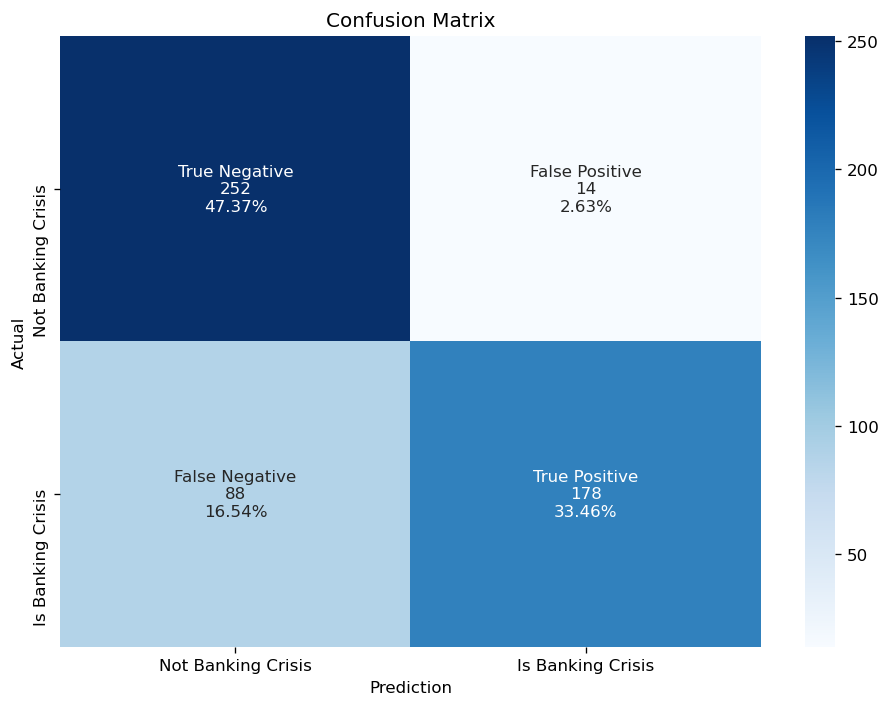

In [53]:
conf_matrix = confusion_matrix(y_test, model.predict(X_test))

group_names = ['True Negative', 'False Positive', 'False Negative', 'True Positive']
group_counts = ['{0:0.0f}'.format(value) for value in conf_matrix.flatten()]
group_percentages = ['{0:.2%}'.format(value) for value in conf_matrix.flatten() / np.sum(conf_matrix)]

labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(group_names, group_counts, group_percentages)]
labels = np.asarray(labels).reshape(2,2)

plt.style.use('default')

plt.figure(figsize=(8, 6), dpi=120)

sns.heatmap(
    conf_matrix,
    annot=labels,
    xticklabels=['Not Banking Crisis', 'Is Banking Crisis'],
    yticklabels=['Not Banking Crisis', 'Is Banking Crisis'],
    fmt='',
    cmap='Blues'
)

plt.xlabel('Prediction')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.tight_layout()
plt.savefig(f'model_{model_name}.png')

## Итоговый результат

In [54]:
results

,Model,Prediction Sample,AUC-ROC,AUC-PR,Accuracy,Precision,Recall,F1
0,LogisticRegression,Train,0.66730,0.69988,0.61371,0.59812,0.69314,0.64214
1,LogisticRegression,Test,0.65522,0.70756,0.55639,0.55639,0.55639,0.55639
0,SupportVectorMachine,Train,0.70830,0.73345,0.68520,0.70720,0.63211,0.66755
1,SupportVectorMachine,Test,0.68134,0.69446,0.68421,0.71304,0.61654,0.66129
0,DecisionTree,Train,0.99051,0.98895,0.96279,0.93344,0.99666,0.96401
1,DecisionTree,Test,0.78014,0.74630,0.77444,0.85784,0.65789,0.74468
0,RandomForest,Train,0.97909,0.97475,0.88650,0.94988,0.81605,0.87790
1,RandomForest,Test,0.84663,0.86467,0.75564,0.87363,0.59774,0.70982
0,GradientBoosting,Train,0.99051,0.98896,0.96279,0.93344,0.99666,0.96401
1,GradientBoosting,Test,0.81679,0.77489,0.66917,0.81690,0.43609,0.56863


In [55]:
results.to_excel('results.xlsx')